# Similarity investigations - what metric to use? 

In [2]:
import json
import pandas as pd
import numpy as np
from matplotlib import pyplot as plt
import seaborn as sns
import os
import math
import scipy
import random

from experiments.causal_trace import plot_trace_heatmap, plot_trace_heatmap_from_values, plot_normalized_trace_heatmap_from_values

Specify the paths to the file with the queries and GPT-2 XL predictions and to the folder with the causal tracing results for this model.

In [10]:
query_file = "/cephyr/users/lovhag/Alvis/projects/rome/data/P19_gpt2_xl_preds.jsonl"
results_folders = ["/mimer/NOBACKUP/groups/snic2021-23-309/project-data/rome/results/gpt2-xl/P19/causal_trace_pararel_1711765",
                   "/mimer/NOBACKUP/groups/snic2021-23-309/project-data/rome/results/gpt2-xl/P19/causal_trace_pararel_1815989"
                  ]

In [4]:
queries = pd.DataFrame()
with open(query_file) as f:
    for line in f:
        queries = queries.append(json.loads(line), ignore_index=True)
        
queries.head()

,attribute,candidate_p,candidate_prediction,candidate_rank,gold_p,gold_rank,known_id,prediction,prediction_p,prompt,relation_id,subject,template,top10_tokens,top10_tokens_probs
0,Alexandra,0.024580,London,2.0,0.000011,3197.0,0.0,New,0.038592,Allan Peiper was born in,P19,Allan Peiper,{} was born in,"[ New, the, London, 18, Toronto, Montreal...","[0.03859247639775276, 0.03803418204188347, 0.0..."
1,Alexandra,0.029013,Canada,2.0,0.000011,3354.0,1.0,the,0.077758,Allan Peiper is originally from,P19,Allan Peiper,{} is originally from,"[ New, the, London, 18, Toronto, Montreal...","[0.04142675921320915, 0.07775774598121643, 0.0..."
2,Alexandra,0.023173,Canada,2.0,0.000013,3389.0,2.0,the,0.079163,Allan Peiper was originally from,P19,Allan Peiper,{} was originally from,"[ New, the, London, 18, Toronto, Montreal...","[0.03634488210082054, 0.07916285842657089, 0.0..."
3,Alexandra,0.035623,Canada,2.0,0.000005,4780.0,3.0,the,0.154659,Allan Peiper is native to,P19,Allan Peiper,{} is native to,"[ New, the, London, 18, Toronto, Montreal...","[0.03823259472846985, 0.15465885400772095, 0.0..."
4,Alexandra,0.032304,Canada,1.0,0.000007,4640.0,4.0,the,0.132673,Allan Peiper was native to,P19,Allan Peiper,{} was native to,"[ New, the, London, 18, Toronto, Montreal...","[0.029023099690675735, 0.13267268240451813, 0...."


## Annotate (dis)similarity cases
Compare pairs of lama-sample patterns and annotate which one has most similar patterns.

In [5]:
def plot_trace_heatmap_for_token_ix(results, token_ix, only_subj, ax):
    results = dict(results)
    results["scores"] = results["scores"][:,:,token_ix]
    results["low_score"] = results["low_score"][token_ix]
    results["high_score"] = results["high_score"][token_ix]
    results["answer"] = queries.loc[sample_ix]["top10_tokens"][token_ix]
    
    if only_subj:
        results["scores"] = results["scores"][results["subject_range"][0]:results["subject_range"][1],:]
        results["input_tokens"] = results["input_tokens"][results["subject_range"][0]:results["subject_range"][1]]
        results["subject_range"] = np.array([0,len(results["input_tokens"])])
    plot_trace_heatmap(results, ax)
    
def plot_te_heatmap(results, token_ix, answer):
    te = (results["scores"][:,:,token_ix]-results["low_score"][token_ix])/abs(results["high_score"][token_ix]-results["low_score"][token_ix])
    window = results.get("window", 10)
    kind = str(results["kind"])
    labels = list(results["input_tokens"])
    for i in range(*results["subject_range"]):
        labels[i] = labels[i] + "*"
    bartitle = f"(p**-p*)/(p-p*)"
    plot_normalized_trace_heatmap_from_values(te, te.min(), te.max(), bartitle, kind, window, labels,
                                   savepdf=False, title=f"Impact of restoring MLP for output '{answer.strip()}'", xlabel=None, modelname=None)
    
def plot_trace_heatmap_from_values(differences, low_score, high_score, answer, kind, window, labels, ax,
                                   savepdf, title, xlabel, modelname):
    with plt.rc_context():
        #fig, ax = plt.subplots(figsize=(3.5, 2), dpi=200)
        h = ax.pcolor(
            differences,
            cmap={None: "Purples", "None": "Purples", "mlp": "Greens", "attn": "Reds"}[
                kind
            ],
            vmin=low_score,
            vmax=high_score
        )
        ax.invert_yaxis()
        ax.set_yticks([0.5 + i for i in range(len(differences))])
        ax.set_xticks([0.5 + i for i in range(0, differences.shape[1] - 6, 5)])
        ax.set_xticklabels(list(range(0, differences.shape[1] - 6, 5)))
        ax.set_yticklabels(labels, fontsize=8)
        cb = plt.colorbar(h, ax=ax)
        cb.ax.tick_params(labelsize=8)
        if title is not None:
            ax.set_title(title)
        if xlabel is not None:
            ax.set_xlabel(xlabel)
        elif answer is not None:
            # The following should be cb.ax.set_xlabel, but this is broken in matplotlib 3.5.1.
            cb.ax.set_title(f"p({str(answer).strip()})", y=-0.16, fontsize=8)
        if savepdf:
            os.makedirs(os.path.dirname(savepdf), exist_ok=True)
            plt.savefig(savepdf, bbox_inches="tight")
            plt.close()
        #else:
        #    plt.show()
            
def plot_trace_heatmap(result, ax, savepdf=None, title=None, xlabel=None, modelname=None):
    differences = result["scores"]
    low_score = result["low_score"]
    high_score = None #result["high_score"]
    answer = result["answer"]
    kind = (
        None
        if (not result["kind"] or result["kind"] == "None")
        else str(result["kind"])
    )
    window = result.get("window", 10)
    labels = list(result["input_tokens"])
    for i in range(*result["subject_range"]):
        labels[i] = labels[i] + "*"

    plot_trace_heatmap_from_values(differences, low_score, high_score, answer, kind, window, labels, ax,
                                   savepdf, title, xlabel, modelname)

Choose where to save the annotations

In [6]:
data_file = "/cephyr/users/lovhag/Alvis/projects/rome/data/similarity/P19_annotated_LH.csv"

Either read existing annotations or start on a new file.

In [5]:
annotated_data = pd.read_csv(data_file)

In [7]:
annotated_data = pd.DataFrame()

In [13]:
results_folders[0]

'/mimer/NOBACKUP/groups/snic2021-23-309/project-data/rome/results/gpt2-xl/P19/causal_trace_pararel_1711765'

SAMPLE 0 out of 100
--------------------------------------------------------------------------
Example 1 (top any token) 'B oris  Karl off  is  originally  from'
--------------------------------------------------------------------------


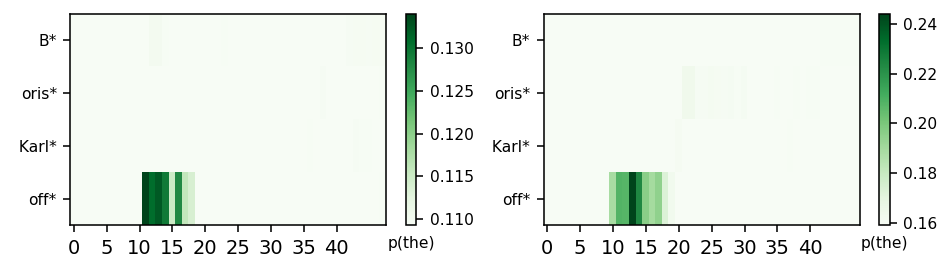

--------------------------------------------------------------------------
Example 2 (top any token) 'B oris  Karl off  is  native  to'
--------------------------------------------------------------------------


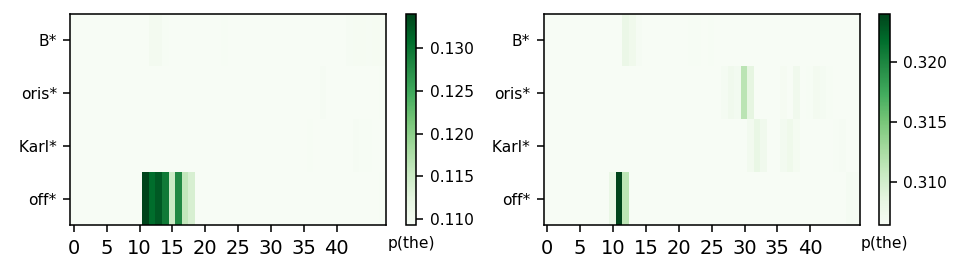

Which pair of patterns is most similar? Example 1 or 2?
If both are equally simlar, write '3'. If none are remotely similar, write '0'.
1
--------------------------------------------------------------------------
Example 1 (top candidate token) 'B oris  Karl off  is  originally  from'
--------------------------------------------------------------------------


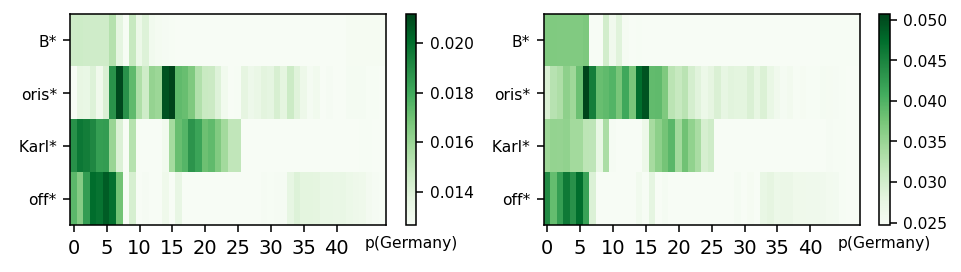

--------------------------------------------------------------------------
Example 2 (top candidate token) 'B oris  Karl off  is  native  to'
--------------------------------------------------------------------------


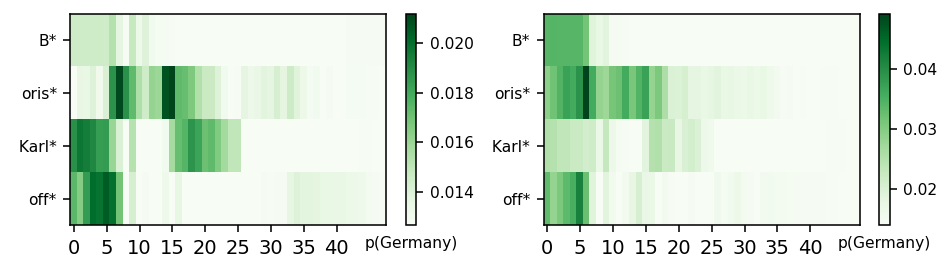

Which pair of patterns is most similar? Example 1 or 2?
If both are equally simlar, write '3'. If none are remotely similar, write '0'.
1
SAMPLE 1 out of 100
--------------------------------------------------------------------------
Example 1 (top any token) 'B ai  Guang  is  originally  from'
--------------------------------------------------------------------------


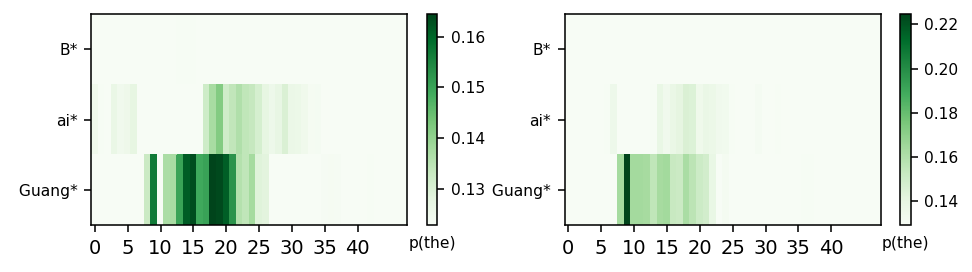

--------------------------------------------------------------------------
Example 2 (top any token) 'B ai  Guang  was  native  to'
--------------------------------------------------------------------------


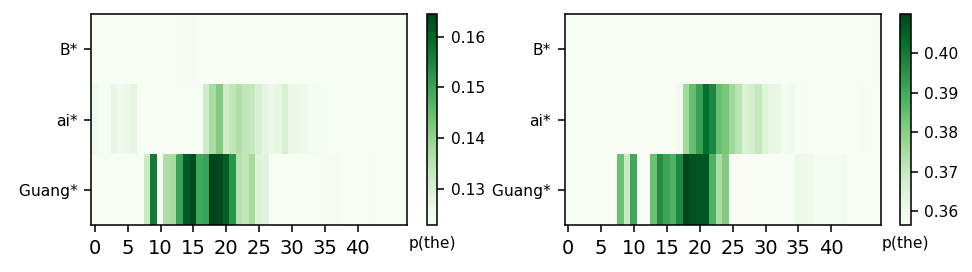

Which pair of patterns is most similar? Example 1 or 2?
If both are equally simlar, write '3'. If none are remotely similar, write '0'.
2
--------------------------------------------------------------------------
Example 1 (top candidate token) 'B ai  Guang  is  originally  from'
--------------------------------------------------------------------------


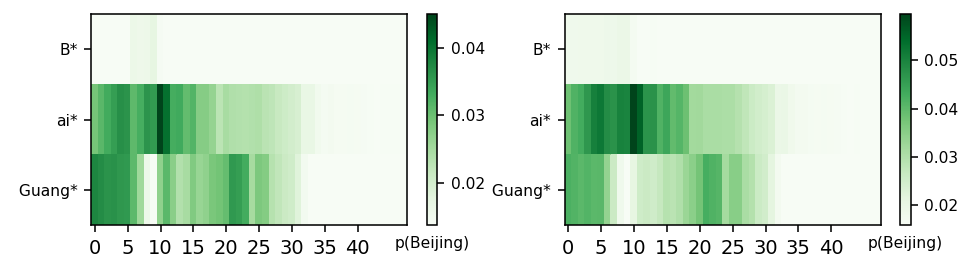

--------------------------------------------------------------------------
Example 2 (top candidate token) 'B ai  Guang  was  native  to'
--------------------------------------------------------------------------


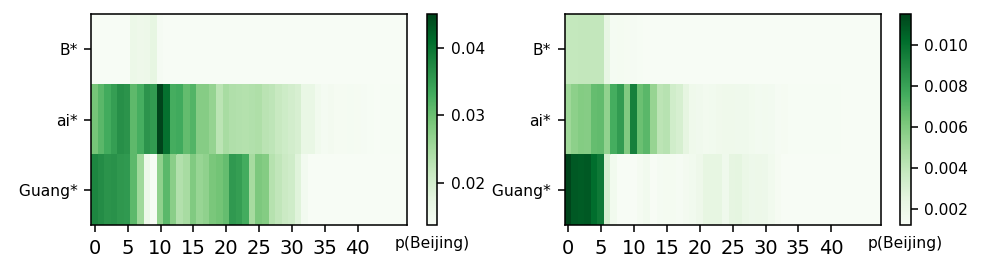

Which pair of patterns is most similar? Example 1 or 2?
If both are equally simlar, write '3'. If none are remotely similar, write '0'.
1
SAMPLE 2 out of 100
--------------------------------------------------------------------------
Example 1 (top any token) 'V incent  Pers iche tti  was  originally  from'
--------------------------------------------------------------------------


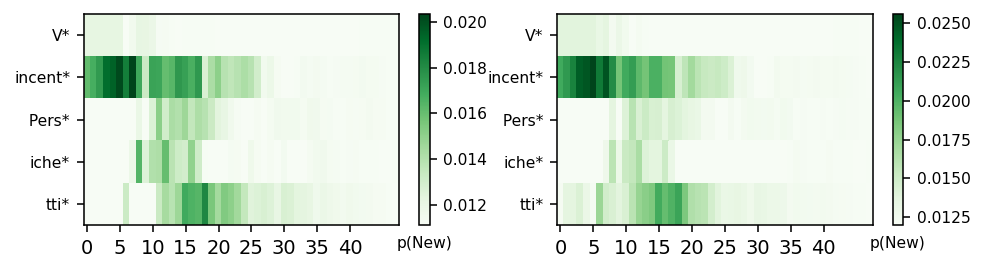

--------------------------------------------------------------------------
Example 2 (top any token) 'V incent  Pers iche tti  originated  from'
--------------------------------------------------------------------------


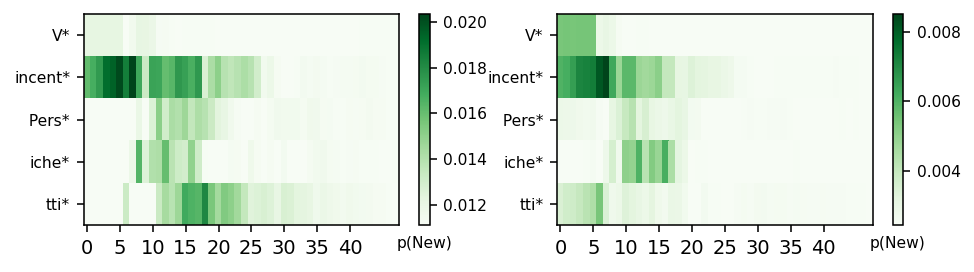

Which pair of patterns is most similar? Example 1 or 2?
If both are equally simlar, write '3'. If none are remotely similar, write '0'.
1
--------------------------------------------------------------------------
Example 1 (top candidate token) 'V incent  Pers iche tti  was  originally  from'
--------------------------------------------------------------------------


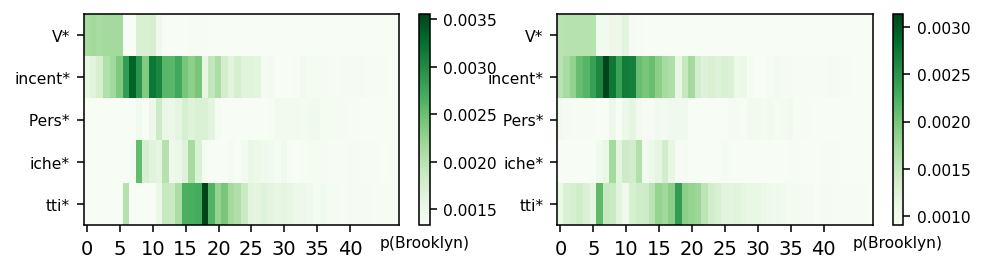

--------------------------------------------------------------------------
Example 2 (top candidate token) 'V incent  Pers iche tti  originated  from'
--------------------------------------------------------------------------


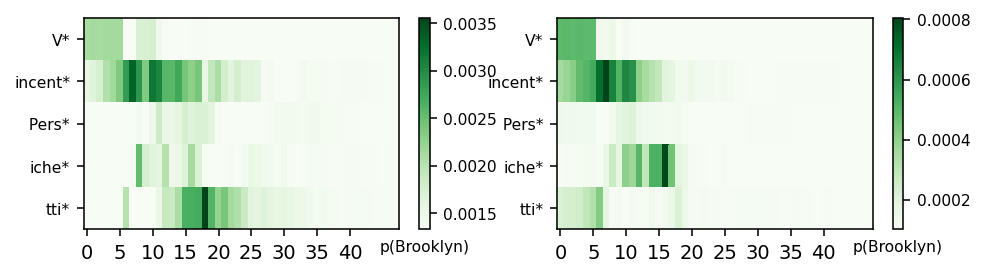

Which pair of patterns is most similar? Example 1 or 2?
If both are equally simlar, write '3'. If none are remotely similar, write '0'.
1
SAMPLE 3 out of 100
--------------------------------------------------------------------------
Example 1 (top any token) 'John  W ens ink  was  native  to'
--------------------------------------------------------------------------


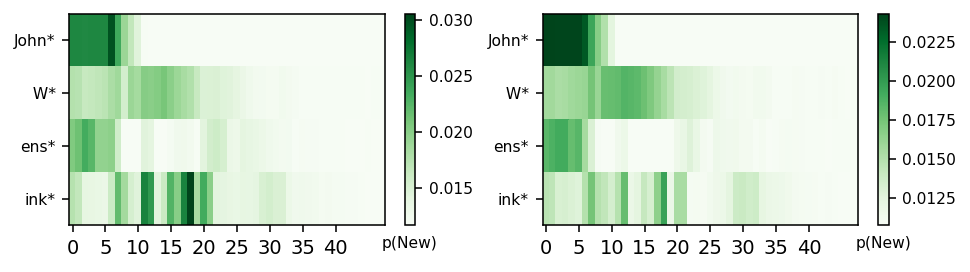

--------------------------------------------------------------------------
Example 2 (top any token) 'John  W ens ink  originated  from'
--------------------------------------------------------------------------


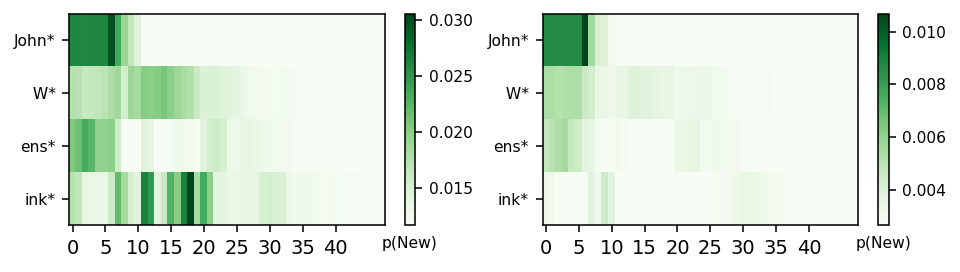

Which pair of patterns is most similar? Example 1 or 2?
If both are equally simlar, write '3'. If none are remotely similar, write '0'.
1
--------------------------------------------------------------------------
Example 1 (top candidate token) 'John  W ens ink  was  native  to'
--------------------------------------------------------------------------


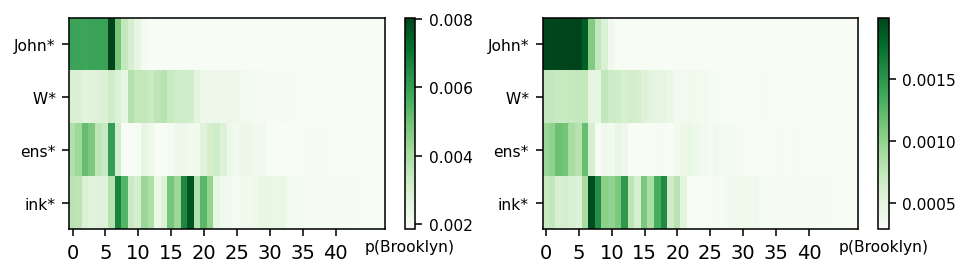

--------------------------------------------------------------------------
Example 2 (top candidate token) 'John  W ens ink  originated  from'
--------------------------------------------------------------------------


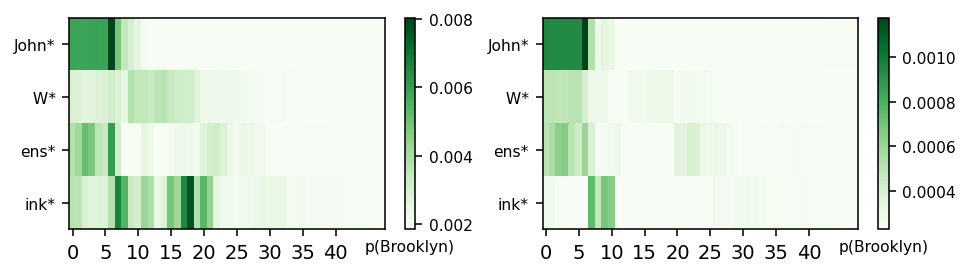

Which pair of patterns is most similar? Example 1 or 2?
If both are equally simlar, write '3'. If none are remotely similar, write '0'.
1
SAMPLE 4 out of 100
--------------------------------------------------------------------------
Example 1 (top any token) 'Jake  Pavel ka  was  native  to'
--------------------------------------------------------------------------


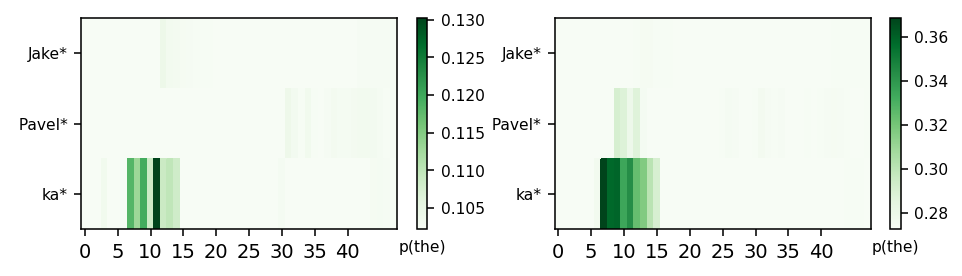

--------------------------------------------------------------------------
Example 2 (top any token) 'Jake  Pavel ka  is  native  to'
--------------------------------------------------------------------------


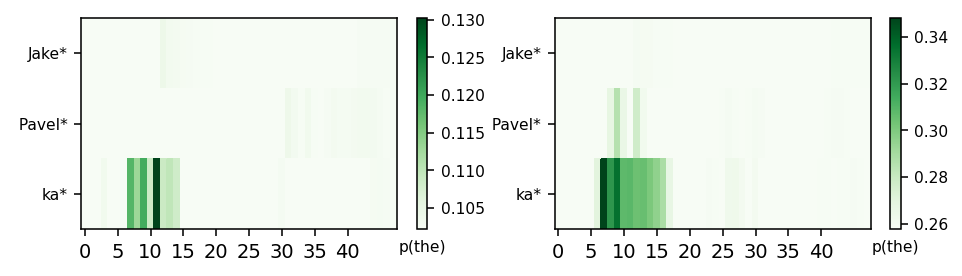

Which pair of patterns is most similar? Example 1 or 2?
If both are equally simlar, write '3'. If none are remotely similar, write '0'.
1
--------------------------------------------------------------------------
Example 1 (top candidate token) 'Jake  Pavel ka  was  native  to'
--------------------------------------------------------------------------


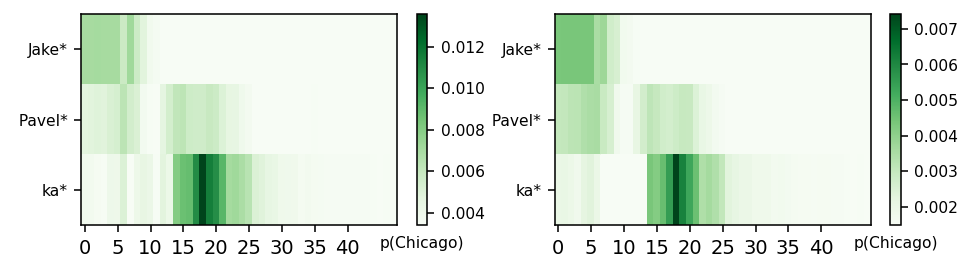

--------------------------------------------------------------------------
Example 2 (top candidate token) 'Jake  Pavel ka  is  native  to'
--------------------------------------------------------------------------


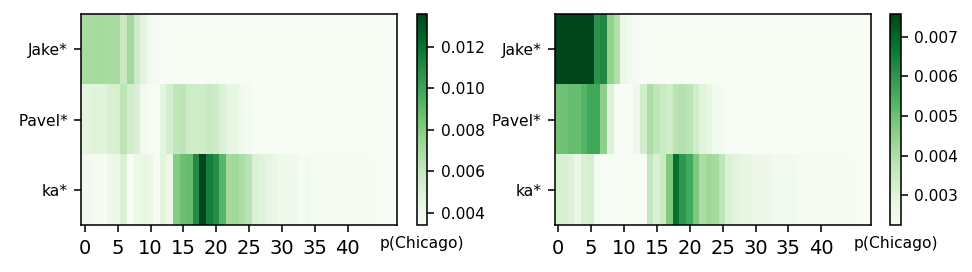

Which pair of patterns is most similar? Example 1 or 2?
If both are equally simlar, write '3'. If none are remotely similar, write '0'.
1
SAMPLE 5 out of 100
--------------------------------------------------------------------------
Example 1 (top any token) 'Sa om  V ans od any  origin ates  from'
--------------------------------------------------------------------------


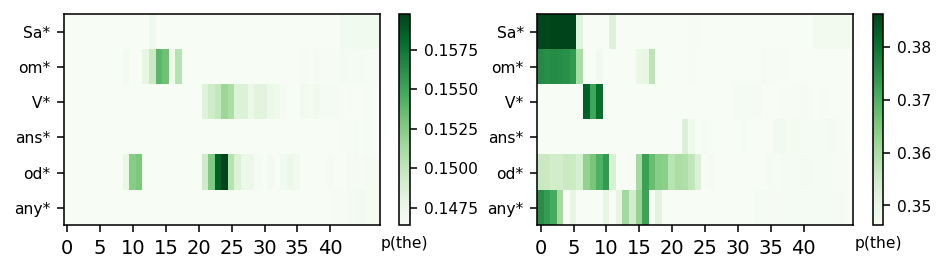

--------------------------------------------------------------------------
Example 2 (top any token) 'Sa om  V ans od any  is  native  to'
--------------------------------------------------------------------------


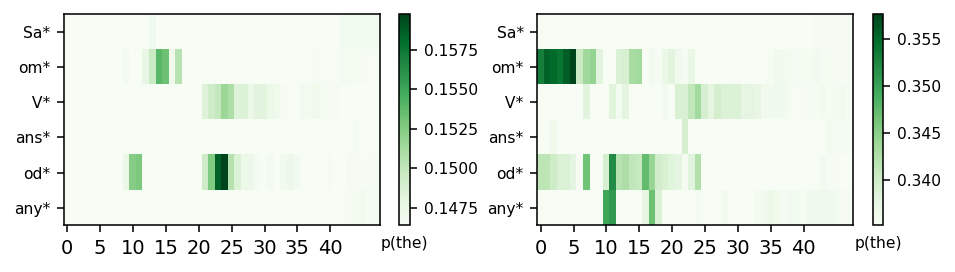

Which pair of patterns is most similar? Example 1 or 2?
If both are equally simlar, write '3'. If none are remotely similar, write '0'.
2
--------------------------------------------------------------------------
Example 1 (top candidate token) 'Sa om  V ans od any  origin ates  from'
--------------------------------------------------------------------------


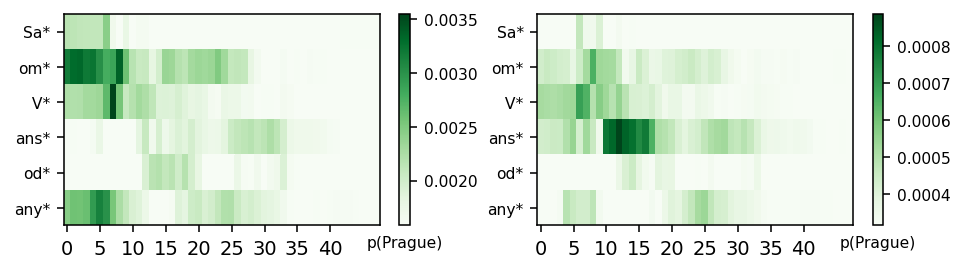

--------------------------------------------------------------------------
Example 2 (top candidate token) 'Sa om  V ans od any  is  native  to'
--------------------------------------------------------------------------


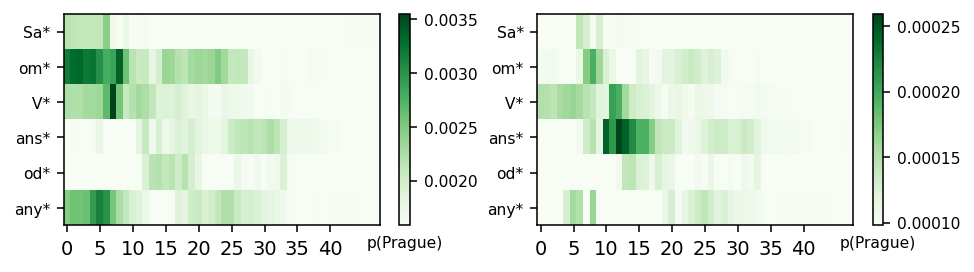

Which pair of patterns is most similar? Example 1 or 2?
If both are equally simlar, write '3'. If none are remotely similar, write '0'.
0
SAMPLE 6 out of 100
--------------------------------------------------------------------------
Example 1 (top any token) 'Jake  Burns  originated  from'
--------------------------------------------------------------------------


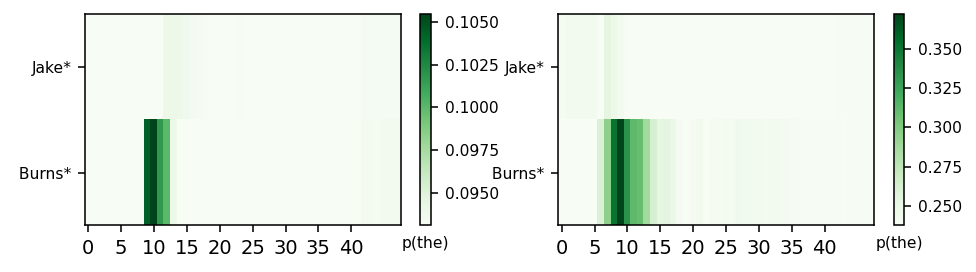

--------------------------------------------------------------------------
Example 2 (top any token) 'Jake  Burns  was  originally  from'
--------------------------------------------------------------------------


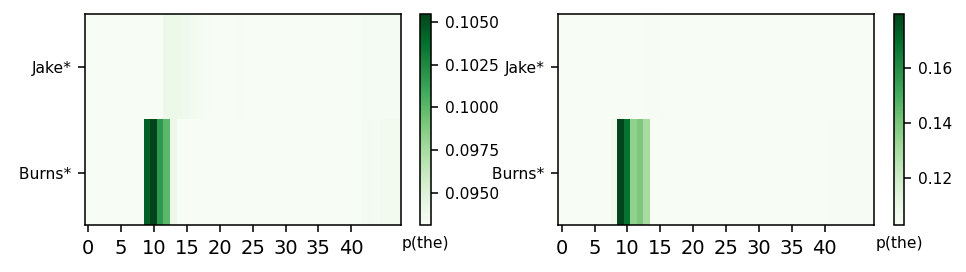

Which pair of patterns is most similar? Example 1 or 2?
If both are equally simlar, write '3'. If none are remotely similar, write '0'.
2
--------------------------------------------------------------------------
Example 1 (top candidate token) 'Jake  Burns  originated  from'
--------------------------------------------------------------------------


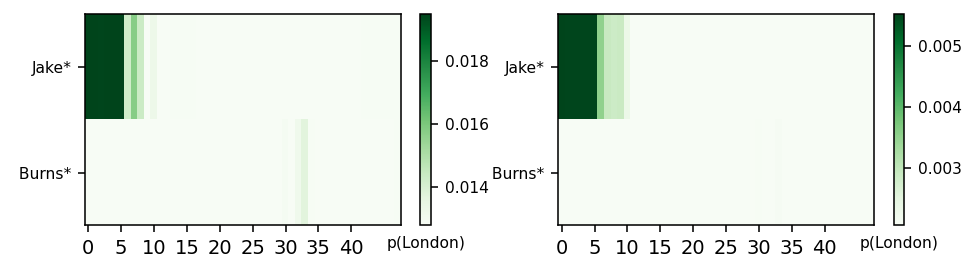

--------------------------------------------------------------------------
Example 2 (top candidate token) 'Jake  Burns  was  originally  from'
--------------------------------------------------------------------------


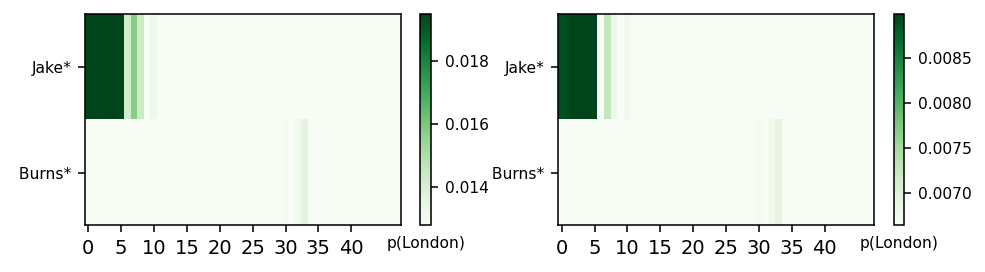

Which pair of patterns is most similar? Example 1 or 2?
If both are equally simlar, write '3'. If none are remotely similar, write '0'.
3
SAMPLE 7 out of 100
--------------------------------------------------------------------------
Example 1 (top any token) 'Pierre  Dup ont  is  native  to'
--------------------------------------------------------------------------


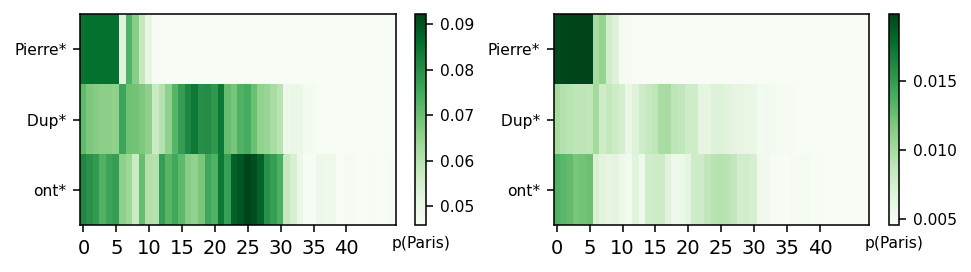

--------------------------------------------------------------------------
Example 2 (top any token) 'Pierre  Dup ont  was  native  to'
--------------------------------------------------------------------------


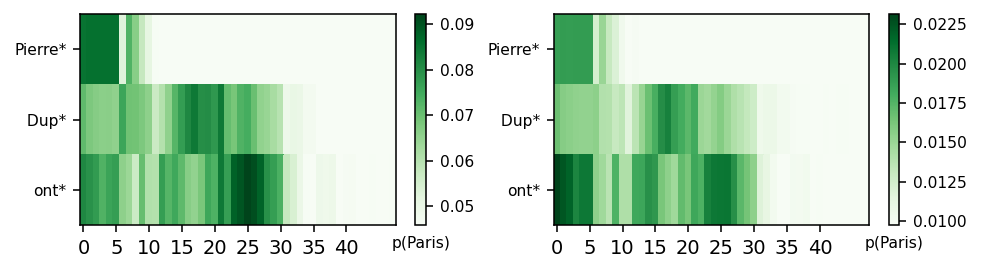

Which pair of patterns is most similar? Example 1 or 2?
If both are equally simlar, write '3'. If none are remotely similar, write '0'.
2
--------------------------------------------------------------------------
Example 1 (top candidate token) 'Pierre  Dup ont  is  native  to'
--------------------------------------------------------------------------


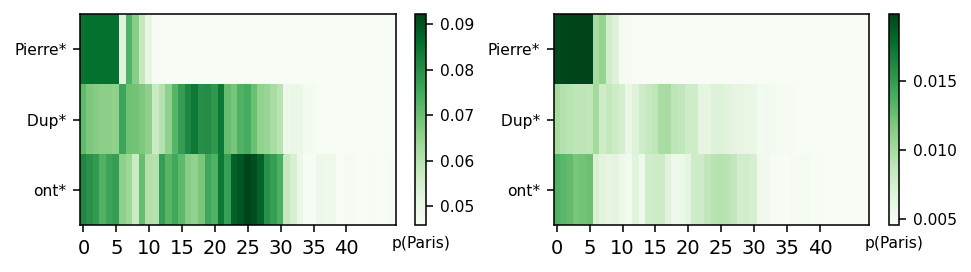

--------------------------------------------------------------------------
Example 2 (top candidate token) 'Pierre  Dup ont  was  native  to'
--------------------------------------------------------------------------


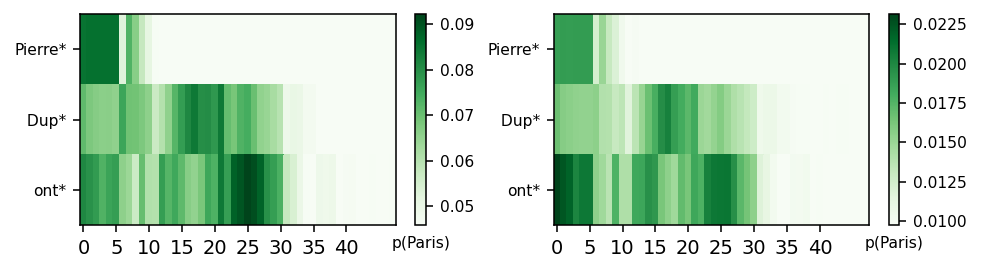

Which pair of patterns is most similar? Example 1 or 2?
If both are equally simlar, write '3'. If none are remotely similar, write '0'.
2
SAMPLE 8 out of 100
--------------------------------------------------------------------------
Example 1 (top any token) 'Stephen  Re a  was  originally  from'
--------------------------------------------------------------------------


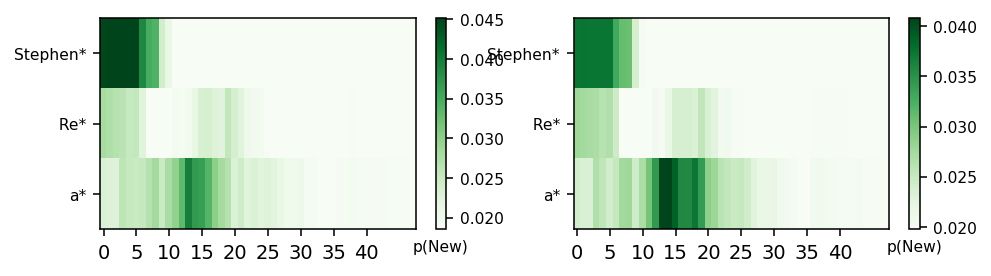

--------------------------------------------------------------------------
Example 2 (top any token) 'Stephen  Re a  is  originally  from'
--------------------------------------------------------------------------


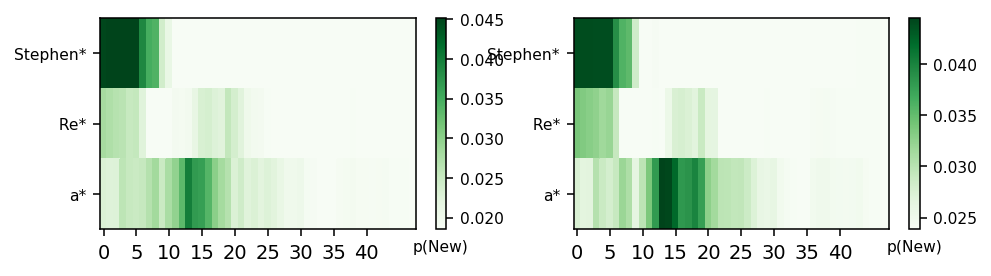

Which pair of patterns is most similar? Example 1 or 2?
If both are equally simlar, write '3'. If none are remotely similar, write '0'.
2
--------------------------------------------------------------------------
Example 1 (top candidate token) 'Stephen  Re a  was  originally  from'
--------------------------------------------------------------------------


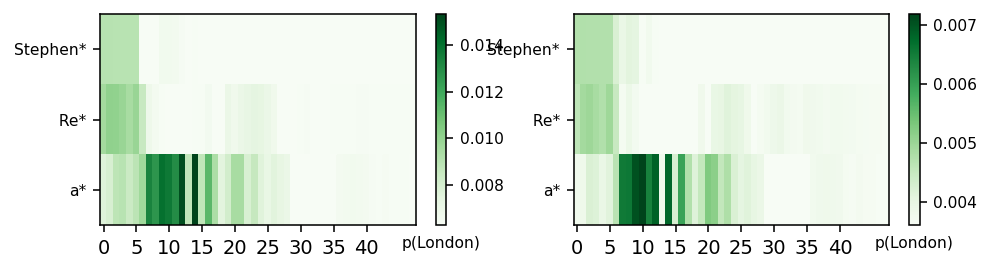

--------------------------------------------------------------------------
Example 2 (top candidate token) 'Stephen  Re a  is  originally  from'
--------------------------------------------------------------------------


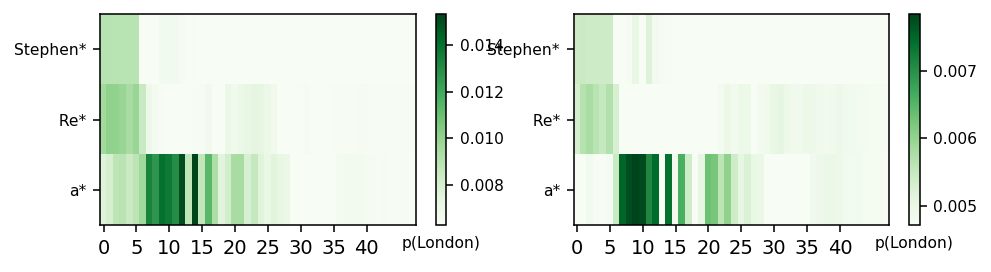

Which pair of patterns is most similar? Example 1 or 2?
If both are equally simlar, write '3'. If none are remotely similar, write '0'.
3
SAMPLE 9 out of 100
--------------------------------------------------------------------------
Example 1 (top any token) 'O let a  Adams  was  originally  from'
--------------------------------------------------------------------------


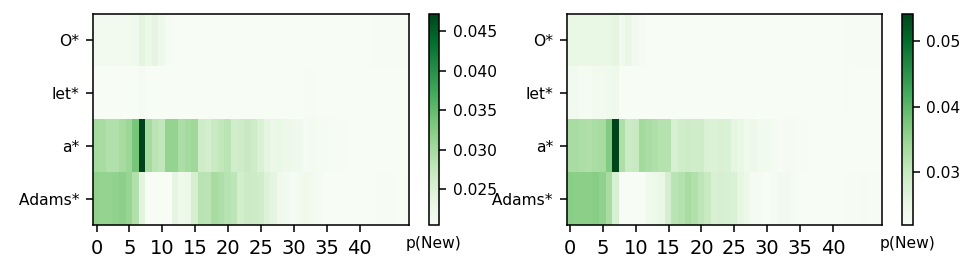

--------------------------------------------------------------------------
Example 2 (top any token) 'O let a  Adams  is  originally  from'
--------------------------------------------------------------------------


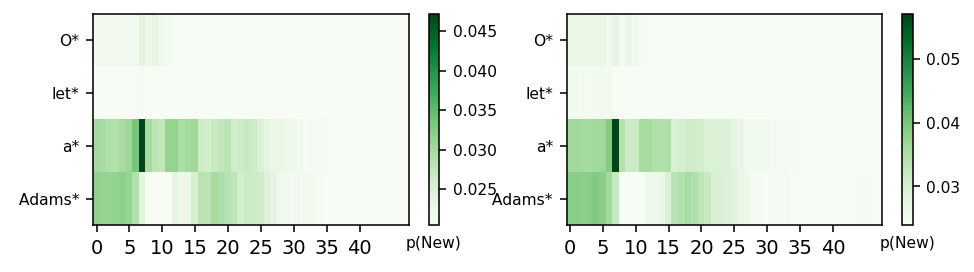

Which pair of patterns is most similar? Example 1 or 2?
If both are equally simlar, write '3'. If none are remotely similar, write '0'.
3
--------------------------------------------------------------------------
Example 1 (top candidate token) 'O let a  Adams  was  originally  from'
--------------------------------------------------------------------------


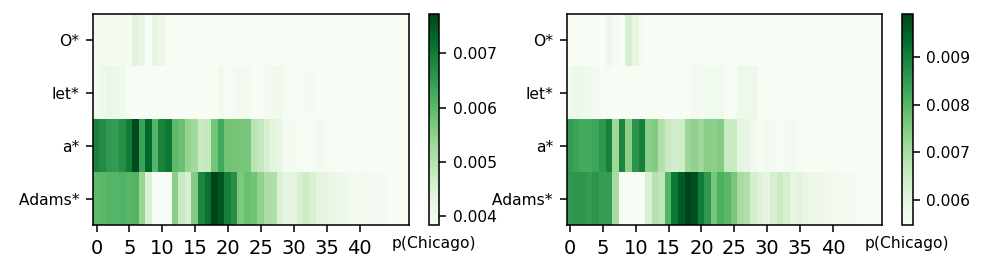

--------------------------------------------------------------------------
Example 2 (top candidate token) 'O let a  Adams  is  originally  from'
--------------------------------------------------------------------------


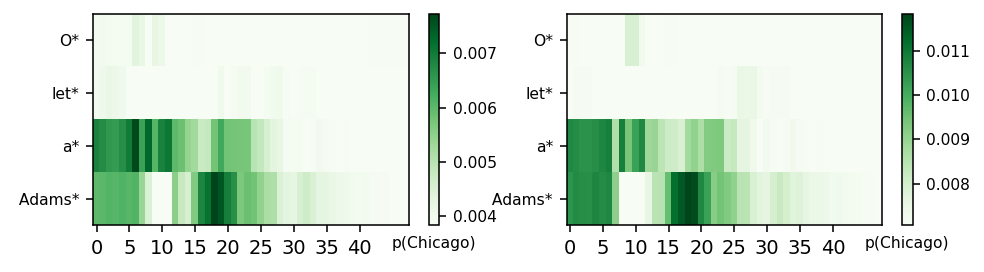

Which pair of patterns is most similar? Example 1 or 2?
If both are equally simlar, write '3'. If none are remotely similar, write '0'.
3
SAMPLE 10 out of 100
--------------------------------------------------------------------------
Example 1 (top any token) 'L aur ie  Morgan  origin ates  from'
--------------------------------------------------------------------------


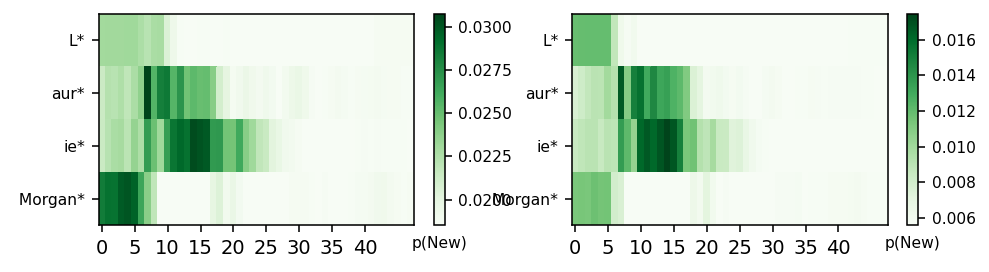

--------------------------------------------------------------------------
Example 2 (top any token) 'L aur ie  Morgan  was  native  to'
--------------------------------------------------------------------------


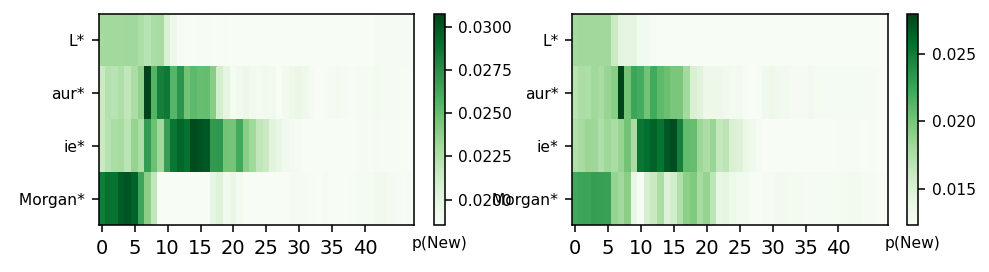

Which pair of patterns is most similar? Example 1 or 2?
If both are equally simlar, write '3'. If none are remotely similar, write '0'.
2
--------------------------------------------------------------------------
Example 1 (top candidate token) 'L aur ie  Morgan  origin ates  from'
--------------------------------------------------------------------------


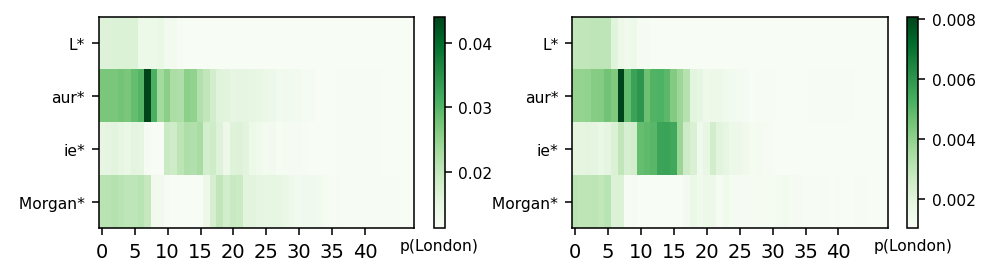

--------------------------------------------------------------------------
Example 2 (top candidate token) 'L aur ie  Morgan  was  native  to'
--------------------------------------------------------------------------


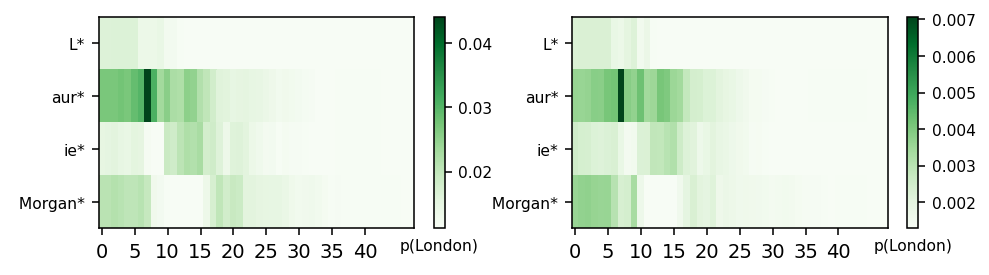

Which pair of patterns is most similar? Example 1 or 2?
If both are equally simlar, write '3'. If none are remotely similar, write '0'.
2
SAMPLE 11 out of 100
--------------------------------------------------------------------------
Example 1 (top any token) 'J us  Allah  is  originally  from'
--------------------------------------------------------------------------


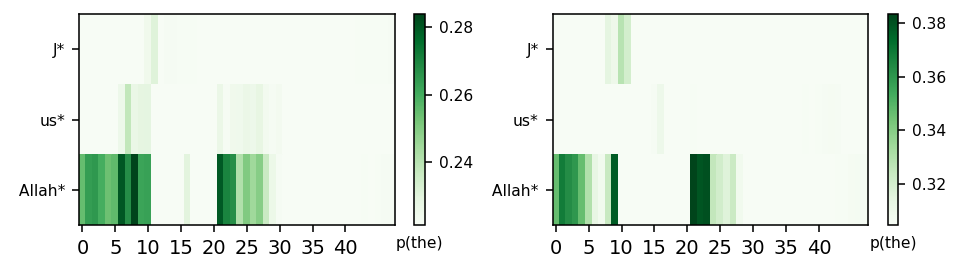

--------------------------------------------------------------------------
Example 2 (top any token) 'J us  Allah  origin ates  from'
--------------------------------------------------------------------------


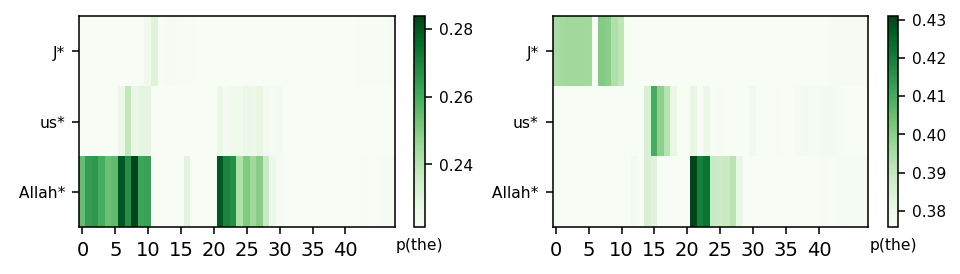

Which pair of patterns is most similar? Example 1 or 2?
If both are equally simlar, write '3'. If none are remotely similar, write '0'.
1
--------------------------------------------------------------------------
Example 1 (top candidate token) 'J us  Allah  is  originally  from'
--------------------------------------------------------------------------


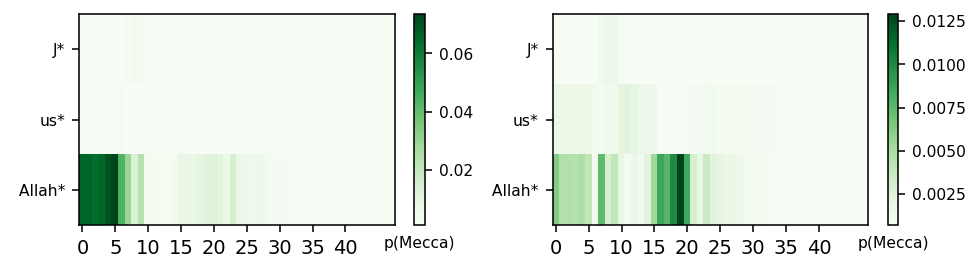

--------------------------------------------------------------------------
Example 2 (top candidate token) 'J us  Allah  origin ates  from'
--------------------------------------------------------------------------


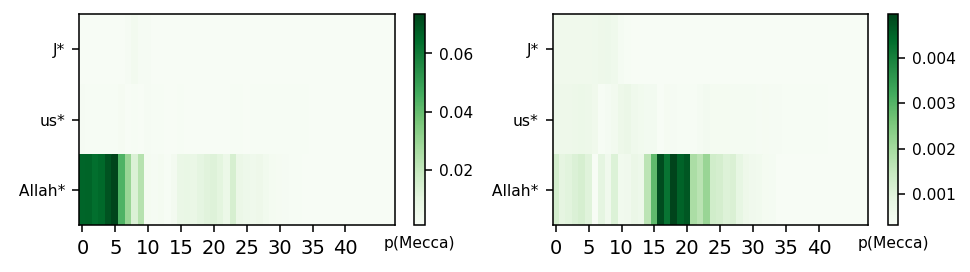

Which pair of patterns is most similar? Example 1 or 2?
If both are equally simlar, write '3'. If none are remotely similar, write '0'.
1
SAMPLE 12 out of 100
--------------------------------------------------------------------------
Example 1 (top any token) 'C lement  Mart yn  D oke  origin ates  from'
--------------------------------------------------------------------------


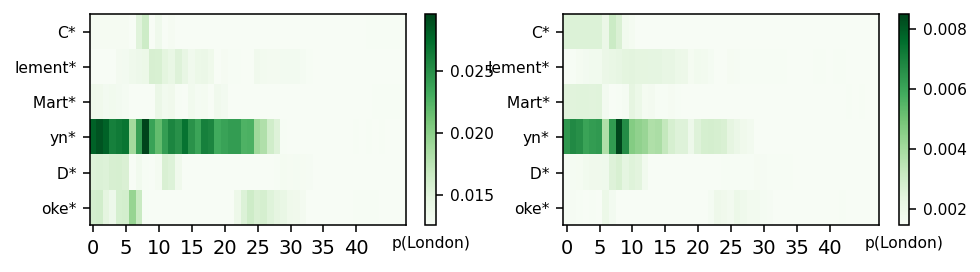

--------------------------------------------------------------------------
Example 2 (top any token) 'C lement  Mart yn  D oke  is  originally  from'
--------------------------------------------------------------------------


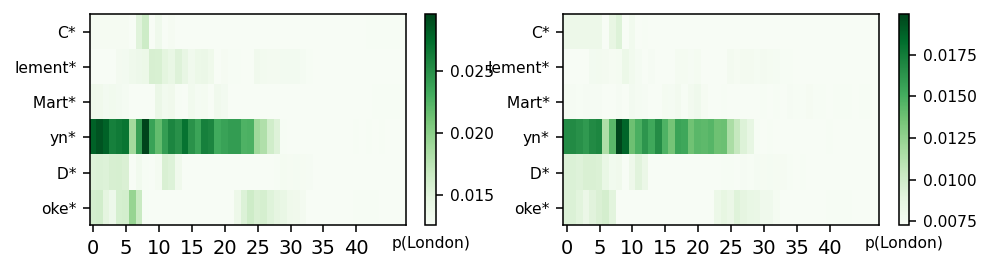

Which pair of patterns is most similar? Example 1 or 2?
If both are equally simlar, write '3'. If none are remotely similar, write '0'.
2
--------------------------------------------------------------------------
Example 1 (top candidate token) 'C lement  Mart yn  D oke  origin ates  from'
--------------------------------------------------------------------------


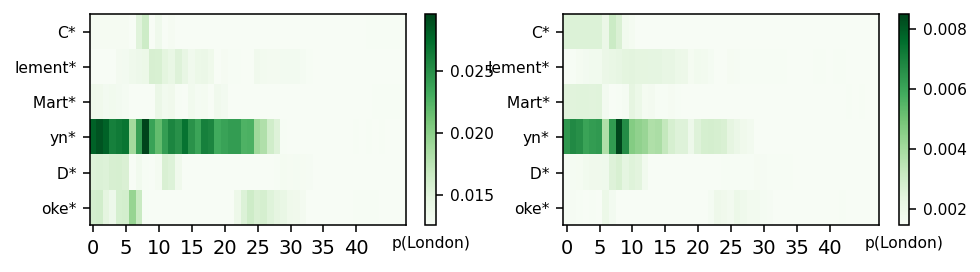

--------------------------------------------------------------------------
Example 2 (top candidate token) 'C lement  Mart yn  D oke  is  originally  from'
--------------------------------------------------------------------------


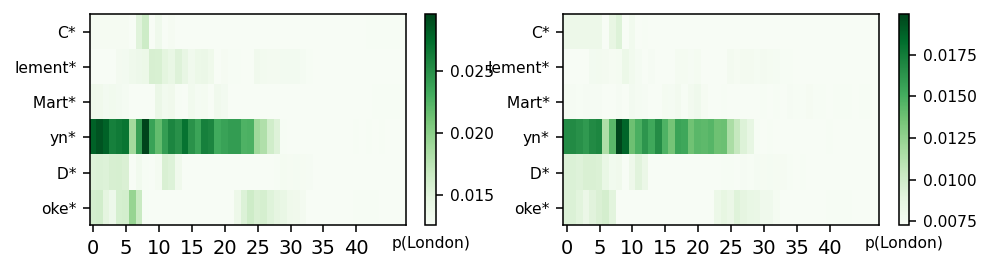

Which pair of patterns is most similar? Example 1 or 2?
If both are equally simlar, write '3'. If none are remotely similar, write '0'.
2
SAMPLE 13 out of 100
--------------------------------------------------------------------------
Example 1 (top any token) 'A ino  S ibel ius  was  native  to'
--------------------------------------------------------------------------


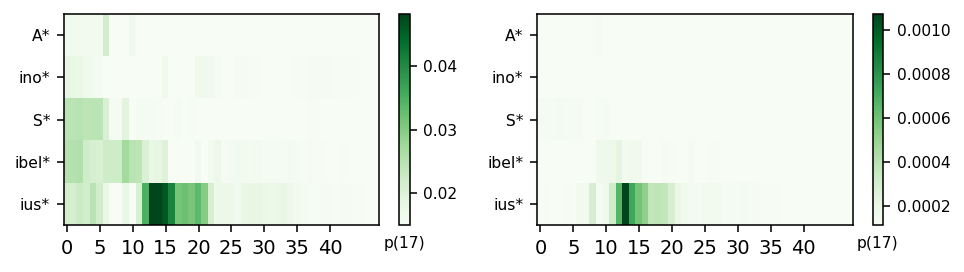

--------------------------------------------------------------------------
Example 2 (top any token) 'A ino  S ibel ius  was  originally  from'
--------------------------------------------------------------------------


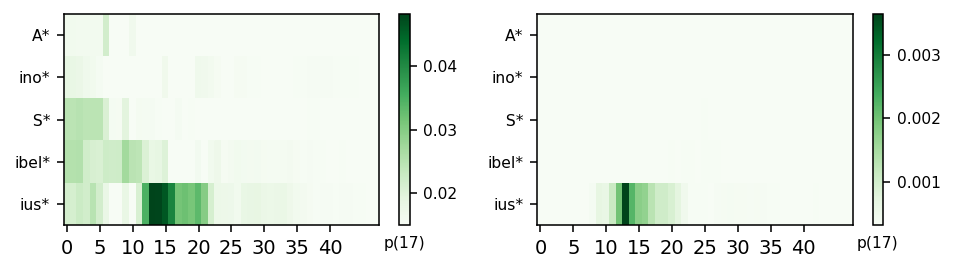

Which pair of patterns is most similar? Example 1 or 2?
If both are equally simlar, write '3'. If none are remotely similar, write '0'.
3
--------------------------------------------------------------------------
Example 1 (top candidate token) 'A ino  S ibel ius  was  native  to'
--------------------------------------------------------------------------


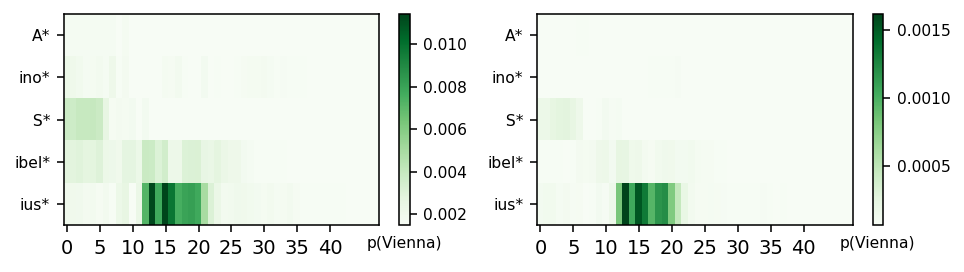

--------------------------------------------------------------------------
Example 2 (top candidate token) 'A ino  S ibel ius  was  originally  from'
--------------------------------------------------------------------------


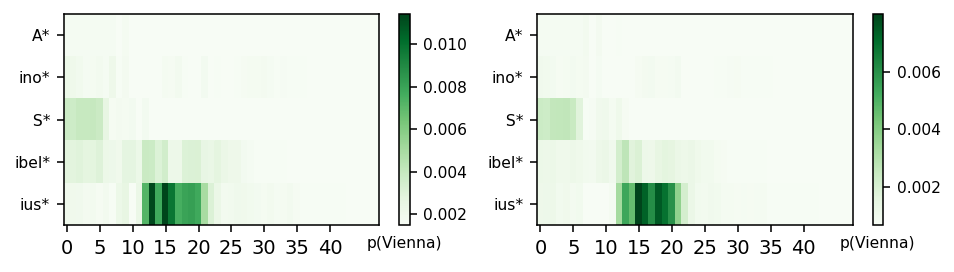

Which pair of patterns is most similar? Example 1 or 2?
If both are equally simlar, write '3'. If none are remotely similar, write '0'.
3
SAMPLE 14 out of 100
--------------------------------------------------------------------------
Example 1 (top any token) 'T rey  Te ague  was  originally  from'
--------------------------------------------------------------------------


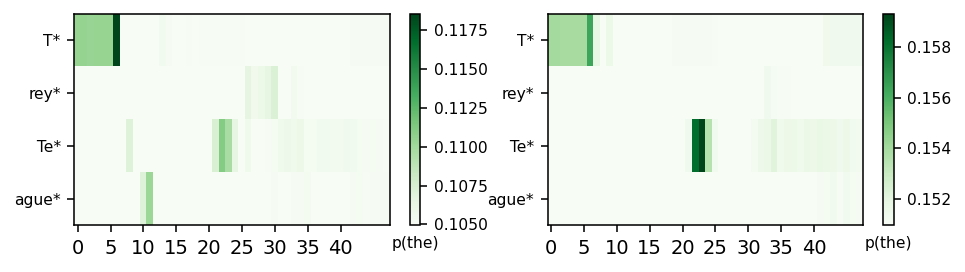

--------------------------------------------------------------------------
Example 2 (top any token) 'T rey  Te ague  is  originally  from'
--------------------------------------------------------------------------


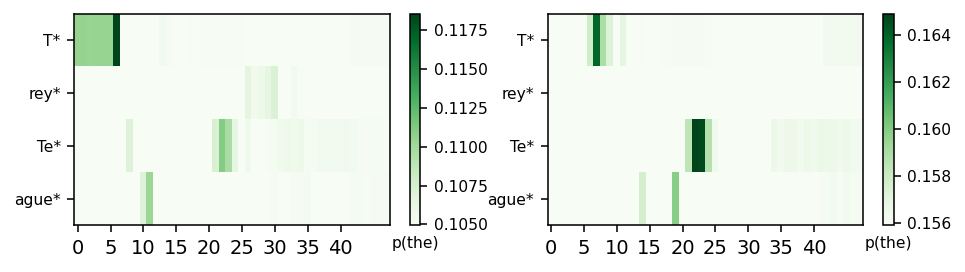

Which pair of patterns is most similar? Example 1 or 2?
If both are equally simlar, write '3'. If none are remotely similar, write '0'.
1
--------------------------------------------------------------------------
Example 1 (top candidate token) 'T rey  Te ague  was  originally  from'
--------------------------------------------------------------------------


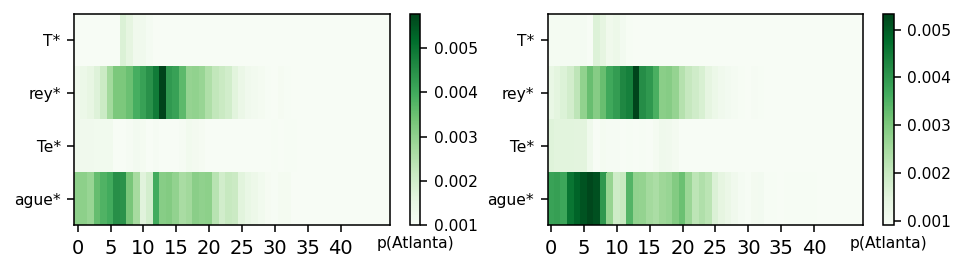

--------------------------------------------------------------------------
Example 2 (top candidate token) 'T rey  Te ague  is  originally  from'
--------------------------------------------------------------------------


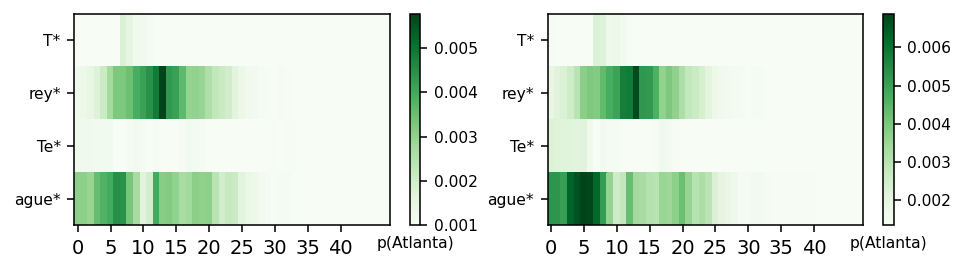

Which pair of patterns is most similar? Example 1 or 2?
If both are equally simlar, write '3'. If none are remotely similar, write '0'.
3
SAMPLE 15 out of 100
--------------------------------------------------------------------------
Example 1 (top any token) 'G illes  D uce ppe  was  originally  from'
--------------------------------------------------------------------------


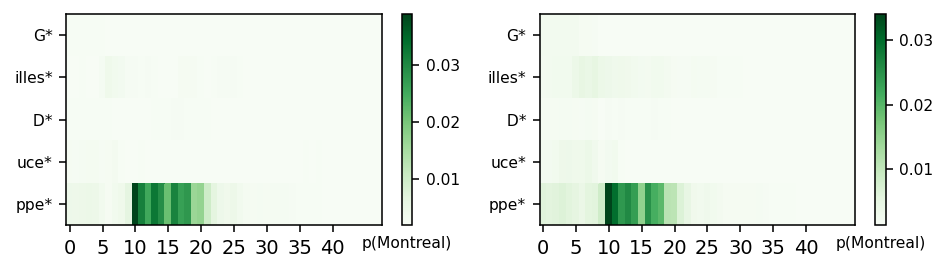

--------------------------------------------------------------------------
Example 2 (top any token) 'G illes  D uce ppe  is  originally  from'
--------------------------------------------------------------------------


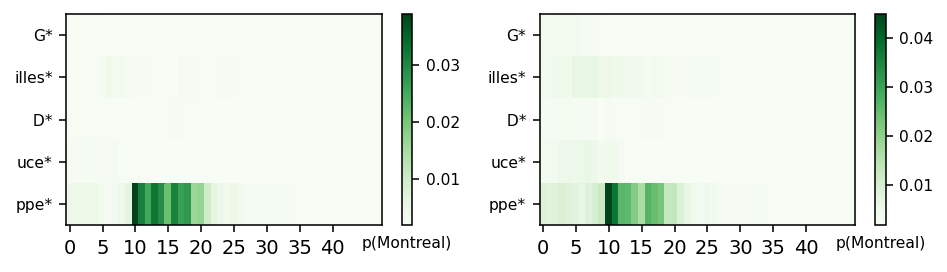

Which pair of patterns is most similar? Example 1 or 2?
If both are equally simlar, write '3'. If none are remotely similar, write '0'.
3
--------------------------------------------------------------------------
Example 1 (top candidate token) 'G illes  D uce ppe  was  originally  from'
--------------------------------------------------------------------------


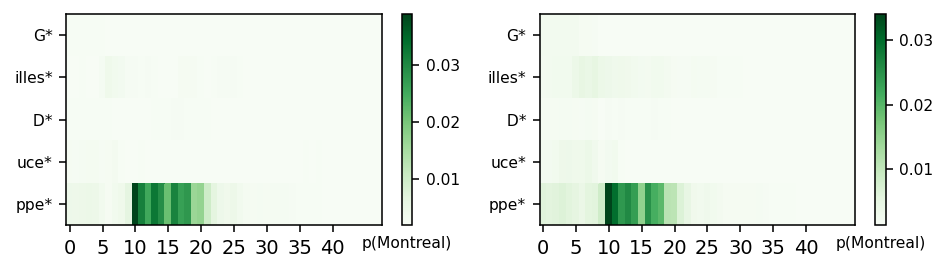

--------------------------------------------------------------------------
Example 2 (top candidate token) 'G illes  D uce ppe  is  originally  from'
--------------------------------------------------------------------------


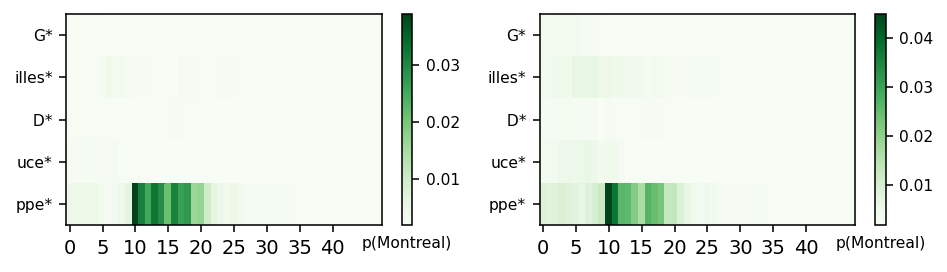

Which pair of patterns is most similar? Example 1 or 2?
If both are equally simlar, write '3'. If none are remotely similar, write '0'.
3
SAMPLE 16 out of 100
--------------------------------------------------------------------------
Example 1 (top any token) 'B il al  ibn  Rib ah  was  originally  from'
--------------------------------------------------------------------------


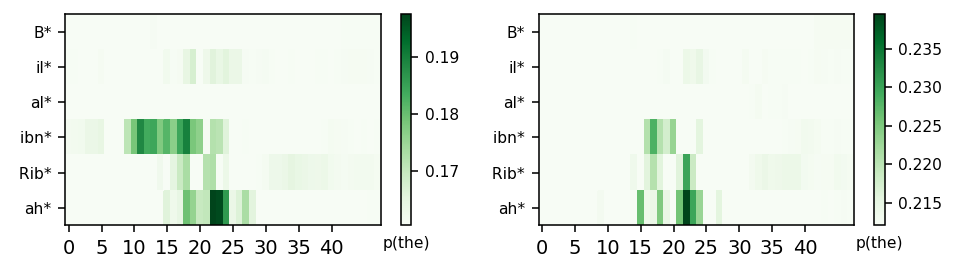

--------------------------------------------------------------------------
Example 2 (top any token) 'B il al  ibn  Rib ah  is  native  to'
--------------------------------------------------------------------------


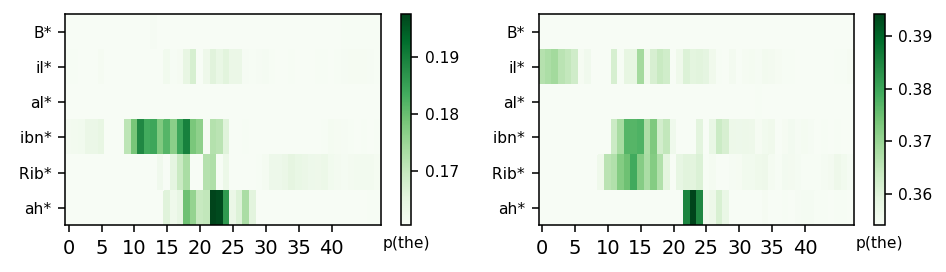

Which pair of patterns is most similar? Example 1 or 2?
If both are equally simlar, write '3'. If none are remotely similar, write '0'.
1
--------------------------------------------------------------------------
Example 1 (top candidate token) 'B il al  ibn  Rib ah  was  originally  from'
--------------------------------------------------------------------------


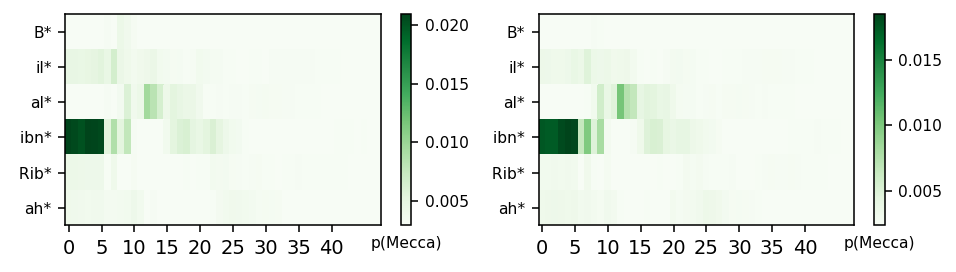

--------------------------------------------------------------------------
Example 2 (top candidate token) 'B il al  ibn  Rib ah  is  native  to'
--------------------------------------------------------------------------


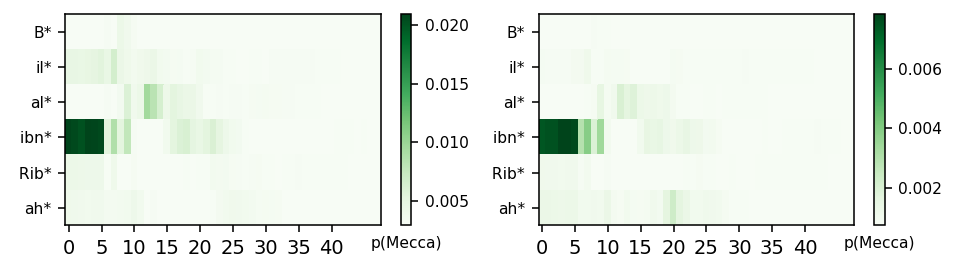

Which pair of patterns is most similar? Example 1 or 2?
If both are equally simlar, write '3'. If none are remotely similar, write '0'.
1
SAMPLE 17 out of 100
--------------------------------------------------------------------------
Example 1 (top any token) 'Nat alia  Sh akh ov s kaya  origin ates  from'
--------------------------------------------------------------------------


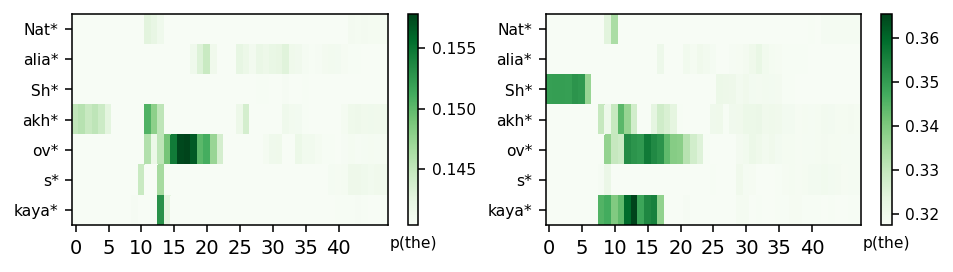

--------------------------------------------------------------------------
Example 2 (top any token) 'Nat alia  Sh akh ov s kaya  is  originally  from'
--------------------------------------------------------------------------


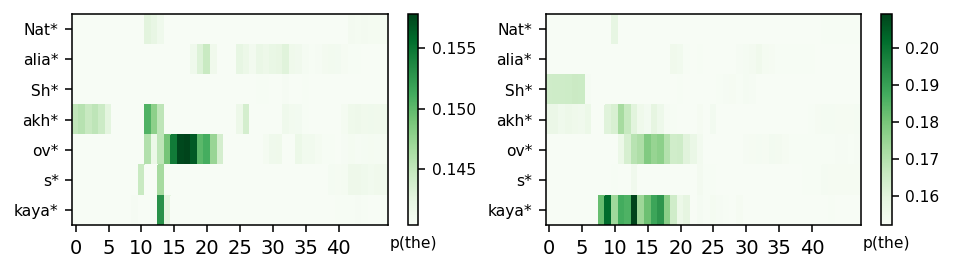

Which pair of patterns is most similar? Example 1 or 2?
If both are equally simlar, write '3'. If none are remotely similar, write '0'.
0
--------------------------------------------------------------------------
Example 1 (top candidate token) 'Nat alia  Sh akh ov s kaya  origin ates  from'
--------------------------------------------------------------------------


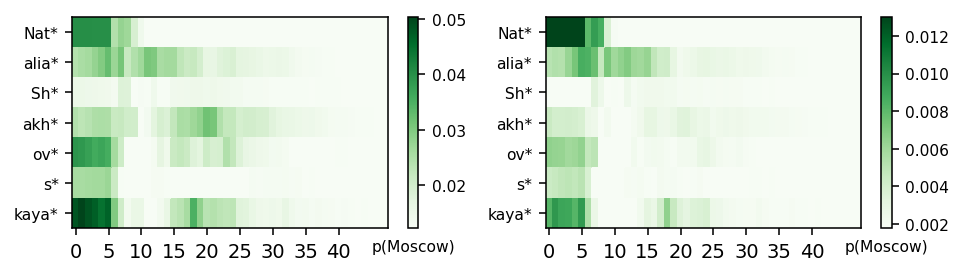

--------------------------------------------------------------------------
Example 2 (top candidate token) 'Nat alia  Sh akh ov s kaya  is  originally  from'
--------------------------------------------------------------------------


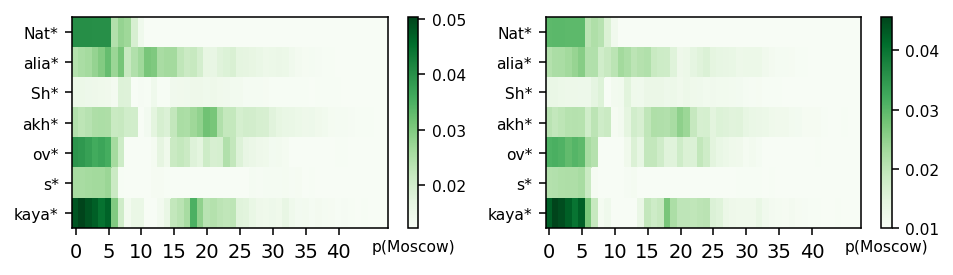

Which pair of patterns is most similar? Example 1 or 2?
If both are equally simlar, write '3'. If none are remotely similar, write '0'.
2
SAMPLE 18 out of 100
--------------------------------------------------------------------------
Example 1 (top any token) 'N icky  Barnes  origin ates  from'
--------------------------------------------------------------------------


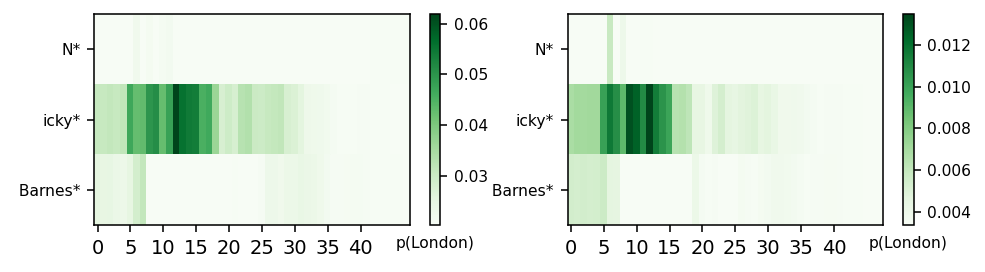

--------------------------------------------------------------------------
Example 2 (top any token) 'N icky  Barnes  is  native  to'
--------------------------------------------------------------------------


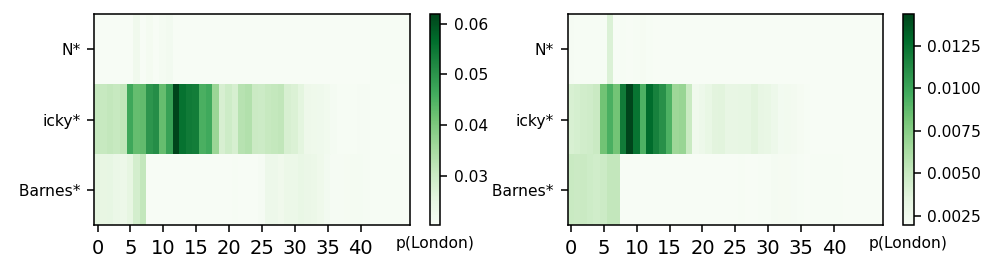

Which pair of patterns is most similar? Example 1 or 2?
If both are equally simlar, write '3'. If none are remotely similar, write '0'.
3
--------------------------------------------------------------------------
Example 1 (top candidate token) 'N icky  Barnes  origin ates  from'
--------------------------------------------------------------------------


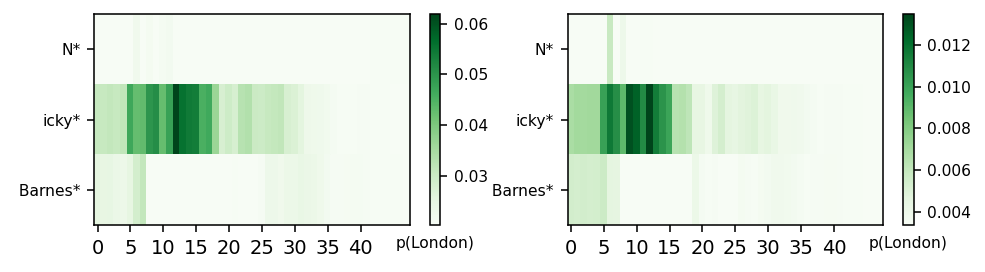

--------------------------------------------------------------------------
Example 2 (top candidate token) 'N icky  Barnes  is  native  to'
--------------------------------------------------------------------------


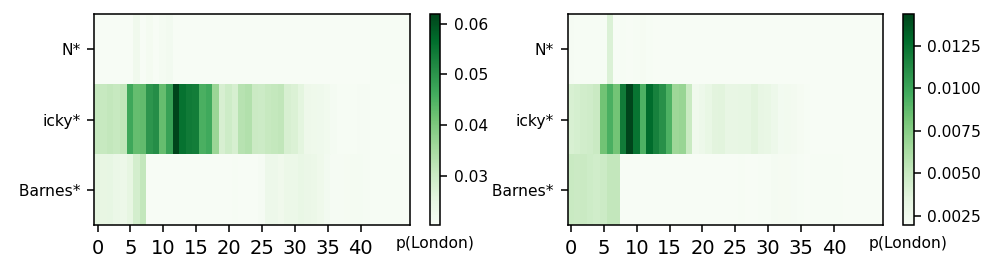

Which pair of patterns is most similar? Example 1 or 2?
If both are equally simlar, write '3'. If none are remotely similar, write '0'.
3
SAMPLE 19 out of 100
--------------------------------------------------------------------------
Example 1 (top any token) 'Am ol  Pal ek ar  is  native  to'
--------------------------------------------------------------------------


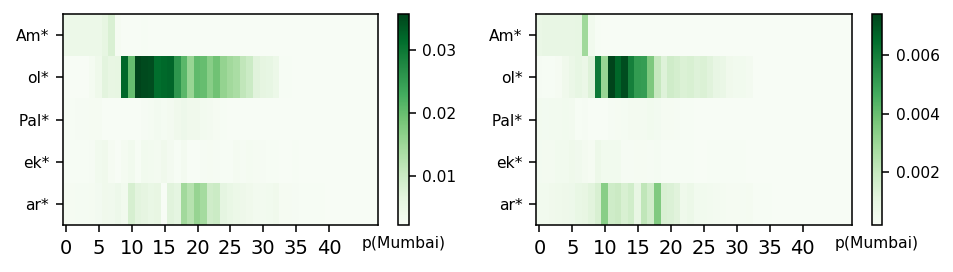

--------------------------------------------------------------------------
Example 2 (top any token) 'Am ol  Pal ek ar  was  native  to'
--------------------------------------------------------------------------


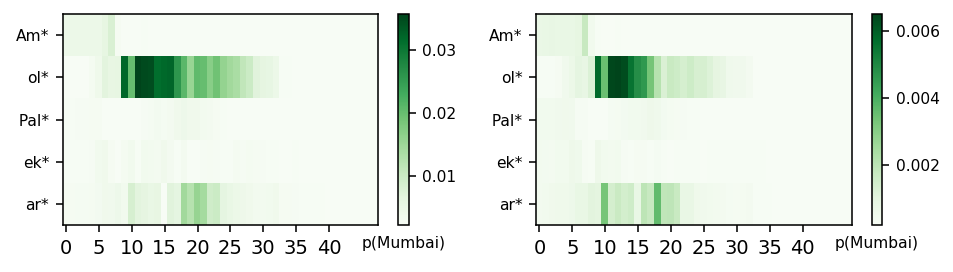

Which pair of patterns is most similar? Example 1 or 2?
If both are equally simlar, write '3'. If none are remotely similar, write '0'.
3
--------------------------------------------------------------------------
Example 1 (top candidate token) 'Am ol  Pal ek ar  is  native  to'
--------------------------------------------------------------------------


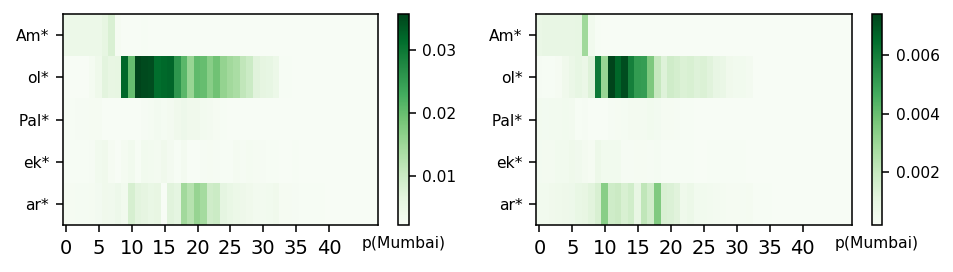

--------------------------------------------------------------------------
Example 2 (top candidate token) 'Am ol  Pal ek ar  was  native  to'
--------------------------------------------------------------------------


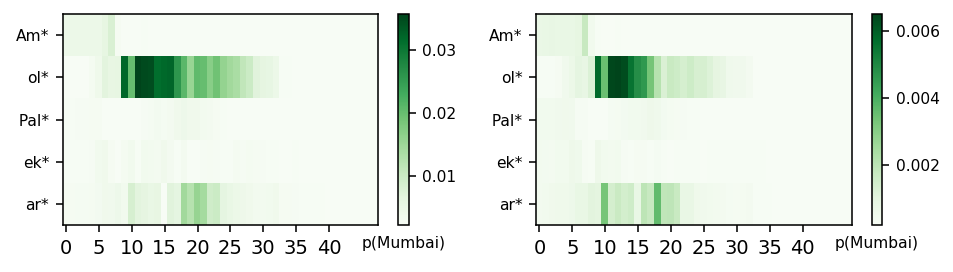

Which pair of patterns is most similar? Example 1 or 2?
If both are equally simlar, write '3'. If none are remotely similar, write '0'.
3
SAMPLE 20 out of 100
--------------------------------------------------------------------------
Example 1 (top any token) 'Sh ane  Batt ier  is  originally  from'
--------------------------------------------------------------------------


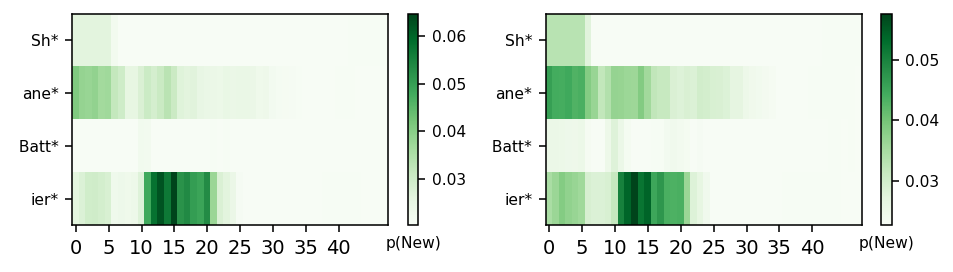

--------------------------------------------------------------------------
Example 2 (top any token) 'Sh ane  Batt ier  originated  from'
--------------------------------------------------------------------------


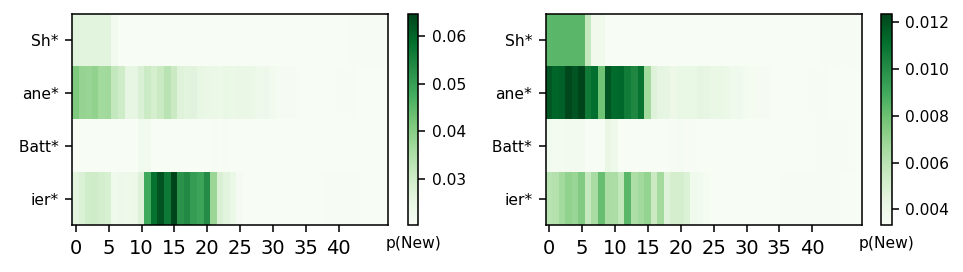

Which pair of patterns is most similar? Example 1 or 2?
If both are equally simlar, write '3'. If none are remotely similar, write '0'.
1
--------------------------------------------------------------------------
Example 1 (top candidate token) 'Sh ane  Batt ier  is  originally  from'
--------------------------------------------------------------------------


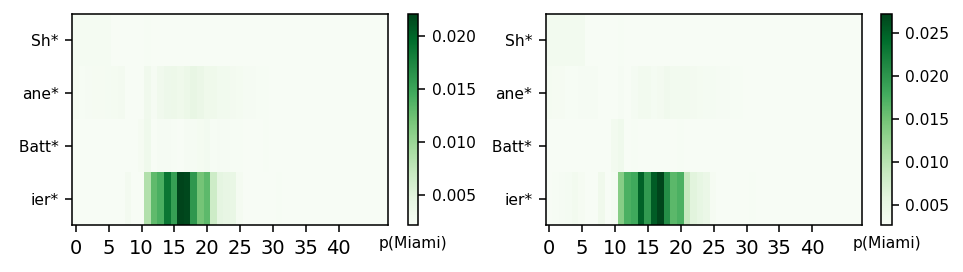

--------------------------------------------------------------------------
Example 2 (top candidate token) 'Sh ane  Batt ier  originated  from'
--------------------------------------------------------------------------


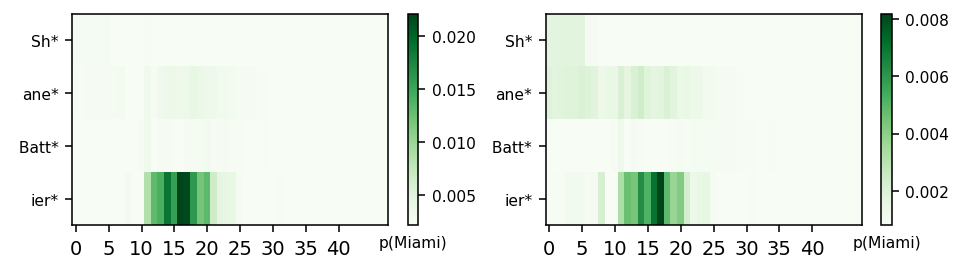

Which pair of patterns is most similar? Example 1 or 2?
If both are equally simlar, write '3'. If none are remotely similar, write '0'.
1
SAMPLE 21 out of 100
--------------------------------------------------------------------------
Example 1 (top any token) 'H ir am  Ab as  origin ates  from'
--------------------------------------------------------------------------


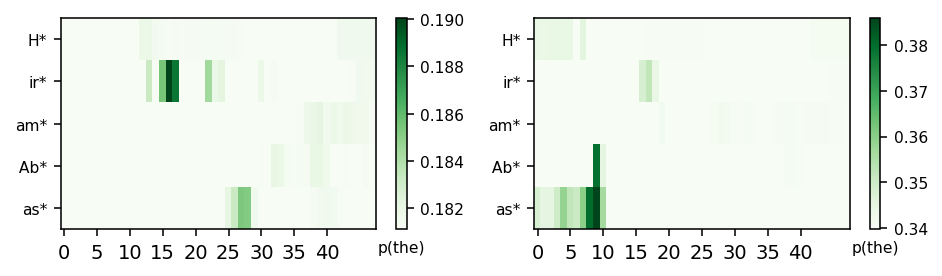

--------------------------------------------------------------------------
Example 2 (top any token) 'H ir am  Ab as  originated  from'
--------------------------------------------------------------------------


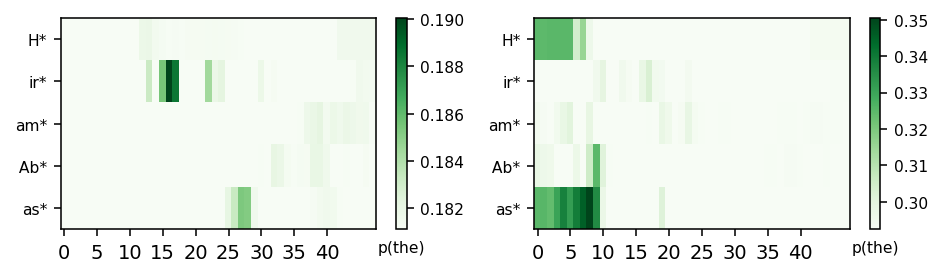

Which pair of patterns is most similar? Example 1 or 2?
If both are equally simlar, write '3'. If none are remotely similar, write '0'.
0
--------------------------------------------------------------------------
Example 1 (top candidate token) 'H ir am  Ab as  origin ates  from'
--------------------------------------------------------------------------


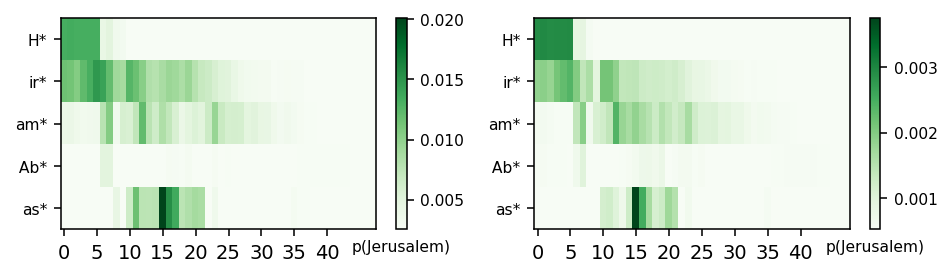

--------------------------------------------------------------------------
Example 2 (top candidate token) 'H ir am  Ab as  originated  from'
--------------------------------------------------------------------------


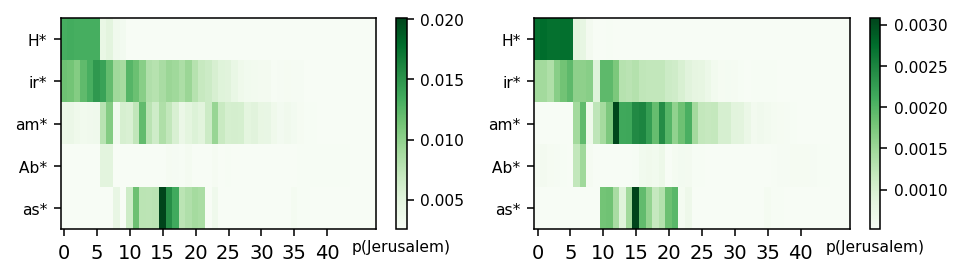

Which pair of patterns is most similar? Example 1 or 2?
If both are equally simlar, write '3'. If none are remotely similar, write '0'.
1
SAMPLE 22 out of 100
--------------------------------------------------------------------------
Example 1 (top any token) 'Ah mad  Ali  is  originally  from'
--------------------------------------------------------------------------


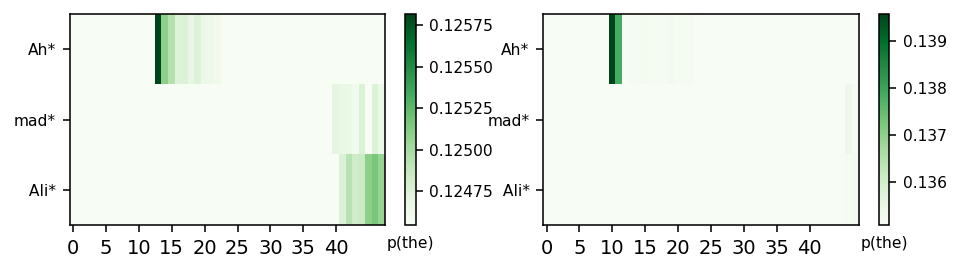

--------------------------------------------------------------------------
Example 2 (top any token) 'Ah mad  Ali  was  native  to'
--------------------------------------------------------------------------


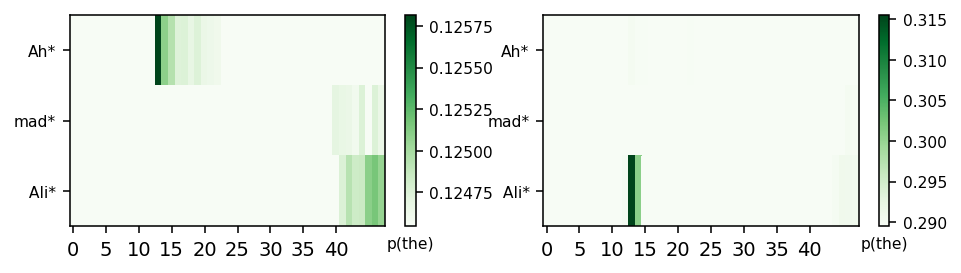

Which pair of patterns is most similar? Example 1 or 2?
If both are equally simlar, write '3'. If none are remotely similar, write '0'.
1
--------------------------------------------------------------------------
Example 1 (top candidate token) 'Ah mad  Ali  is  originally  from'
--------------------------------------------------------------------------


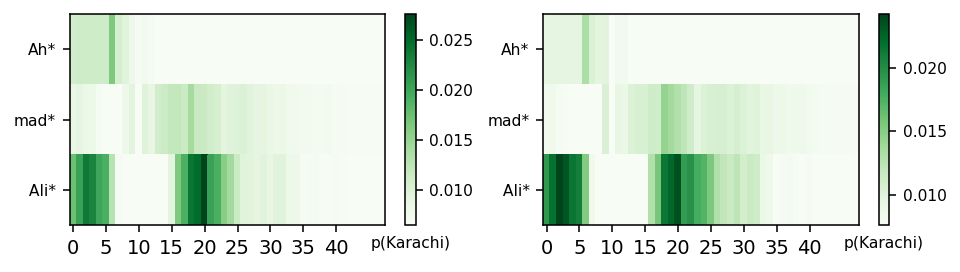

--------------------------------------------------------------------------
Example 2 (top candidate token) 'Ah mad  Ali  was  native  to'
--------------------------------------------------------------------------


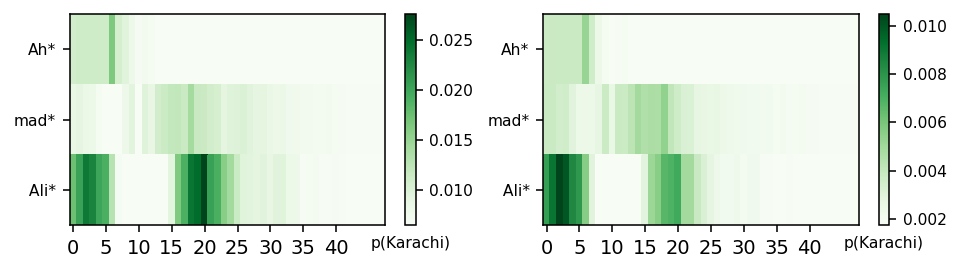

Which pair of patterns is most similar? Example 1 or 2?
If both are equally simlar, write '3'. If none are remotely similar, write '0'.
1
SAMPLE 23 out of 100
--------------------------------------------------------------------------
Example 1 (top any token) 'L or raine  O ' Gr ady  was  native  to'
--------------------------------------------------------------------------


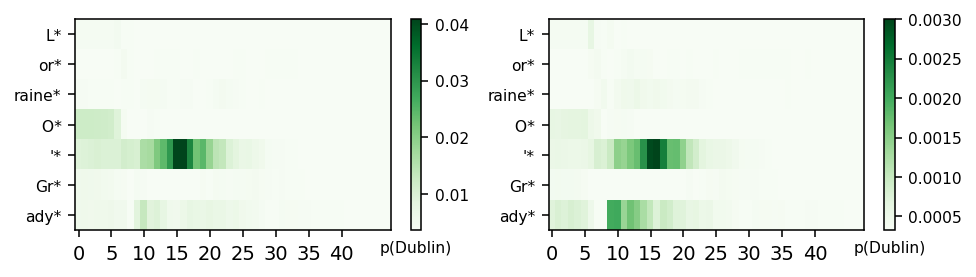

--------------------------------------------------------------------------
Example 2 (top any token) 'L or raine  O ' Gr ady  origin ates  from'
--------------------------------------------------------------------------


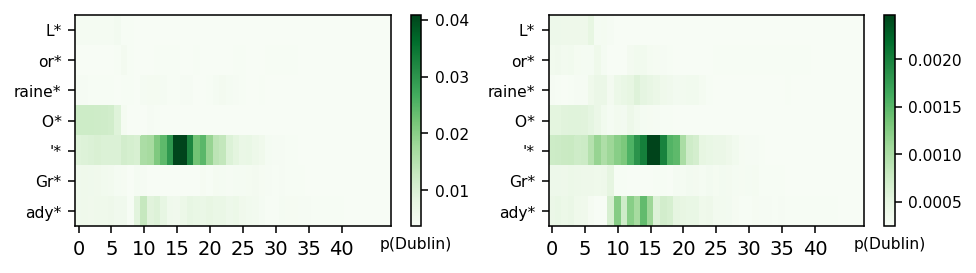

Which pair of patterns is most similar? Example 1 or 2?
If both are equally simlar, write '3'. If none are remotely similar, write '0'.
1
--------------------------------------------------------------------------
Example 1 (top candidate token) 'L or raine  O ' Gr ady  was  native  to'
--------------------------------------------------------------------------


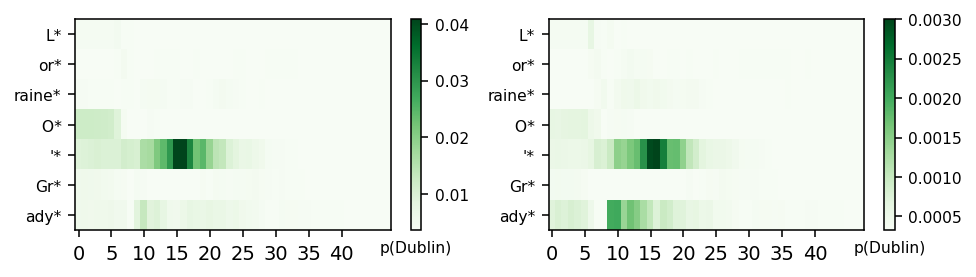

--------------------------------------------------------------------------
Example 2 (top candidate token) 'L or raine  O ' Gr ady  origin ates  from'
--------------------------------------------------------------------------


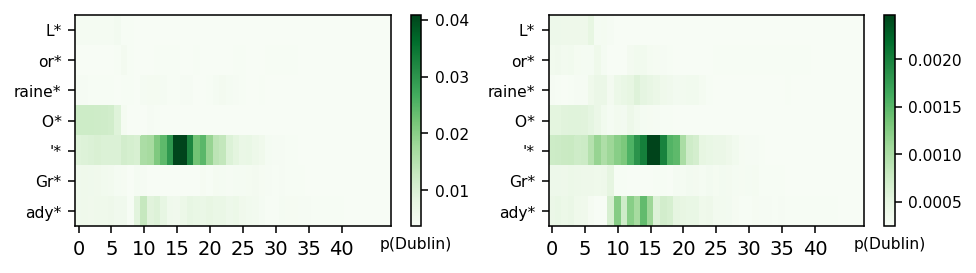

Which pair of patterns is most similar? Example 1 or 2?
If both are equally simlar, write '3'. If none are remotely similar, write '0'.
3
SAMPLE 24 out of 100
--------------------------------------------------------------------------
Example 1 (top any token) 'Po vel  Ram el  origin ates  from'
--------------------------------------------------------------------------


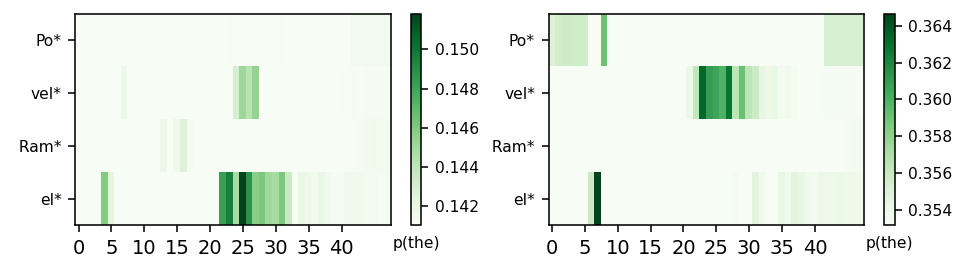

--------------------------------------------------------------------------
Example 2 (top any token) 'Po vel  Ram el  was  native  to'
--------------------------------------------------------------------------


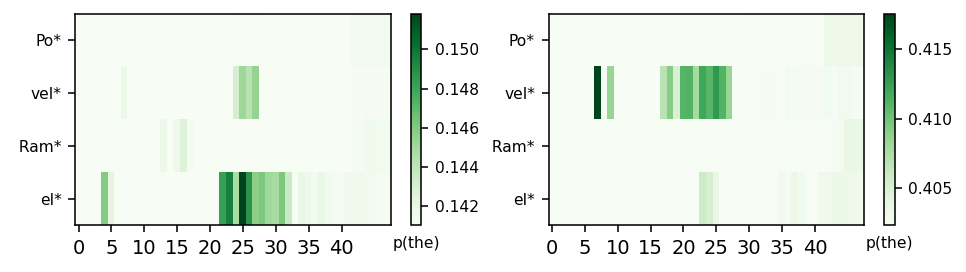

Which pair of patterns is most similar? Example 1 or 2?
If both are equally simlar, write '3'. If none are remotely similar, write '0'.
0
--------------------------------------------------------------------------
Example 1 (top candidate token) 'Po vel  Ram el  origin ates  from'
--------------------------------------------------------------------------


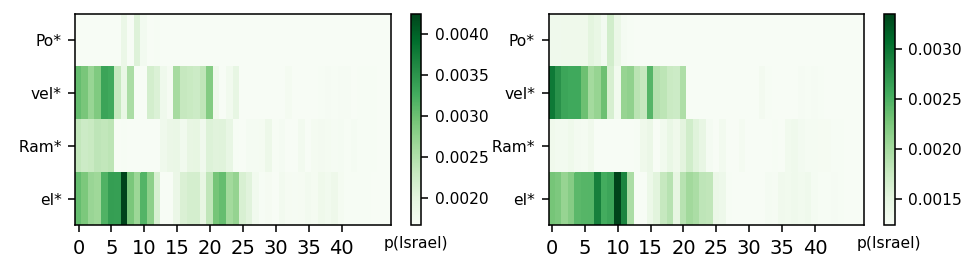

--------------------------------------------------------------------------
Example 2 (top candidate token) 'Po vel  Ram el  was  native  to'
--------------------------------------------------------------------------


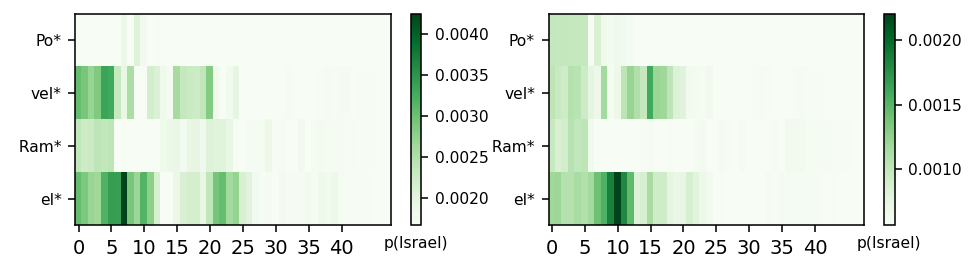

Which pair of patterns is most similar? Example 1 or 2?
If both are equally simlar, write '3'. If none are remotely similar, write '0'.
1
SAMPLE 25 out of 100
--------------------------------------------------------------------------
Example 1 (top any token) 'E rol  Al kan  is  originally  from'
--------------------------------------------------------------------------


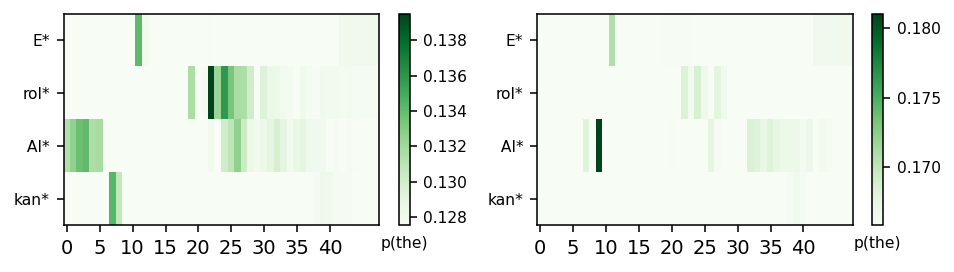

--------------------------------------------------------------------------
Example 2 (top any token) 'E rol  Al kan  originated  from'
--------------------------------------------------------------------------


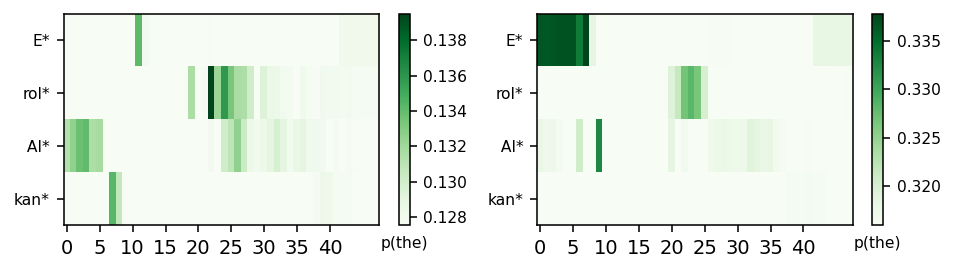

Which pair of patterns is most similar? Example 1 or 2?
If both are equally simlar, write '3'. If none are remotely similar, write '0'.
0
--------------------------------------------------------------------------
Example 1 (top candidate token) 'E rol  Al kan  is  originally  from'
--------------------------------------------------------------------------


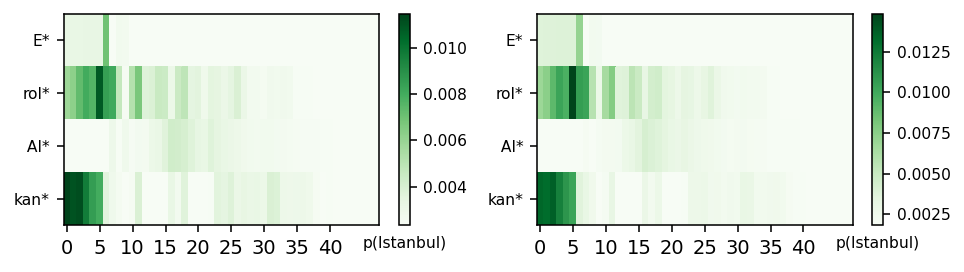

--------------------------------------------------------------------------
Example 2 (top candidate token) 'E rol  Al kan  originated  from'
--------------------------------------------------------------------------


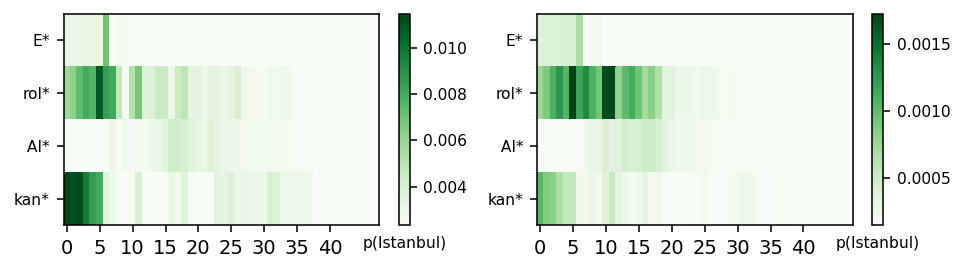

Which pair of patterns is most similar? Example 1 or 2?
If both are equally simlar, write '3'. If none are remotely similar, write '0'.
1
SAMPLE 26 out of 100
--------------------------------------------------------------------------
Example 1 (top any token) 'Her b  Carnegie  is  native  to'
--------------------------------------------------------------------------


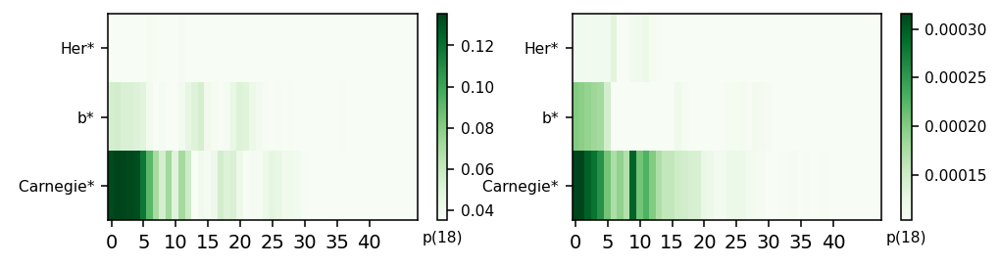

--------------------------------------------------------------------------
Example 2 (top any token) 'Her b  Carnegie  was  native  to'
--------------------------------------------------------------------------


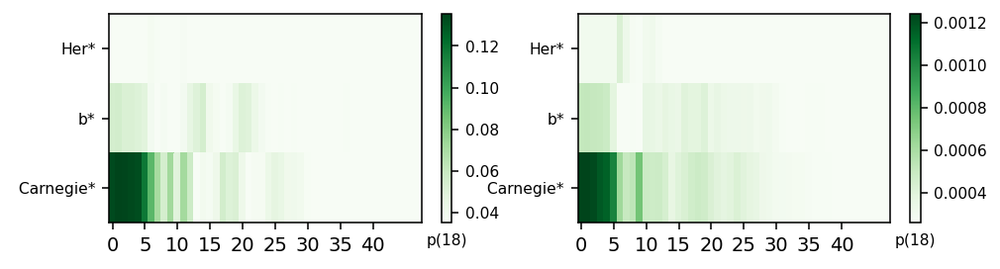

Which pair of patterns is most similar? Example 1 or 2?
If both are equally simlar, write '3'. If none are remotely similar, write '0'.
3
--------------------------------------------------------------------------
Example 1 (top candidate token) 'Her b  Carnegie  is  native  to'
--------------------------------------------------------------------------


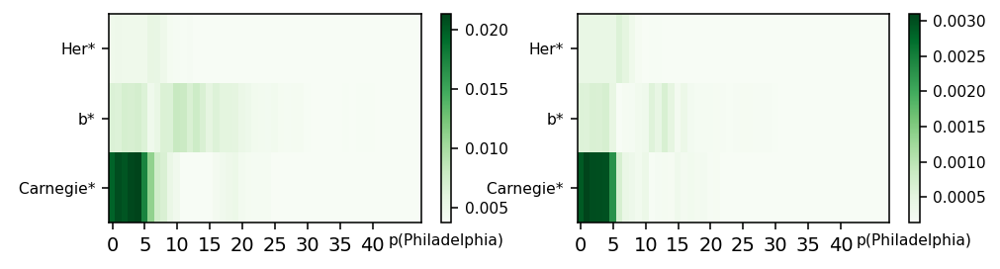

--------------------------------------------------------------------------
Example 2 (top candidate token) 'Her b  Carnegie  was  native  to'
--------------------------------------------------------------------------


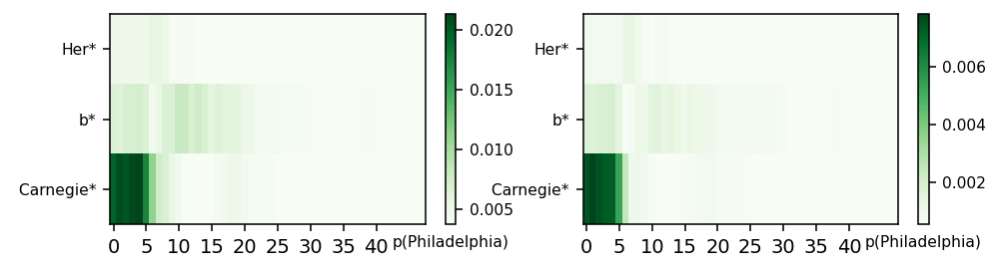

Which pair of patterns is most similar? Example 1 or 2?
If both are equally simlar, write '3'. If none are remotely similar, write '0'.
3
SAMPLE 27 out of 100
--------------------------------------------------------------------------
Example 1 (top any token) 'N ancy  Rub ins  originated  from'
--------------------------------------------------------------------------


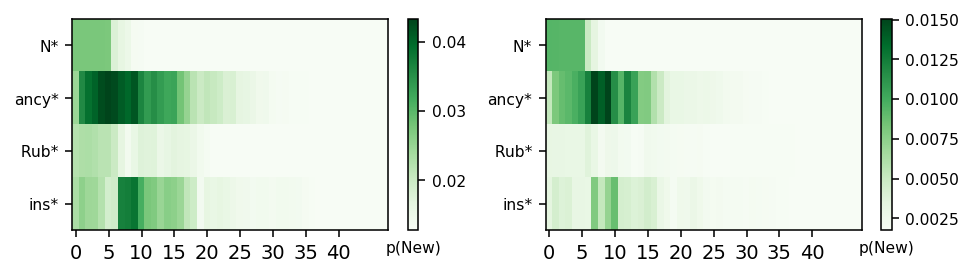

--------------------------------------------------------------------------
Example 2 (top any token) 'N ancy  Rub ins  was  originally  from'
--------------------------------------------------------------------------


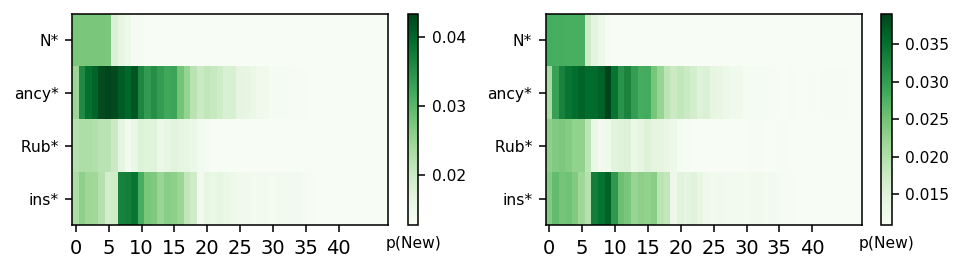

Which pair of patterns is most similar? Example 1 or 2?
If both are equally simlar, write '3'. If none are remotely similar, write '0'.
2
--------------------------------------------------------------------------
Example 1 (top candidate token) 'N ancy  Rub ins  originated  from'
--------------------------------------------------------------------------


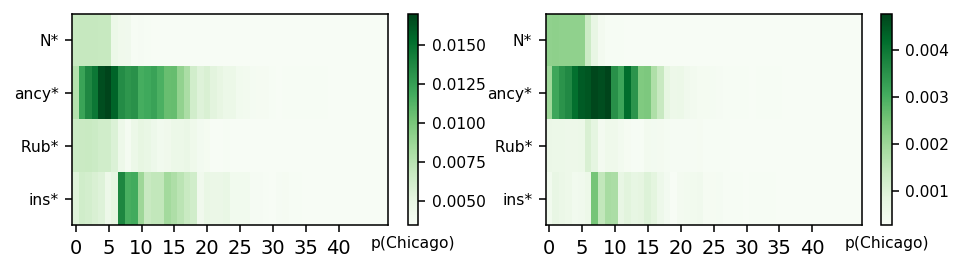

--------------------------------------------------------------------------
Example 2 (top candidate token) 'N ancy  Rub ins  was  originally  from'
--------------------------------------------------------------------------


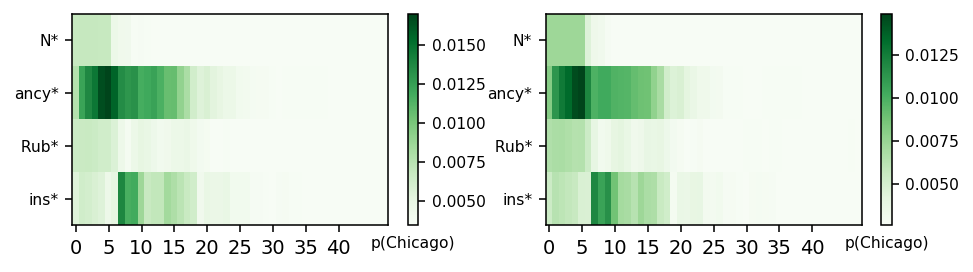

Which pair of patterns is most similar? Example 1 or 2?
If both are equally simlar, write '3'. If none are remotely similar, write '0'.
2
SAMPLE 28 out of 100
--------------------------------------------------------------------------
Example 1 (top any token) 'T .  Claude  Ryan  is  originally  from'
--------------------------------------------------------------------------


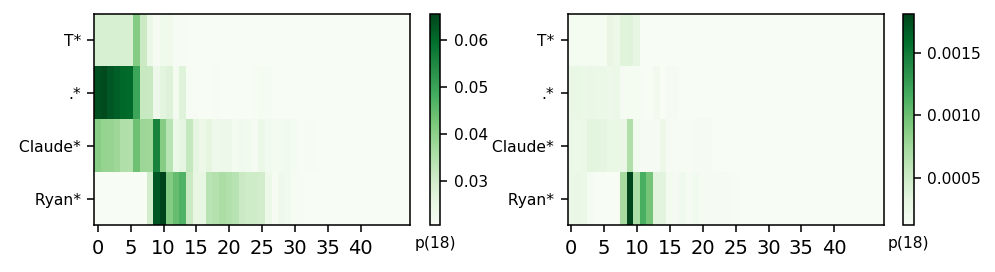

--------------------------------------------------------------------------
Example 2 (top any token) 'T .  Claude  Ryan  origin ates  from'
--------------------------------------------------------------------------


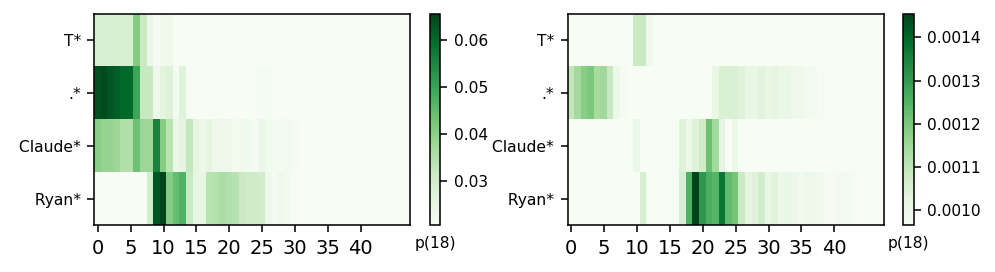

Which pair of patterns is most similar? Example 1 or 2?
If both are equally simlar, write '3'. If none are remotely similar, write '0'.
0
--------------------------------------------------------------------------
Example 1 (top candidate token) 'T .  Claude  Ryan  is  originally  from'
--------------------------------------------------------------------------


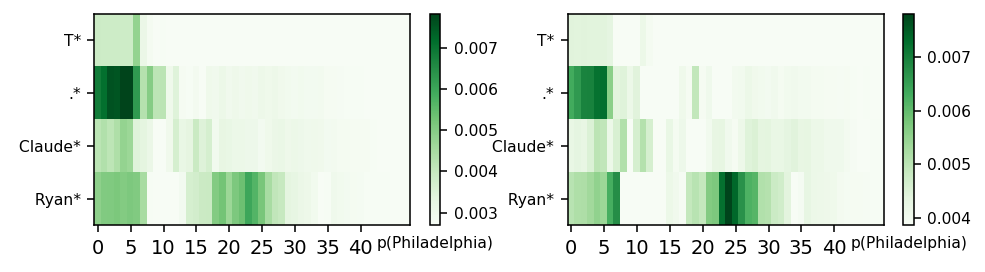

--------------------------------------------------------------------------
Example 2 (top candidate token) 'T .  Claude  Ryan  origin ates  from'
--------------------------------------------------------------------------


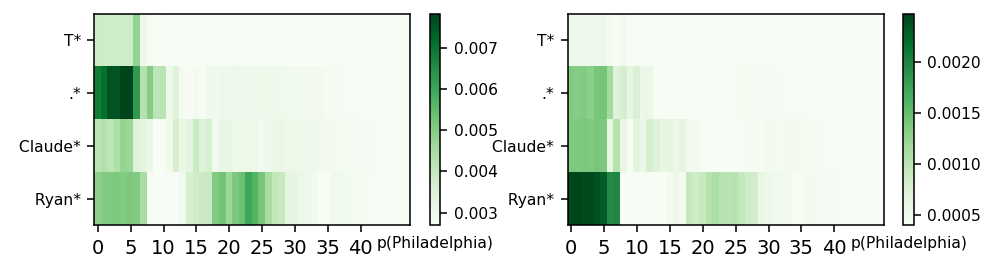

Which pair of patterns is most similar? Example 1 or 2?
If both are equally simlar, write '3'. If none are remotely similar, write '0'.
1
SAMPLE 29 out of 100
--------------------------------------------------------------------------
Example 1 (top any token) 'Brian  Boyd  is  originally  from'
--------------------------------------------------------------------------


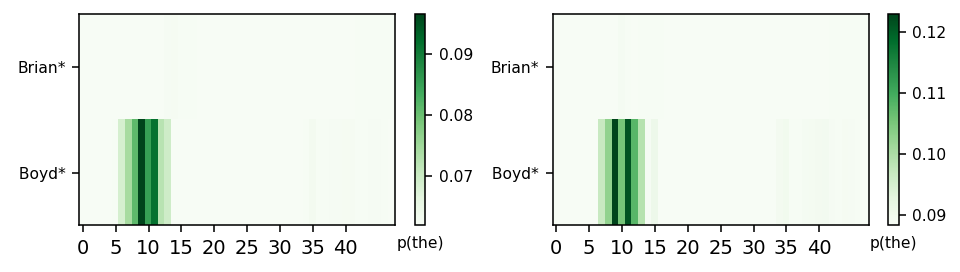

--------------------------------------------------------------------------
Example 2 (top any token) 'Brian  Boyd  is  native  to'
--------------------------------------------------------------------------


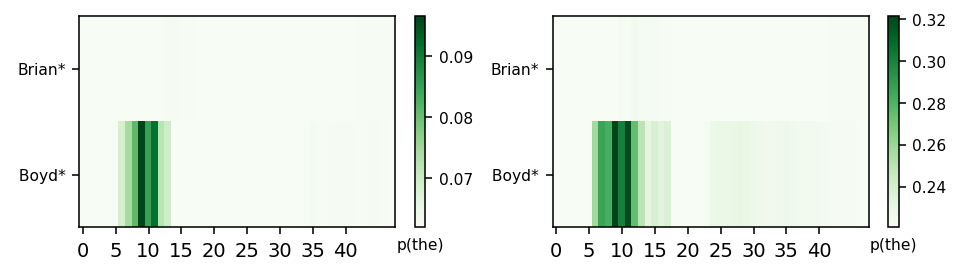

Which pair of patterns is most similar? Example 1 or 2?
If both are equally simlar, write '3'. If none are remotely similar, write '0'.
1
--------------------------------------------------------------------------
Example 1 (top candidate token) 'Brian  Boyd  is  originally  from'
--------------------------------------------------------------------------


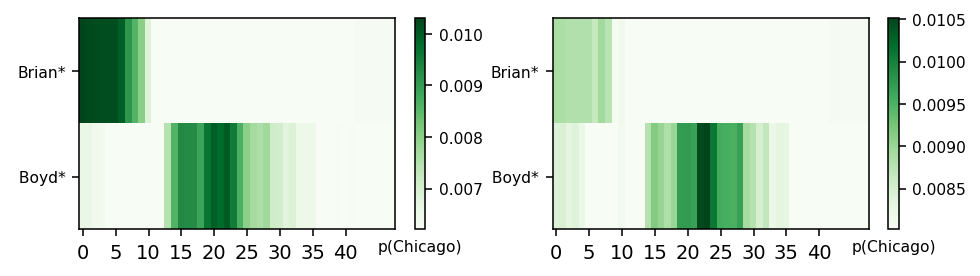

--------------------------------------------------------------------------
Example 2 (top candidate token) 'Brian  Boyd  is  native  to'
--------------------------------------------------------------------------


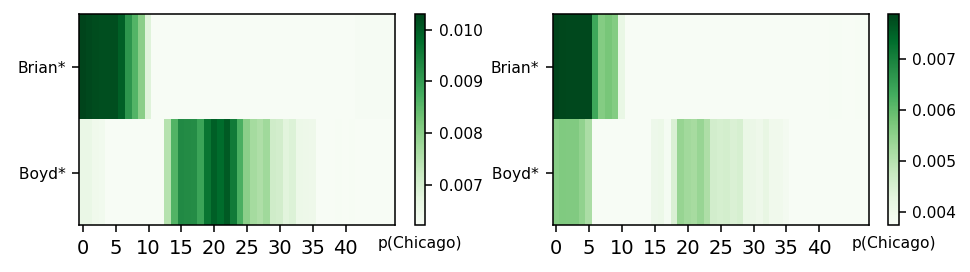

Which pair of patterns is most similar? Example 1 or 2?
If both are equally simlar, write '3'. If none are remotely similar, write '0'.
3
SAMPLE 30 out of 100
--------------------------------------------------------------------------
Example 1 (top any token) 'K uru pt  is  native  to'
--------------------------------------------------------------------------


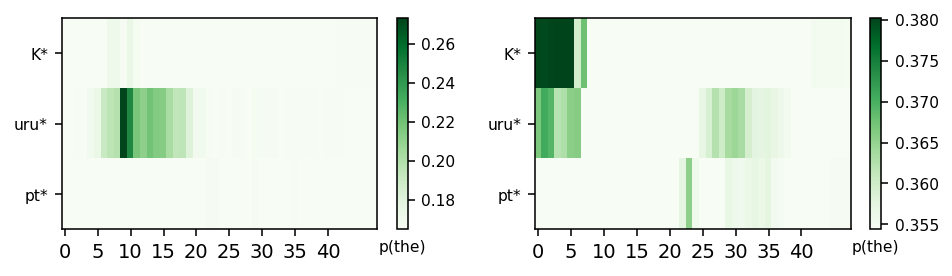

--------------------------------------------------------------------------
Example 2 (top any token) 'K uru pt  was  native  to'
--------------------------------------------------------------------------


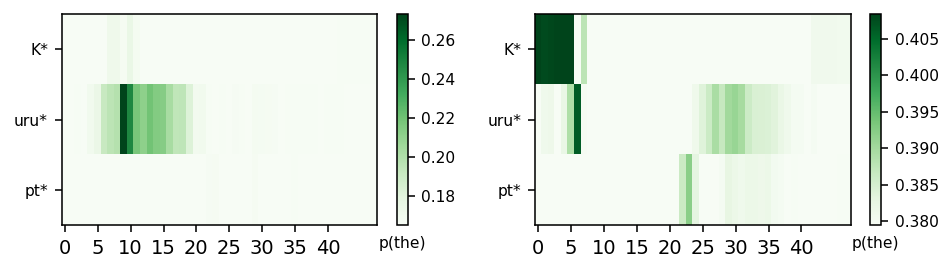

Which pair of patterns is most similar? Example 1 or 2?
If both are equally simlar, write '3'. If none are remotely similar, write '0'.
0
--------------------------------------------------------------------------
Example 1 (top candidate token) 'K uru pt  is  native  to'
--------------------------------------------------------------------------


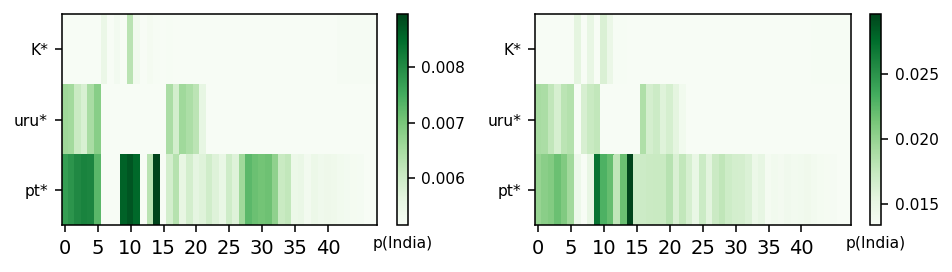

--------------------------------------------------------------------------
Example 2 (top candidate token) 'K uru pt  was  native  to'
--------------------------------------------------------------------------


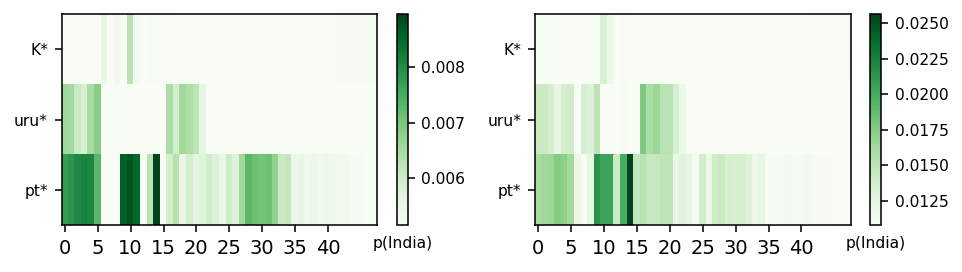

Which pair of patterns is most similar? Example 1 or 2?
If both are equally simlar, write '3'. If none are remotely similar, write '0'.
3
SAMPLE 31 out of 100
--------------------------------------------------------------------------
Example 1 (top any token) 'Sal v ador  Pu ig  Ant ich  originated  from'
--------------------------------------------------------------------------


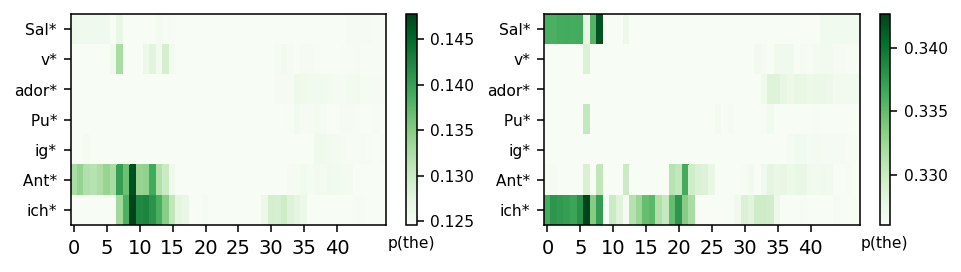

--------------------------------------------------------------------------
Example 2 (top any token) 'Sal v ador  Pu ig  Ant ich  is  originally  from'
--------------------------------------------------------------------------


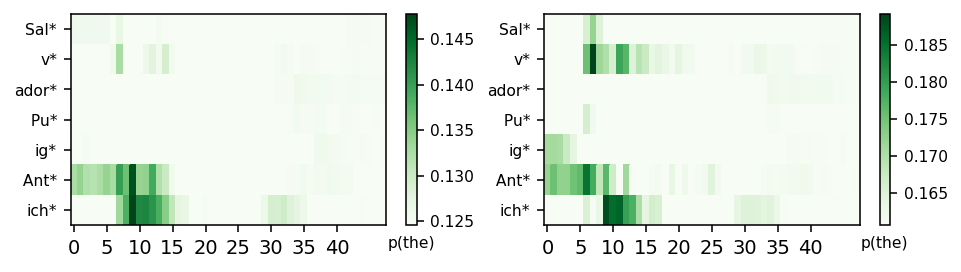

Which pair of patterns is most similar? Example 1 or 2?
If both are equally simlar, write '3'. If none are remotely similar, write '0'.
2
--------------------------------------------------------------------------
Example 1 (top candidate token) 'Sal v ador  Pu ig  Ant ich  originated  from'
--------------------------------------------------------------------------


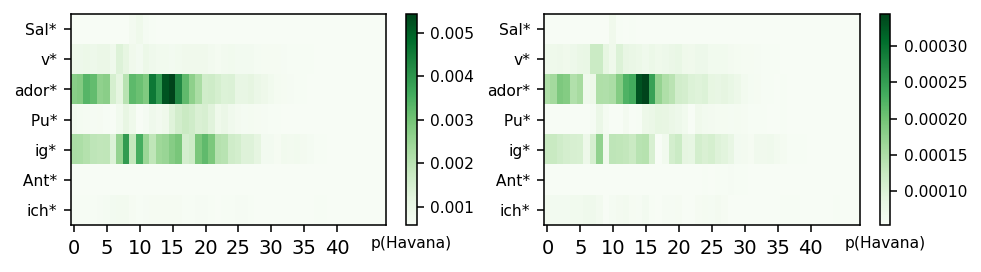

--------------------------------------------------------------------------
Example 2 (top candidate token) 'Sal v ador  Pu ig  Ant ich  is  originally  from'
--------------------------------------------------------------------------


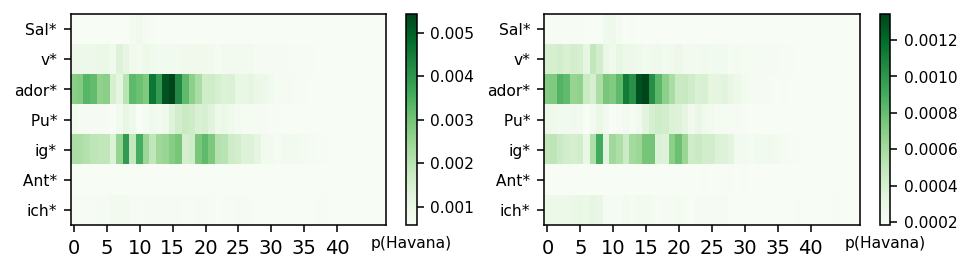

Which pair of patterns is most similar? Example 1 or 2?
If both are equally simlar, write '3'. If none are remotely similar, write '0'.
2
SAMPLE 32 out of 100
--------------------------------------------------------------------------
Example 1 (top any token) 'Te  Wei  originated  from'
--------------------------------------------------------------------------


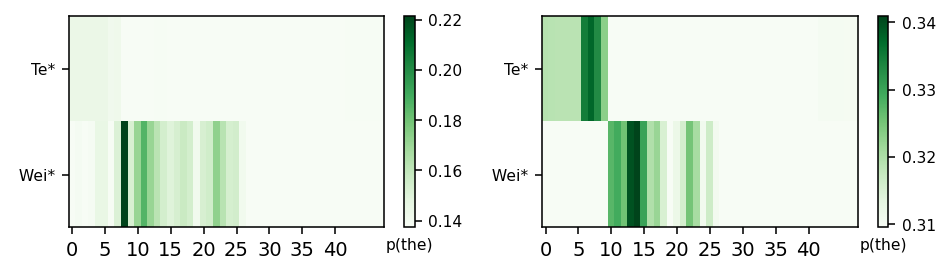

--------------------------------------------------------------------------
Example 2 (top any token) 'Te  Wei  was  originally  from'
--------------------------------------------------------------------------


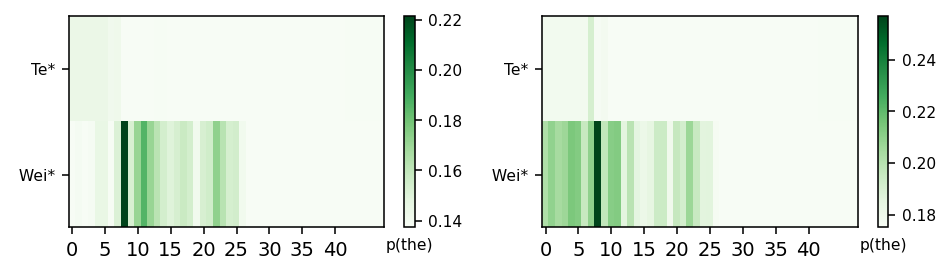

Which pair of patterns is most similar? Example 1 or 2?
If both are equally simlar, write '3'. If none are remotely similar, write '0'.
2
--------------------------------------------------------------------------
Example 1 (top candidate token) 'Te  Wei  originated  from'
--------------------------------------------------------------------------


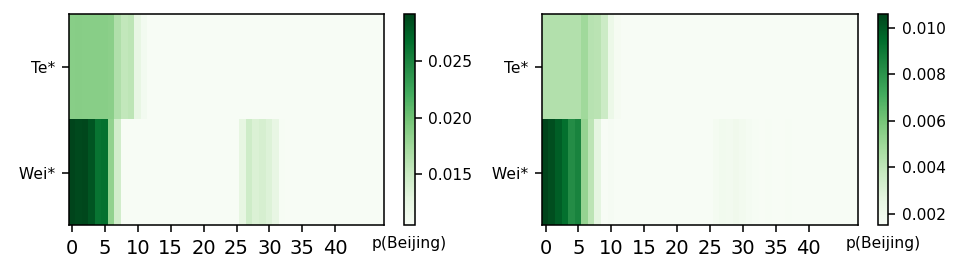

--------------------------------------------------------------------------
Example 2 (top candidate token) 'Te  Wei  was  originally  from'
--------------------------------------------------------------------------


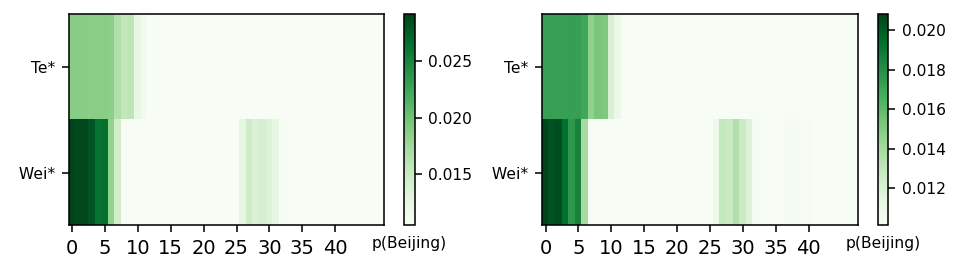

Which pair of patterns is most similar? Example 1 or 2?
If both are equally simlar, write '3'. If none are remotely similar, write '0'.
2
SAMPLE 33 out of 100
--------------------------------------------------------------------------
Example 1 (top any token) 'Pierre  Mac quer  is  native  to'
--------------------------------------------------------------------------


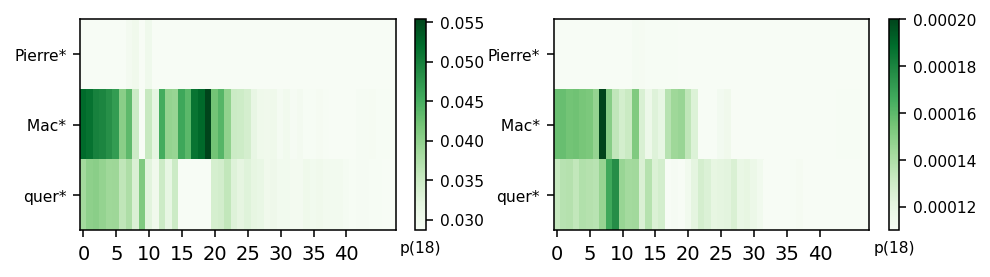

--------------------------------------------------------------------------
Example 2 (top any token) 'Pierre  Mac quer  is  originally  from'
--------------------------------------------------------------------------


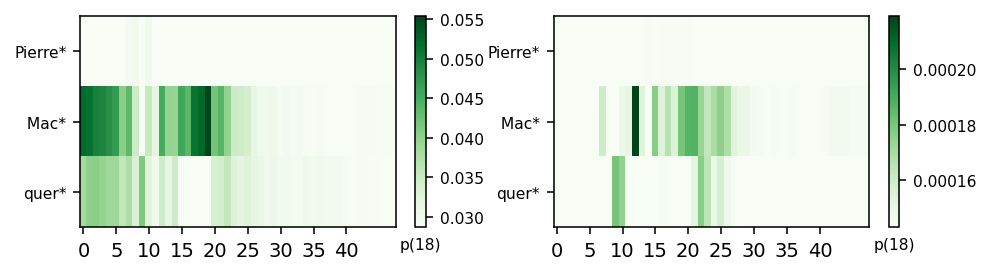

Which pair of patterns is most similar? Example 1 or 2?
If both are equally simlar, write '3'. If none are remotely similar, write '0'.
0
--------------------------------------------------------------------------
Example 1 (top candidate token) 'Pierre  Mac quer  is  native  to'
--------------------------------------------------------------------------


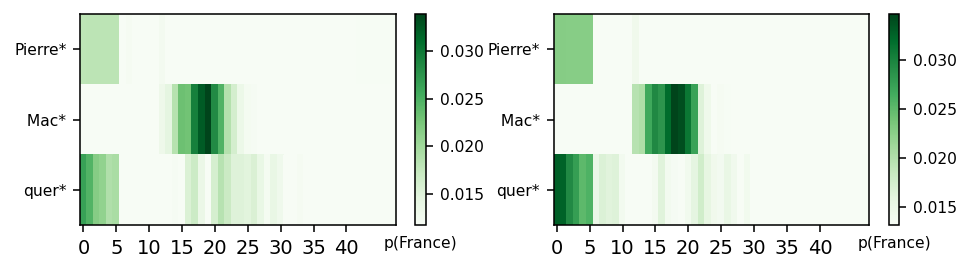

--------------------------------------------------------------------------
Example 2 (top candidate token) 'Pierre  Mac quer  is  originally  from'
--------------------------------------------------------------------------


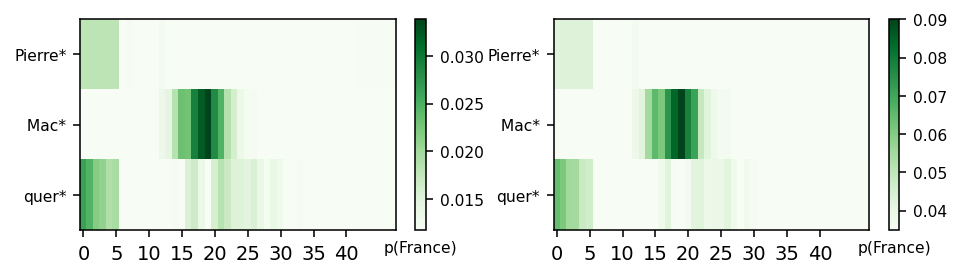

Which pair of patterns is most similar? Example 1 or 2?
If both are equally simlar, write '3'. If none are remotely similar, write '0'.
2
SAMPLE 34 out of 100
--------------------------------------------------------------------------
Example 1 (top any token) 'L ur rie  Bell  is  native  to'
--------------------------------------------------------------------------


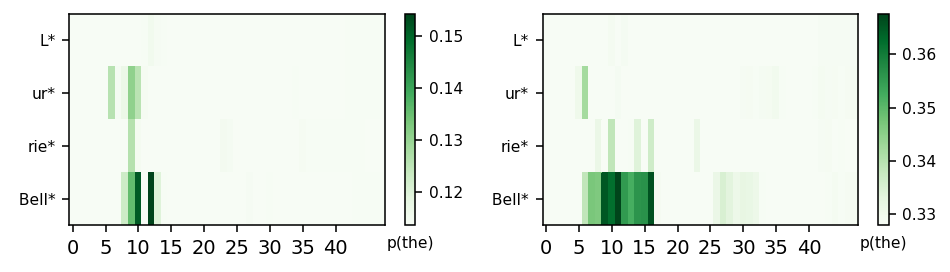

--------------------------------------------------------------------------
Example 2 (top any token) 'L ur rie  Bell  was  native  to'
--------------------------------------------------------------------------


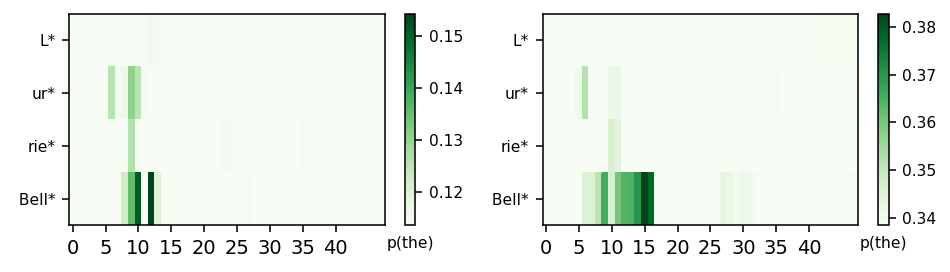

Which pair of patterns is most similar? Example 1 or 2?
If both are equally simlar, write '3'. If none are remotely similar, write '0'.
0
--------------------------------------------------------------------------
Example 1 (top candidate token) 'L ur rie  Bell  is  native  to'
--------------------------------------------------------------------------


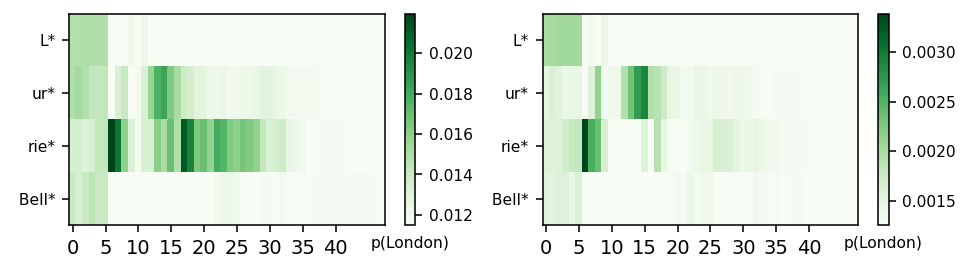

--------------------------------------------------------------------------
Example 2 (top candidate token) 'L ur rie  Bell  was  native  to'
--------------------------------------------------------------------------


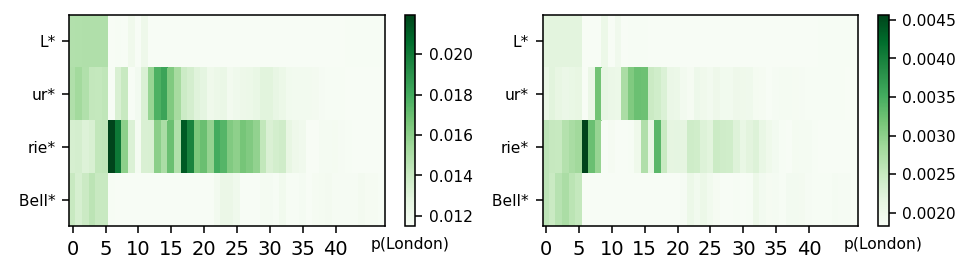

Which pair of patterns is most similar? Example 1 or 2?
If both are equally simlar, write '3'. If none are remotely similar, write '0'.
3
SAMPLE 35 out of 100
--------------------------------------------------------------------------
Example 1 (top any token) 'Martin  Lund gaard  Hansen  is  originally  from'
--------------------------------------------------------------------------


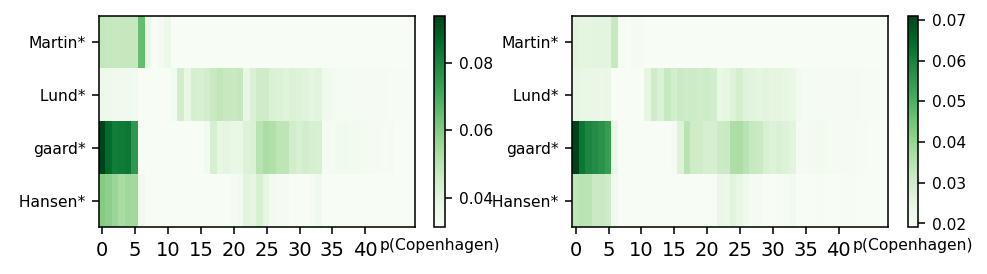

--------------------------------------------------------------------------
Example 2 (top any token) 'Martin  Lund gaard  Hansen  was  originally  from'
--------------------------------------------------------------------------


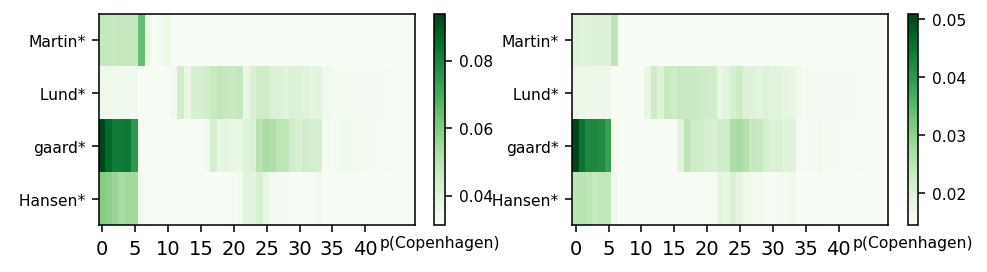

Which pair of patterns is most similar? Example 1 or 2?
If both are equally simlar, write '3'. If none are remotely similar, write '0'.
3
--------------------------------------------------------------------------
Example 1 (top candidate token) 'Martin  Lund gaard  Hansen  is  originally  from'
--------------------------------------------------------------------------


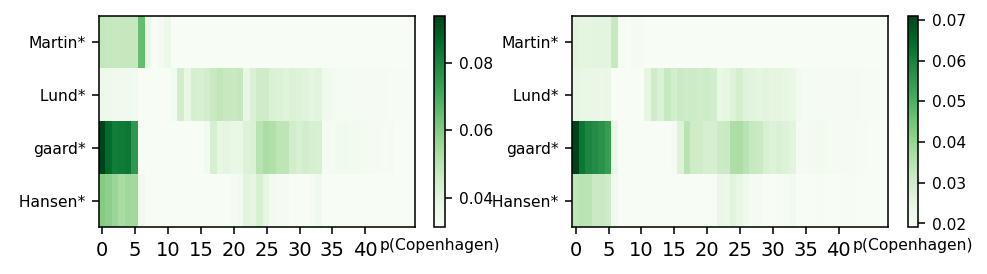

--------------------------------------------------------------------------
Example 2 (top candidate token) 'Martin  Lund gaard  Hansen  was  originally  from'
--------------------------------------------------------------------------


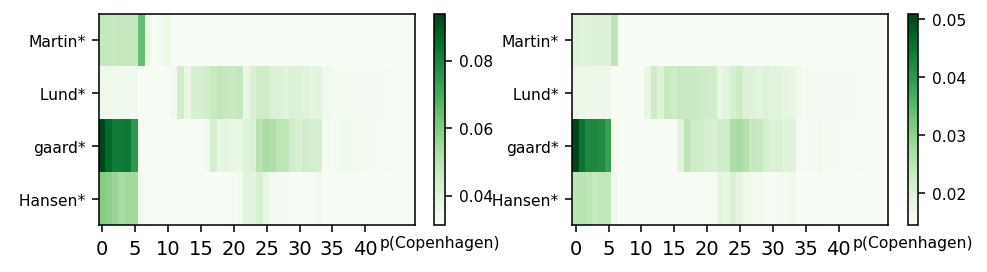

Which pair of patterns is most similar? Example 1 or 2?
If both are equally simlar, write '3'. If none are remotely similar, write '0'.
3
SAMPLE 36 out of 100
--------------------------------------------------------------------------
Example 1 (top any token) 'John  L aving ton  B ony th on  was  native  to'
--------------------------------------------------------------------------


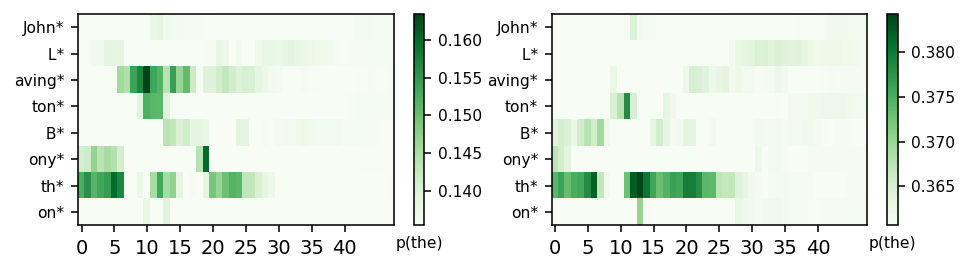

--------------------------------------------------------------------------
Example 2 (top any token) 'John  L aving ton  B ony th on  originated  from'
--------------------------------------------------------------------------


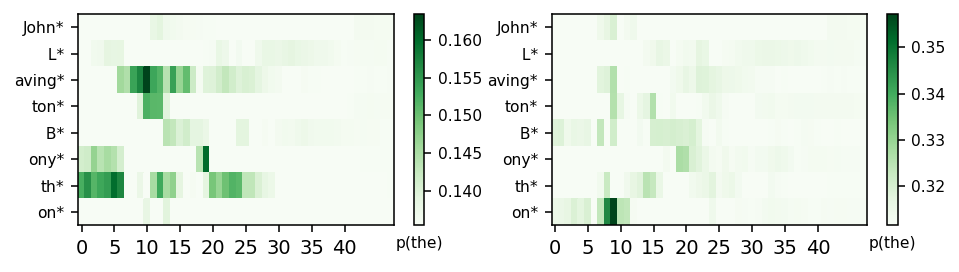

Which pair of patterns is most similar? Example 1 or 2?
If both are equally simlar, write '3'. If none are remotely similar, write '0'.
0
--------------------------------------------------------------------------
Example 1 (top candidate token) 'John  L aving ton  B ony th on  was  native  to'
--------------------------------------------------------------------------


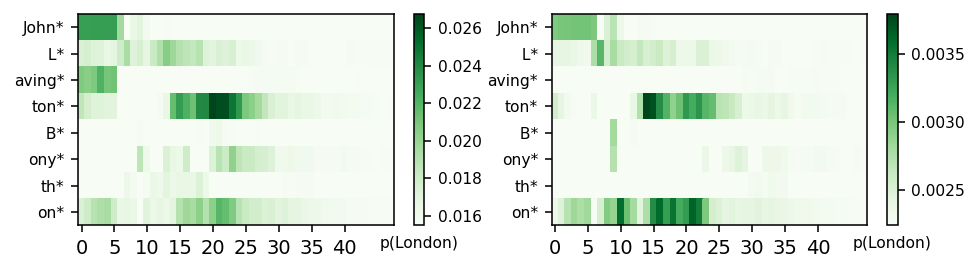

--------------------------------------------------------------------------
Example 2 (top candidate token) 'John  L aving ton  B ony th on  originated  from'
--------------------------------------------------------------------------


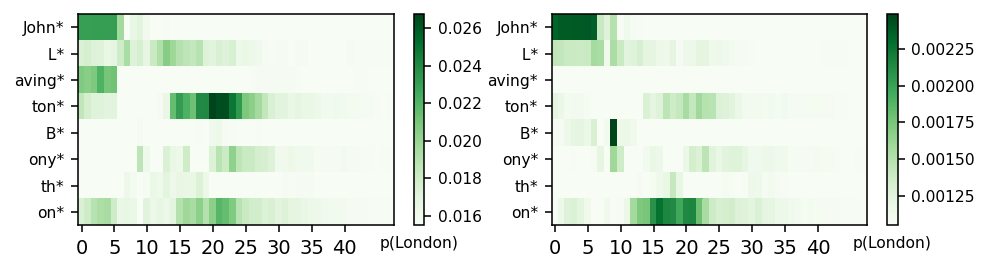

Which pair of patterns is most similar? Example 1 or 2?
If both are equally simlar, write '3'. If none are remotely similar, write '0'.
1
SAMPLE 37 out of 100
--------------------------------------------------------------------------
Example 1 (top any token) 'K on rad  Aden auer  originated  from'
--------------------------------------------------------------------------


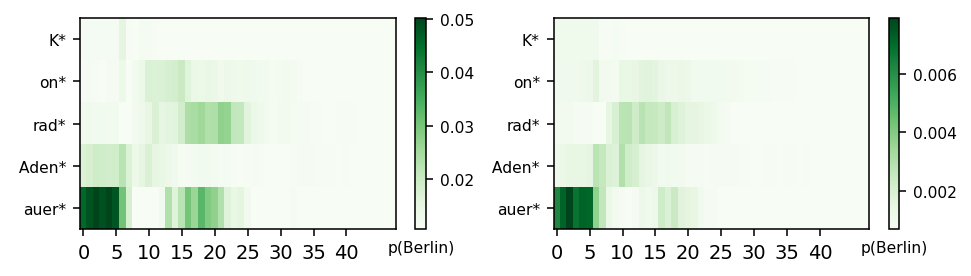

--------------------------------------------------------------------------
Example 2 (top any token) 'K on rad  Aden auer  was  originally  from'
--------------------------------------------------------------------------


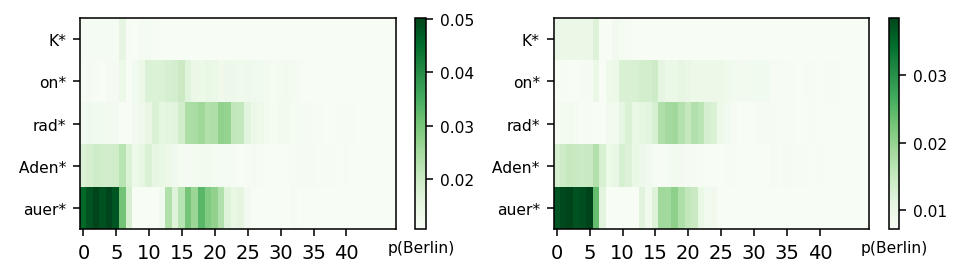

Which pair of patterns is most similar? Example 1 or 2?
If both are equally simlar, write '3'. If none are remotely similar, write '0'.
2
--------------------------------------------------------------------------
Example 1 (top candidate token) 'K on rad  Aden auer  originated  from'
--------------------------------------------------------------------------


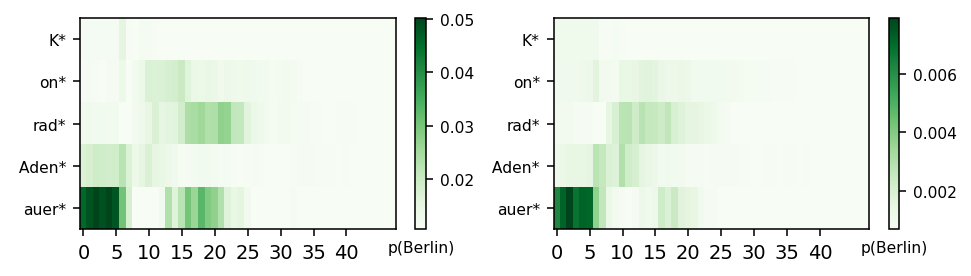

--------------------------------------------------------------------------
Example 2 (top candidate token) 'K on rad  Aden auer  was  originally  from'
--------------------------------------------------------------------------


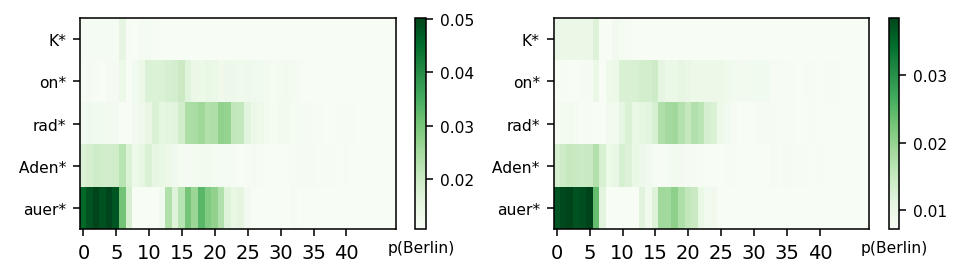

Which pair of patterns is most similar? Example 1 or 2?
If both are equally simlar, write '3'. If none are remotely similar, write '0'.
2
SAMPLE 38 out of 100
--------------------------------------------------------------------------
Example 1 (top any token) 'Ph yll is  Baker  origin ates  from'
--------------------------------------------------------------------------


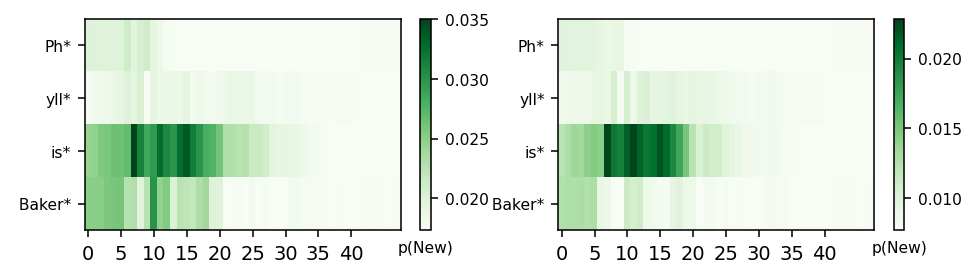

--------------------------------------------------------------------------
Example 2 (top any token) 'Ph yll is  Baker  is  originally  from'
--------------------------------------------------------------------------


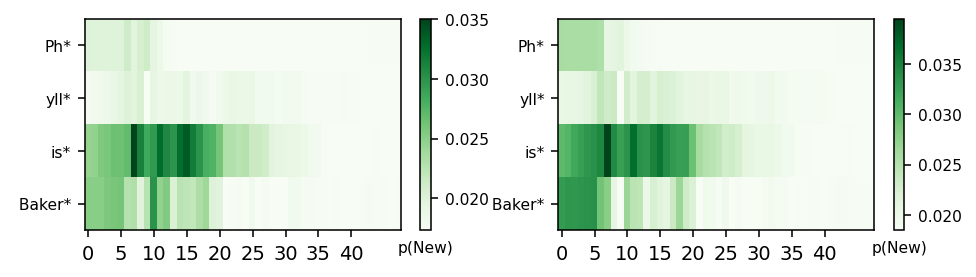

Which pair of patterns is most similar? Example 1 or 2?
If both are equally simlar, write '3'. If none are remotely similar, write '0'.
1
--------------------------------------------------------------------------
Example 1 (top candidate token) 'Ph yll is  Baker  origin ates  from'
--------------------------------------------------------------------------


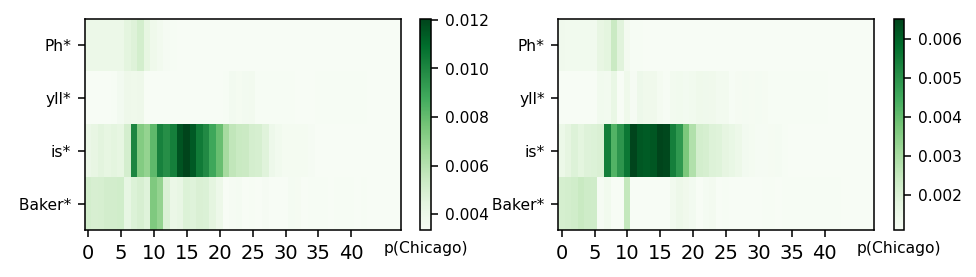

--------------------------------------------------------------------------
Example 2 (top candidate token) 'Ph yll is  Baker  is  originally  from'
--------------------------------------------------------------------------


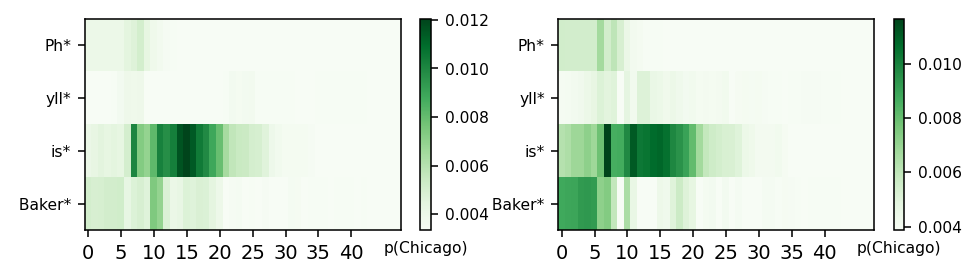

Which pair of patterns is most similar? Example 1 or 2?
If both are equally simlar, write '3'. If none are remotely similar, write '0'.
3
SAMPLE 39 out of 100
--------------------------------------------------------------------------
Example 1 (top any token) 'Charles  Henry  Ross  is  originally  from'
--------------------------------------------------------------------------


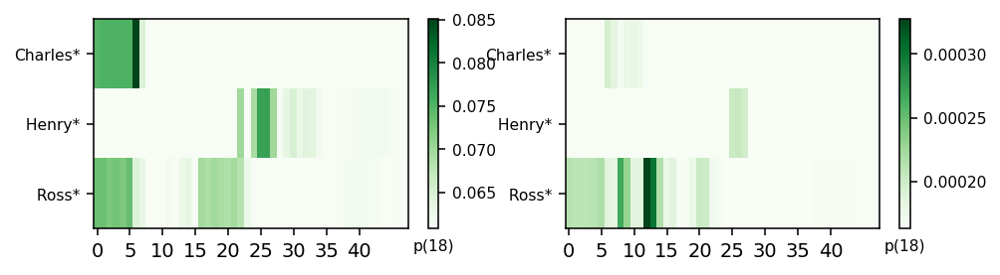

--------------------------------------------------------------------------
Example 2 (top any token) 'Charles  Henry  Ross  origin ates  from'
--------------------------------------------------------------------------


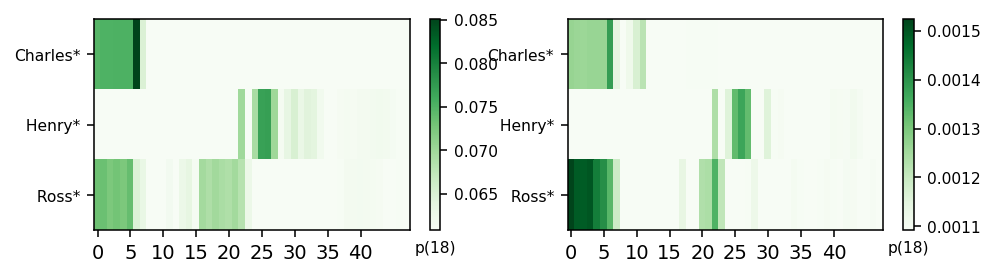

Which pair of patterns is most similar? Example 1 or 2?
If both are equally simlar, write '3'. If none are remotely similar, write '0'.
2
--------------------------------------------------------------------------
Example 1 (top candidate token) 'Charles  Henry  Ross  is  originally  from'
--------------------------------------------------------------------------


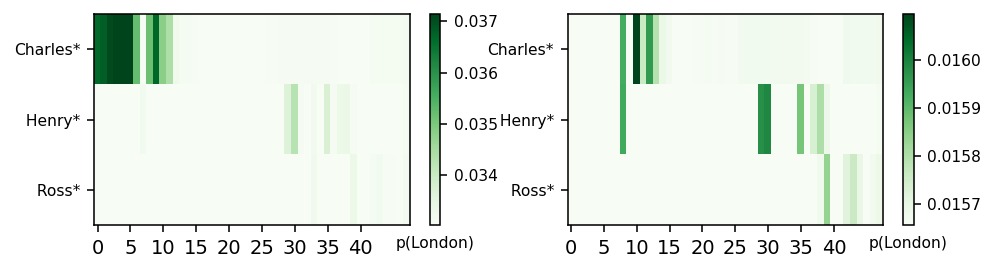

--------------------------------------------------------------------------
Example 2 (top candidate token) 'Charles  Henry  Ross  origin ates  from'
--------------------------------------------------------------------------


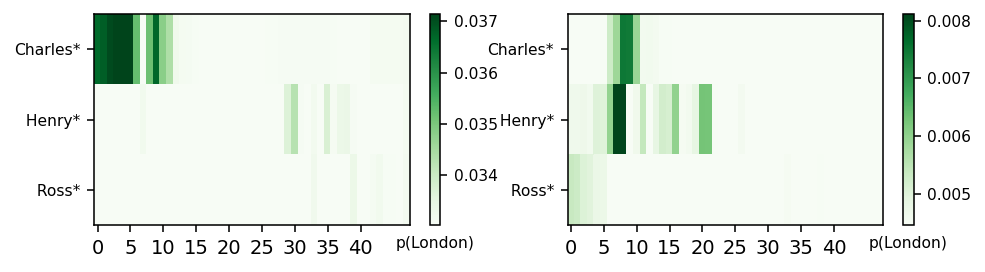

Which pair of patterns is most similar? Example 1 or 2?
If both are equally simlar, write '3'. If none are remotely similar, write '0'.
1
SAMPLE 40 out of 100
--------------------------------------------------------------------------
Example 1 (top any token) 'Charles  Am irk han ian  was  native  to'
--------------------------------------------------------------------------


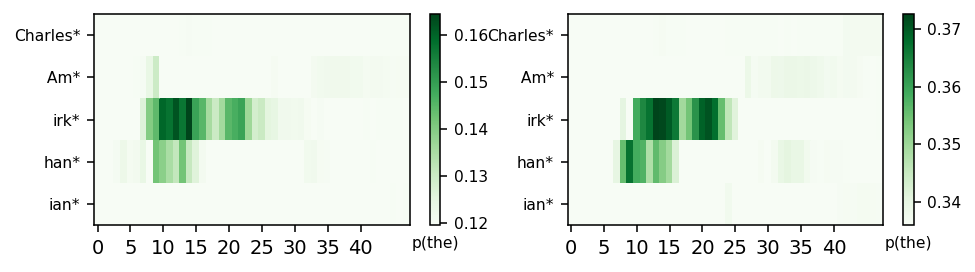

--------------------------------------------------------------------------
Example 2 (top any token) 'Charles  Am irk han ian  originated  from'
--------------------------------------------------------------------------


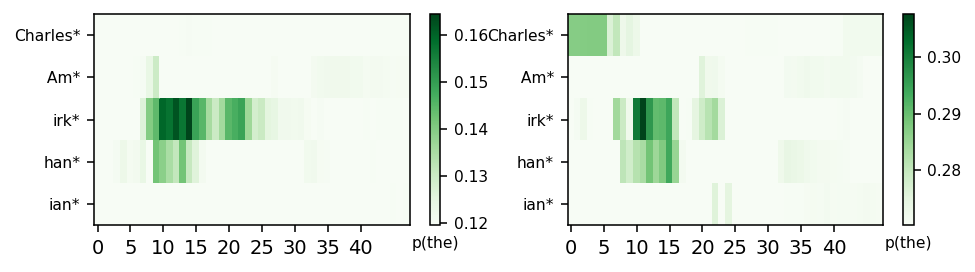

Which pair of patterns is most similar? Example 1 or 2?
If both are equally simlar, write '3'. If none are remotely similar, write '0'.
1
--------------------------------------------------------------------------
Example 1 (top candidate token) 'Charles  Am irk han ian  was  native  to'
--------------------------------------------------------------------------


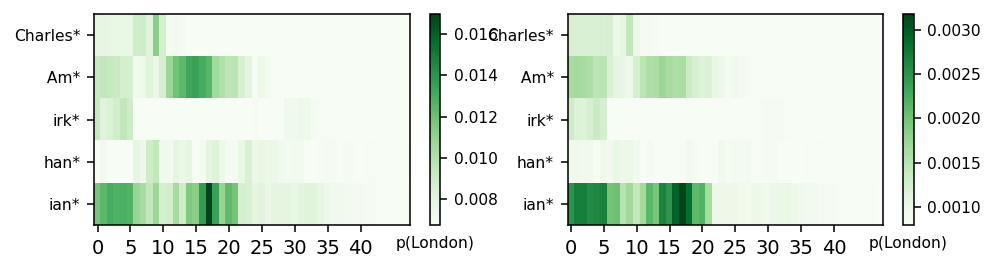

--------------------------------------------------------------------------
Example 2 (top candidate token) 'Charles  Am irk han ian  originated  from'
--------------------------------------------------------------------------


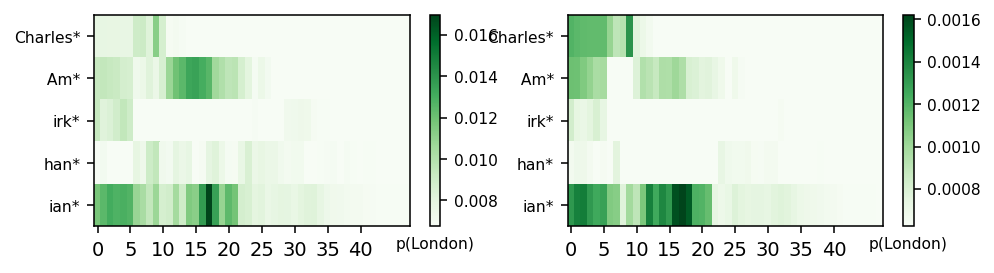

Which pair of patterns is most similar? Example 1 or 2?
If both are equally simlar, write '3'. If none are remotely similar, write '0'.
3
SAMPLE 41 out of 100
--------------------------------------------------------------------------
Example 1 (top any token) 'Sam uel  De  Wilde  was  originally  from'
--------------------------------------------------------------------------


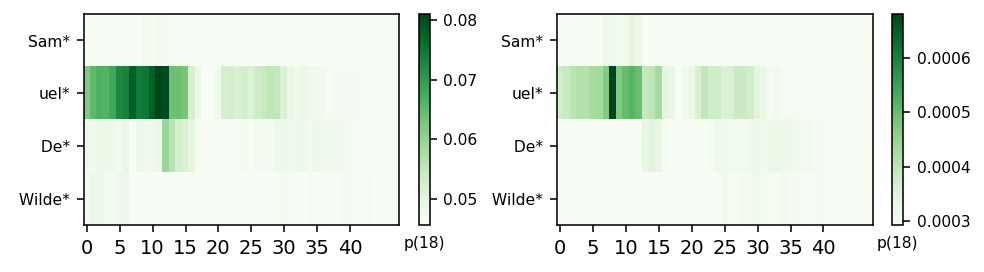

--------------------------------------------------------------------------
Example 2 (top any token) 'Sam uel  De  Wilde  originated  from'
--------------------------------------------------------------------------


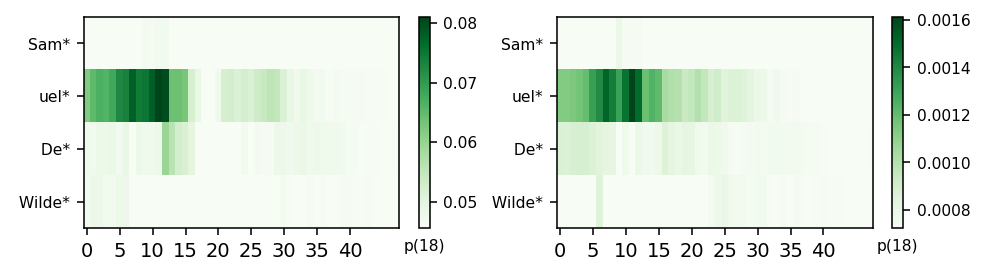

Which pair of patterns is most similar? Example 1 or 2?
If both are equally simlar, write '3'. If none are remotely similar, write '0'.
3
--------------------------------------------------------------------------
Example 1 (top candidate token) 'Sam uel  De  Wilde  was  originally  from'
--------------------------------------------------------------------------


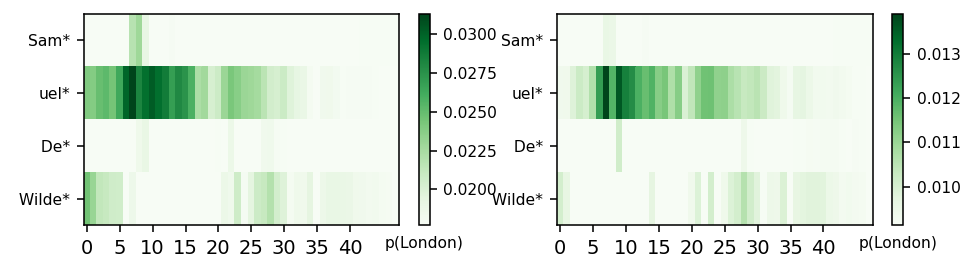

--------------------------------------------------------------------------
Example 2 (top candidate token) 'Sam uel  De  Wilde  originated  from'
--------------------------------------------------------------------------


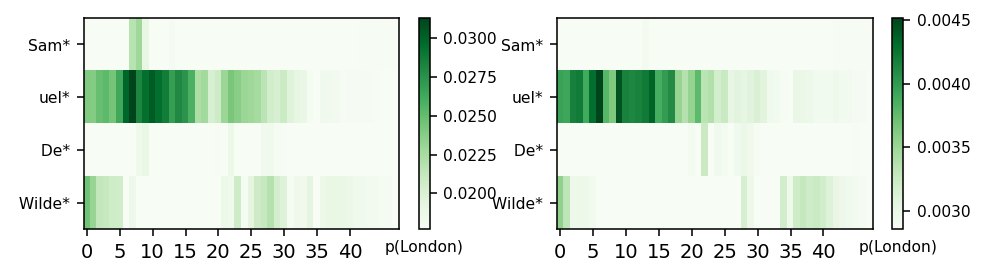

Which pair of patterns is most similar? Example 1 or 2?
If both are equally simlar, write '3'. If none are remotely similar, write '0'.
3
SAMPLE 42 out of 100
--------------------------------------------------------------------------
Example 1 (top any token) 'Me h di  Hos se ini  is  native  to'
--------------------------------------------------------------------------


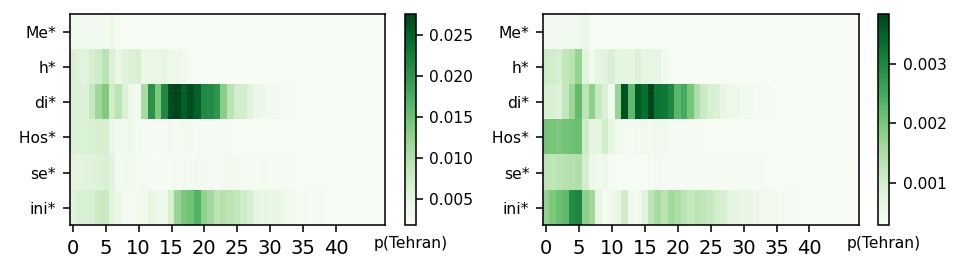

--------------------------------------------------------------------------
Example 2 (top any token) 'Me h di  Hos se ini  origin ates  from'
--------------------------------------------------------------------------


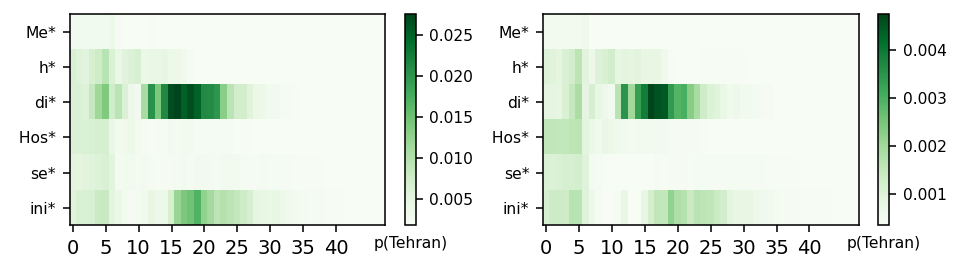

Which pair of patterns is most similar? Example 1 or 2?
If both are equally simlar, write '3'. If none are remotely similar, write '0'.
2
--------------------------------------------------------------------------
Example 1 (top candidate token) 'Me h di  Hos se ini  is  native  to'
--------------------------------------------------------------------------


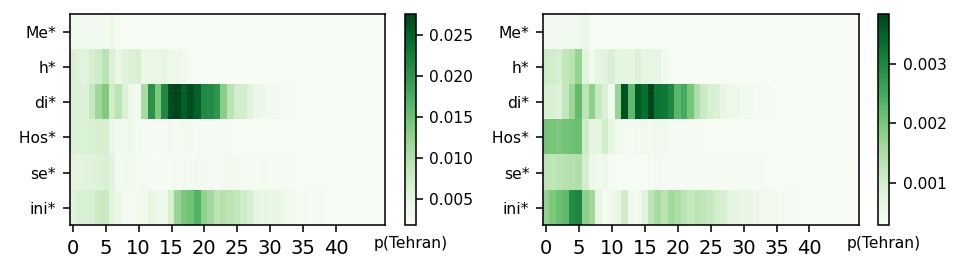

--------------------------------------------------------------------------
Example 2 (top candidate token) 'Me h di  Hos se ini  origin ates  from'
--------------------------------------------------------------------------


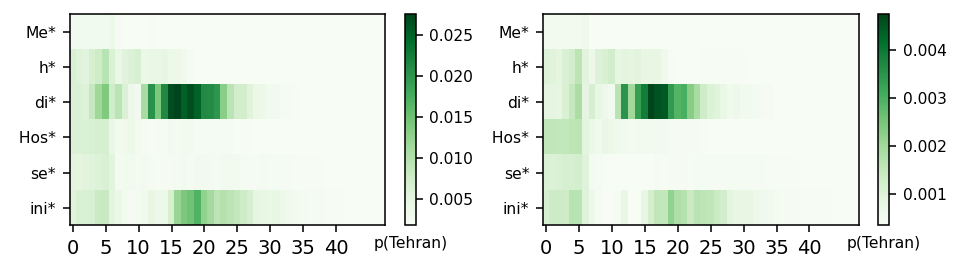

Which pair of patterns is most similar? Example 1 or 2?
If both are equally simlar, write '3'. If none are remotely similar, write '0'.
2
SAMPLE 43 out of 100
--------------------------------------------------------------------------
Example 1 (top any token) 'Su j ata  Mas sey  origin ates  from'
--------------------------------------------------------------------------


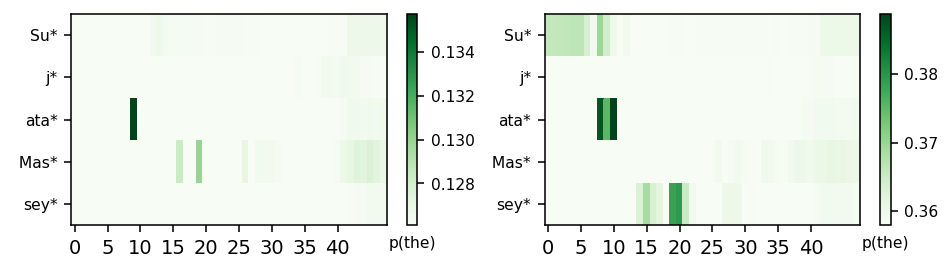

--------------------------------------------------------------------------
Example 2 (top any token) 'Su j ata  Mas sey  was  native  to'
--------------------------------------------------------------------------


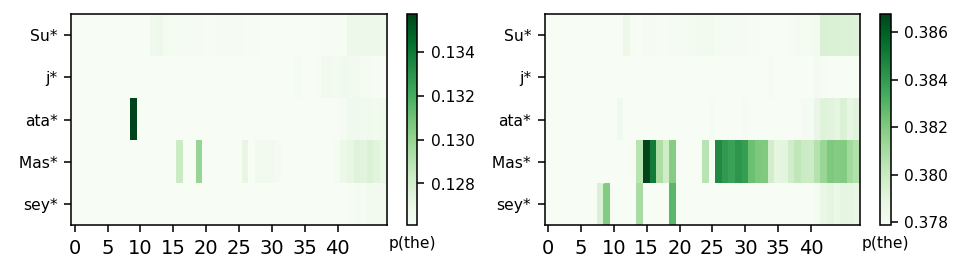

Which pair of patterns is most similar? Example 1 or 2?
If both are equally simlar, write '3'. If none are remotely similar, write '0'.
0
--------------------------------------------------------------------------
Example 1 (top candidate token) 'Su j ata  Mas sey  origin ates  from'
--------------------------------------------------------------------------


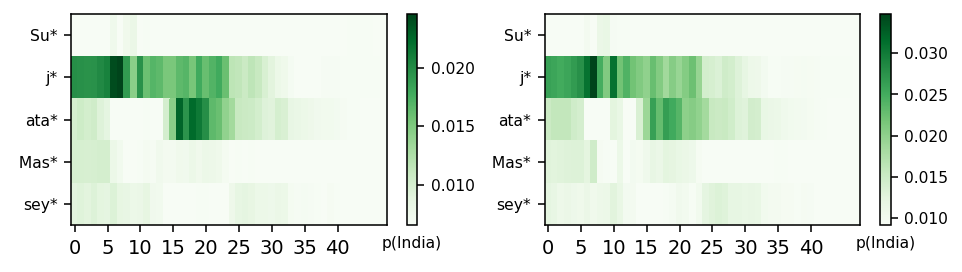

--------------------------------------------------------------------------
Example 2 (top candidate token) 'Su j ata  Mas sey  was  native  to'
--------------------------------------------------------------------------


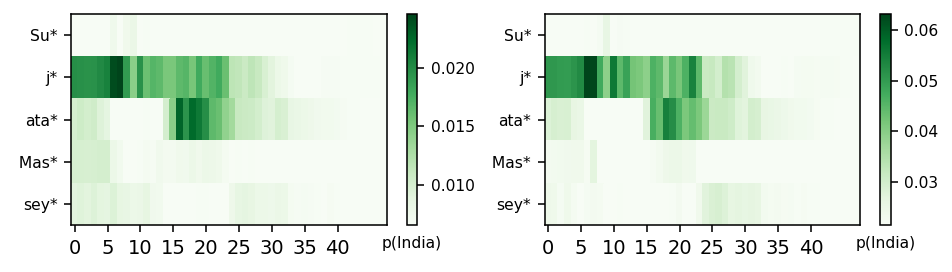

Which pair of patterns is most similar? Example 1 or 2?
If both are equally simlar, write '3'. If none are remotely similar, write '0'.
3
SAMPLE 44 out of 100
--------------------------------------------------------------------------
Example 1 (top any token) 'I bn  Haw q al  was  originally  from'
--------------------------------------------------------------------------


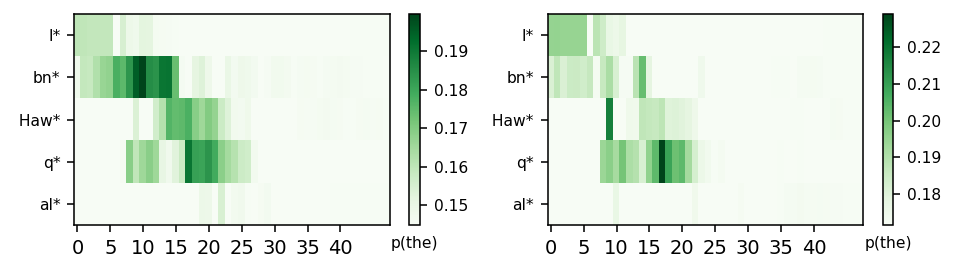

--------------------------------------------------------------------------
Example 2 (top any token) 'I bn  Haw q al  is  native  to'
--------------------------------------------------------------------------


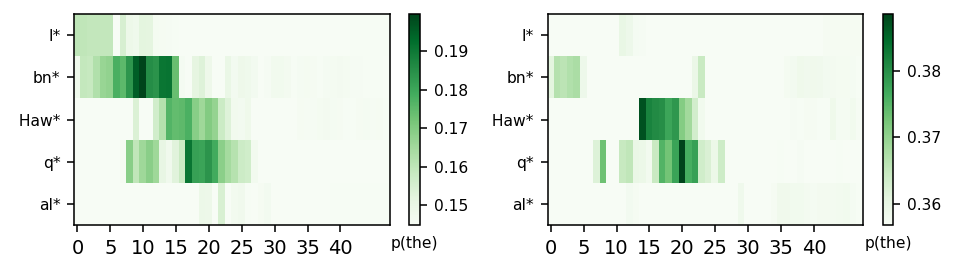

Which pair of patterns is most similar? Example 1 or 2?
If both are equally simlar, write '3'. If none are remotely similar, write '0'.
3
--------------------------------------------------------------------------
Example 1 (top candidate token) 'I bn  Haw q al  was  originally  from'
--------------------------------------------------------------------------


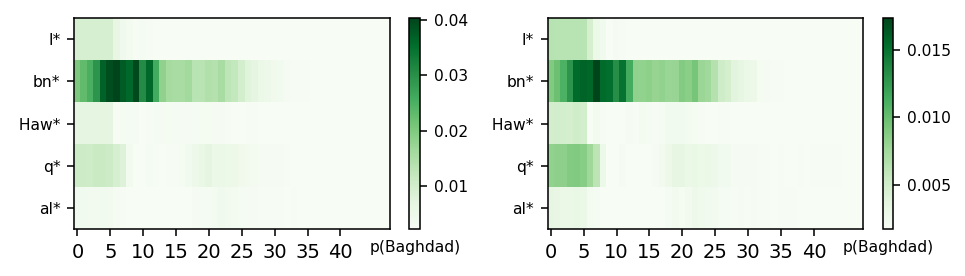

--------------------------------------------------------------------------
Example 2 (top candidate token) 'I bn  Haw q al  is  native  to'
--------------------------------------------------------------------------


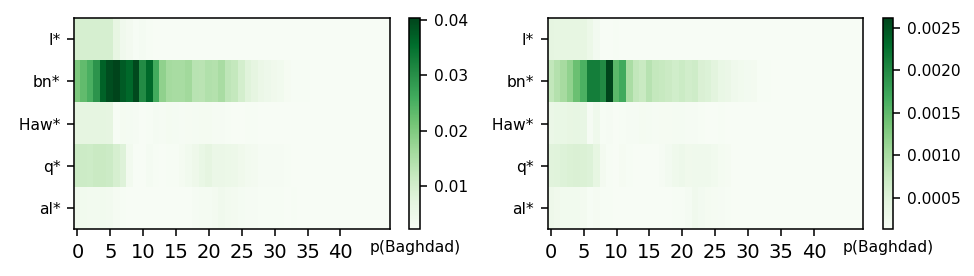

Which pair of patterns is most similar? Example 1 or 2?
If both are equally simlar, write '3'. If none are remotely similar, write '0'.
3
SAMPLE 45 out of 100
--------------------------------------------------------------------------
Example 1 (top any token) 'Daniel  Man anta  origin ates  from'
--------------------------------------------------------------------------


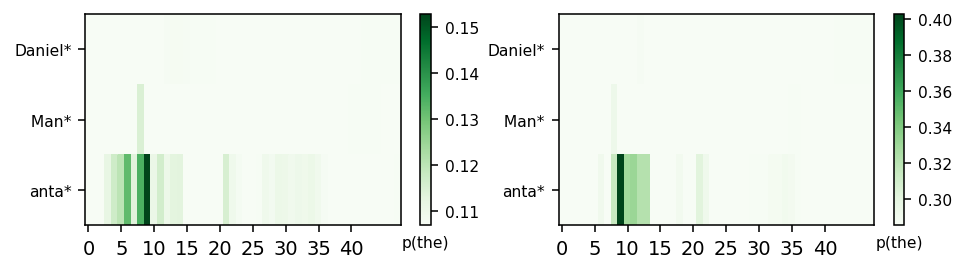

--------------------------------------------------------------------------
Example 2 (top any token) 'Daniel  Man anta  is  native  to'
--------------------------------------------------------------------------


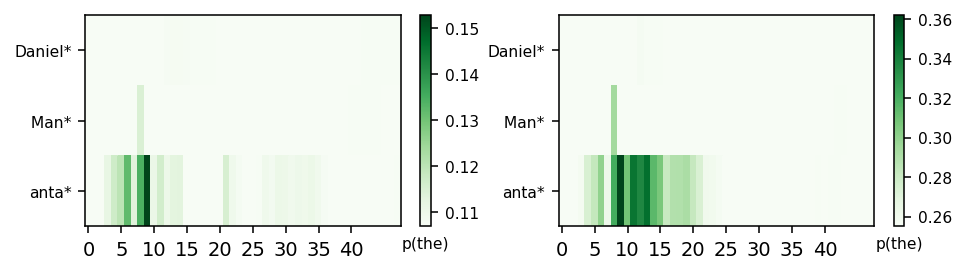

Which pair of patterns is most similar? Example 1 or 2?
If both are equally simlar, write '3'. If none are remotely similar, write '0'.
3
--------------------------------------------------------------------------
Example 1 (top candidate token) 'Daniel  Man anta  origin ates  from'
--------------------------------------------------------------------------


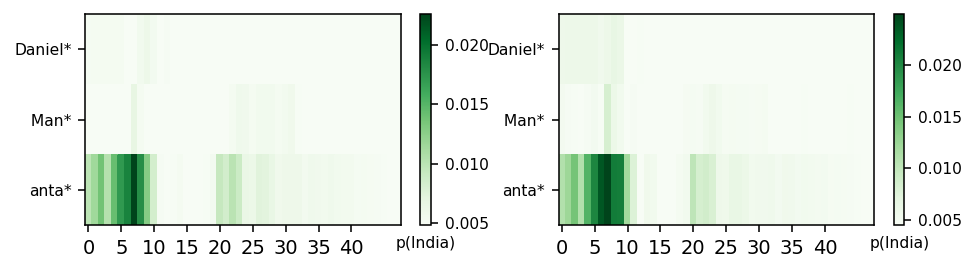

--------------------------------------------------------------------------
Example 2 (top candidate token) 'Daniel  Man anta  is  native  to'
--------------------------------------------------------------------------


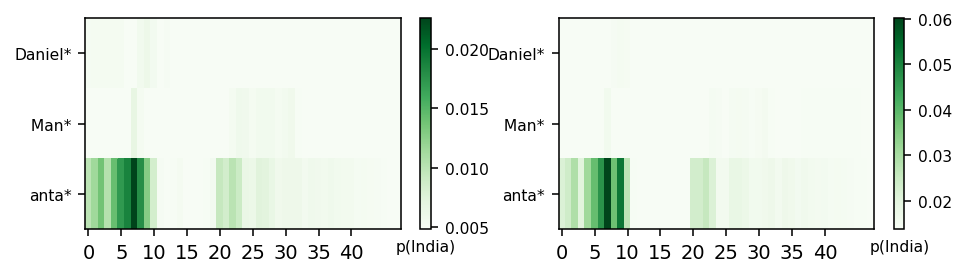

Which pair of patterns is most similar? Example 1 or 2?
If both are equally simlar, write '3'. If none are remotely similar, write '0'.
3
SAMPLE 46 out of 100
--------------------------------------------------------------------------
Example 1 (top any token) 'Albert  Richardson  was  native  to'
--------------------------------------------------------------------------


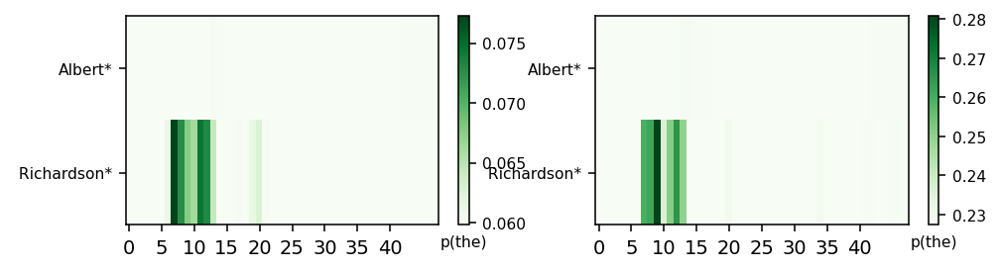

--------------------------------------------------------------------------
Example 2 (top any token) 'Albert  Richardson  is  native  to'
--------------------------------------------------------------------------


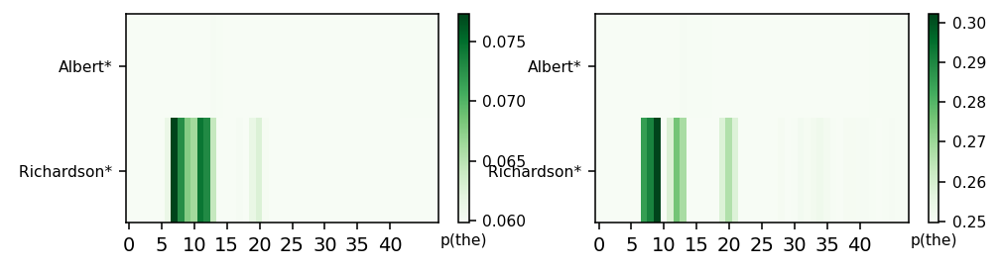

Which pair of patterns is most similar? Example 1 or 2?
If both are equally simlar, write '3'. If none are remotely similar, write '0'.
3
--------------------------------------------------------------------------
Example 1 (top candidate token) 'Albert  Richardson  was  native  to'
--------------------------------------------------------------------------


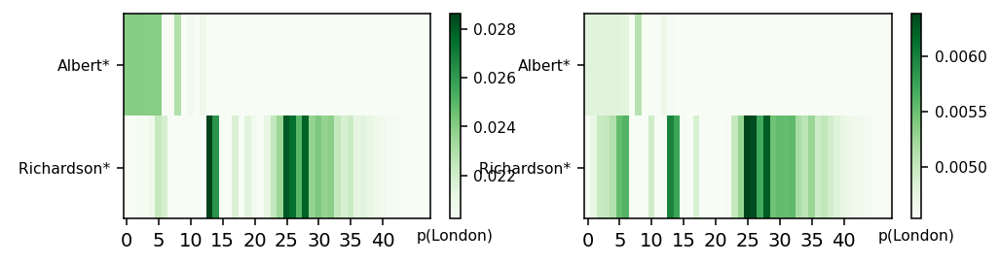

--------------------------------------------------------------------------
Example 2 (top candidate token) 'Albert  Richardson  is  native  to'
--------------------------------------------------------------------------


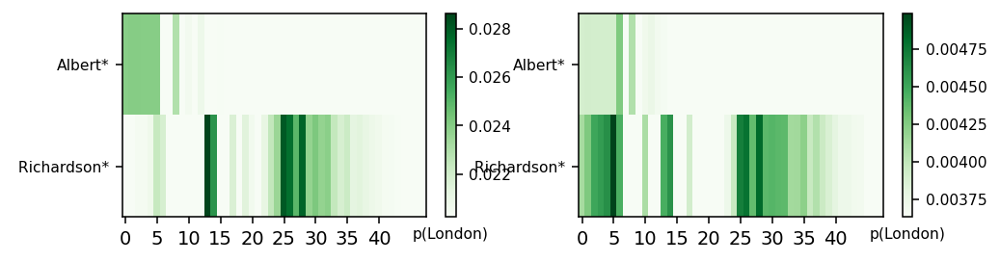

Which pair of patterns is most similar? Example 1 or 2?
If both are equally simlar, write '3'. If none are remotely similar, write '0'.
3
SAMPLE 47 out of 100
--------------------------------------------------------------------------
Example 1 (top any token) 'H ank  Shaw  was  originally  from'
--------------------------------------------------------------------------


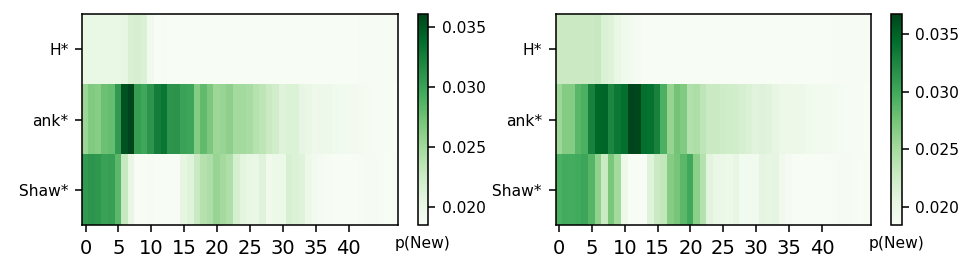

--------------------------------------------------------------------------
Example 2 (top any token) 'H ank  Shaw  was  native  to'
--------------------------------------------------------------------------


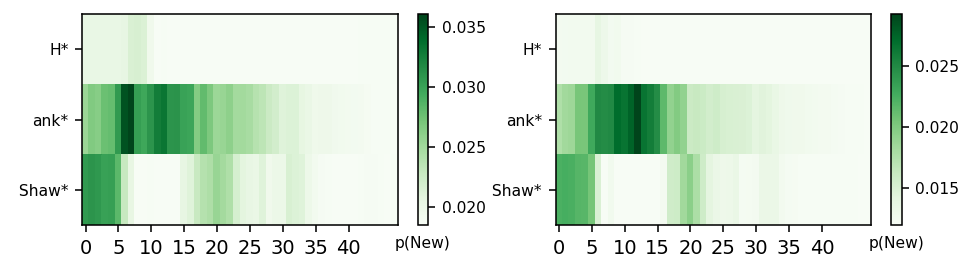

Which pair of patterns is most similar? Example 1 or 2?
If both are equally simlar, write '3'. If none are remotely similar, write '0'.
3
--------------------------------------------------------------------------
Example 1 (top candidate token) 'H ank  Shaw  was  originally  from'
--------------------------------------------------------------------------


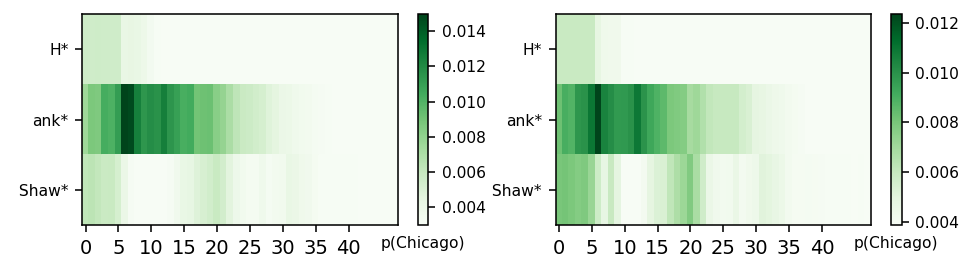

--------------------------------------------------------------------------
Example 2 (top candidate token) 'H ank  Shaw  was  native  to'
--------------------------------------------------------------------------


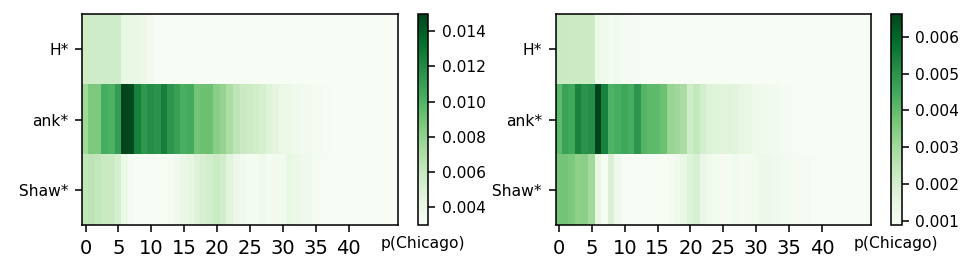

Which pair of patterns is most similar? Example 1 or 2?
If both are equally simlar, write '3'. If none are remotely similar, write '0'.
3
SAMPLE 48 out of 100
--------------------------------------------------------------------------
Example 1 (top any token) 'Ger ard  Lee  was  originally  from'
--------------------------------------------------------------------------


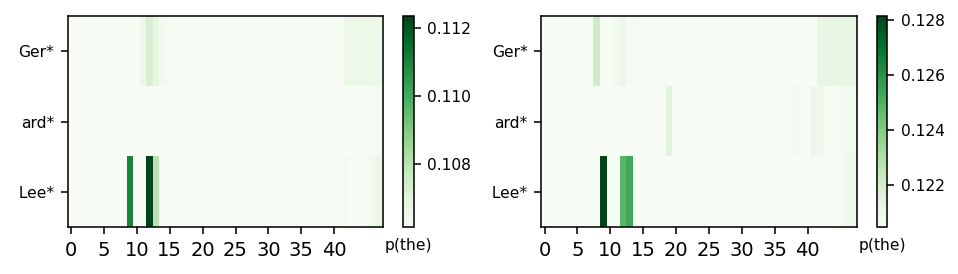

--------------------------------------------------------------------------
Example 2 (top any token) 'Ger ard  Lee  is  originally  from'
--------------------------------------------------------------------------


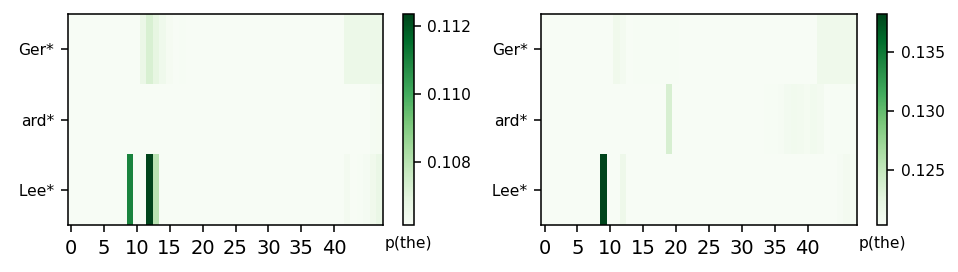

Which pair of patterns is most similar? Example 1 or 2?
If both are equally simlar, write '3'. If none are remotely similar, write '0'.
1
--------------------------------------------------------------------------
Example 1 (top candidate token) 'Ger ard  Lee  was  originally  from'
--------------------------------------------------------------------------


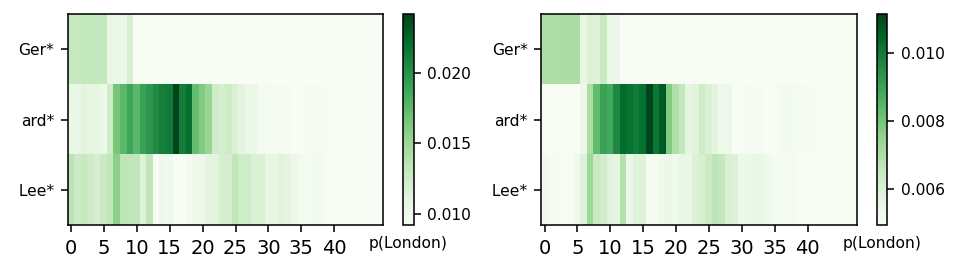

--------------------------------------------------------------------------
Example 2 (top candidate token) 'Ger ard  Lee  is  originally  from'
--------------------------------------------------------------------------


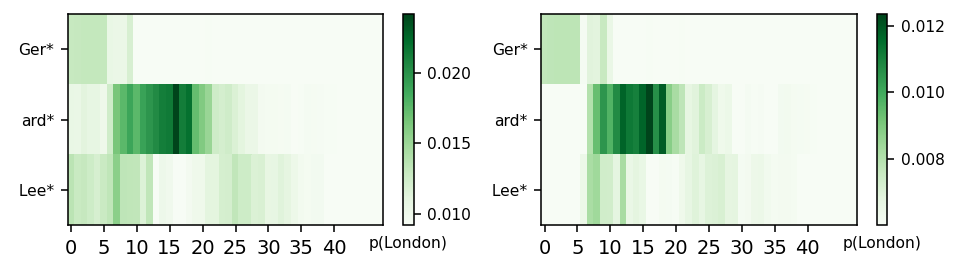

Which pair of patterns is most similar? Example 1 or 2?
If both are equally simlar, write '3'. If none are remotely similar, write '0'.
3
SAMPLE 49 out of 100
--------------------------------------------------------------------------
Example 1 (top any token) 'Bon if ace  III  origin ates  from'
--------------------------------------------------------------------------


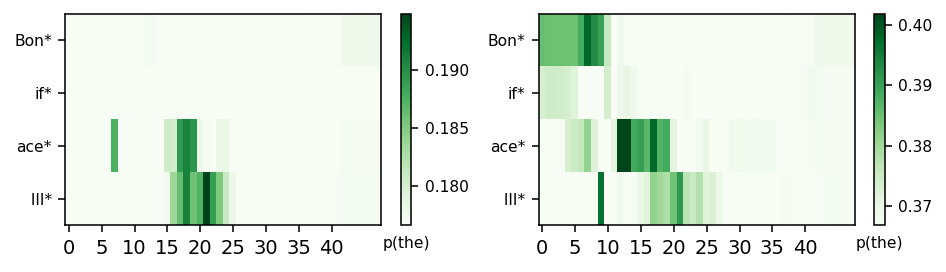

--------------------------------------------------------------------------
Example 2 (top any token) 'Bon if ace  III  originated  from'
--------------------------------------------------------------------------


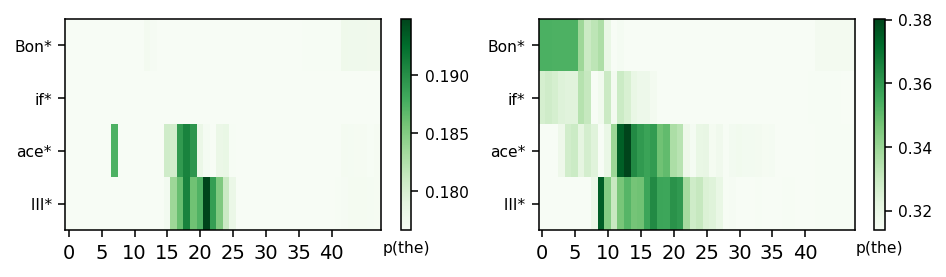

Which pair of patterns is most similar? Example 1 or 2?
If both are equally simlar, write '3'. If none are remotely similar, write '0'.
0
--------------------------------------------------------------------------
Example 1 (top candidate token) 'Bon if ace  III  origin ates  from'
--------------------------------------------------------------------------


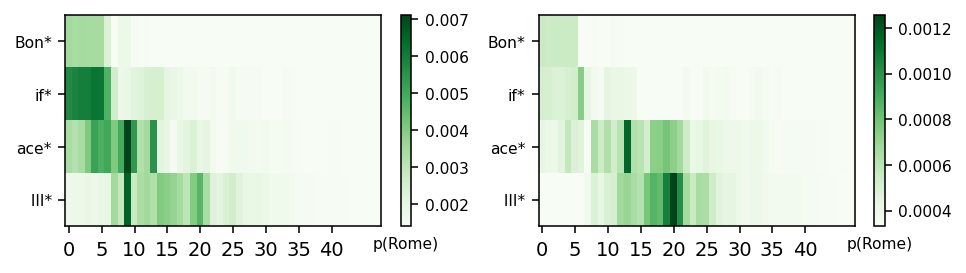

--------------------------------------------------------------------------
Example 2 (top candidate token) 'Bon if ace  III  originated  from'
--------------------------------------------------------------------------


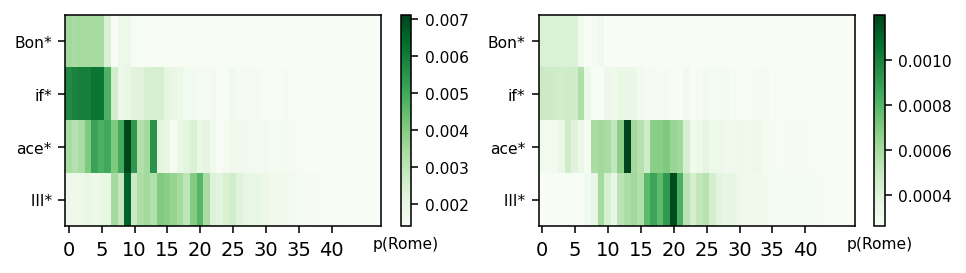

Which pair of patterns is most similar? Example 1 or 2?
If both are equally simlar, write '3'. If none are remotely similar, write '0'.
3
SAMPLE 50 out of 100
--------------------------------------------------------------------------
Example 1 (top any token) 'E thel  Griff ies  is  originally  from'
--------------------------------------------------------------------------


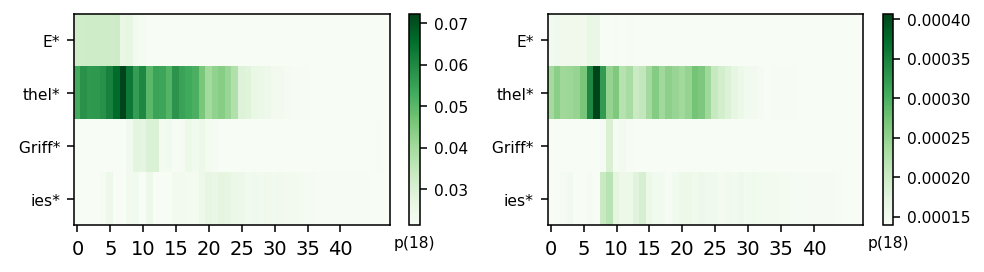

--------------------------------------------------------------------------
Example 2 (top any token) 'E thel  Griff ies  is  native  to'
--------------------------------------------------------------------------


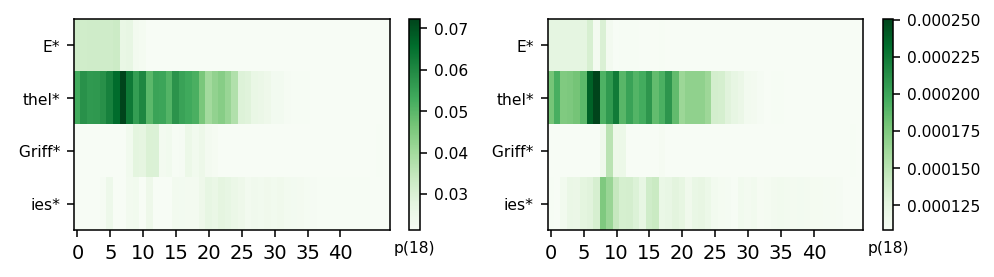

Which pair of patterns is most similar? Example 1 or 2?
If both are equally simlar, write '3'. If none are remotely similar, write '0'.
3
--------------------------------------------------------------------------
Example 1 (top candidate token) 'E thel  Griff ies  is  originally  from'
--------------------------------------------------------------------------


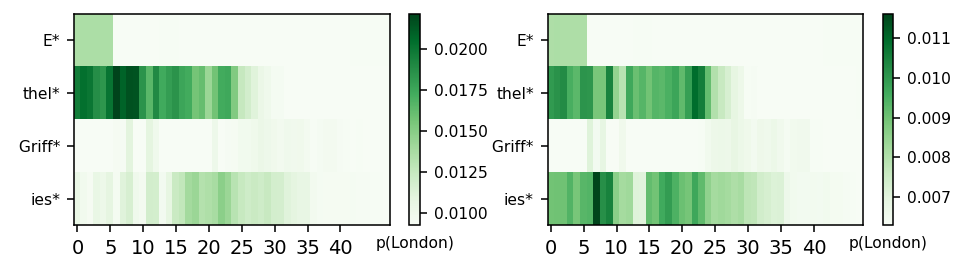

--------------------------------------------------------------------------
Example 2 (top candidate token) 'E thel  Griff ies  is  native  to'
--------------------------------------------------------------------------


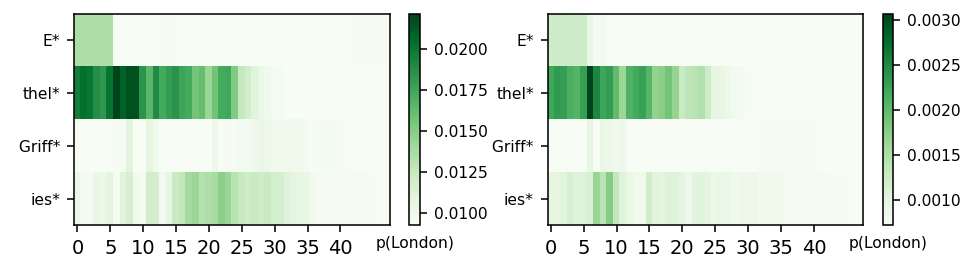

Which pair of patterns is most similar? Example 1 or 2?
If both are equally simlar, write '3'. If none are remotely similar, write '0'.
3
SAMPLE 51 out of 100
--------------------------------------------------------------------------
Example 1 (top any token) 'Fox  Butter field  origin ates  from'
--------------------------------------------------------------------------


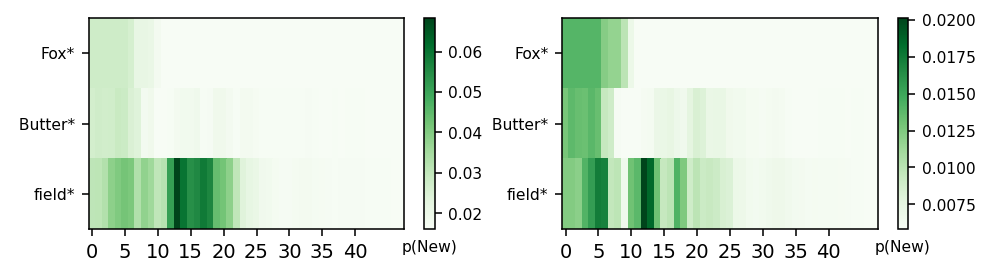

--------------------------------------------------------------------------
Example 2 (top any token) 'Fox  Butter field  originated  from'
--------------------------------------------------------------------------


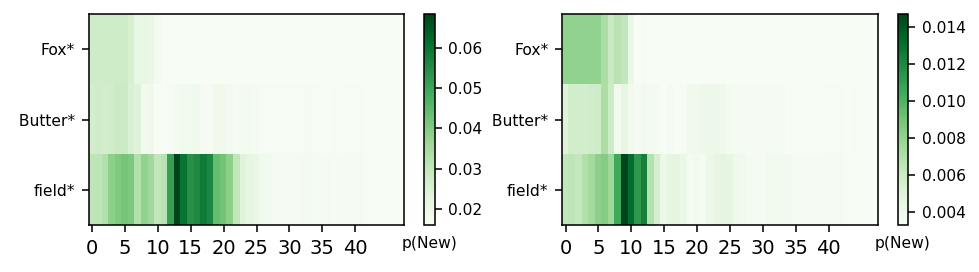

Which pair of patterns is most similar? Example 1 or 2?
If both are equally simlar, write '3'. If none are remotely similar, write '0'.
0
--------------------------------------------------------------------------
Example 1 (top candidate token) 'Fox  Butter field  origin ates  from'
--------------------------------------------------------------------------


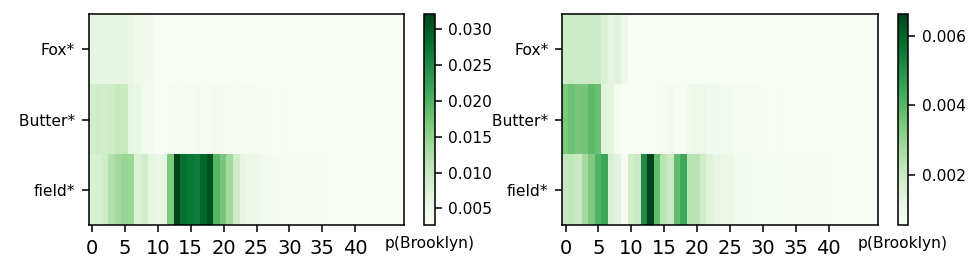

--------------------------------------------------------------------------
Example 2 (top candidate token) 'Fox  Butter field  originated  from'
--------------------------------------------------------------------------


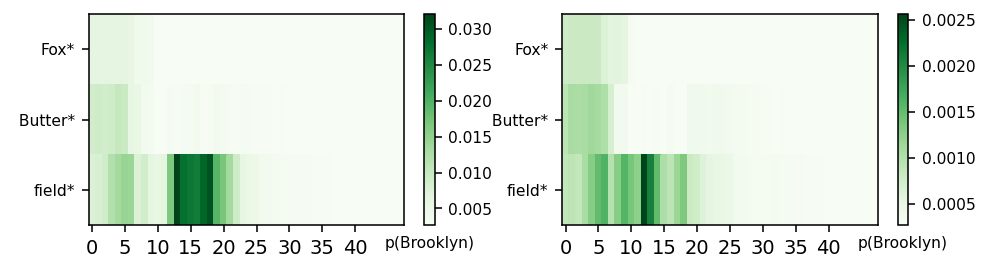

Which pair of patterns is most similar? Example 1 or 2?
If both are equally simlar, write '3'. If none are remotely similar, write '0'.
3
SAMPLE 52 out of 100
--------------------------------------------------------------------------
Example 1 (top any token) 'William  Carlos  Williams  is  originally  from'
--------------------------------------------------------------------------


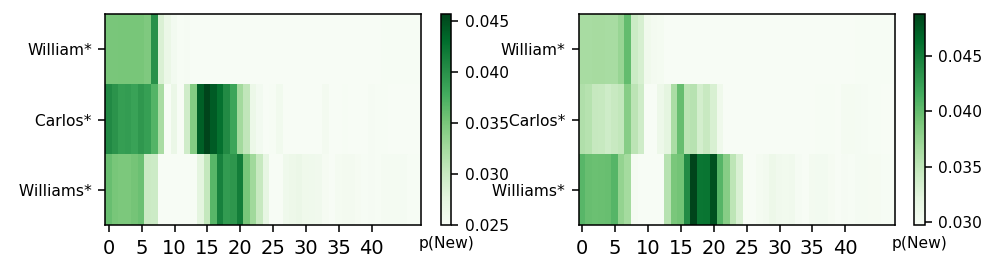

--------------------------------------------------------------------------
Example 2 (top any token) 'William  Carlos  Williams  was  native  to'
--------------------------------------------------------------------------


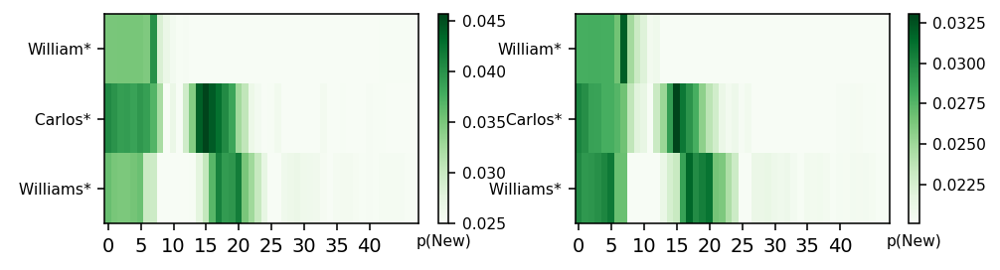

Which pair of patterns is most similar? Example 1 or 2?
If both are equally simlar, write '3'. If none are remotely similar, write '0'.
2
--------------------------------------------------------------------------
Example 1 (top candidate token) 'William  Carlos  Williams  is  originally  from'
--------------------------------------------------------------------------


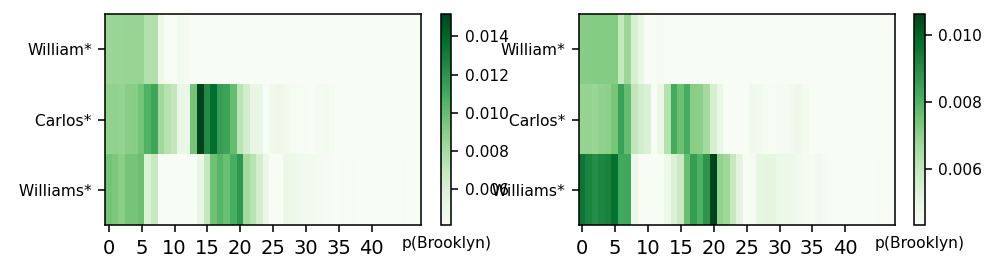

--------------------------------------------------------------------------
Example 2 (top candidate token) 'William  Carlos  Williams  was  native  to'
--------------------------------------------------------------------------


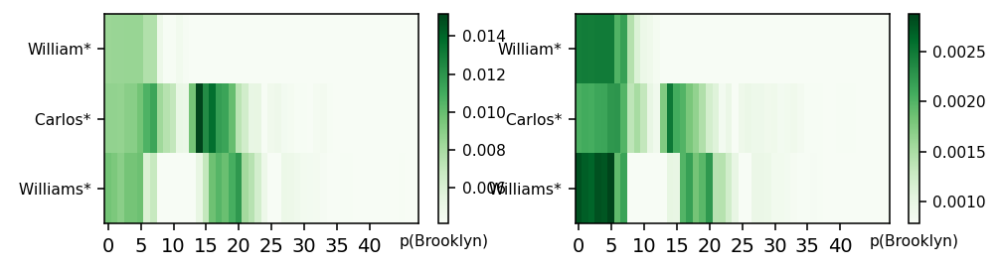

Which pair of patterns is most similar? Example 1 or 2?
If both are equally simlar, write '3'. If none are remotely similar, write '0'.
3
SAMPLE 53 out of 100
--------------------------------------------------------------------------
Example 1 (top any token) 'Richard  Pre b ble  origin ates  from'
--------------------------------------------------------------------------


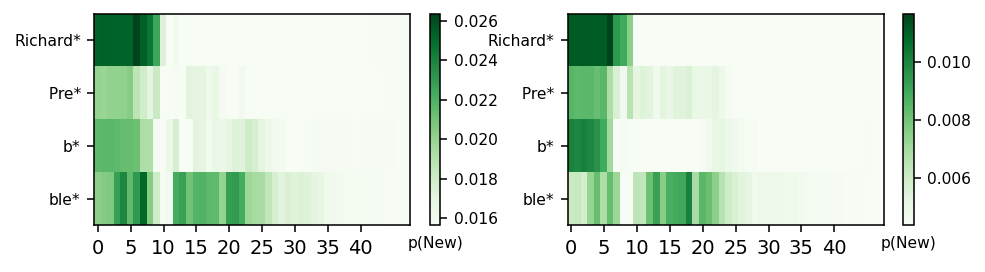

--------------------------------------------------------------------------
Example 2 (top any token) 'Richard  Pre b ble  was  native  to'
--------------------------------------------------------------------------


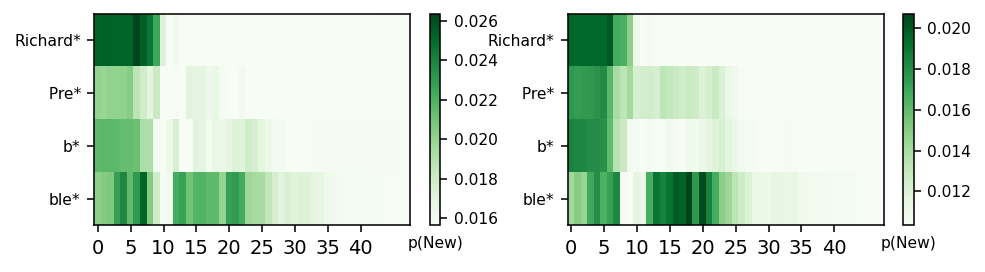

Which pair of patterns is most similar? Example 1 or 2?
If both are equally simlar, write '3'. If none are remotely similar, write '0'.
3
--------------------------------------------------------------------------
Example 1 (top candidate token) 'Richard  Pre b ble  origin ates  from'
--------------------------------------------------------------------------


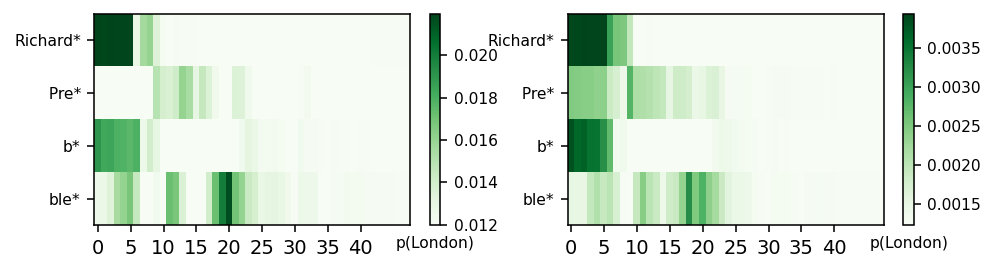

--------------------------------------------------------------------------
Example 2 (top candidate token) 'Richard  Pre b ble  was  native  to'
--------------------------------------------------------------------------


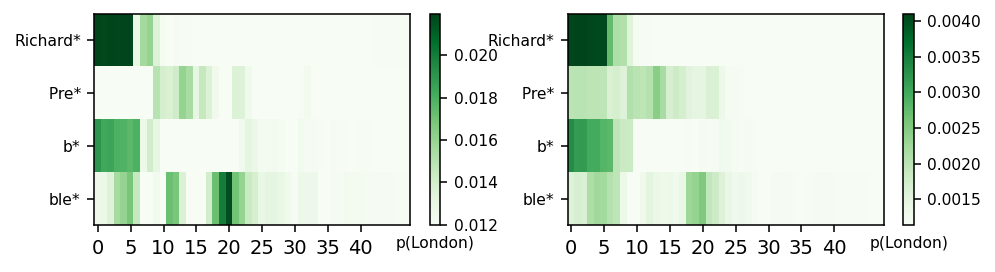

Which pair of patterns is most similar? Example 1 or 2?
If both are equally simlar, write '3'. If none are remotely similar, write '0'.
3
SAMPLE 54 out of 100
--------------------------------------------------------------------------
Example 1 (top any token) 'H aj ime  Miz og uchi  origin ates  from'
--------------------------------------------------------------------------


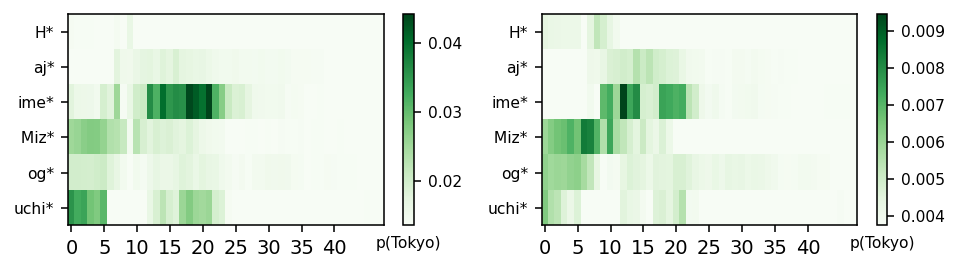

--------------------------------------------------------------------------
Example 2 (top any token) 'H aj ime  Miz og uchi  is  originally  from'
--------------------------------------------------------------------------


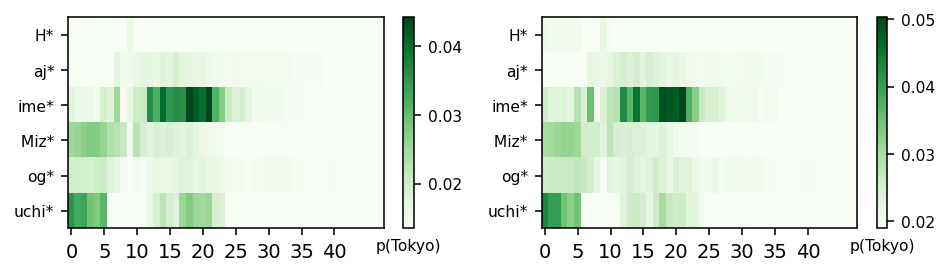

Which pair of patterns is most similar? Example 1 or 2?
If both are equally simlar, write '3'. If none are remotely similar, write '0'.
2
--------------------------------------------------------------------------
Example 1 (top candidate token) 'H aj ime  Miz og uchi  origin ates  from'
--------------------------------------------------------------------------


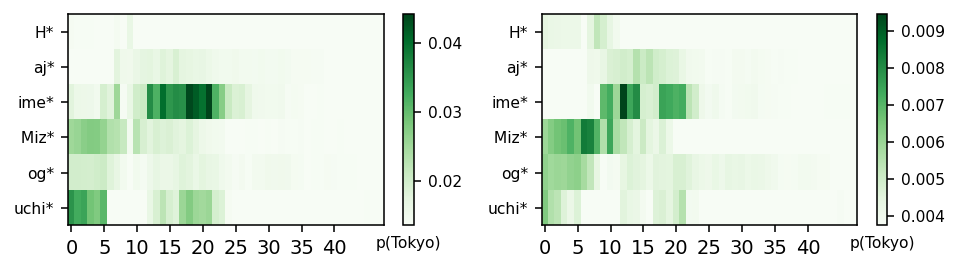

--------------------------------------------------------------------------
Example 2 (top candidate token) 'H aj ime  Miz og uchi  is  originally  from'
--------------------------------------------------------------------------


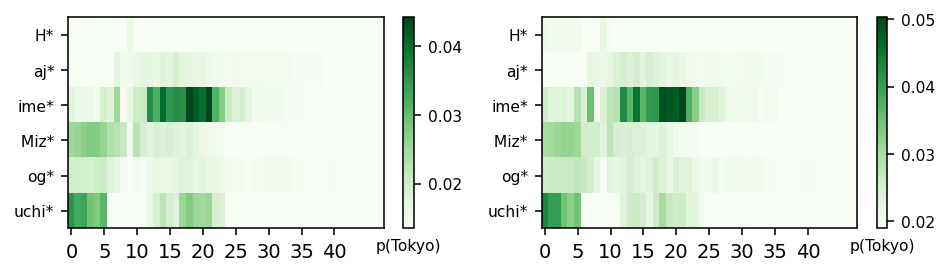

Which pair of patterns is most similar? Example 1 or 2?
If both are equally simlar, write '3'. If none are remotely similar, write '0'.
2
SAMPLE 55 out of 100
--------------------------------------------------------------------------
Example 1 (top any token) 'David  Mat r anga  is  originally  from'
--------------------------------------------------------------------------


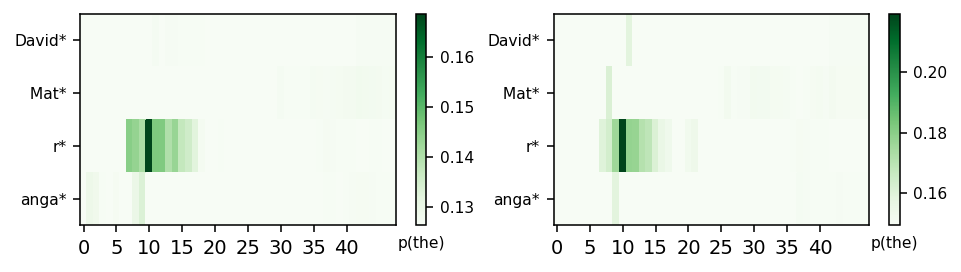

--------------------------------------------------------------------------
Example 2 (top any token) 'David  Mat r anga  was  native  to'
--------------------------------------------------------------------------


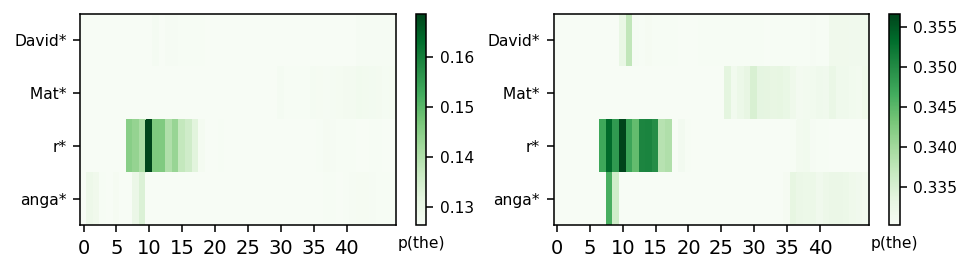

Which pair of patterns is most similar? Example 1 or 2?
If both are equally simlar, write '3'. If none are remotely similar, write '0'.
1
--------------------------------------------------------------------------
Example 1 (top candidate token) 'David  Mat r anga  is  originally  from'
--------------------------------------------------------------------------


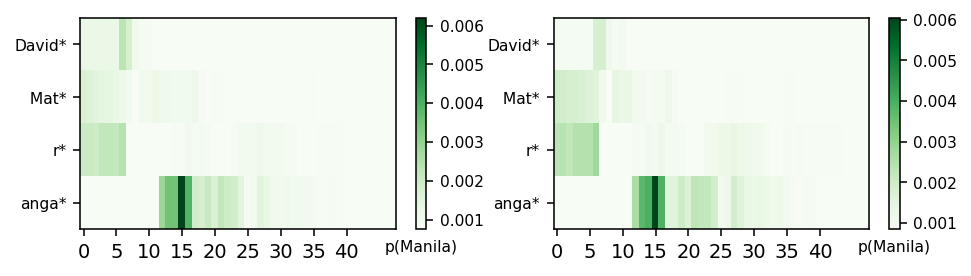

--------------------------------------------------------------------------
Example 2 (top candidate token) 'David  Mat r anga  was  native  to'
--------------------------------------------------------------------------


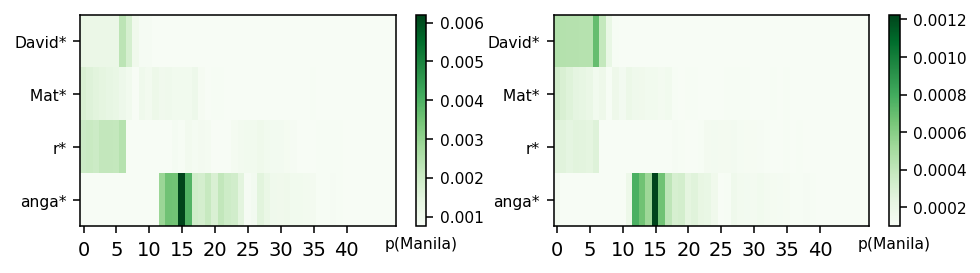

Which pair of patterns is most similar? Example 1 or 2?
If both are equally simlar, write '3'. If none are remotely similar, write '0'.
3
SAMPLE 56 out of 100
--------------------------------------------------------------------------
Example 1 (top any token) 'Wil f rid  Pel let ier  was  native  to'
--------------------------------------------------------------------------


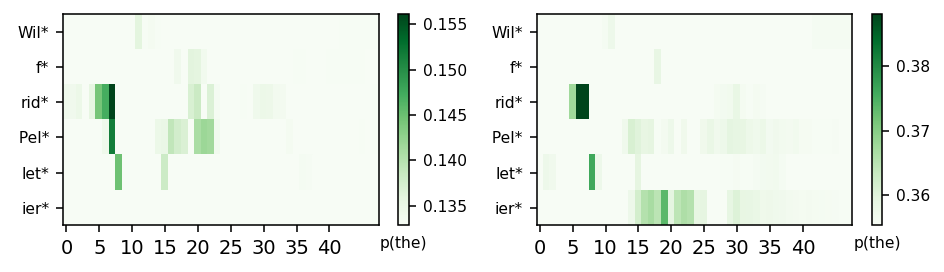

--------------------------------------------------------------------------
Example 2 (top any token) 'Wil f rid  Pel let ier  was  originally  from'
--------------------------------------------------------------------------


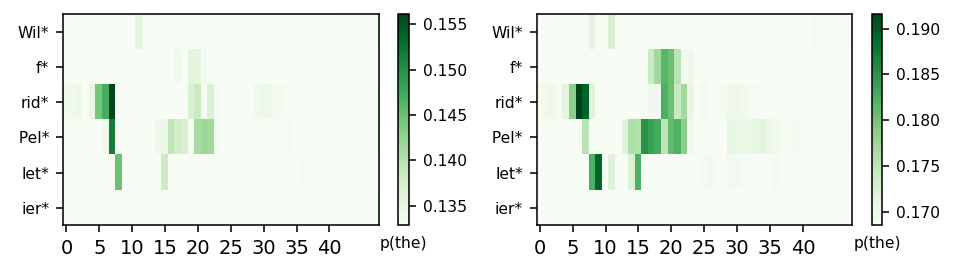

Which pair of patterns is most similar? Example 1 or 2?
If both are equally simlar, write '3'. If none are remotely similar, write '0'.
2
--------------------------------------------------------------------------
Example 1 (top candidate token) 'Wil f rid  Pel let ier  was  native  to'
--------------------------------------------------------------------------


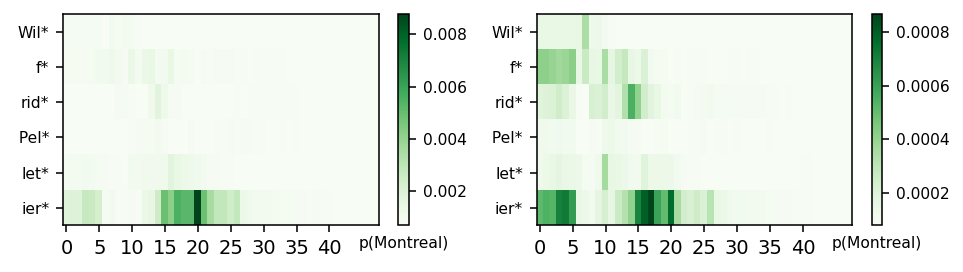

--------------------------------------------------------------------------
Example 2 (top candidate token) 'Wil f rid  Pel let ier  was  originally  from'
--------------------------------------------------------------------------


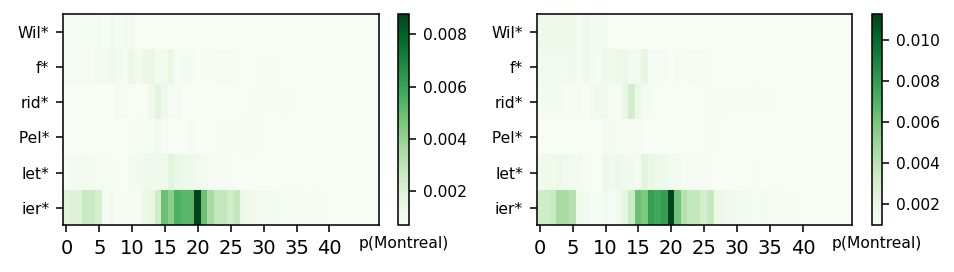

Which pair of patterns is most similar? Example 1 or 2?
If both are equally simlar, write '3'. If none are remotely similar, write '0'.
2
SAMPLE 57 out of 100
--------------------------------------------------------------------------
Example 1 (top any token) 'John  Vander bank  originated  from'
--------------------------------------------------------------------------


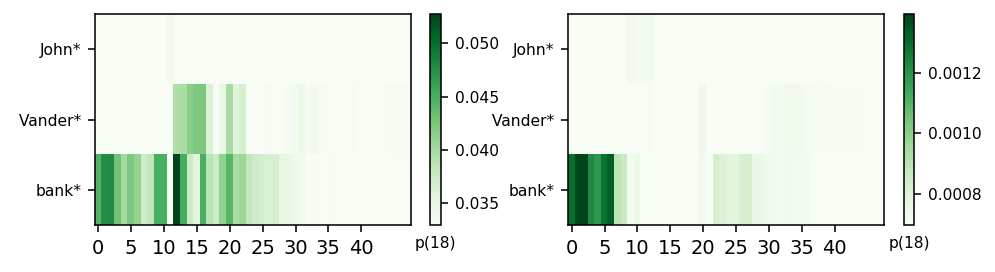

--------------------------------------------------------------------------
Example 2 (top any token) 'John  Vander bank  is  native  to'
--------------------------------------------------------------------------


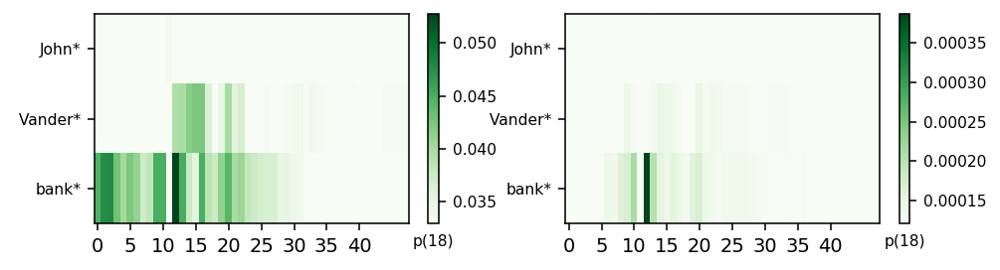

Which pair of patterns is most similar? Example 1 or 2?
If both are equally simlar, write '3'. If none are remotely similar, write '0'.
0
--------------------------------------------------------------------------
Example 1 (top candidate token) 'John  Vander bank  originated  from'
--------------------------------------------------------------------------


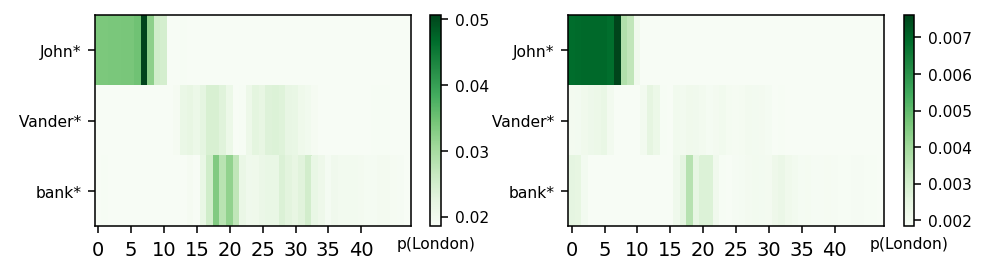

--------------------------------------------------------------------------
Example 2 (top candidate token) 'John  Vander bank  is  native  to'
--------------------------------------------------------------------------


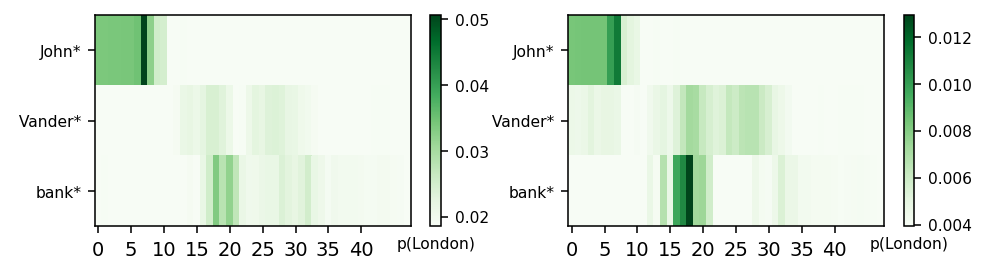

Which pair of patterns is most similar? Example 1 or 2?
If both are equally simlar, write '3'. If none are remotely similar, write '0'.
3
SAMPLE 58 out of 100
--------------------------------------------------------------------------
Example 1 (top any token) 'B rett  Ralph  is  native  to'
--------------------------------------------------------------------------


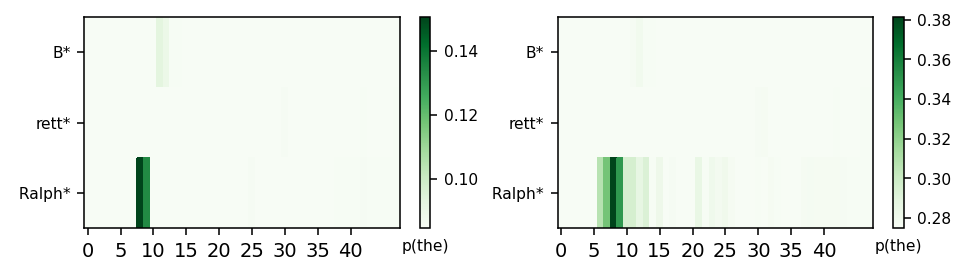

--------------------------------------------------------------------------
Example 2 (top any token) 'B rett  Ralph  is  originally  from'
--------------------------------------------------------------------------


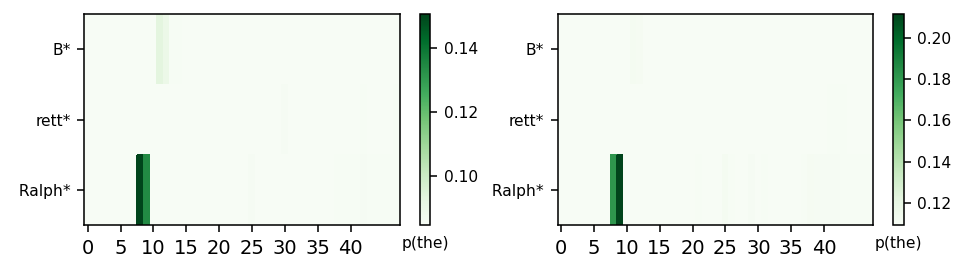

Which pair of patterns is most similar? Example 1 or 2?
If both are equally simlar, write '3'. If none are remotely similar, write '0'.
2
--------------------------------------------------------------------------
Example 1 (top candidate token) 'B rett  Ralph  is  native  to'
--------------------------------------------------------------------------


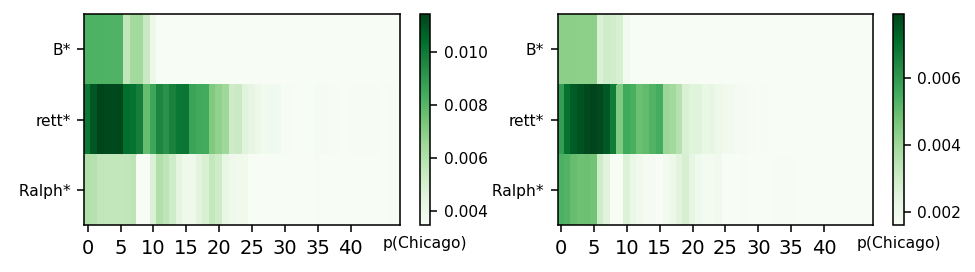

--------------------------------------------------------------------------
Example 2 (top candidate token) 'B rett  Ralph  is  originally  from'
--------------------------------------------------------------------------


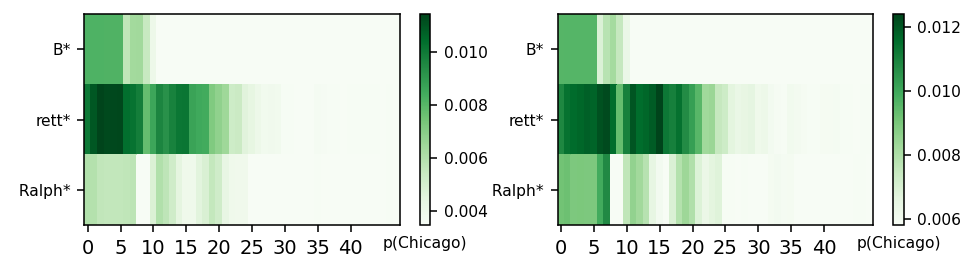

Which pair of patterns is most similar? Example 1 or 2?
If both are equally simlar, write '3'. If none are remotely similar, write '0'.
1
SAMPLE 59 out of 100
--------------------------------------------------------------------------
Example 1 (top any token) 'Graham  Fell ows  was  native  to'
--------------------------------------------------------------------------


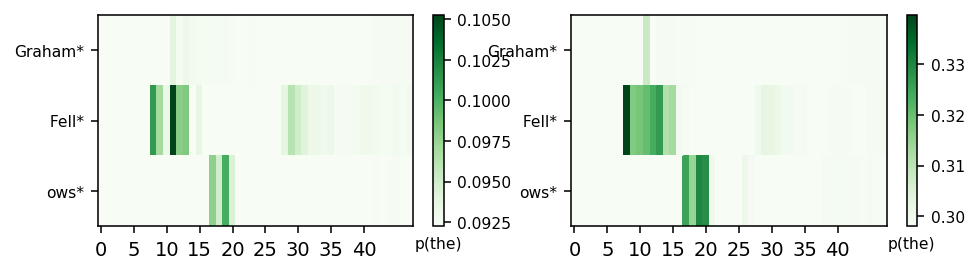

--------------------------------------------------------------------------
Example 2 (top any token) 'Graham  Fell ows  was  originally  from'
--------------------------------------------------------------------------


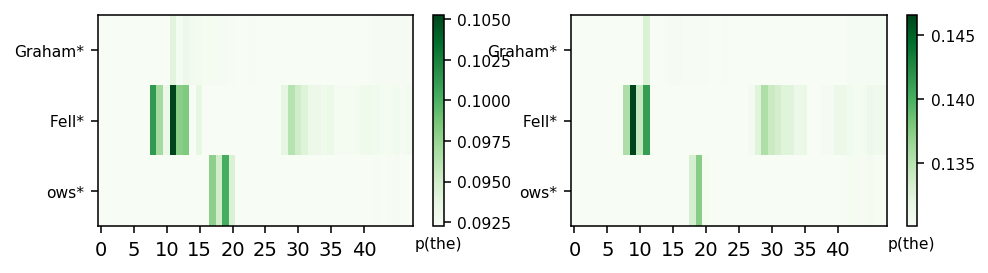

Which pair of patterns is most similar? Example 1 or 2?
If both are equally simlar, write '3'. If none are remotely similar, write '0'.
3
--------------------------------------------------------------------------
Example 1 (top candidate token) 'Graham  Fell ows  was  native  to'
--------------------------------------------------------------------------


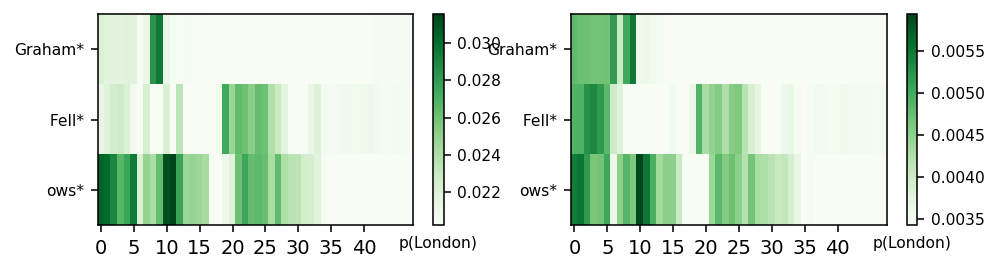

--------------------------------------------------------------------------
Example 2 (top candidate token) 'Graham  Fell ows  was  originally  from'
--------------------------------------------------------------------------


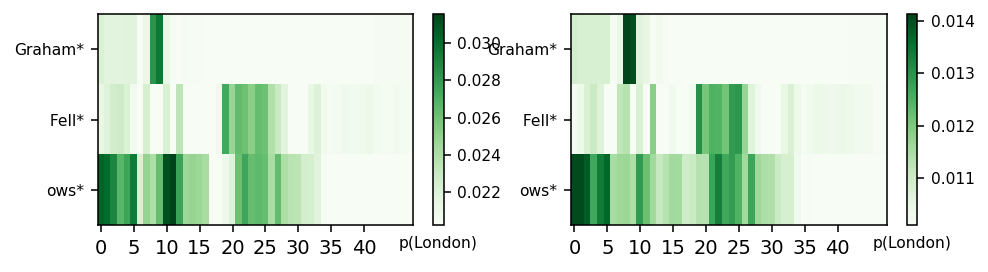

Which pair of patterns is most similar? Example 1 or 2?
If both are equally simlar, write '3'. If none are remotely similar, write '0'.
2
SAMPLE 60 out of 100
--------------------------------------------------------------------------
Example 1 (top any token) 'Z eh ra  She er azi  was  originally  from'
--------------------------------------------------------------------------


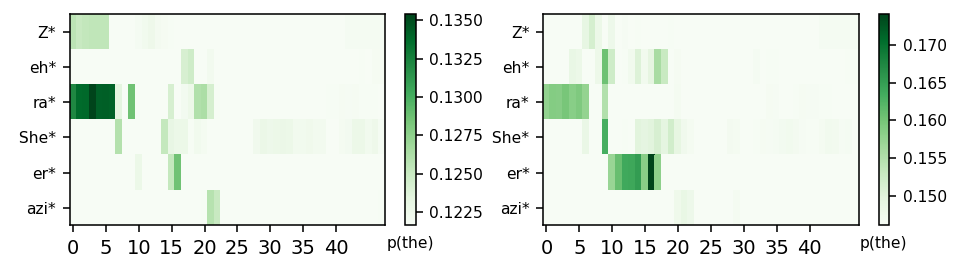

--------------------------------------------------------------------------
Example 2 (top any token) 'Z eh ra  She er azi  is  originally  from'
--------------------------------------------------------------------------


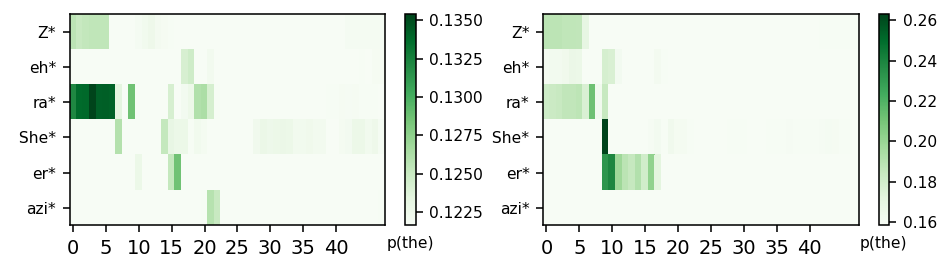

Which pair of patterns is most similar? Example 1 or 2?
If both are equally simlar, write '3'. If none are remotely similar, write '0'.
0
--------------------------------------------------------------------------
Example 1 (top candidate token) 'Z eh ra  She er azi  was  originally  from'
--------------------------------------------------------------------------


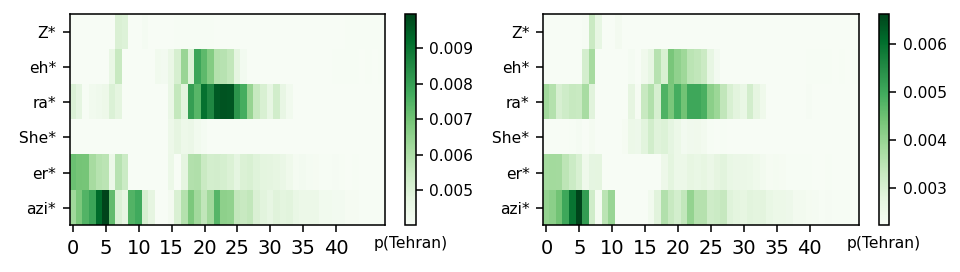

--------------------------------------------------------------------------
Example 2 (top candidate token) 'Z eh ra  She er azi  is  originally  from'
--------------------------------------------------------------------------


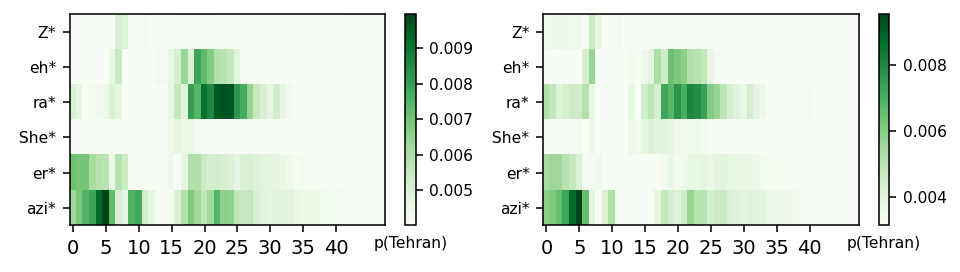

Which pair of patterns is most similar? Example 1 or 2?
If both are equally simlar, write '3'. If none are remotely similar, write '0'.
3
SAMPLE 61 out of 100
--------------------------------------------------------------------------
Example 1 (top any token) 'Nor ina  Match ab elli  originated  from'
--------------------------------------------------------------------------


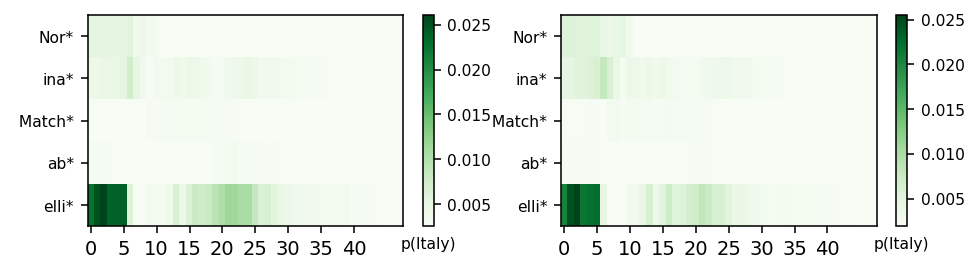

--------------------------------------------------------------------------
Example 2 (top any token) 'Nor ina  Match ab elli  origin ates  from'
--------------------------------------------------------------------------


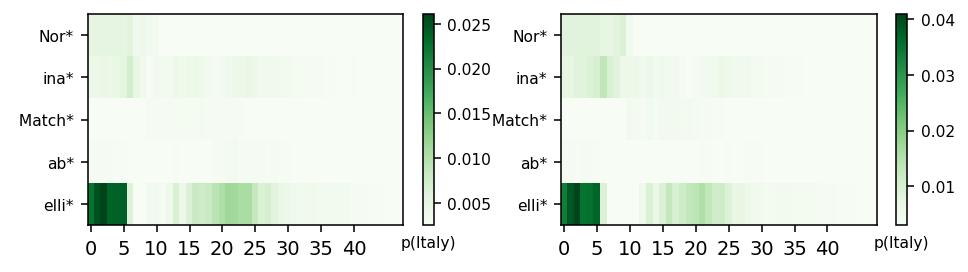

Which pair of patterns is most similar? Example 1 or 2?
If both are equally simlar, write '3'. If none are remotely similar, write '0'.
3
--------------------------------------------------------------------------
Example 1 (top candidate token) 'Nor ina  Match ab elli  originated  from'
--------------------------------------------------------------------------


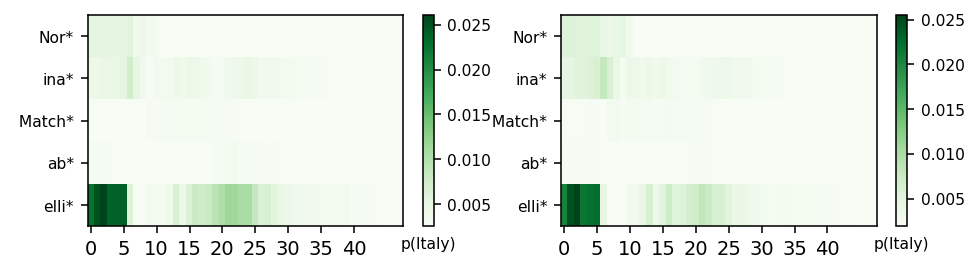

--------------------------------------------------------------------------
Example 2 (top candidate token) 'Nor ina  Match ab elli  origin ates  from'
--------------------------------------------------------------------------


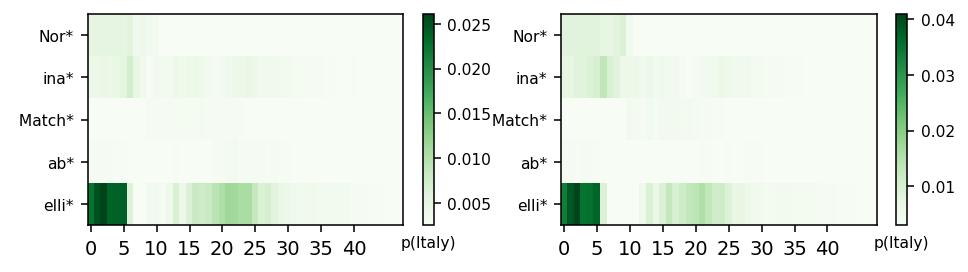

Which pair of patterns is most similar? Example 1 or 2?
If both are equally simlar, write '3'. If none are remotely similar, write '0'.
3
SAMPLE 62 out of 100
--------------------------------------------------------------------------
Example 1 (top any token) 'Mike  Schwartz  was  native  to'
--------------------------------------------------------------------------


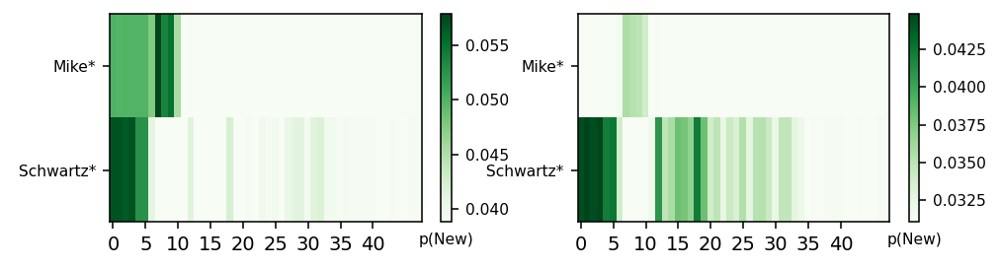

--------------------------------------------------------------------------
Example 2 (top any token) 'Mike  Schwartz  originated  from'
--------------------------------------------------------------------------


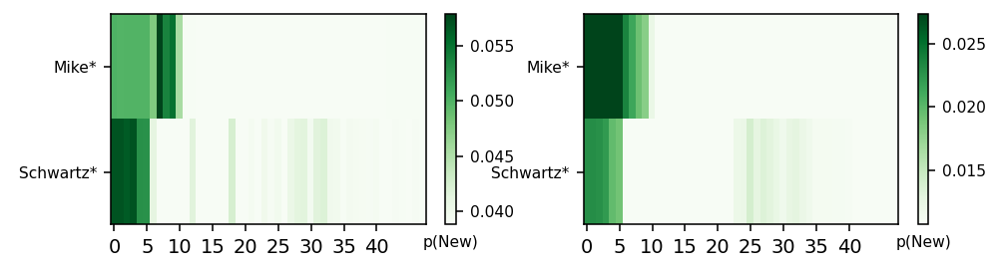

Which pair of patterns is most similar? Example 1 or 2?
If both are equally simlar, write '3'. If none are remotely similar, write '0'.
2
--------------------------------------------------------------------------
Example 1 (top candidate token) 'Mike  Schwartz  was  native  to'
--------------------------------------------------------------------------


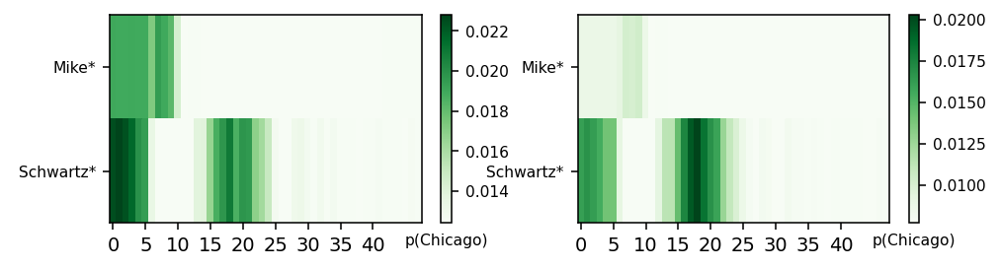

--------------------------------------------------------------------------
Example 2 (top candidate token) 'Mike  Schwartz  originated  from'
--------------------------------------------------------------------------


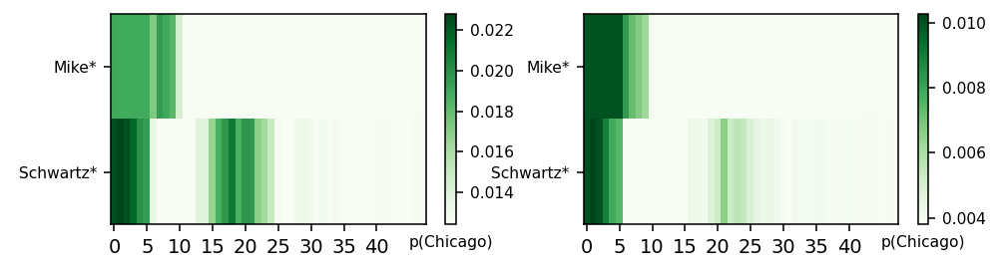

Which pair of patterns is most similar? Example 1 or 2?
If both are equally simlar, write '3'. If none are remotely similar, write '0'.
2
SAMPLE 63 out of 100
--------------------------------------------------------------------------
Example 1 (top any token) 'Ol iver  Ly tt el ton ,  1 st  V isc ount  Chand os  originated  from'
--------------------------------------------------------------------------


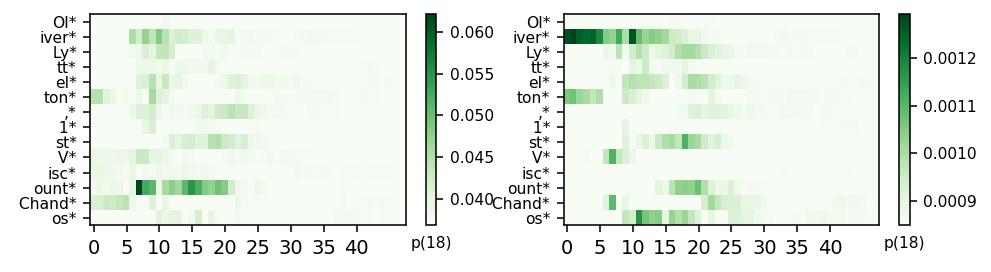

--------------------------------------------------------------------------
Example 2 (top any token) 'Ol iver  Ly tt el ton ,  1 st  V isc ount  Chand os  is  originally  from'
--------------------------------------------------------------------------


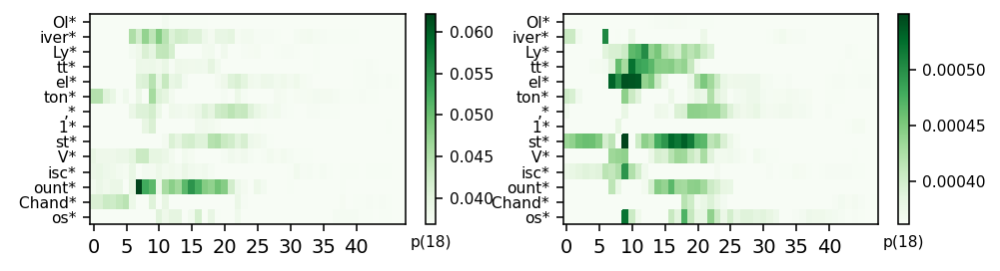

Which pair of patterns is most similar? Example 1 or 2?
If both are equally simlar, write '3'. If none are remotely similar, write '0'.
3
--------------------------------------------------------------------------
Example 1 (top candidate token) 'Ol iver  Ly tt el ton ,  1 st  V isc ount  Chand os  originated  from'
--------------------------------------------------------------------------


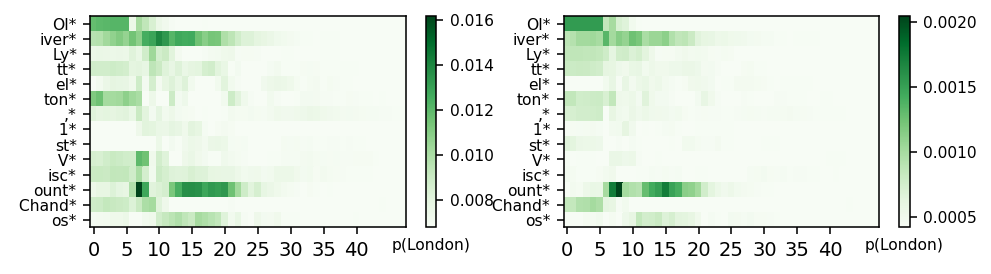

--------------------------------------------------------------------------
Example 2 (top candidate token) 'Ol iver  Ly tt el ton ,  1 st  V isc ount  Chand os  is  originally  from'
--------------------------------------------------------------------------


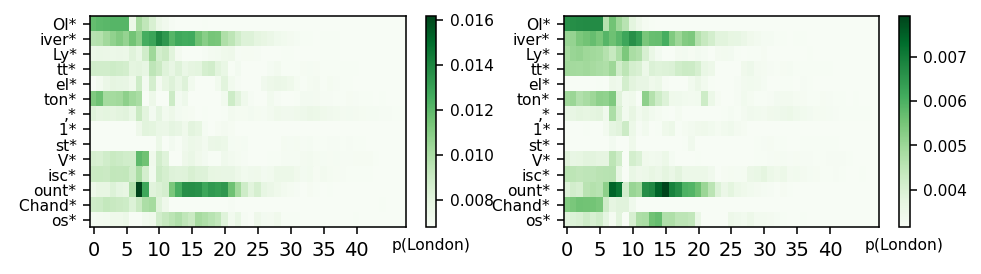

Which pair of patterns is most similar? Example 1 or 2?
If both are equally simlar, write '3'. If none are remotely similar, write '0'.
3
SAMPLE 64 out of 100
--------------------------------------------------------------------------
Example 1 (top any token) 'Jean  Ta uben haus  origin ates  from'
--------------------------------------------------------------------------


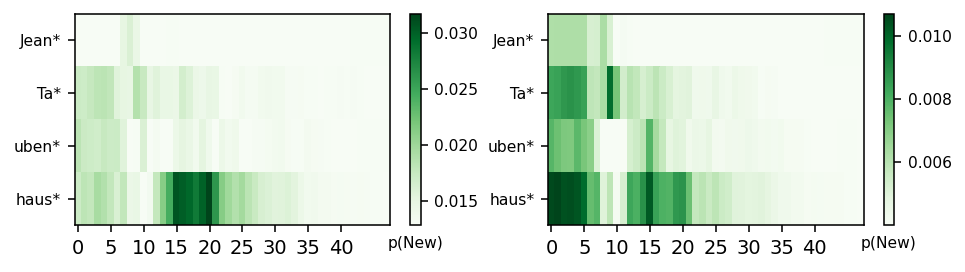

--------------------------------------------------------------------------
Example 2 (top any token) 'Jean  Ta uben haus  was  originally  from'
--------------------------------------------------------------------------


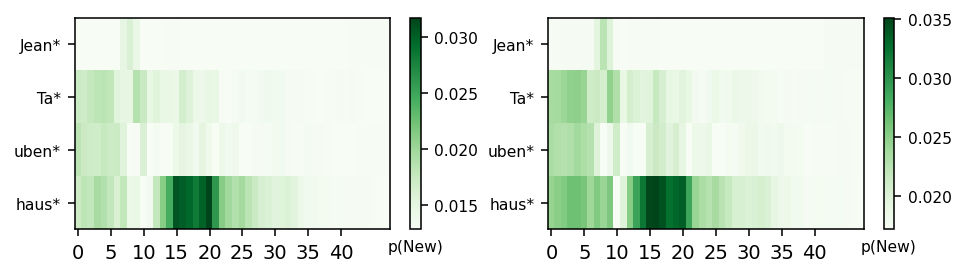

Which pair of patterns is most similar? Example 1 or 2?
If both are equally simlar, write '3'. If none are remotely similar, write '0'.
2
--------------------------------------------------------------------------
Example 1 (top candidate token) 'Jean  Ta uben haus  origin ates  from'
--------------------------------------------------------------------------


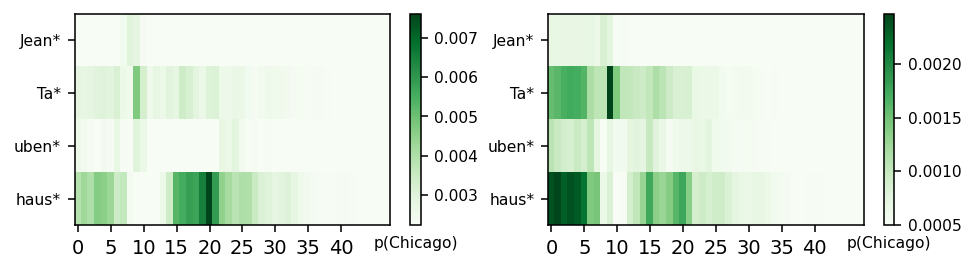

--------------------------------------------------------------------------
Example 2 (top candidate token) 'Jean  Ta uben haus  was  originally  from'
--------------------------------------------------------------------------


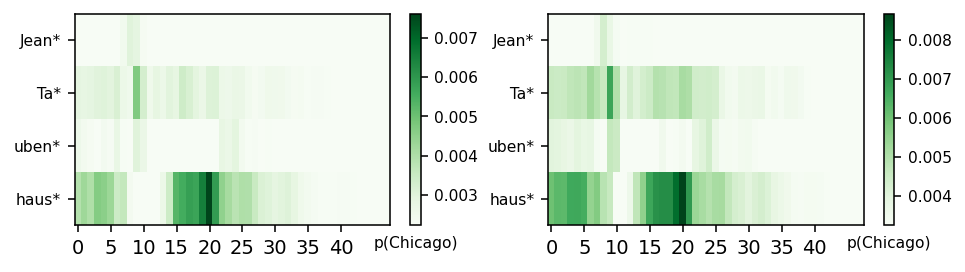

Which pair of patterns is most similar? Example 1 or 2?
If both are equally simlar, write '3'. If none are remotely similar, write '0'.
2
SAMPLE 65 out of 100
--------------------------------------------------------------------------
Example 1 (top any token) 'Vict or  V arn ado  is  originally  from'
--------------------------------------------------------------------------


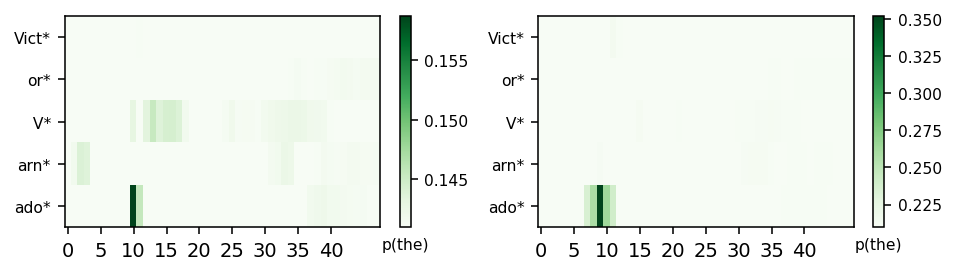

--------------------------------------------------------------------------
Example 2 (top any token) 'Vict or  V arn ado  is  native  to'
--------------------------------------------------------------------------


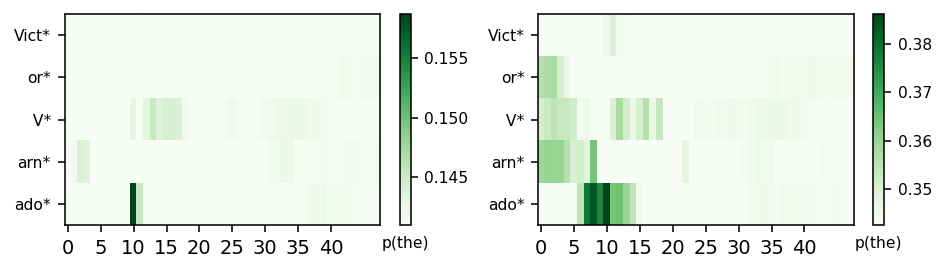

Which pair of patterns is most similar? Example 1 or 2?
If both are equally simlar, write '3'. If none are remotely similar, write '0'.
1
--------------------------------------------------------------------------
Example 1 (top candidate token) 'Vict or  V arn ado  is  originally  from'
--------------------------------------------------------------------------


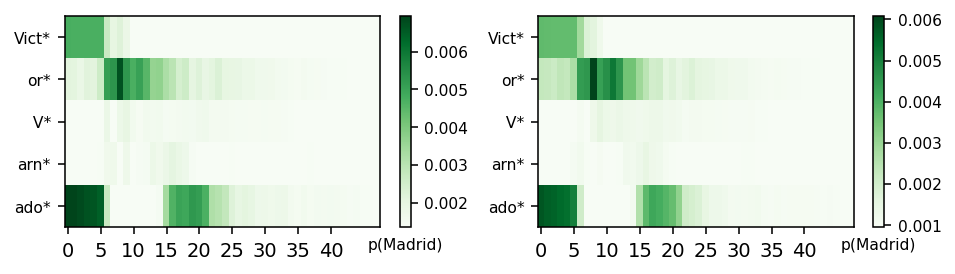

--------------------------------------------------------------------------
Example 2 (top candidate token) 'Vict or  V arn ado  is  native  to'
--------------------------------------------------------------------------


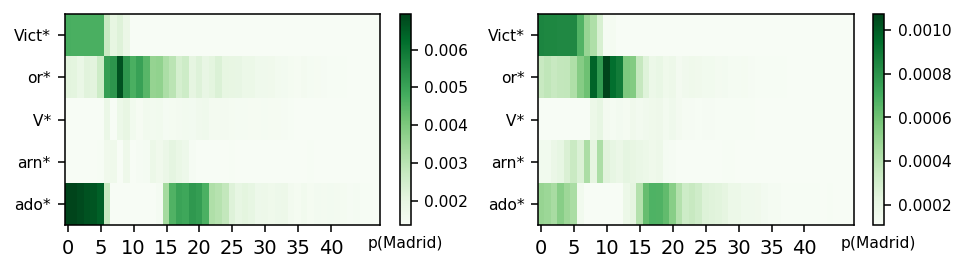

Which pair of patterns is most similar? Example 1 or 2?
If both are equally simlar, write '3'. If none are remotely similar, write '0'.
1
SAMPLE 66 out of 100
--------------------------------------------------------------------------
Example 1 (top any token) 'John  She ahan  originated  from'
--------------------------------------------------------------------------


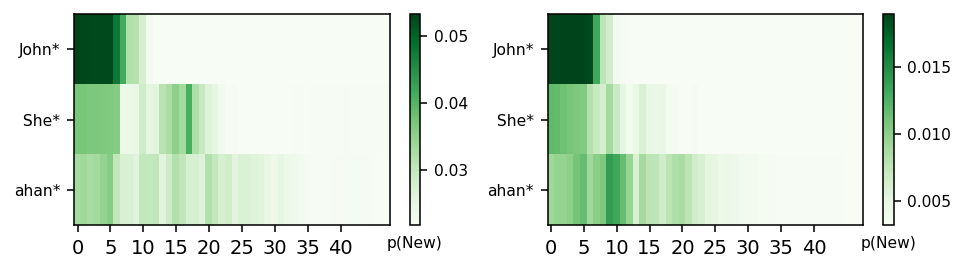

--------------------------------------------------------------------------
Example 2 (top any token) 'John  She ahan  was  originally  from'
--------------------------------------------------------------------------


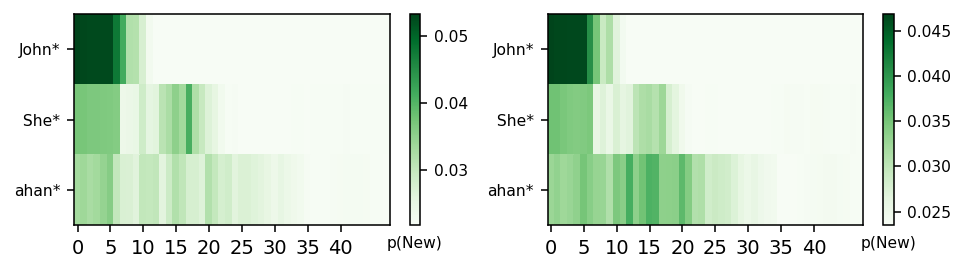

Which pair of patterns is most similar? Example 1 or 2?
If both are equally simlar, write '3'. If none are remotely similar, write '0'.
3
--------------------------------------------------------------------------
Example 1 (top candidate token) 'John  She ahan  originated  from'
--------------------------------------------------------------------------


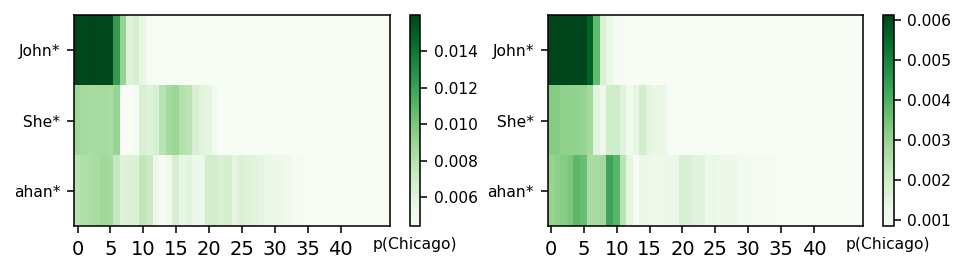

--------------------------------------------------------------------------
Example 2 (top candidate token) 'John  She ahan  was  originally  from'
--------------------------------------------------------------------------


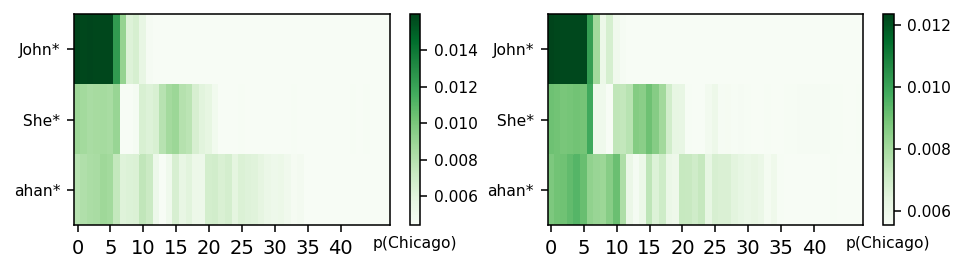

Which pair of patterns is most similar? Example 1 or 2?
If both are equally simlar, write '3'. If none are remotely similar, write '0'.
3
SAMPLE 67 out of 100
--------------------------------------------------------------------------
Example 1 (top any token) 'Z hou  Long  is  originally  from'
--------------------------------------------------------------------------


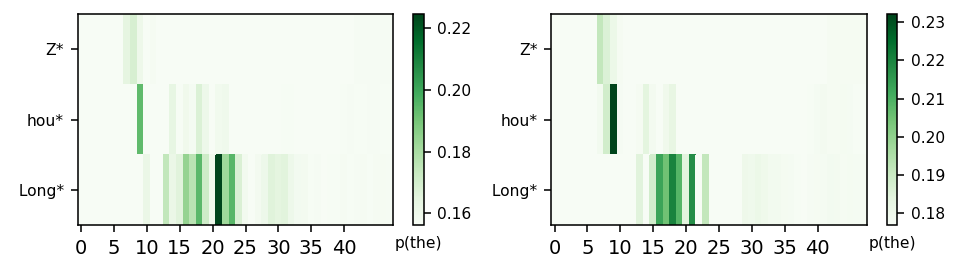

--------------------------------------------------------------------------
Example 2 (top any token) 'Z hou  Long  is  native  to'
--------------------------------------------------------------------------


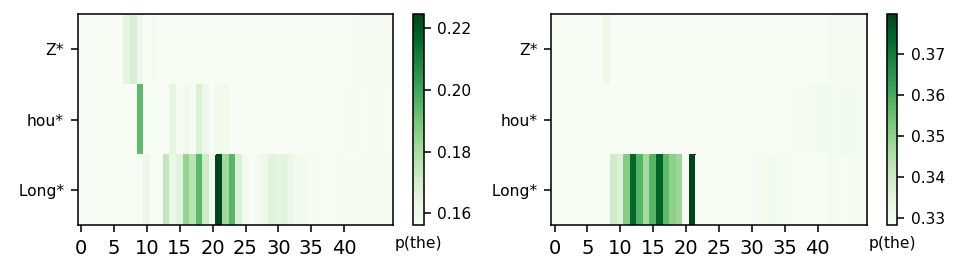

Which pair of patterns is most similar? Example 1 or 2?
If both are equally simlar, write '3'. If none are remotely similar, write '0'.
3
--------------------------------------------------------------------------
Example 1 (top candidate token) 'Z hou  Long  is  originally  from'
--------------------------------------------------------------------------


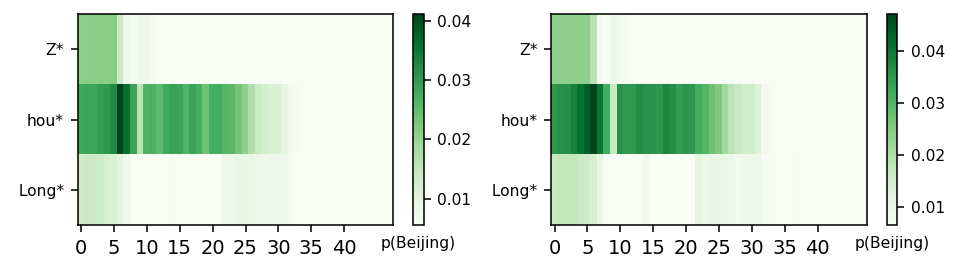

--------------------------------------------------------------------------
Example 2 (top candidate token) 'Z hou  Long  is  native  to'
--------------------------------------------------------------------------


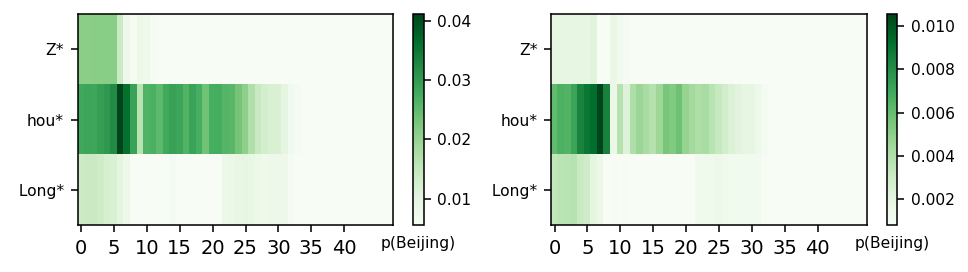

Which pair of patterns is most similar? Example 1 or 2?
If both are equally simlar, write '3'. If none are remotely similar, write '0'.
1
SAMPLE 68 out of 100
--------------------------------------------------------------------------
Example 1 (top any token) 'Larry  King  origin ates  from'
--------------------------------------------------------------------------


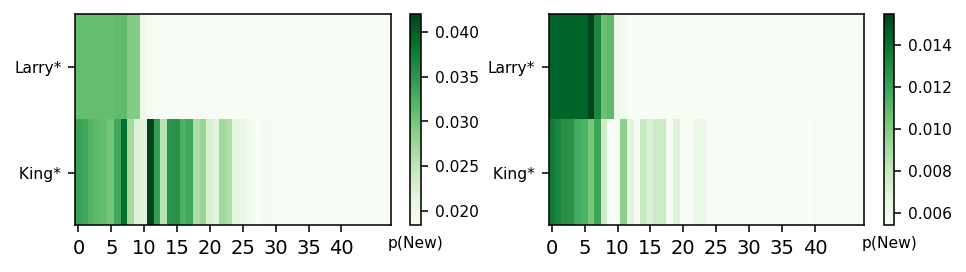

--------------------------------------------------------------------------
Example 2 (top any token) 'Larry  King  was  originally  from'
--------------------------------------------------------------------------


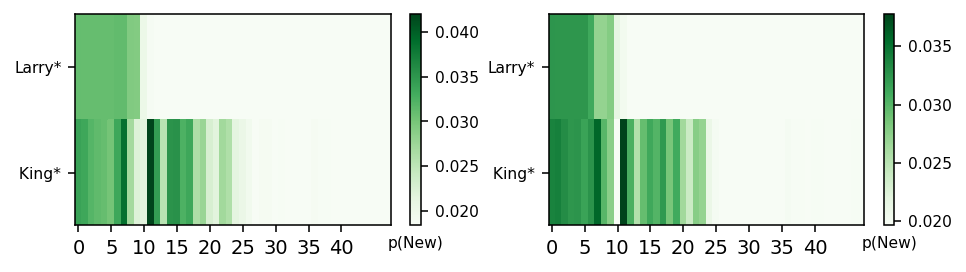

Which pair of patterns is most similar? Example 1 or 2?
If both are equally simlar, write '3'. If none are remotely similar, write '0'.
2
--------------------------------------------------------------------------
Example 1 (top candidate token) 'Larry  King  origin ates  from'
--------------------------------------------------------------------------


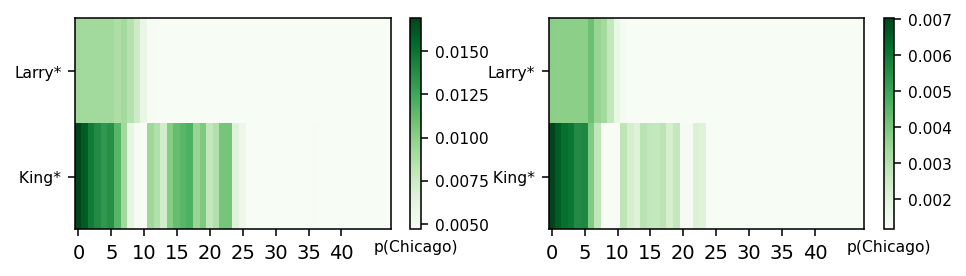

--------------------------------------------------------------------------
Example 2 (top candidate token) 'Larry  King  was  originally  from'
--------------------------------------------------------------------------


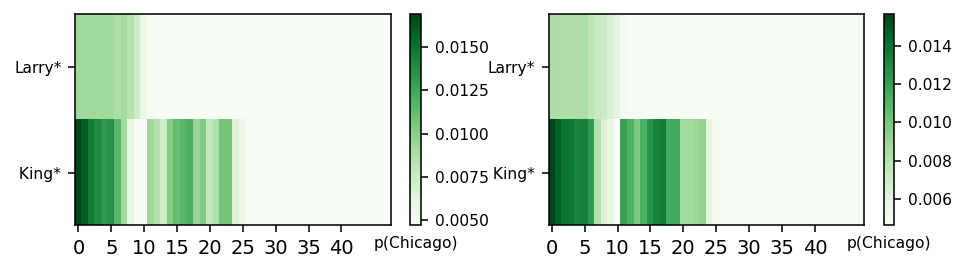

Which pair of patterns is most similar? Example 1 or 2?
If both are equally simlar, write '3'. If none are remotely similar, write '0'.
2
SAMPLE 69 out of 100
--------------------------------------------------------------------------
Example 1 (top any token) 'Dam ian  O ' F lynn  was  native  to'
--------------------------------------------------------------------------


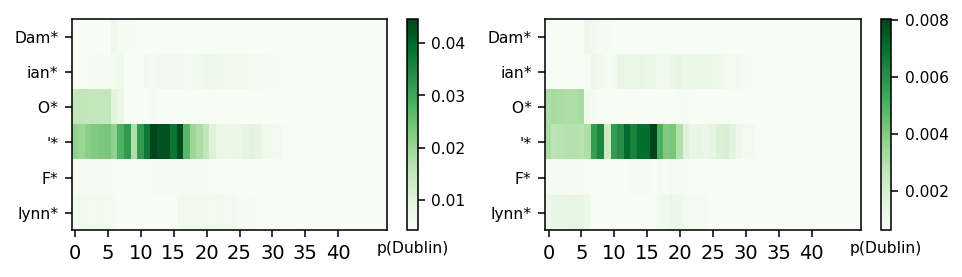

--------------------------------------------------------------------------
Example 2 (top any token) 'Dam ian  O ' F lynn  originated  from'
--------------------------------------------------------------------------


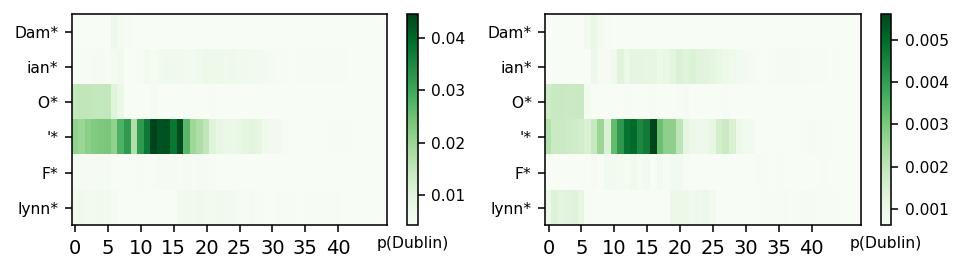

Which pair of patterns is most similar? Example 1 or 2?
If both are equally simlar, write '3'. If none are remotely similar, write '0'.
3
--------------------------------------------------------------------------
Example 1 (top candidate token) 'Dam ian  O ' F lynn  was  native  to'
--------------------------------------------------------------------------


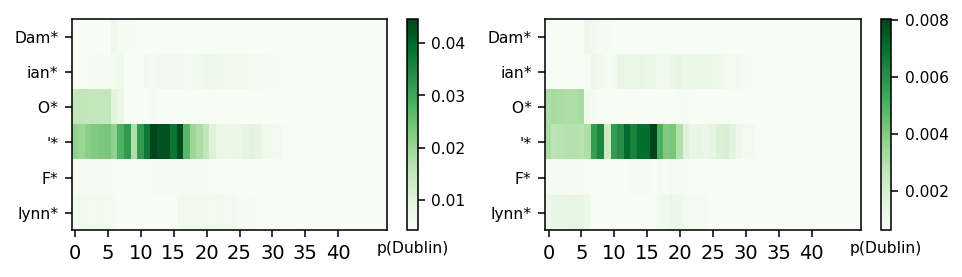

--------------------------------------------------------------------------
Example 2 (top candidate token) 'Dam ian  O ' F lynn  originated  from'
--------------------------------------------------------------------------


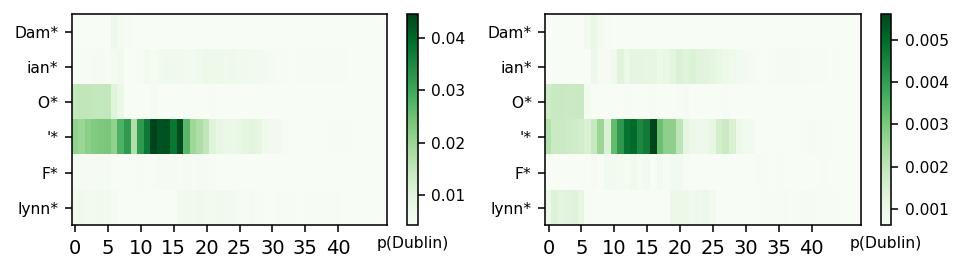

Which pair of patterns is most similar? Example 1 or 2?
If both are equally simlar, write '3'. If none are remotely similar, write '0'.
3
SAMPLE 70 out of 100
--------------------------------------------------------------------------
Example 1 (top any token) 'D iane  Hendricks  origin ates  from'
--------------------------------------------------------------------------


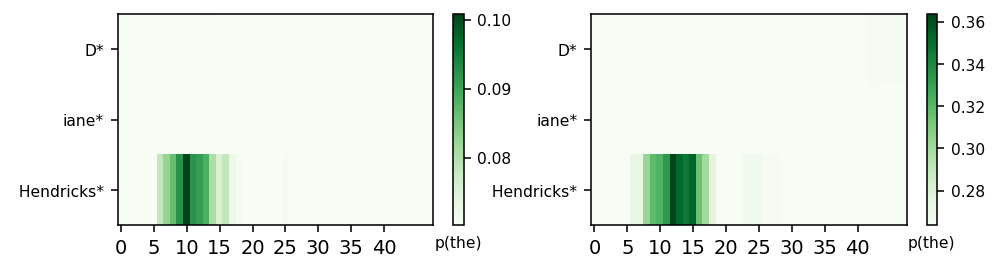

--------------------------------------------------------------------------
Example 2 (top any token) 'D iane  Hendricks  is  originally  from'
--------------------------------------------------------------------------


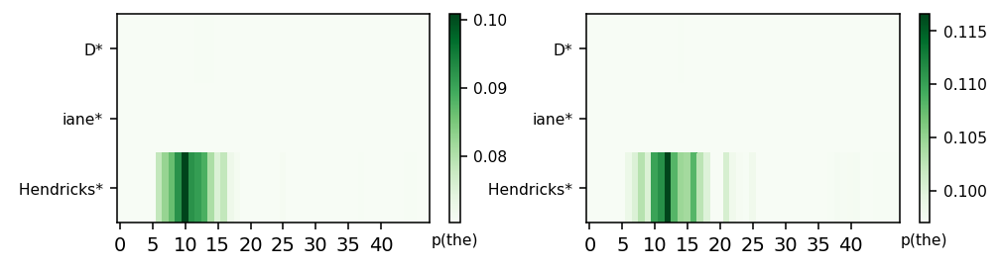

Which pair of patterns is most similar? Example 1 or 2?
If both are equally simlar, write '3'. If none are remotely similar, write '0'.
3
--------------------------------------------------------------------------
Example 1 (top candidate token) 'D iane  Hendricks  origin ates  from'
--------------------------------------------------------------------------


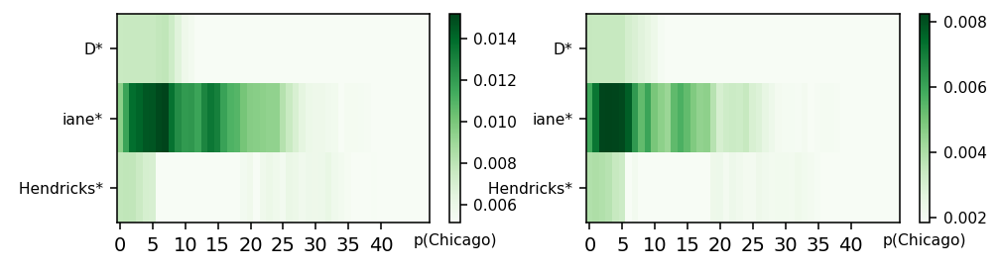

--------------------------------------------------------------------------
Example 2 (top candidate token) 'D iane  Hendricks  is  originally  from'
--------------------------------------------------------------------------


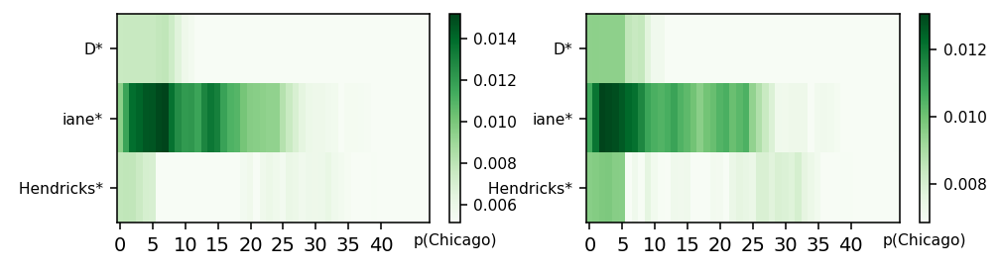

Which pair of patterns is most similar? Example 1 or 2?
If both are equally simlar, write '3'. If none are remotely similar, write '0'.
3
SAMPLE 71 out of 100
--------------------------------------------------------------------------
Example 1 (top any token) 'Mar ion  Davies  origin ates  from'
--------------------------------------------------------------------------


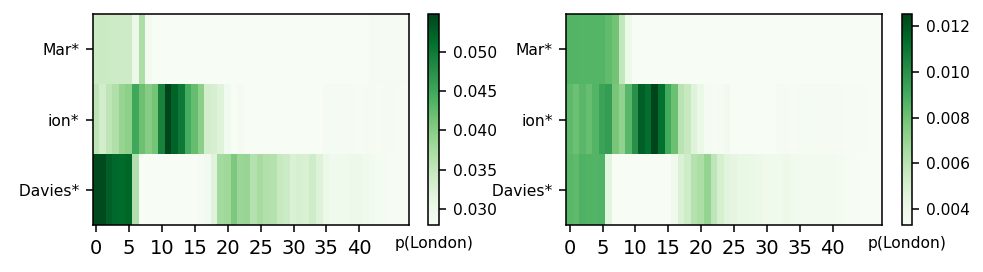

--------------------------------------------------------------------------
Example 2 (top any token) 'Mar ion  Davies  was  originally  from'
--------------------------------------------------------------------------


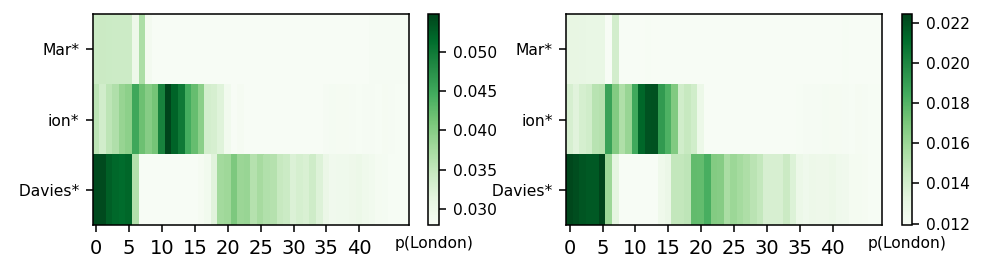

Which pair of patterns is most similar? Example 1 or 2?
If both are equally simlar, write '3'. If none are remotely similar, write '0'.
2
--------------------------------------------------------------------------
Example 1 (top candidate token) 'Mar ion  Davies  origin ates  from'
--------------------------------------------------------------------------


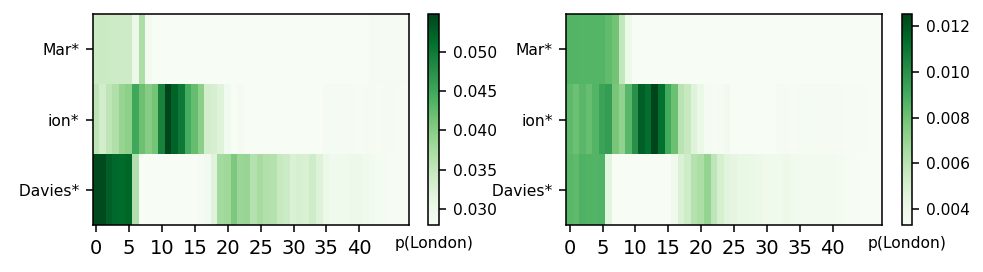

--------------------------------------------------------------------------
Example 2 (top candidate token) 'Mar ion  Davies  was  originally  from'
--------------------------------------------------------------------------


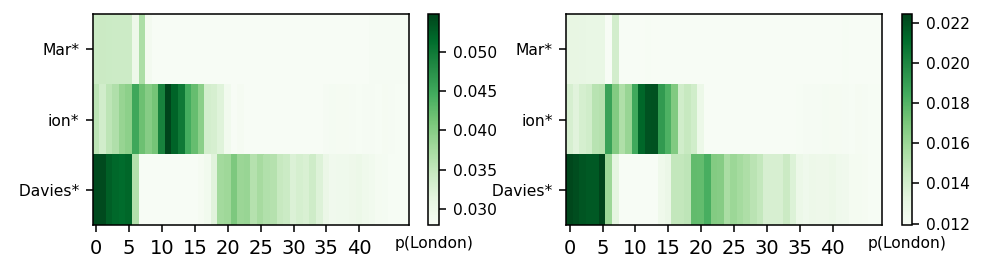

Which pair of patterns is most similar? Example 1 or 2?
If both are equally simlar, write '3'. If none are remotely similar, write '0'.
2
SAMPLE 72 out of 100
--------------------------------------------------------------------------
Example 1 (top any token) 'James  Henry  Ma ples on  origin ates  from'
--------------------------------------------------------------------------


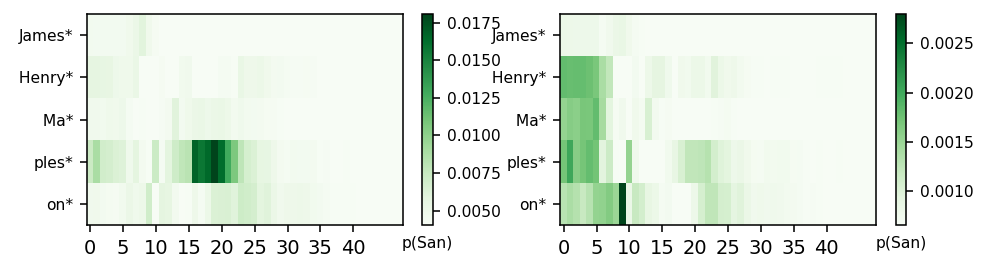

--------------------------------------------------------------------------
Example 2 (top any token) 'James  Henry  Ma ples on  is  originally  from'
--------------------------------------------------------------------------


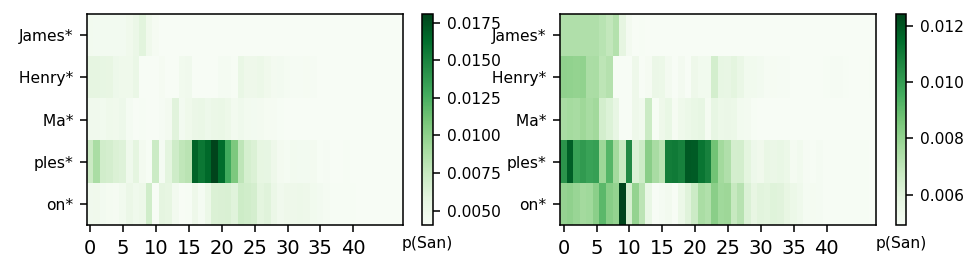

Which pair of patterns is most similar? Example 1 or 2?
If both are equally simlar, write '3'. If none are remotely similar, write '0'.
0
--------------------------------------------------------------------------
Example 1 (top candidate token) 'James  Henry  Ma ples on  origin ates  from'
--------------------------------------------------------------------------


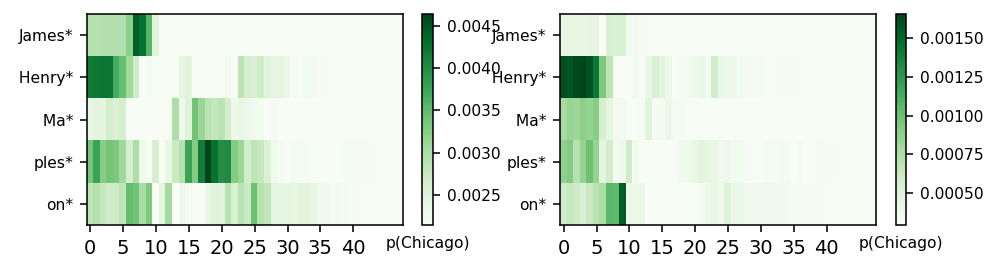

--------------------------------------------------------------------------
Example 2 (top candidate token) 'James  Henry  Ma ples on  is  originally  from'
--------------------------------------------------------------------------


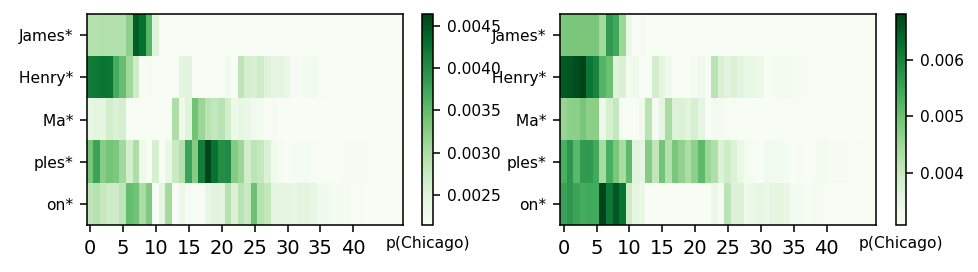

Which pair of patterns is most similar? Example 1 or 2?
If both are equally simlar, write '3'. If none are remotely similar, write '0'.
3
SAMPLE 73 out of 100
--------------------------------------------------------------------------
Example 1 (top any token) 'C yn an  Gar wyn  origin ates  from'
--------------------------------------------------------------------------


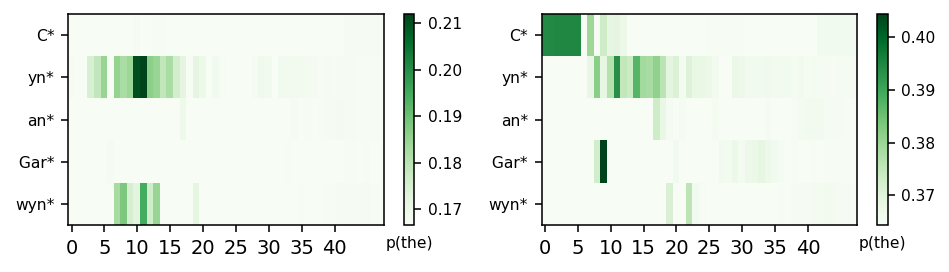

--------------------------------------------------------------------------
Example 2 (top any token) 'C yn an  Gar wyn  is  native  to'
--------------------------------------------------------------------------


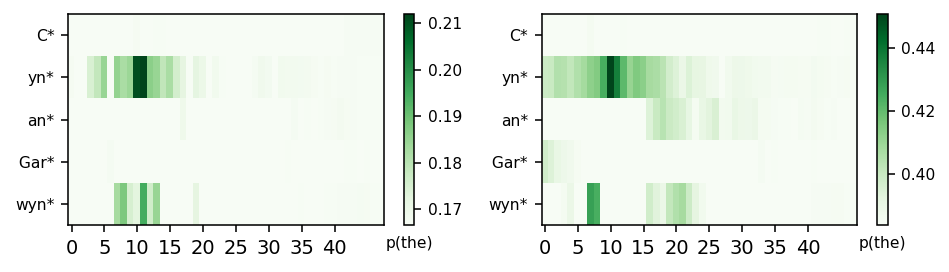

Which pair of patterns is most similar? Example 1 or 2?
If both are equally simlar, write '3'. If none are remotely similar, write '0'.
2
--------------------------------------------------------------------------
Example 1 (top candidate token) 'C yn an  Gar wyn  origin ates  from'
--------------------------------------------------------------------------


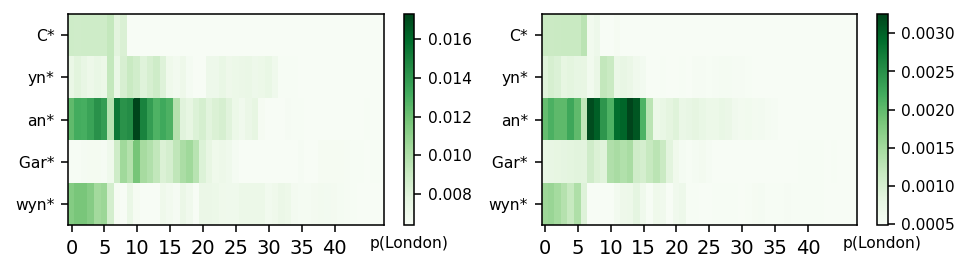

--------------------------------------------------------------------------
Example 2 (top candidate token) 'C yn an  Gar wyn  is  native  to'
--------------------------------------------------------------------------


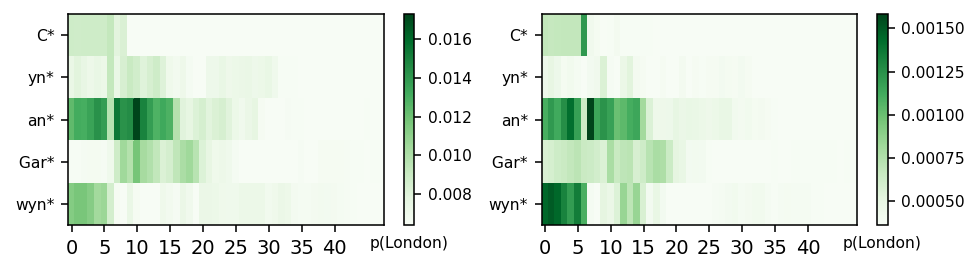

Which pair of patterns is most similar? Example 1 or 2?
If both are equally simlar, write '3'. If none are remotely similar, write '0'.
3
SAMPLE 74 out of 100
--------------------------------------------------------------------------
Example 1 (top any token) 'J aki  Lie be ze it  was  originally  from'
--------------------------------------------------------------------------


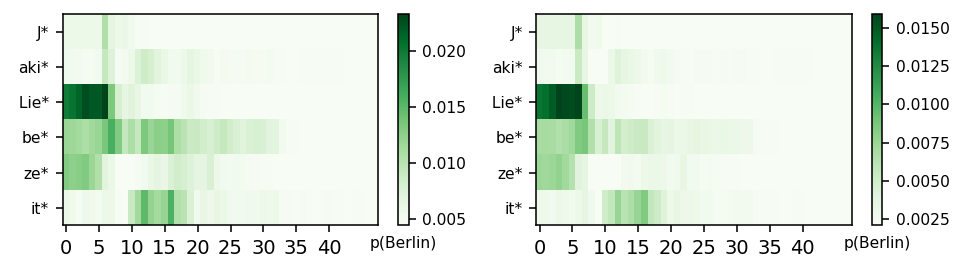

--------------------------------------------------------------------------
Example 2 (top any token) 'J aki  Lie be ze it  was  native  to'
--------------------------------------------------------------------------


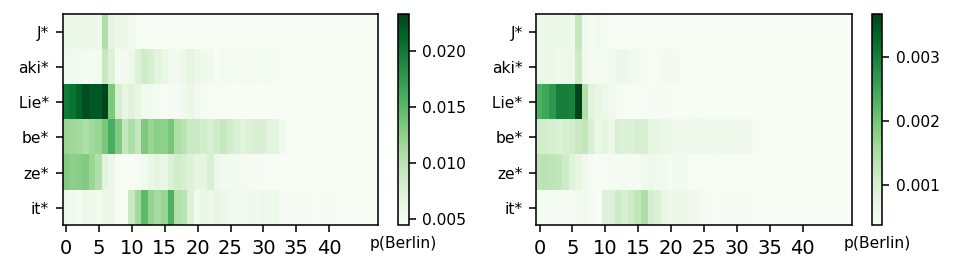

Which pair of patterns is most similar? Example 1 or 2?
If both are equally simlar, write '3'. If none are remotely similar, write '0'.
1
--------------------------------------------------------------------------
Example 1 (top candidate token) 'J aki  Lie be ze it  was  originally  from'
--------------------------------------------------------------------------


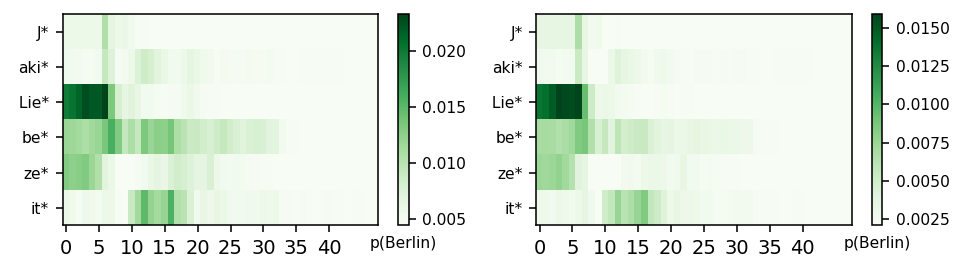

--------------------------------------------------------------------------
Example 2 (top candidate token) 'J aki  Lie be ze it  was  native  to'
--------------------------------------------------------------------------


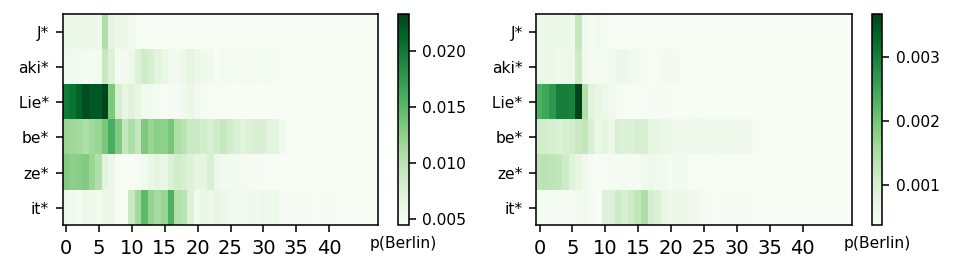

Which pair of patterns is most similar? Example 1 or 2?
If both are equally simlar, write '3'. If none are remotely similar, write '0'.
1
SAMPLE 75 out of 100
--------------------------------------------------------------------------
Example 1 (top any token) 'Fer dinand  de  Sa uss ure  was  native  to'
--------------------------------------------------------------------------


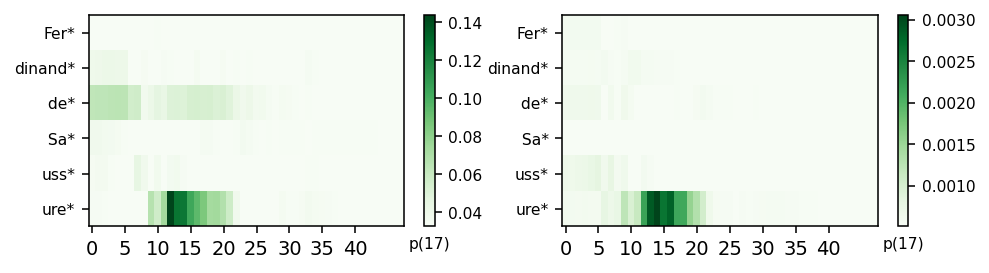

--------------------------------------------------------------------------
Example 2 (top any token) 'Fer dinand  de  Sa uss ure  is  native  to'
--------------------------------------------------------------------------


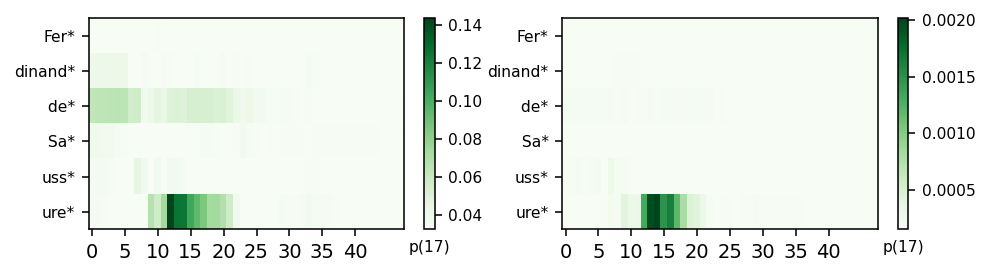

Which pair of patterns is most similar? Example 1 or 2?
If both are equally simlar, write '3'. If none are remotely similar, write '0'.
1
--------------------------------------------------------------------------
Example 1 (top candidate token) 'Fer dinand  de  Sa uss ure  was  native  to'
--------------------------------------------------------------------------


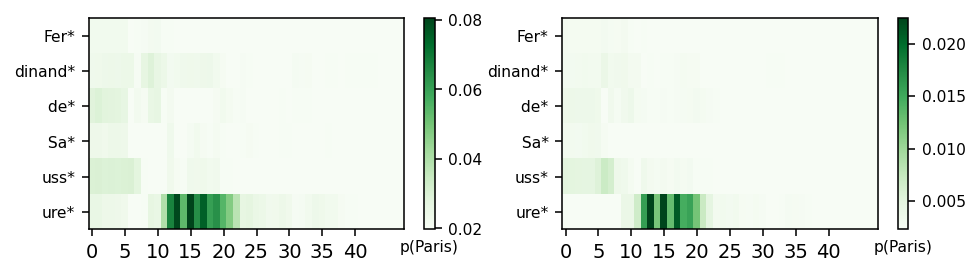

--------------------------------------------------------------------------
Example 2 (top candidate token) 'Fer dinand  de  Sa uss ure  is  native  to'
--------------------------------------------------------------------------


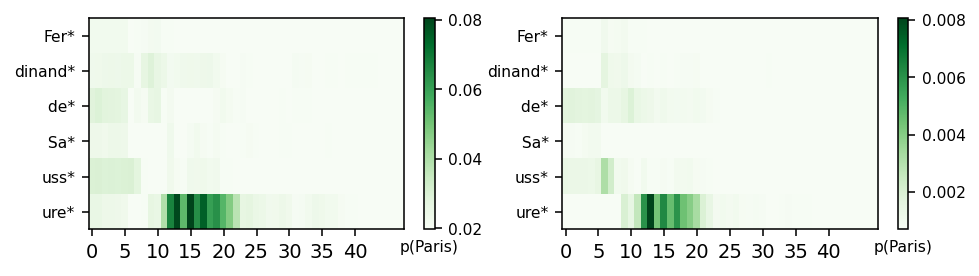

Which pair of patterns is most similar? Example 1 or 2?
If both are equally simlar, write '3'. If none are remotely similar, write '0'.
3
SAMPLE 76 out of 100
--------------------------------------------------------------------------
Example 1 (top any token) 'Eric  Dover  was  originally  from'
--------------------------------------------------------------------------


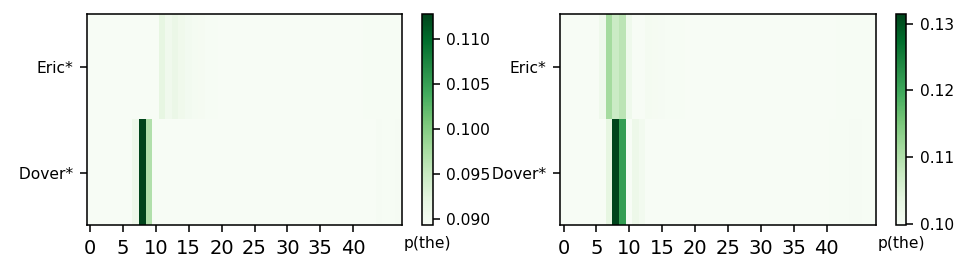

--------------------------------------------------------------------------
Example 2 (top any token) 'Eric  Dover  was  native  to'
--------------------------------------------------------------------------


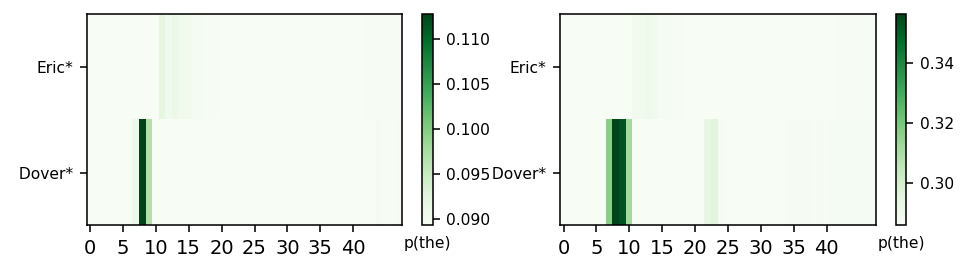

Which pair of patterns is most similar? Example 1 or 2?
If both are equally simlar, write '3'. If none are remotely similar, write '0'.
3
--------------------------------------------------------------------------
Example 1 (top candidate token) 'Eric  Dover  was  originally  from'
--------------------------------------------------------------------------


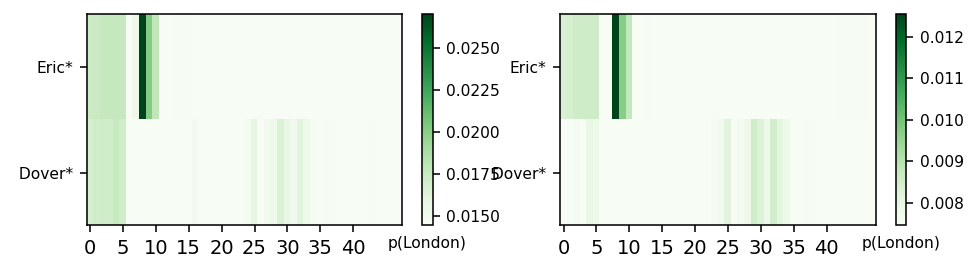

--------------------------------------------------------------------------
Example 2 (top candidate token) 'Eric  Dover  was  native  to'
--------------------------------------------------------------------------


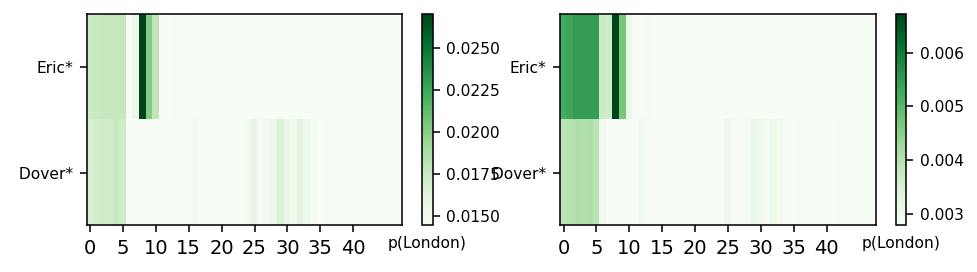

Which pair of patterns is most similar? Example 1 or 2?
If both are equally simlar, write '3'. If none are remotely similar, write '0'.
1
SAMPLE 77 out of 100
--------------------------------------------------------------------------
Example 1 (top any token) 'H iro ki  Mor iya  was  native  to'
--------------------------------------------------------------------------


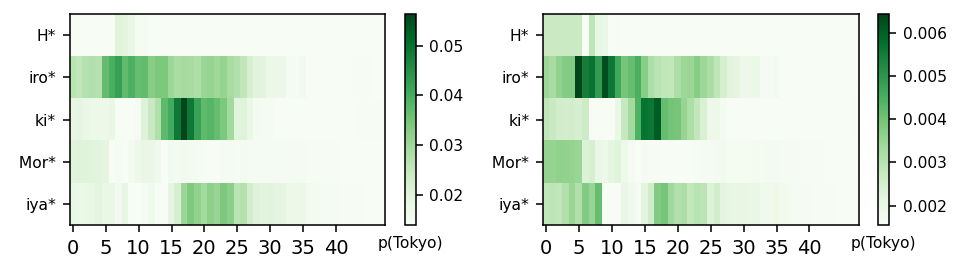

--------------------------------------------------------------------------
Example 2 (top any token) 'H iro ki  Mor iya  was  originally  from'
--------------------------------------------------------------------------


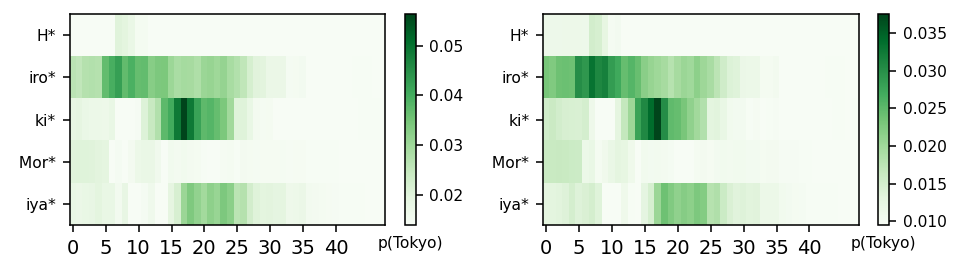

Which pair of patterns is most similar? Example 1 or 2?
If both are equally simlar, write '3'. If none are remotely similar, write '0'.
2
--------------------------------------------------------------------------
Example 1 (top candidate token) 'H iro ki  Mor iya  was  native  to'
--------------------------------------------------------------------------


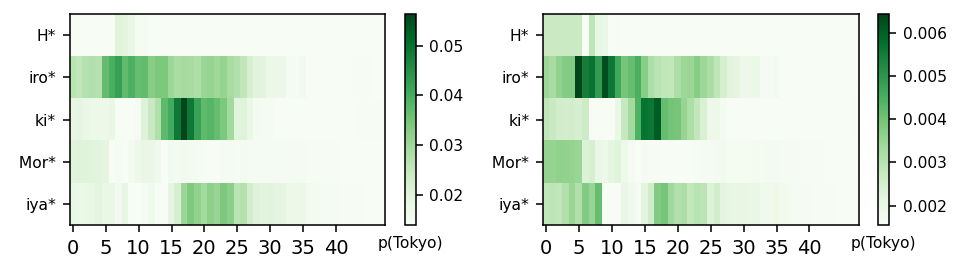

--------------------------------------------------------------------------
Example 2 (top candidate token) 'H iro ki  Mor iya  was  originally  from'
--------------------------------------------------------------------------


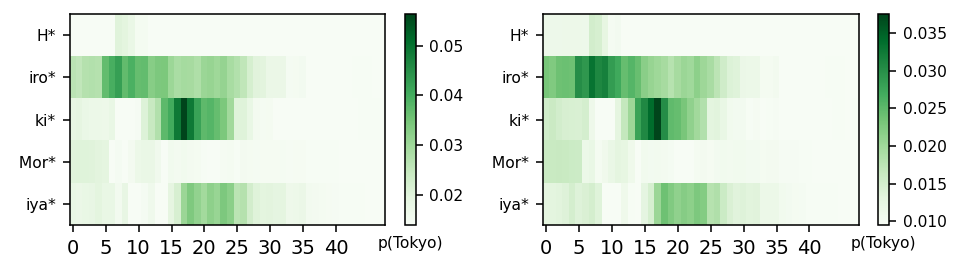

Which pair of patterns is most similar? Example 1 or 2?
If both are equally simlar, write '3'. If none are remotely similar, write '0'.
2
SAMPLE 78 out of 100
--------------------------------------------------------------------------
Example 1 (top any token) 'Cos imo  F ance lli  was  originally  from'
--------------------------------------------------------------------------


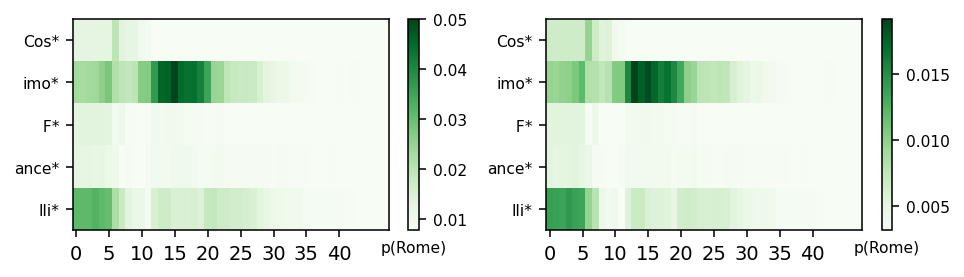

--------------------------------------------------------------------------
Example 2 (top any token) 'Cos imo  F ance lli  is  native  to'
--------------------------------------------------------------------------


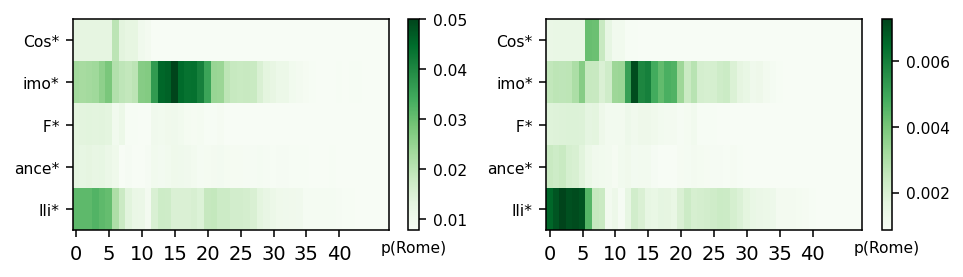

Which pair of patterns is most similar? Example 1 or 2?
If both are equally simlar, write '3'. If none are remotely similar, write '0'.
1
--------------------------------------------------------------------------
Example 1 (top candidate token) 'Cos imo  F ance lli  was  originally  from'
--------------------------------------------------------------------------


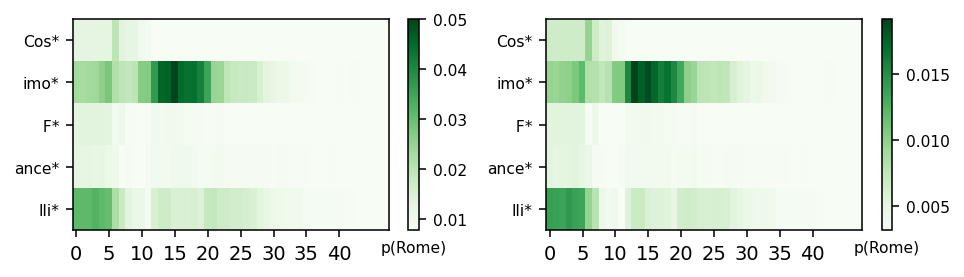

--------------------------------------------------------------------------
Example 2 (top candidate token) 'Cos imo  F ance lli  is  native  to'
--------------------------------------------------------------------------


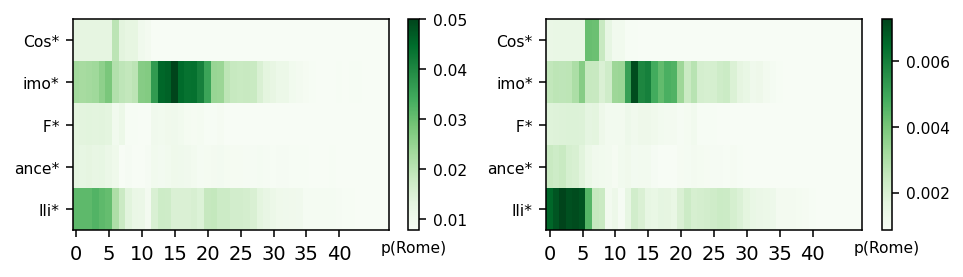

Which pair of patterns is most similar? Example 1 or 2?
If both are equally simlar, write '3'. If none are remotely similar, write '0'.
1
SAMPLE 79 out of 100
--------------------------------------------------------------------------
Example 1 (top any token) 'F ried rich  Albert  von  Zen ker  was  native  to'
--------------------------------------------------------------------------


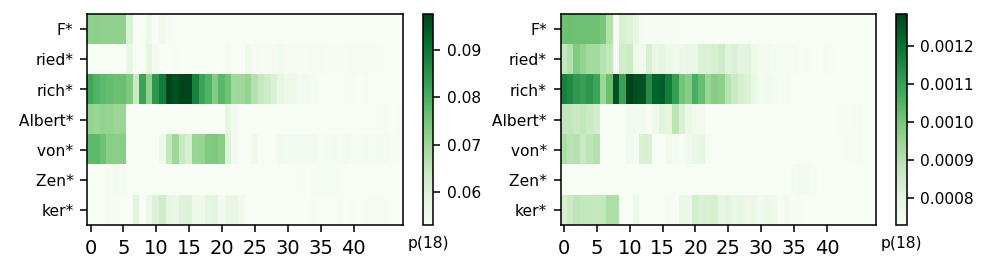

--------------------------------------------------------------------------
Example 2 (top any token) 'F ried rich  Albert  von  Zen ker  was  originally  from'
--------------------------------------------------------------------------


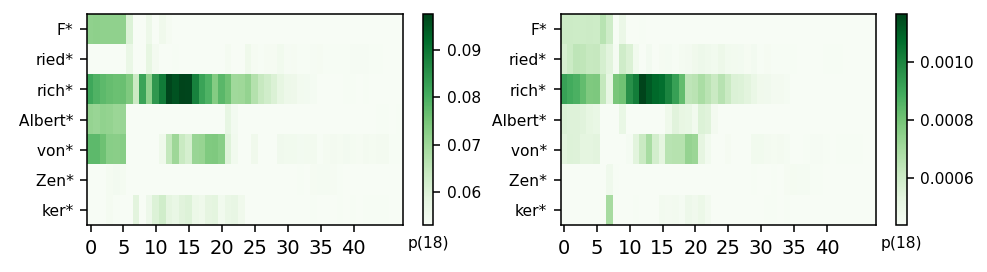

Which pair of patterns is most similar? Example 1 or 2?
If both are equally simlar, write '3'. If none are remotely similar, write '0'.
3
--------------------------------------------------------------------------
Example 1 (top candidate token) 'F ried rich  Albert  von  Zen ker  was  native  to'
--------------------------------------------------------------------------


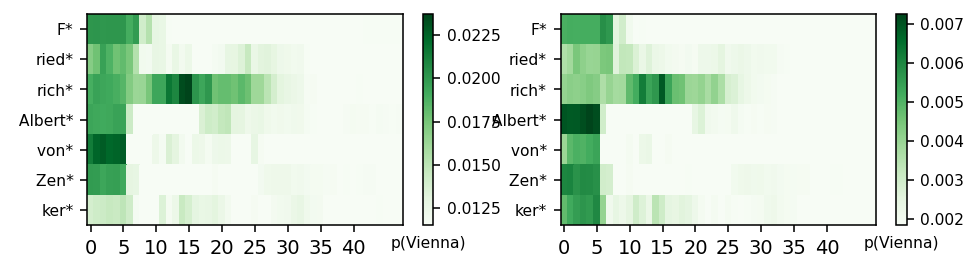

--------------------------------------------------------------------------
Example 2 (top candidate token) 'F ried rich  Albert  von  Zen ker  was  originally  from'
--------------------------------------------------------------------------


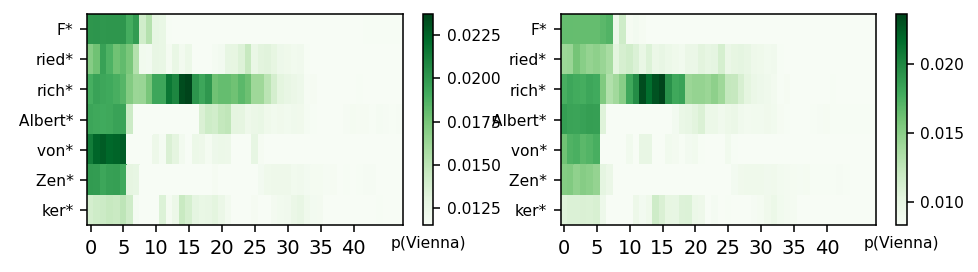

Which pair of patterns is most similar? Example 1 or 2?
If both are equally simlar, write '3'. If none are remotely similar, write '0'.
3
SAMPLE 80 out of 100
--------------------------------------------------------------------------
Example 1 (top any token) 'DJ  Die  origin ates  from'
--------------------------------------------------------------------------


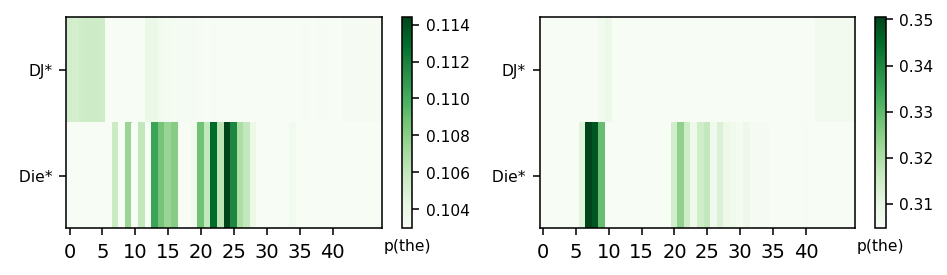

--------------------------------------------------------------------------
Example 2 (top any token) 'DJ  Die  is  native  to'
--------------------------------------------------------------------------


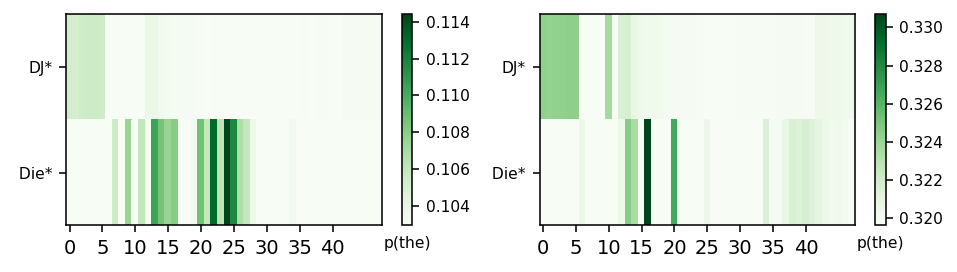

Which pair of patterns is most similar? Example 1 or 2?
If both are equally simlar, write '3'. If none are remotely similar, write '0'.
0
--------------------------------------------------------------------------
Example 1 (top candidate token) 'DJ  Die  origin ates  from'
--------------------------------------------------------------------------


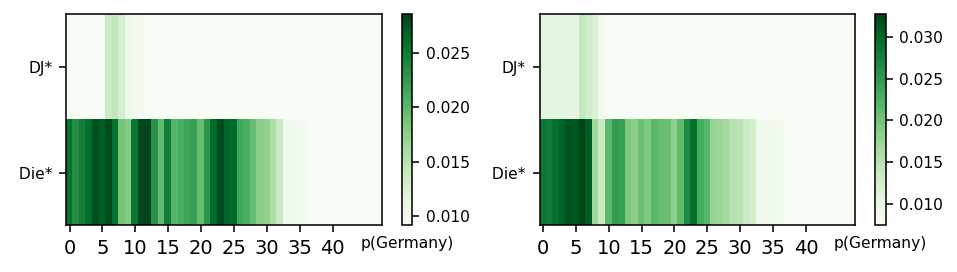

--------------------------------------------------------------------------
Example 2 (top candidate token) 'DJ  Die  is  native  to'
--------------------------------------------------------------------------


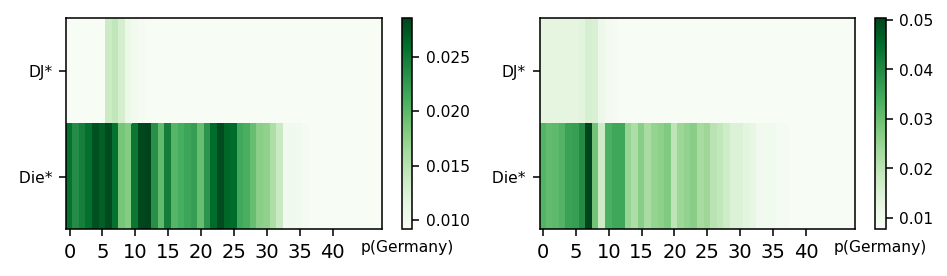

Which pair of patterns is most similar? Example 1 or 2?
If both are equally simlar, write '3'. If none are remotely similar, write '0'.
1
SAMPLE 81 out of 100
--------------------------------------------------------------------------
Example 1 (top any token) 'Mic hel  Bra ult  is  native  to'
--------------------------------------------------------------------------


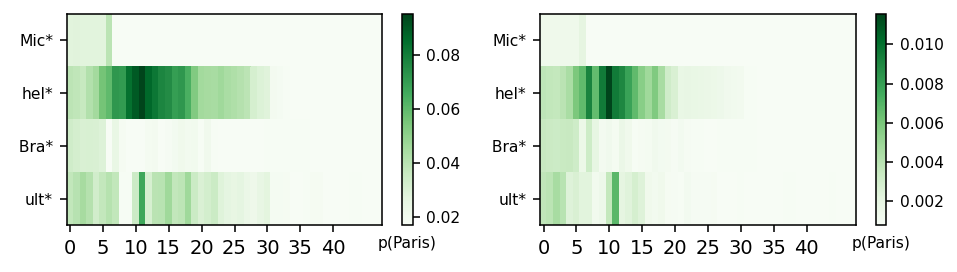

--------------------------------------------------------------------------
Example 2 (top any token) 'Mic hel  Bra ult  was  originally  from'
--------------------------------------------------------------------------


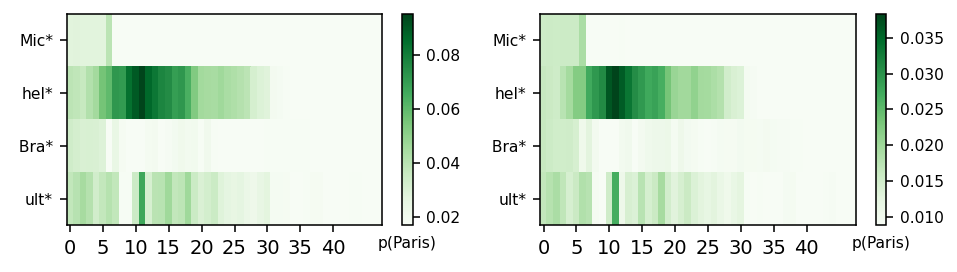

Which pair of patterns is most similar? Example 1 or 2?
If both are equally simlar, write '3'. If none are remotely similar, write '0'.
2
--------------------------------------------------------------------------
Example 1 (top candidate token) 'Mic hel  Bra ult  is  native  to'
--------------------------------------------------------------------------


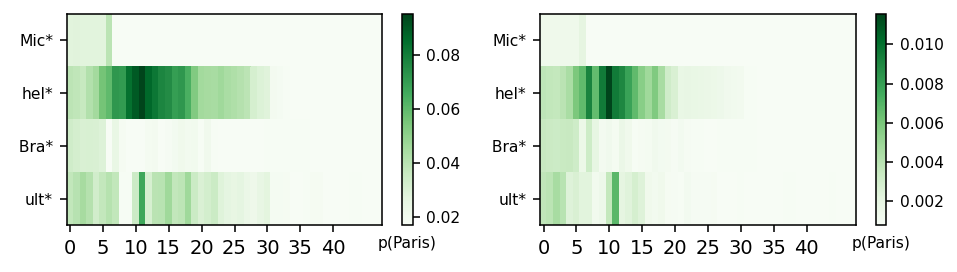

--------------------------------------------------------------------------
Example 2 (top candidate token) 'Mic hel  Bra ult  was  originally  from'
--------------------------------------------------------------------------


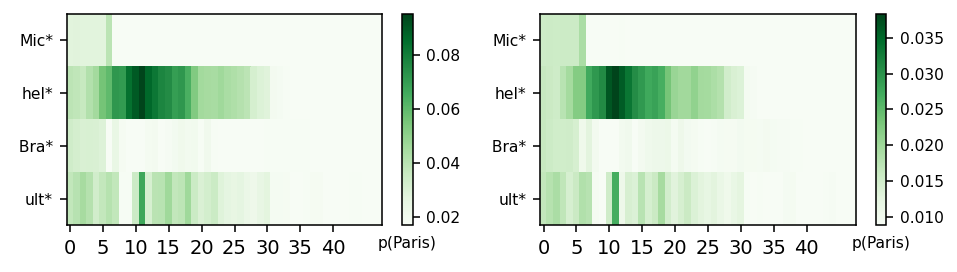

Which pair of patterns is most similar? Example 1 or 2?
If both are equally simlar, write '3'. If none are remotely similar, write '0'.
2
SAMPLE 82 out of 100
--------------------------------------------------------------------------
Example 1 (top any token) 'Tony  Rumble  is  originally  from'
--------------------------------------------------------------------------


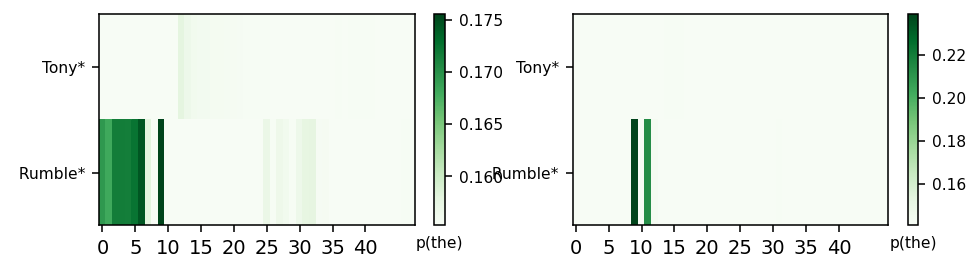

--------------------------------------------------------------------------
Example 2 (top any token) 'Tony  Rumble  originated  from'
--------------------------------------------------------------------------


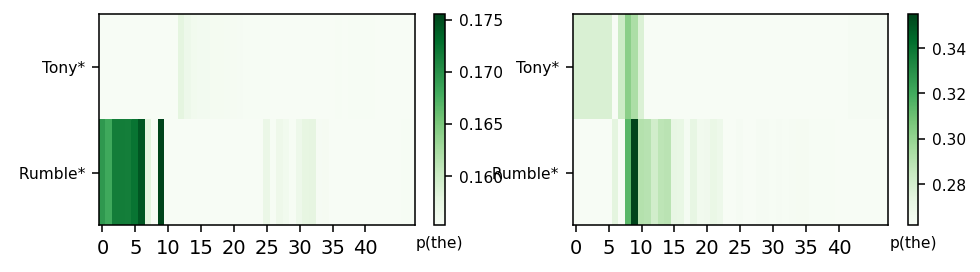

Which pair of patterns is most similar? Example 1 or 2?
If both are equally simlar, write '3'. If none are remotely similar, write '0'.
0
--------------------------------------------------------------------------
Example 1 (top candidate token) 'Tony  Rumble  is  originally  from'
--------------------------------------------------------------------------


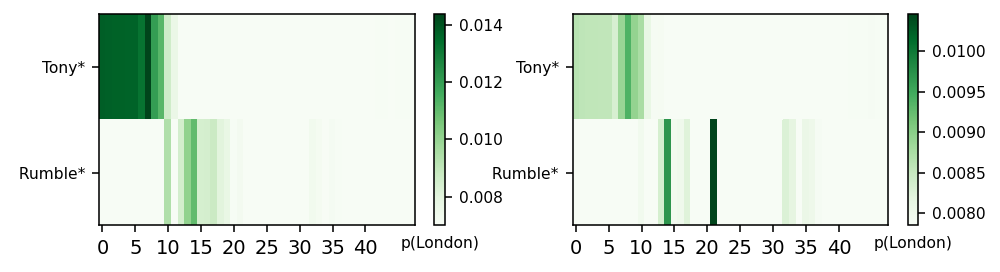

--------------------------------------------------------------------------
Example 2 (top candidate token) 'Tony  Rumble  originated  from'
--------------------------------------------------------------------------


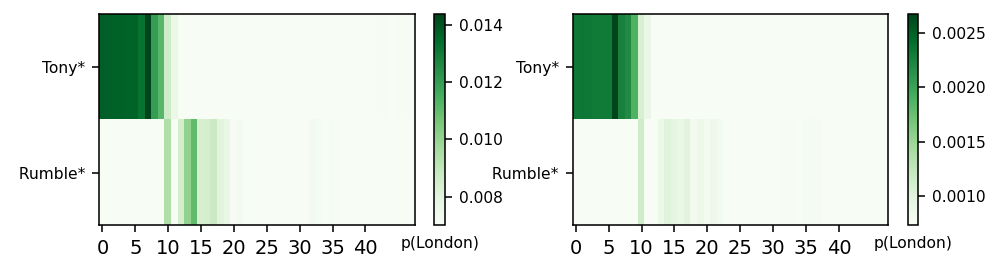

Which pair of patterns is most similar? Example 1 or 2?
If both are equally simlar, write '3'. If none are remotely similar, write '0'.
2
SAMPLE 83 out of 100
--------------------------------------------------------------------------
Example 1 (top any token) 'Simon  Pull man  is  native  to'
--------------------------------------------------------------------------


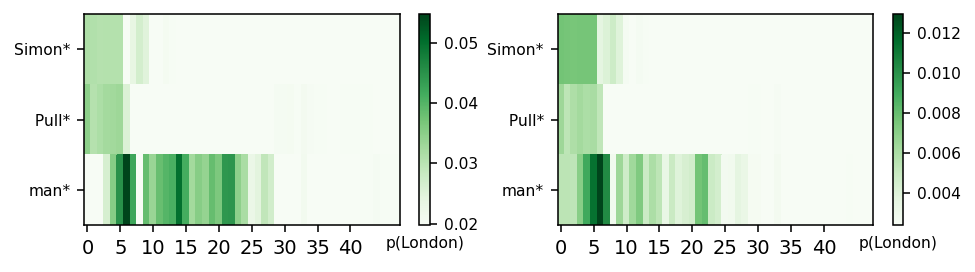

--------------------------------------------------------------------------
Example 2 (top any token) 'Simon  Pull man  originated  from'
--------------------------------------------------------------------------


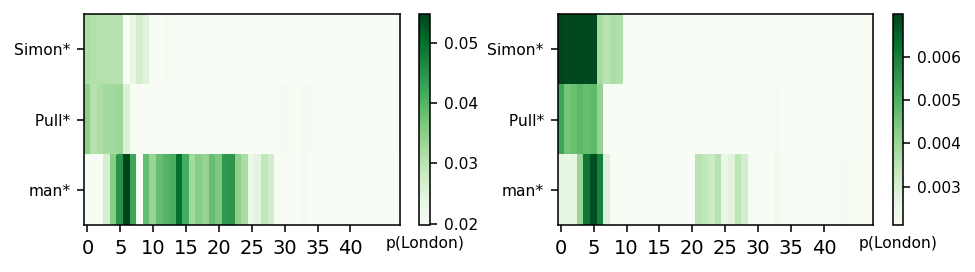

Which pair of patterns is most similar? Example 1 or 2?
If both are equally simlar, write '3'. If none are remotely similar, write '0'.
1
--------------------------------------------------------------------------
Example 1 (top candidate token) 'Simon  Pull man  is  native  to'
--------------------------------------------------------------------------


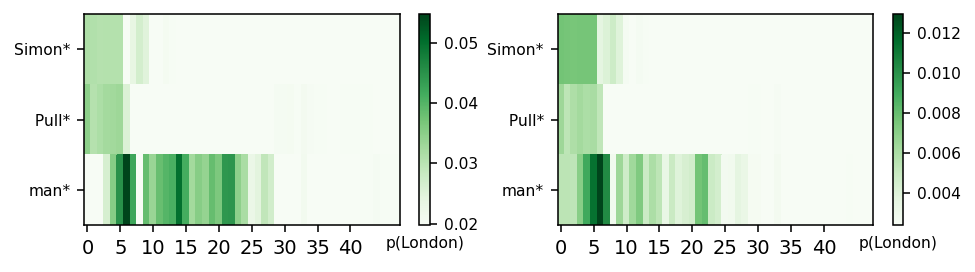

--------------------------------------------------------------------------
Example 2 (top candidate token) 'Simon  Pull man  originated  from'
--------------------------------------------------------------------------


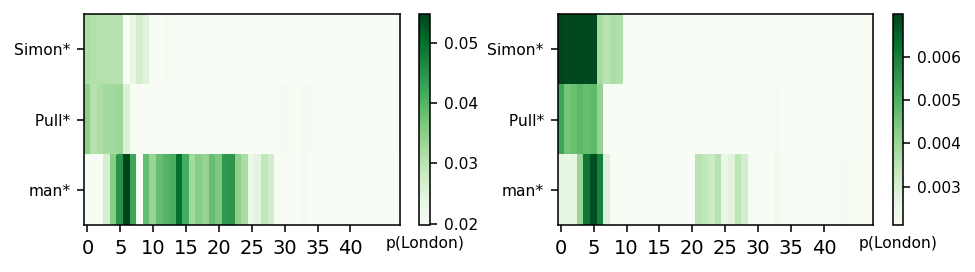

Which pair of patterns is most similar? Example 1 or 2?
If both are equally simlar, write '3'. If none are remotely similar, write '0'.
1
SAMPLE 84 out of 100
--------------------------------------------------------------------------
Example 1 (top any token) 'John  de  Brit o  was  native  to'
--------------------------------------------------------------------------


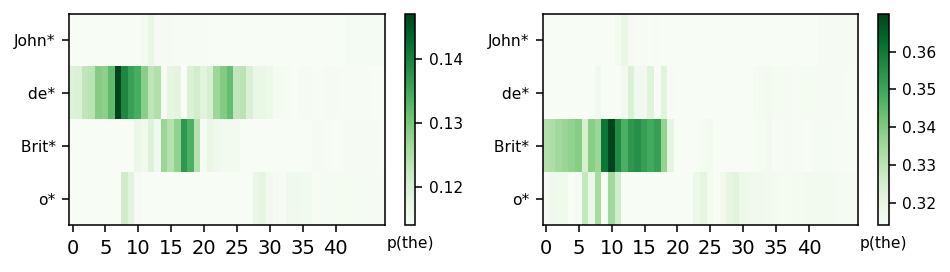

--------------------------------------------------------------------------
Example 2 (top any token) 'John  de  Brit o  origin ates  from'
--------------------------------------------------------------------------


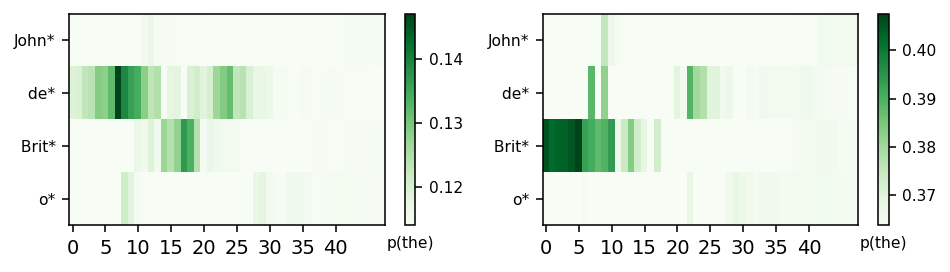

Which pair of patterns is most similar? Example 1 or 2?
If both are equally simlar, write '3'. If none are remotely similar, write '0'.
0
--------------------------------------------------------------------------
Example 1 (top candidate token) 'John  de  Brit o  was  native  to'
--------------------------------------------------------------------------


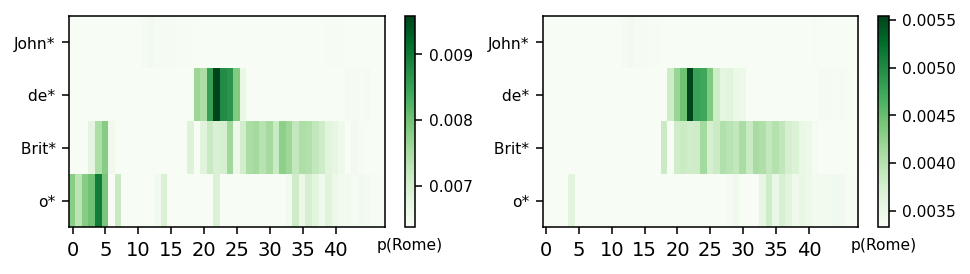

--------------------------------------------------------------------------
Example 2 (top candidate token) 'John  de  Brit o  origin ates  from'
--------------------------------------------------------------------------


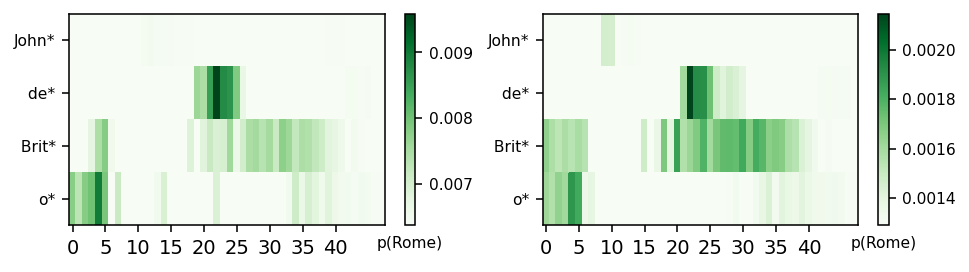

Which pair of patterns is most similar? Example 1 or 2?
If both are equally simlar, write '3'. If none are remotely similar, write '0'.
3
SAMPLE 85 out of 100
--------------------------------------------------------------------------
Example 1 (top any token) 'Tar as  K uz io  origin ates  from'
--------------------------------------------------------------------------


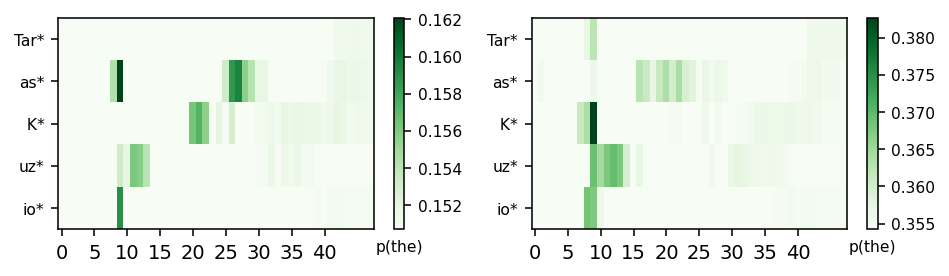

--------------------------------------------------------------------------
Example 2 (top any token) 'Tar as  K uz io  was  native  to'
--------------------------------------------------------------------------


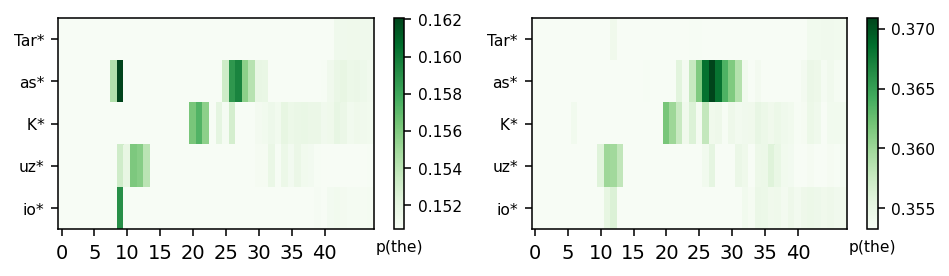

Which pair of patterns is most similar? Example 1 or 2?
If both are equally simlar, write '3'. If none are remotely similar, write '0'.
2
--------------------------------------------------------------------------
Example 1 (top candidate token) 'Tar as  K uz io  origin ates  from'
--------------------------------------------------------------------------


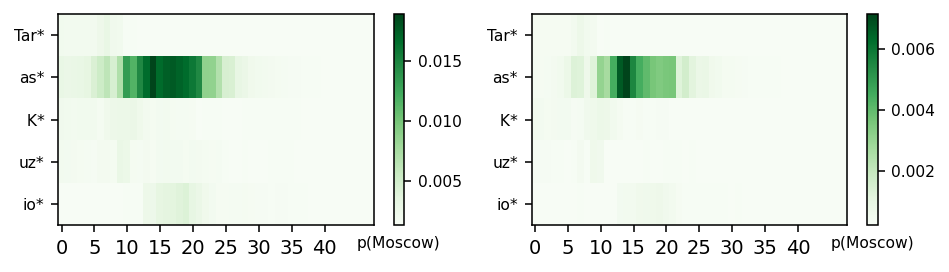

--------------------------------------------------------------------------
Example 2 (top candidate token) 'Tar as  K uz io  was  native  to'
--------------------------------------------------------------------------


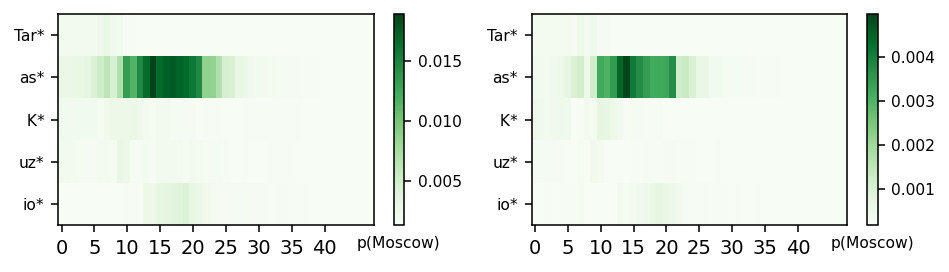

Which pair of patterns is most similar? Example 1 or 2?
If both are equally simlar, write '3'. If none are remotely similar, write '0'.
3
SAMPLE 86 out of 100
--------------------------------------------------------------------------
Example 1 (top any token) 'Kay  Armen  is  originally  from'
--------------------------------------------------------------------------


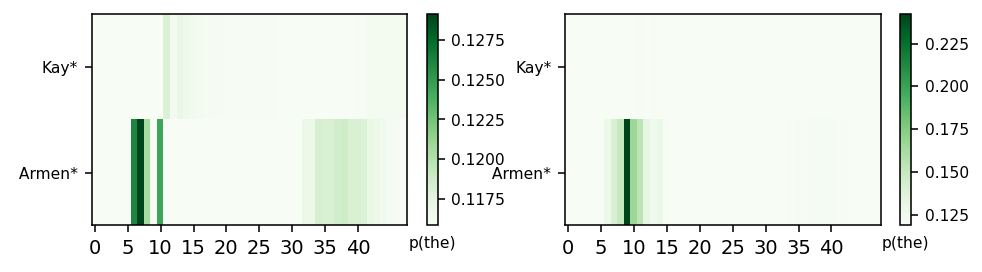

--------------------------------------------------------------------------
Example 2 (top any token) 'Kay  Armen  originated  from'
--------------------------------------------------------------------------


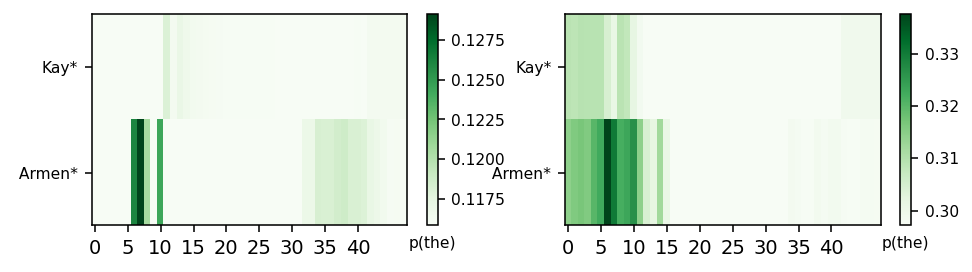

Which pair of patterns is most similar? Example 1 or 2?
If both are equally simlar, write '3'. If none are remotely similar, write '0'.
0
--------------------------------------------------------------------------
Example 1 (top candidate token) 'Kay  Armen  is  originally  from'
--------------------------------------------------------------------------


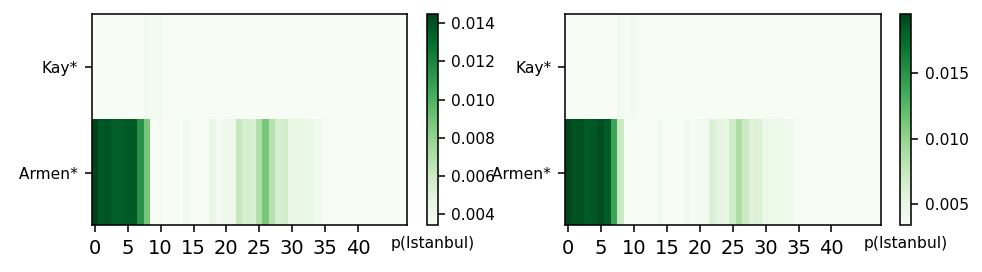

--------------------------------------------------------------------------
Example 2 (top candidate token) 'Kay  Armen  originated  from'
--------------------------------------------------------------------------


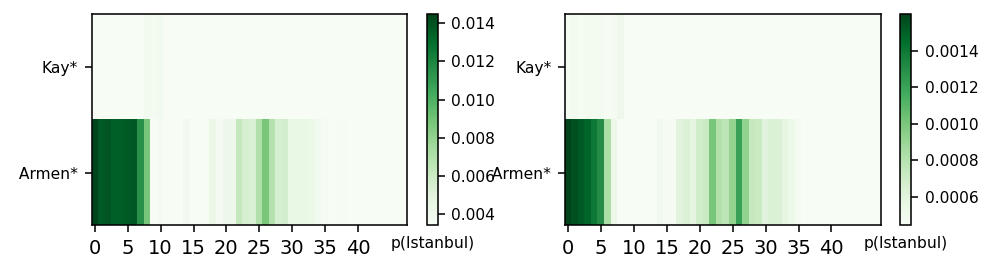

Which pair of patterns is most similar? Example 1 or 2?
If both are equally simlar, write '3'. If none are remotely similar, write '0'.
1
SAMPLE 87 out of 100
--------------------------------------------------------------------------
Example 1 (top any token) 'Jean - Mic hel  Du bern ard  originated  from'
--------------------------------------------------------------------------


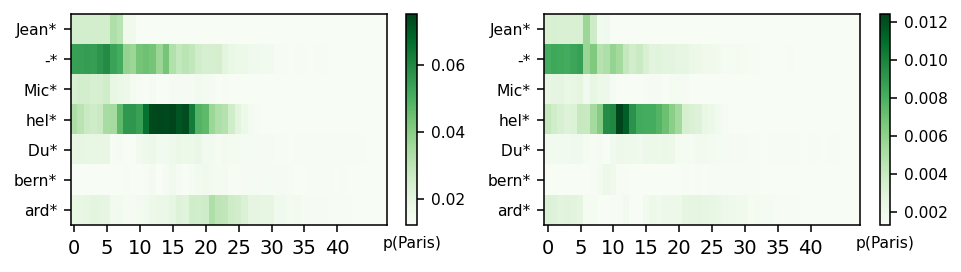

--------------------------------------------------------------------------
Example 2 (top any token) 'Jean - Mic hel  Du bern ard  is  originally  from'
--------------------------------------------------------------------------


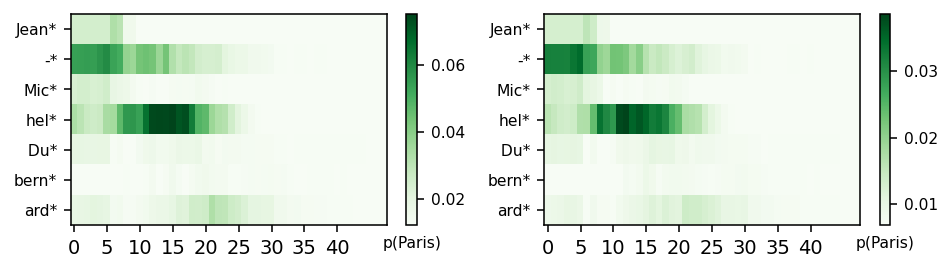

Which pair of patterns is most similar? Example 1 or 2?
If both are equally simlar, write '3'. If none are remotely similar, write '0'.
3
--------------------------------------------------------------------------
Example 1 (top candidate token) 'Jean - Mic hel  Du bern ard  originated  from'
--------------------------------------------------------------------------


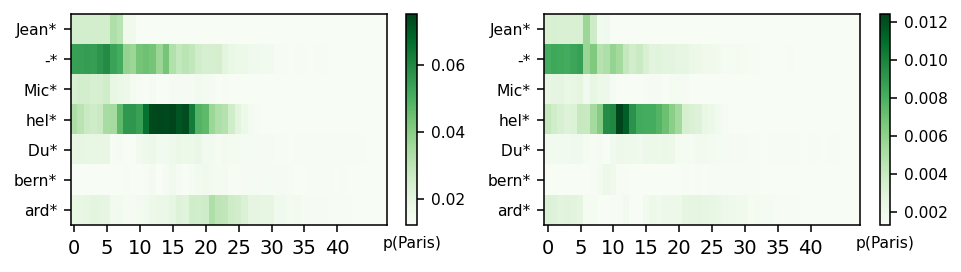

--------------------------------------------------------------------------
Example 2 (top candidate token) 'Jean - Mic hel  Du bern ard  is  originally  from'
--------------------------------------------------------------------------


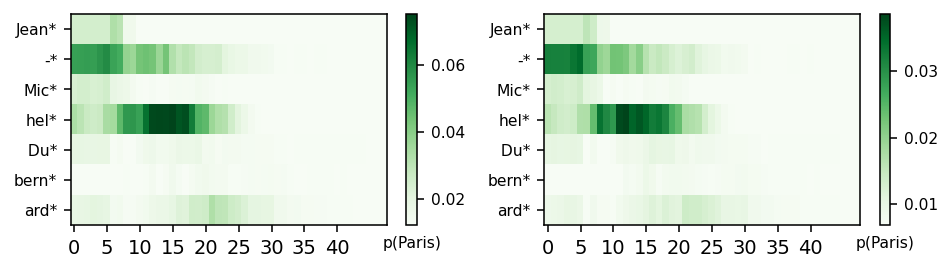

Which pair of patterns is most similar? Example 1 or 2?
If both are equally simlar, write '3'. If none are remotely similar, write '0'.
2
SAMPLE 88 out of 100
--------------------------------------------------------------------------
Example 1 (top any token) 'Her bert  Call en  was  originally  from'
--------------------------------------------------------------------------


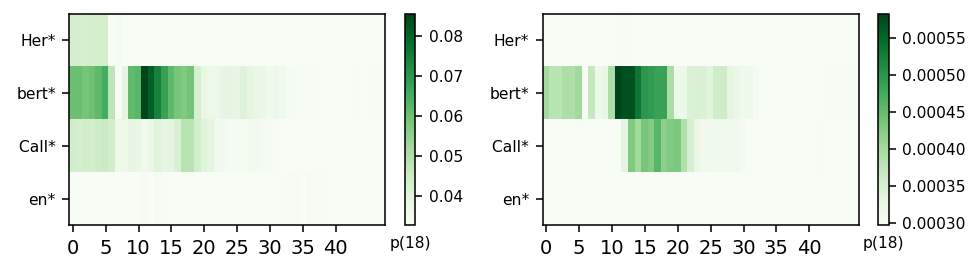

--------------------------------------------------------------------------
Example 2 (top any token) 'Her bert  Call en  was  native  to'
--------------------------------------------------------------------------


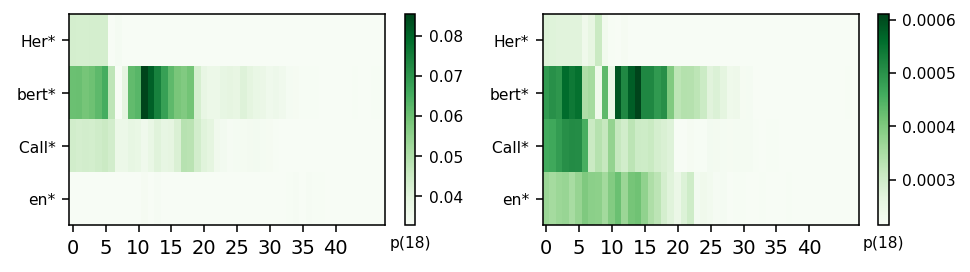

Which pair of patterns is most similar? Example 1 or 2?
If both are equally simlar, write '3'. If none are remotely similar, write '0'.
1
--------------------------------------------------------------------------
Example 1 (top candidate token) 'Her bert  Call en  was  originally  from'
--------------------------------------------------------------------------


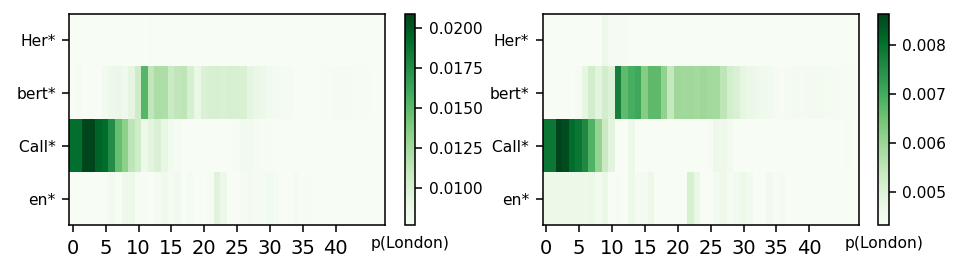

--------------------------------------------------------------------------
Example 2 (top candidate token) 'Her bert  Call en  was  native  to'
--------------------------------------------------------------------------


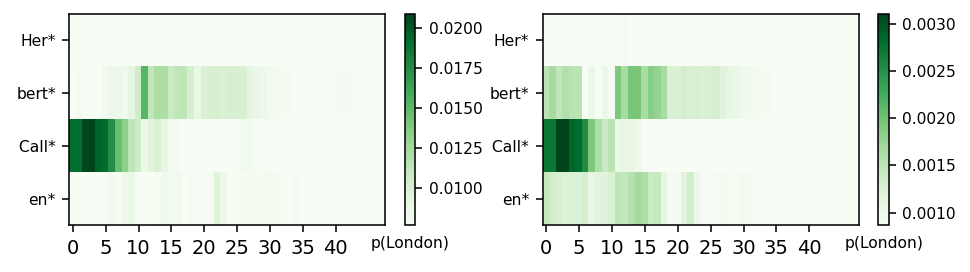

Which pair of patterns is most similar? Example 1 or 2?
If both are equally simlar, write '3'. If none are remotely similar, write '0'.
1
SAMPLE 89 out of 100
--------------------------------------------------------------------------
Example 1 (top any token) 'Jim  Lever ton  is  originally  from'
--------------------------------------------------------------------------


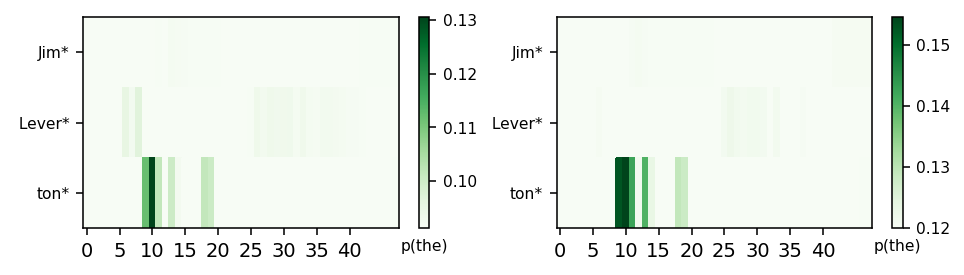

--------------------------------------------------------------------------
Example 2 (top any token) 'Jim  Lever ton  originated  from'
--------------------------------------------------------------------------


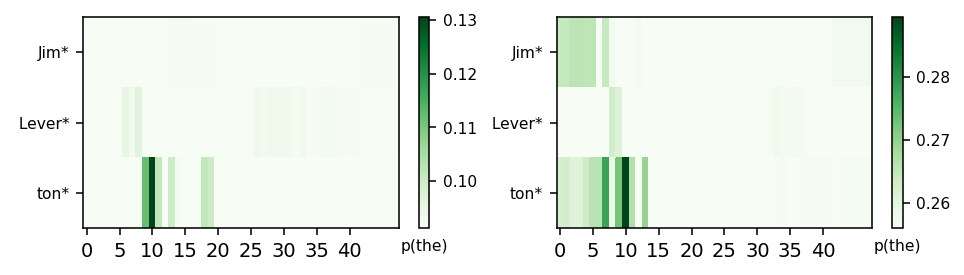

Which pair of patterns is most similar? Example 1 or 2?
If both are equally simlar, write '3'. If none are remotely similar, write '0'.
1
--------------------------------------------------------------------------
Example 1 (top candidate token) 'Jim  Lever ton  is  originally  from'
--------------------------------------------------------------------------


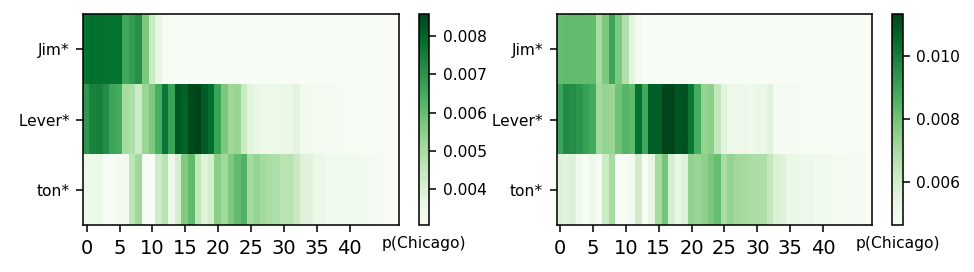

--------------------------------------------------------------------------
Example 2 (top candidate token) 'Jim  Lever ton  originated  from'
--------------------------------------------------------------------------


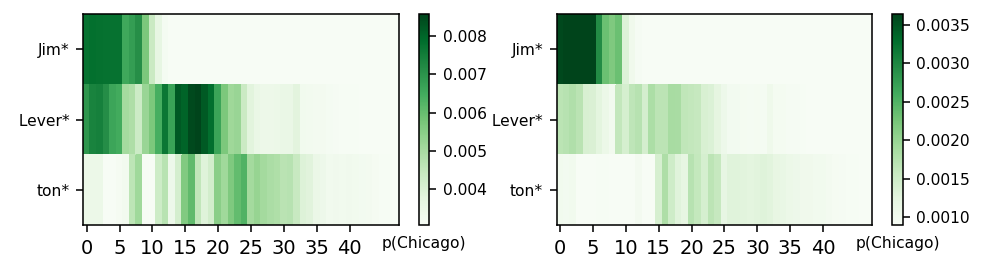

Which pair of patterns is most similar? Example 1 or 2?
If both are equally simlar, write '3'. If none are remotely similar, write '0'.
1
SAMPLE 90 out of 100
--------------------------------------------------------------------------
Example 1 (top any token) 'V ic  S otto  is  native  to'
--------------------------------------------------------------------------


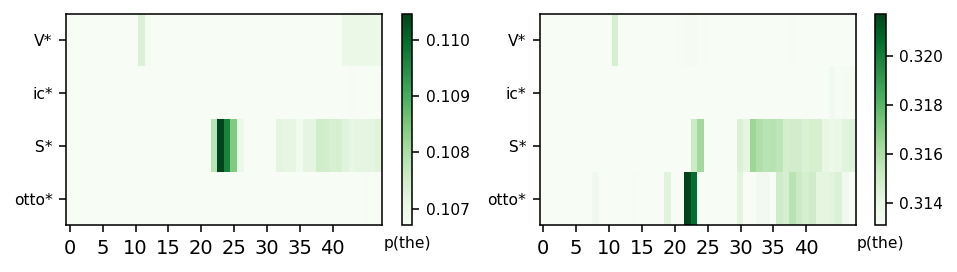

--------------------------------------------------------------------------
Example 2 (top any token) 'V ic  S otto  is  originally  from'
--------------------------------------------------------------------------


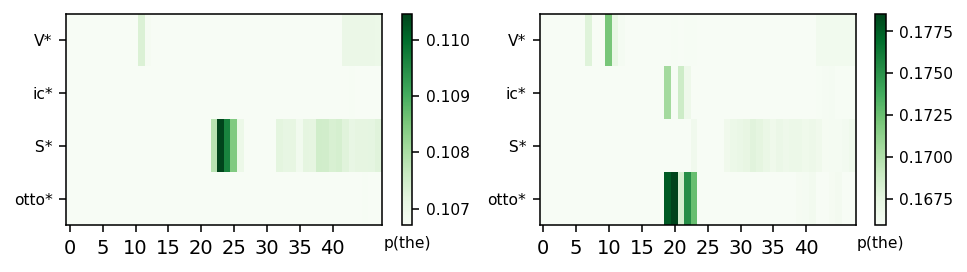

Which pair of patterns is most similar? Example 1 or 2?
If both are equally simlar, write '3'. If none are remotely similar, write '0'.
0
--------------------------------------------------------------------------
Example 1 (top candidate token) 'V ic  S otto  is  native  to'
--------------------------------------------------------------------------


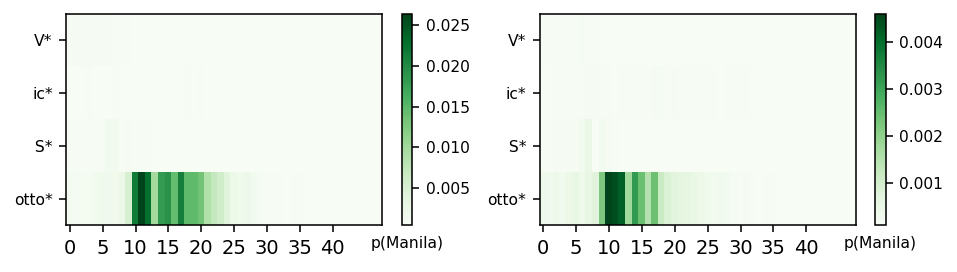

--------------------------------------------------------------------------
Example 2 (top candidate token) 'V ic  S otto  is  originally  from'
--------------------------------------------------------------------------


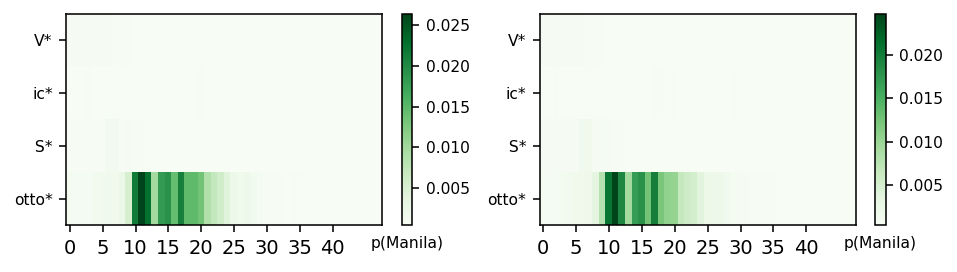

Which pair of patterns is most similar? Example 1 or 2?
If both are equally simlar, write '3'. If none are remotely similar, write '0'.
2
SAMPLE 91 out of 100
--------------------------------------------------------------------------
Example 1 (top any token) 'The odore  the  Stud ite  origin ates  from'
--------------------------------------------------------------------------


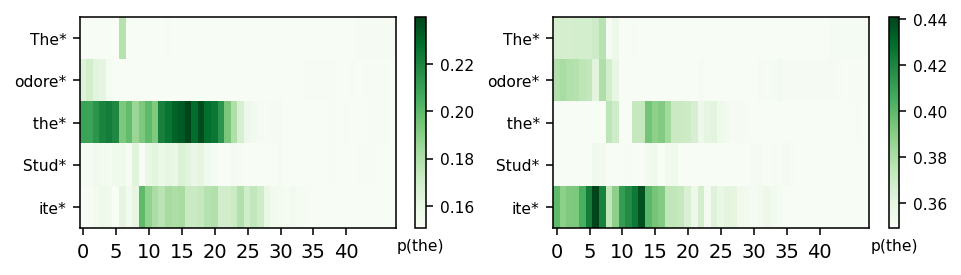

--------------------------------------------------------------------------
Example 2 (top any token) 'The odore  the  Stud ite  is  native  to'
--------------------------------------------------------------------------


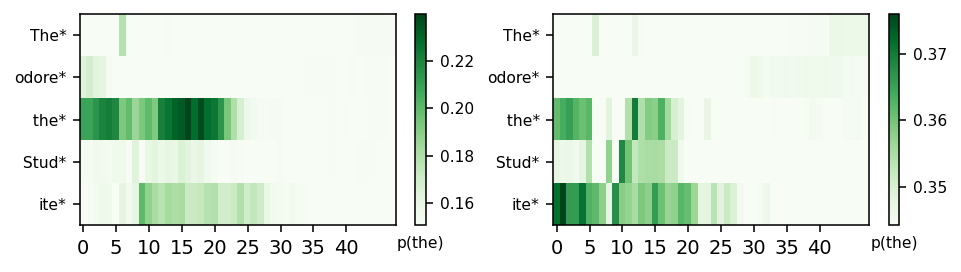

Which pair of patterns is most similar? Example 1 or 2?
If both are equally simlar, write '3'. If none are remotely similar, write '0'.
0
--------------------------------------------------------------------------
Example 1 (top candidate token) 'The odore  the  Stud ite  origin ates  from'
--------------------------------------------------------------------------


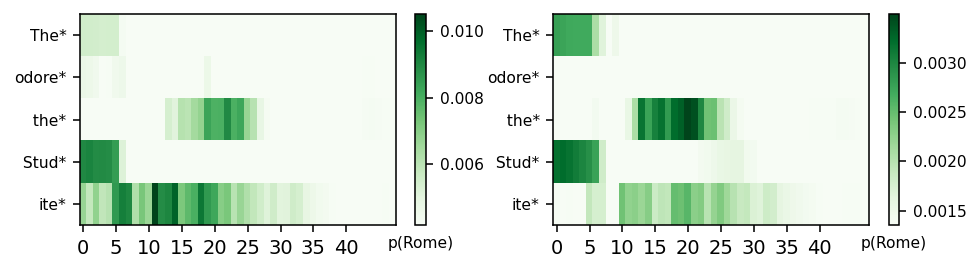

--------------------------------------------------------------------------
Example 2 (top candidate token) 'The odore  the  Stud ite  is  native  to'
--------------------------------------------------------------------------


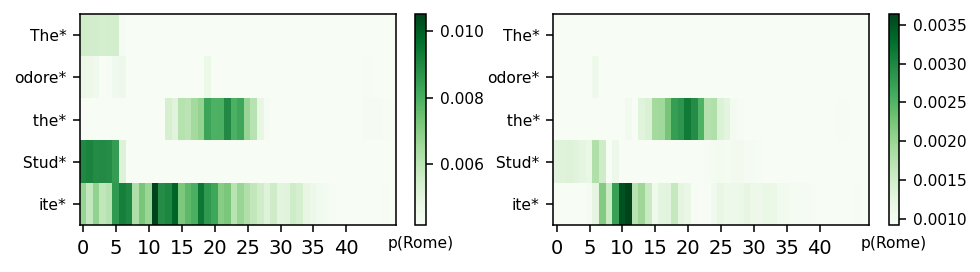

Which pair of patterns is most similar? Example 1 or 2?
If both are equally simlar, write '3'. If none are remotely similar, write '0'.
1
SAMPLE 92 out of 100
--------------------------------------------------------------------------
Example 1 (top any token) 'DJ  Drama  was  native  to'
--------------------------------------------------------------------------


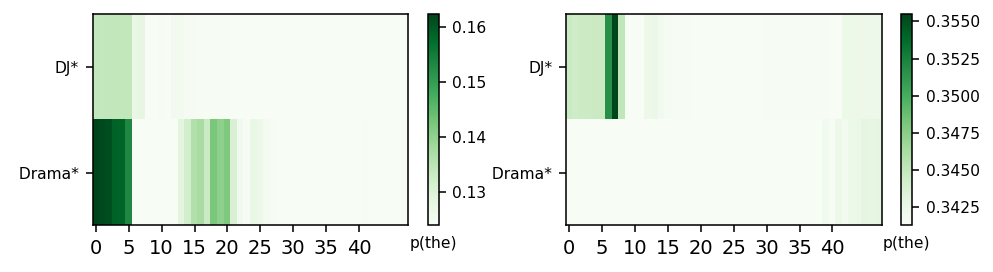

--------------------------------------------------------------------------
Example 2 (top any token) 'DJ  Drama  originated  from'
--------------------------------------------------------------------------


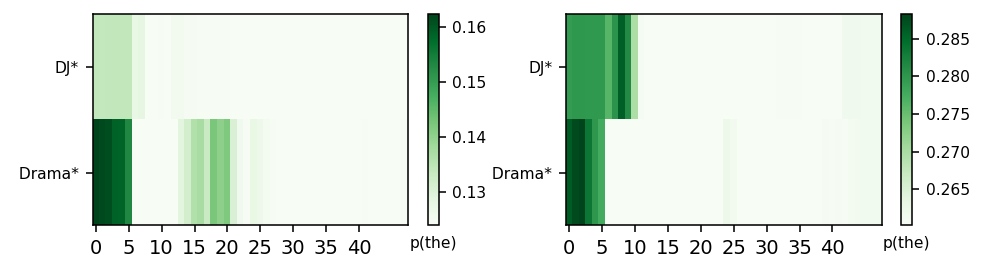

Which pair of patterns is most similar? Example 1 or 2?
If both are equally simlar, write '3'. If none are remotely similar, write '0'.
0
--------------------------------------------------------------------------
Example 1 (top candidate token) 'DJ  Drama  was  native  to'
--------------------------------------------------------------------------


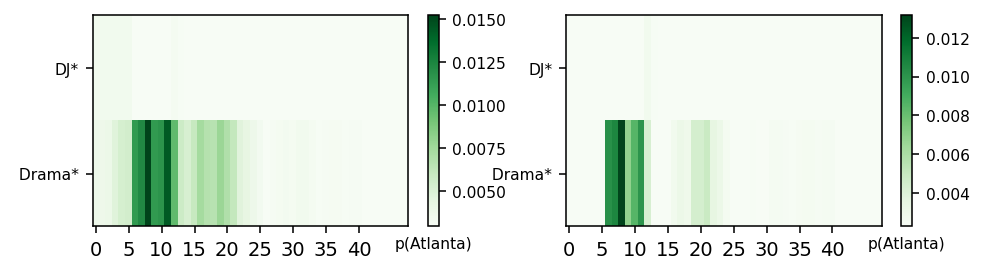

--------------------------------------------------------------------------
Example 2 (top candidate token) 'DJ  Drama  originated  from'
--------------------------------------------------------------------------


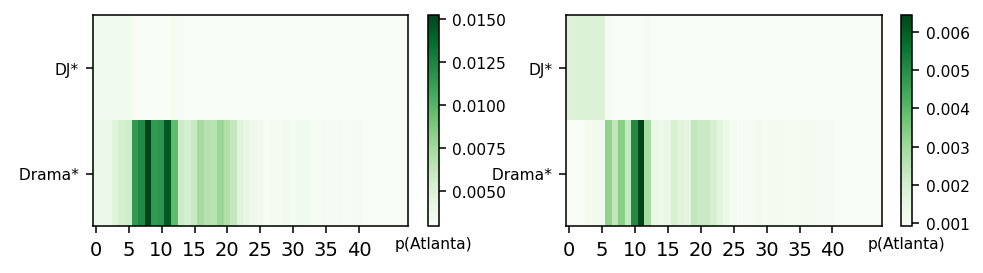

Which pair of patterns is most similar? Example 1 or 2?
If both are equally simlar, write '3'. If none are remotely similar, write '0'.
1
SAMPLE 93 out of 100
--------------------------------------------------------------------------
Example 1 (top any token) 'Ko ichi  Ish ii  originated  from'
--------------------------------------------------------------------------


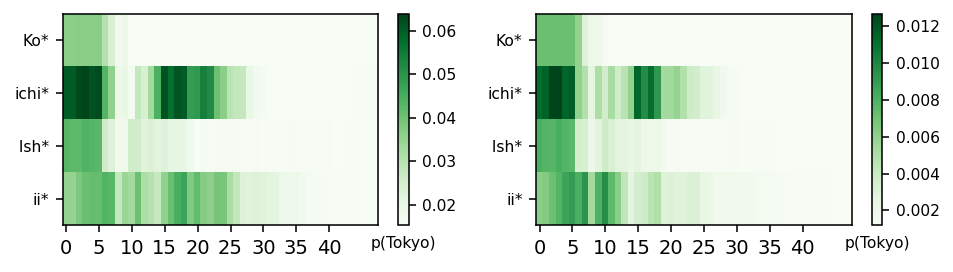

--------------------------------------------------------------------------
Example 2 (top any token) 'Ko ichi  Ish ii  is  native  to'
--------------------------------------------------------------------------


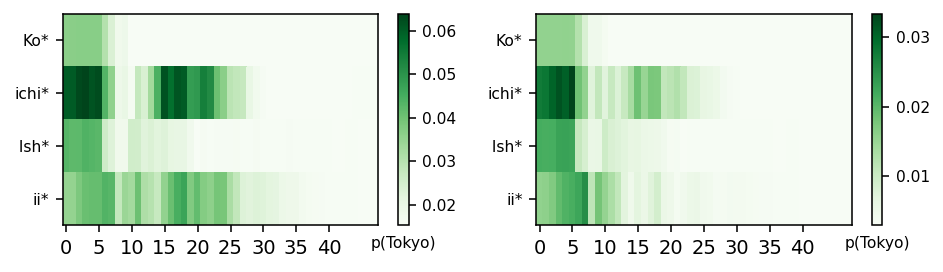

Which pair of patterns is most similar? Example 1 or 2?
If both are equally simlar, write '3'. If none are remotely similar, write '0'.
3
--------------------------------------------------------------------------
Example 1 (top candidate token) 'Ko ichi  Ish ii  originated  from'
--------------------------------------------------------------------------


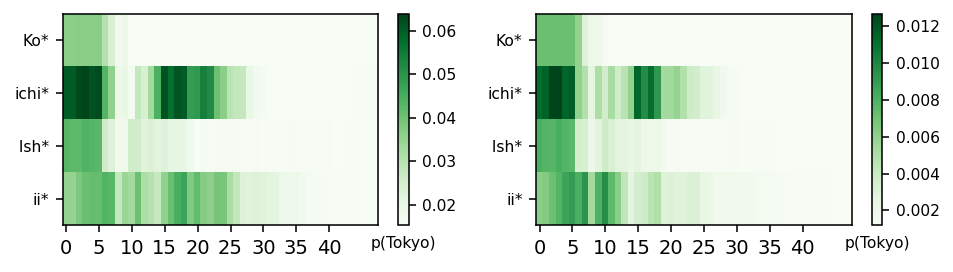

--------------------------------------------------------------------------
Example 2 (top candidate token) 'Ko ichi  Ish ii  is  native  to'
--------------------------------------------------------------------------


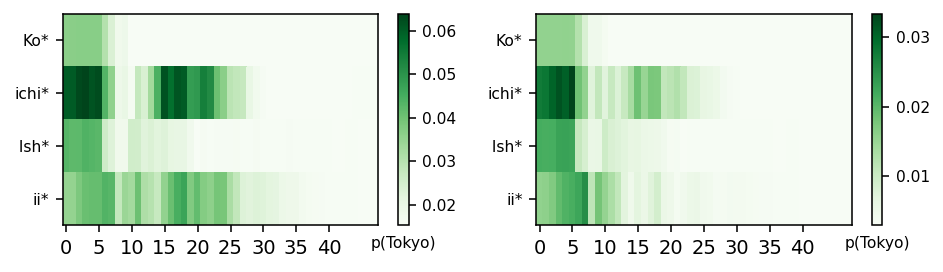

Which pair of patterns is most similar? Example 1 or 2?
If both are equally simlar, write '3'. If none are remotely similar, write '0'.
3
SAMPLE 94 out of 100
--------------------------------------------------------------------------
Example 1 (top any token) 'Cl audio  Co ello  was  originally  from'
--------------------------------------------------------------------------


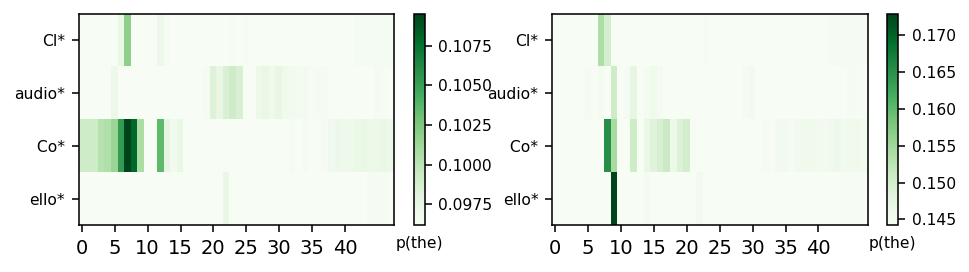

--------------------------------------------------------------------------
Example 2 (top any token) 'Cl audio  Co ello  origin ates  from'
--------------------------------------------------------------------------


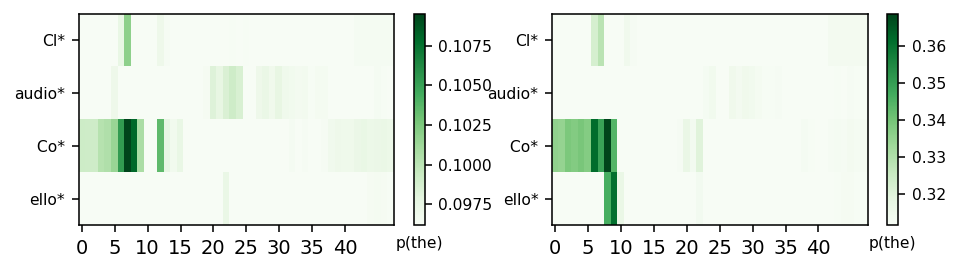

Which pair of patterns is most similar? Example 1 or 2?
If both are equally simlar, write '3'. If none are remotely similar, write '0'.
2
--------------------------------------------------------------------------
Example 1 (top candidate token) 'Cl audio  Co ello  was  originally  from'
--------------------------------------------------------------------------


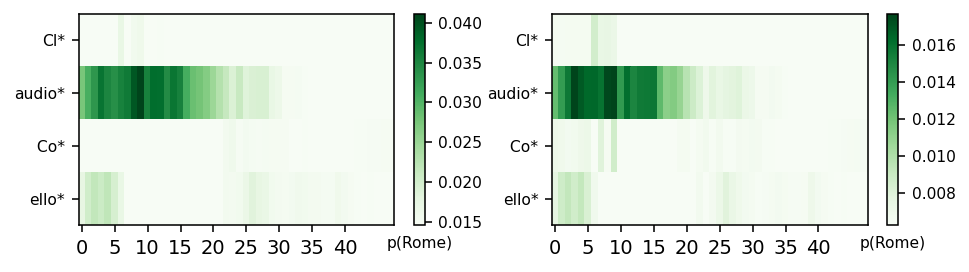

--------------------------------------------------------------------------
Example 2 (top candidate token) 'Cl audio  Co ello  origin ates  from'
--------------------------------------------------------------------------


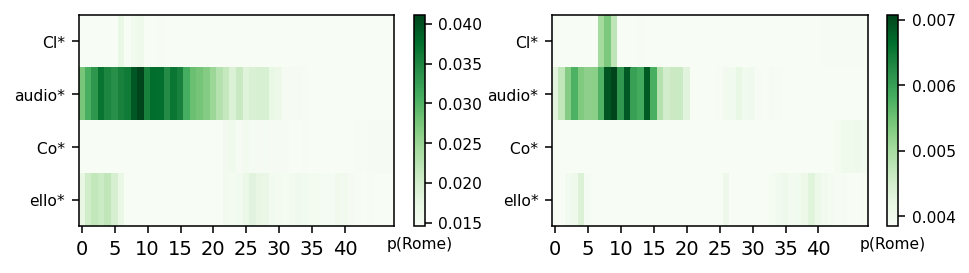

Which pair of patterns is most similar? Example 1 or 2?
If both are equally simlar, write '3'. If none are remotely similar, write '0'.
1
SAMPLE 95 out of 100
--------------------------------------------------------------------------
Example 1 (top any token) 'Mar at  M akh mut ov  origin ates  from'
--------------------------------------------------------------------------


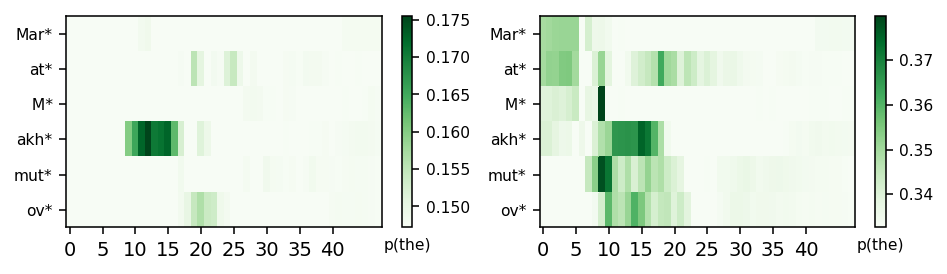

--------------------------------------------------------------------------
Example 2 (top any token) 'Mar at  M akh mut ov  is  native  to'
--------------------------------------------------------------------------


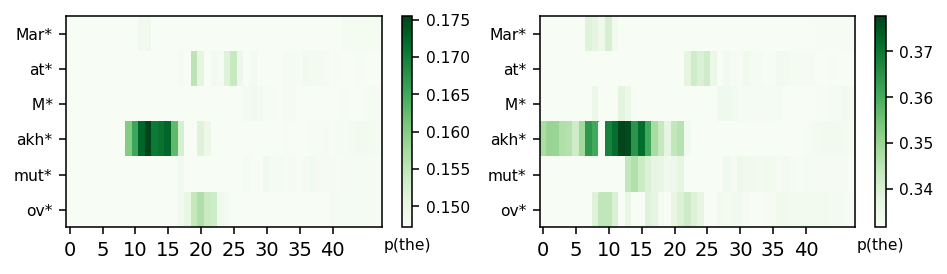

Which pair of patterns is most similar? Example 1 or 2?
If both are equally simlar, write '3'. If none are remotely similar, write '0'.
2
--------------------------------------------------------------------------
Example 1 (top candidate token) 'Mar at  M akh mut ov  origin ates  from'
--------------------------------------------------------------------------


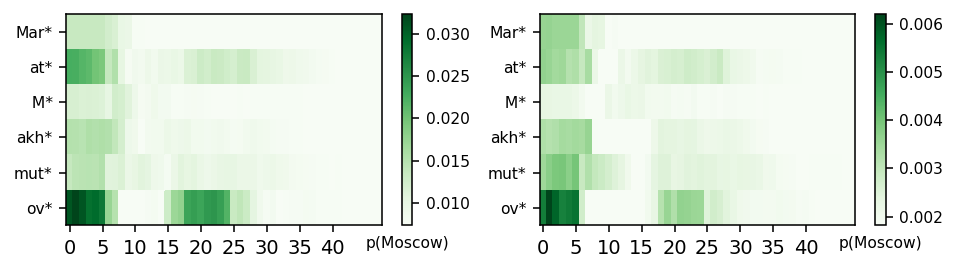

--------------------------------------------------------------------------
Example 2 (top candidate token) 'Mar at  M akh mut ov  is  native  to'
--------------------------------------------------------------------------


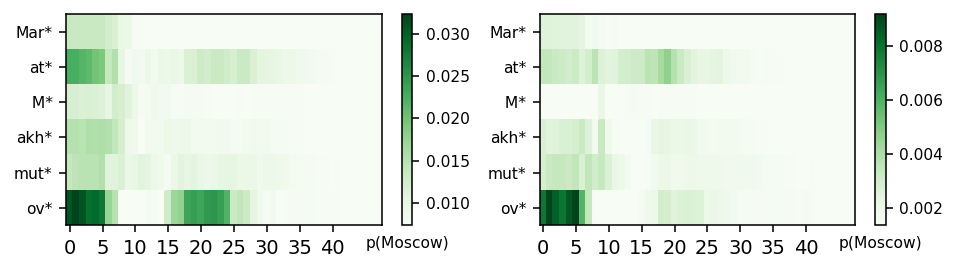

Which pair of patterns is most similar? Example 1 or 2?
If both are equally simlar, write '3'. If none are remotely similar, write '0'.
1
SAMPLE 96 out of 100
--------------------------------------------------------------------------
Example 1 (top any token) 'P as qu ale  Squ it ieri  originated  from'
--------------------------------------------------------------------------


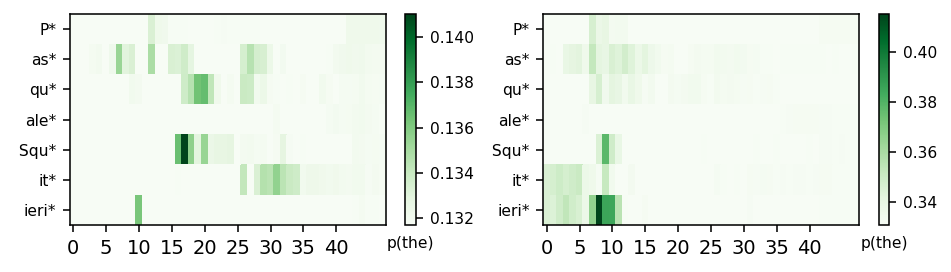

--------------------------------------------------------------------------
Example 2 (top any token) 'P as qu ale  Squ it ieri  was  native  to'
--------------------------------------------------------------------------


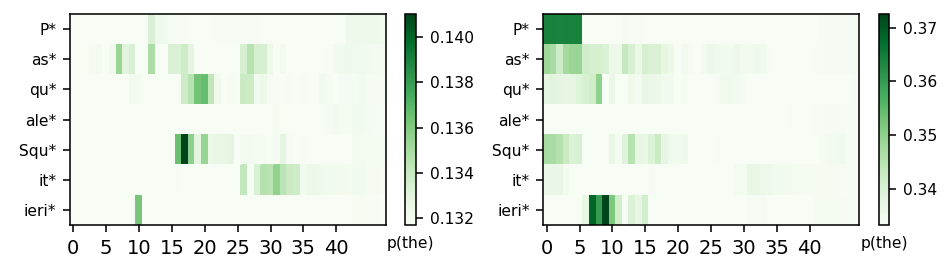

Which pair of patterns is most similar? Example 1 or 2?
If both are equally simlar, write '3'. If none are remotely similar, write '0'.
0
--------------------------------------------------------------------------
Example 1 (top candidate token) 'P as qu ale  Squ it ieri  originated  from'
--------------------------------------------------------------------------


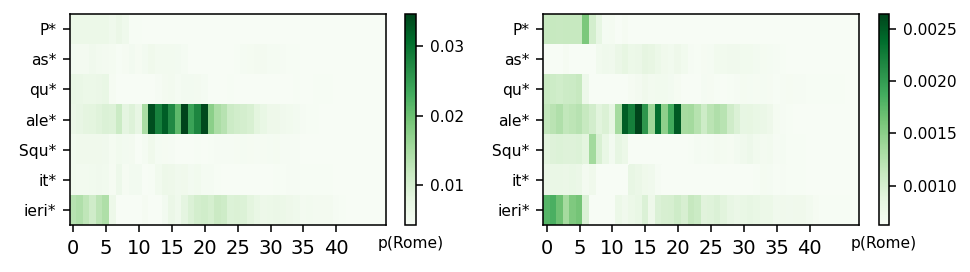

--------------------------------------------------------------------------
Example 2 (top candidate token) 'P as qu ale  Squ it ieri  was  native  to'
--------------------------------------------------------------------------


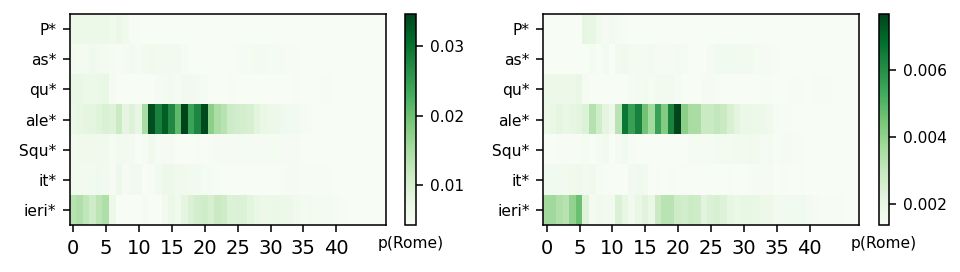

Which pair of patterns is most similar? Example 1 or 2?
If both are equally simlar, write '3'. If none are remotely similar, write '0'.
3
SAMPLE 97 out of 100
--------------------------------------------------------------------------
Example 1 (top any token) 'Robert  Ping et  was  native  to'
--------------------------------------------------------------------------


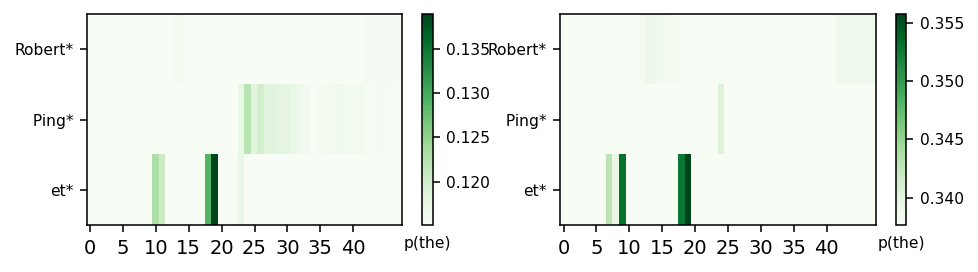

--------------------------------------------------------------------------
Example 2 (top any token) 'Robert  Ping et  is  originally  from'
--------------------------------------------------------------------------


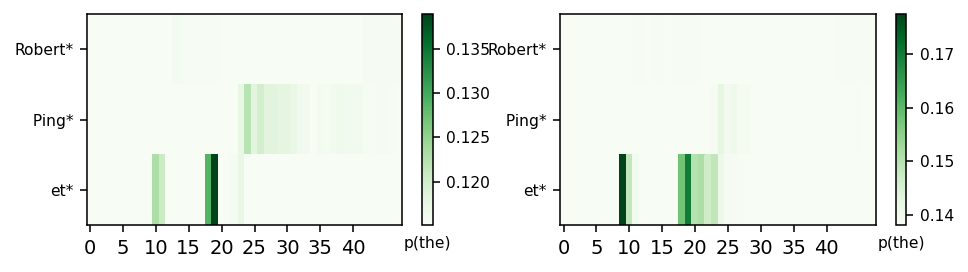

Which pair of patterns is most similar? Example 1 or 2?
If both are equally simlar, write '3'. If none are remotely similar, write '0'.
3
--------------------------------------------------------------------------
Example 1 (top candidate token) 'Robert  Ping et  was  native  to'
--------------------------------------------------------------------------


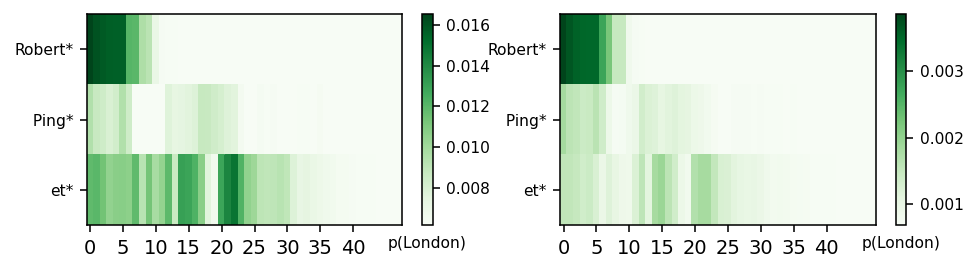

--------------------------------------------------------------------------
Example 2 (top candidate token) 'Robert  Ping et  is  originally  from'
--------------------------------------------------------------------------


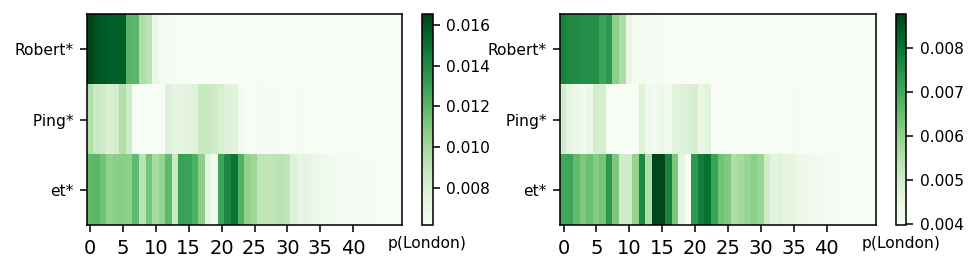

Which pair of patterns is most similar? Example 1 or 2?
If both are equally simlar, write '3'. If none are remotely similar, write '0'.
3
SAMPLE 98 out of 100
--------------------------------------------------------------------------
Example 1 (top any token) 'F ergus  McMaster  is  originally  from'
--------------------------------------------------------------------------


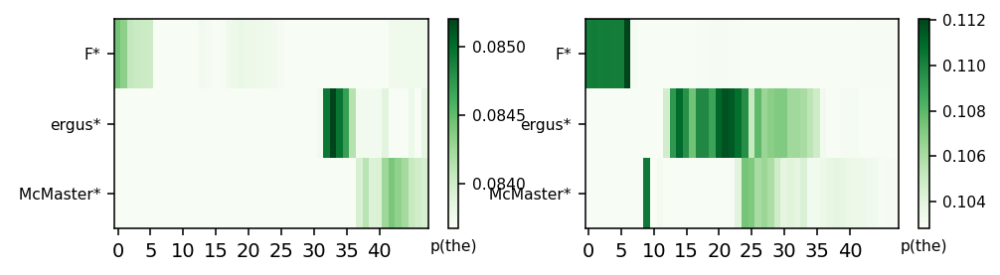

--------------------------------------------------------------------------
Example 2 (top any token) 'F ergus  McMaster  was  native  to'
--------------------------------------------------------------------------


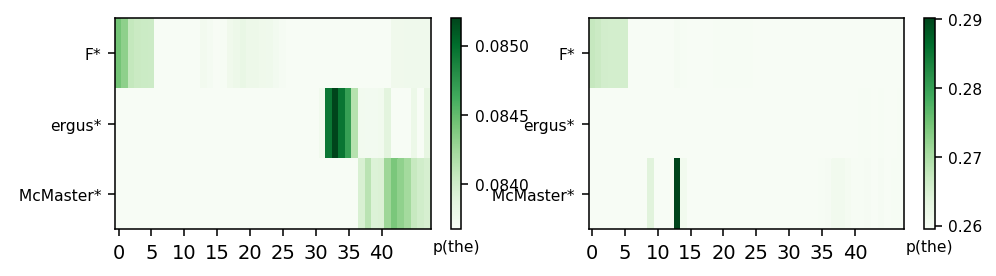

Which pair of patterns is most similar? Example 1 or 2?
If both are equally simlar, write '3'. If none are remotely similar, write '0'.
0
--------------------------------------------------------------------------
Example 1 (top candidate token) 'F ergus  McMaster  is  originally  from'
--------------------------------------------------------------------------


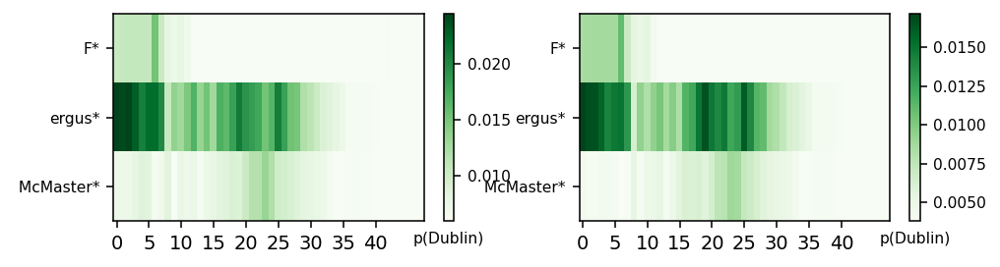

--------------------------------------------------------------------------
Example 2 (top candidate token) 'F ergus  McMaster  was  native  to'
--------------------------------------------------------------------------


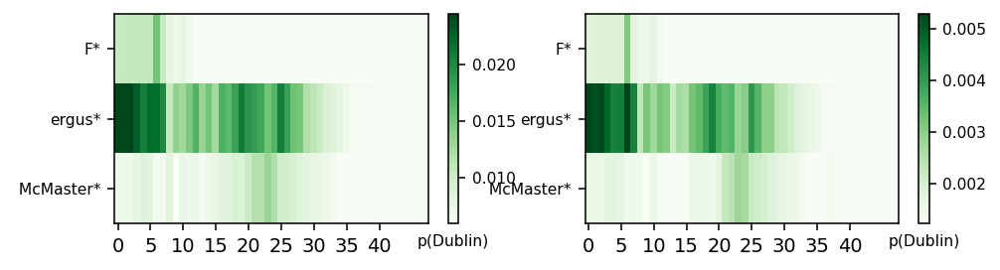

Which pair of patterns is most similar? Example 1 or 2?
If both are equally simlar, write '3'. If none are remotely similar, write '0'.
3
SAMPLE 99 out of 100
--------------------------------------------------------------------------
Example 1 (top any token) 'Ah mad  Zah ir  origin ates  from'
--------------------------------------------------------------------------


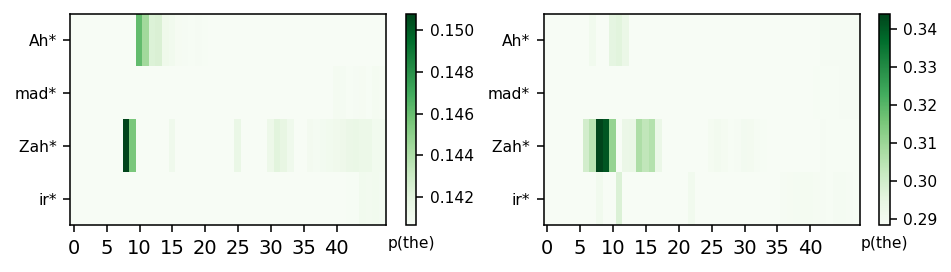

--------------------------------------------------------------------------
Example 2 (top any token) 'Ah mad  Zah ir  is  native  to'
--------------------------------------------------------------------------


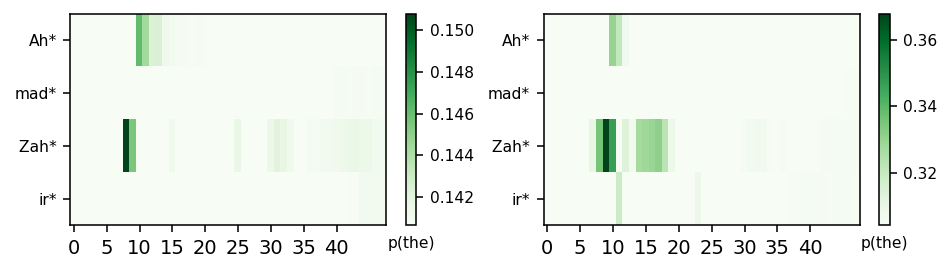

Which pair of patterns is most similar? Example 1 or 2?
If both are equally simlar, write '3'. If none are remotely similar, write '0'.
3
--------------------------------------------------------------------------
Example 1 (top candidate token) 'Ah mad  Zah ir  origin ates  from'
--------------------------------------------------------------------------


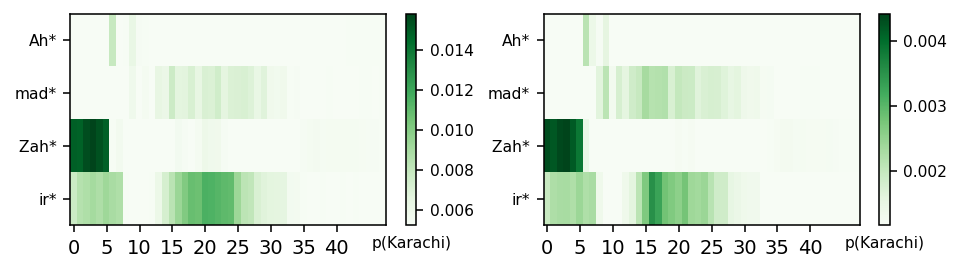

--------------------------------------------------------------------------
Example 2 (top candidate token) 'Ah mad  Zah ir  is  native  to'
--------------------------------------------------------------------------


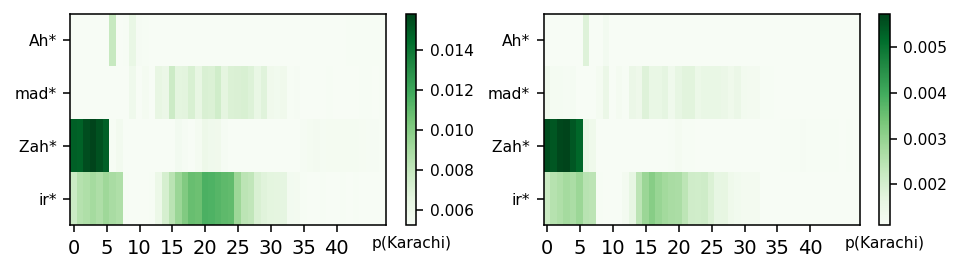

Which pair of patterns is most similar? Example 1 or 2?
If both are equally simlar, write '3'. If none are remotely similar, write '0'.
3


,lama_ix,sample_ix_1,sample_ix_2,token_type,example_more_similar
0,294,295,297,any,1
1,294,295,297,candidate,1
2,4844,4845,4848,any,2
3,4844,4845,4848,candidate,1
4,4529,4531,4534,any,1


In [15]:
num_cases = 100

for subj_ix, subject in enumerate(random.sample(list(queries.subject.unique()), num_cases)):
    print("=======================================================================================================")
    print(f"SAMPLE {subj_ix} out of {num_cases}")
    sample_ixs = list(queries[queries.subject==subject].index)
    token_ix = 0 #always measure for top predicted token (or candidate, TODO)
    answer = queries.loc[sample_ixs[0]]["top10_tokens"][token_ix]
    lama_ix = sample_ixs[0]
    try:
        results_lama = np.load(os.path.join(results_folders[0], f"cases/{lama_ix}_any_mlp.npz"), allow_pickle=True)
    except:
        results_lama = np.load(os.path.join(results_folders[1], f"cases/{lama_ix}_any_mlp.npz"), allow_pickle=True)
        
    
    cand_answer = queries.loc[sample_ixs[0]]["candidate_prediction"]
    cand_token_ix = None
    try:
        cand_token_ix = queries.loc[sample_ixs[0]]["top10_tokens"].index(cand_answer)
    except: 
        print("Warning: Candidate prediciton not in top 10 tokens for the sample below.")
        print(queries.loc[sample_ixs[0]])
    
    rand_sample_ixs = random.sample(sample_ixs[1:], 2)
    token_vals = {"any": (token_ix, answer), "candidate": (cand_token_ix, cand_answer)}
    for token_key, token_val in token_vals.items():
        for ix, sample_ix in enumerate(rand_sample_ixs):
            try:
                results = np.load(os.path.join(results_folders[0], f"cases/{sample_ix}_any_mlp.npz"), allow_pickle=True)
            except:
                results = np.load(os.path.join(results_folders[1], f"cases/{sample_ix}_any_mlp.npz"), allow_pickle=True)
            print("--------------------------------------------------------------------------")
            print(f"Example {ix+1} (top {token_key} token) '{(' ').join(results['input_tokens'])}'")
            print("--------------------------------------------------------------------------")
            
            #plot_te_heatmap(results, token_val[0], token_val[1])
            fig, axs = plt.subplots(1, 2, figsize=(8, 2), dpi=140)
            plot_trace_heatmap_for_token_ix(results_lama, token_val[0], True, axs[0])
            plot_trace_heatmap_for_token_ix(results, token_val[0], True, axs[1])
            plt.show()
            
        print("Which pair of patterns is most similar? Example 1 or 2?")
        print("If both are equally simlar, write '3'. If none are remotely similar, write '0'.")
        ok_answer = False
        while not ok_answer:
            example_more_similar = input()
            if example_more_similar in ["1","2","3","0"]:
                example_more_similar = int(example_more_similar)
                ok_answer = True
            else:
                print("The answer must be '1', '2', '3' or '0'.")

        tmp_data = {"lama_ix": lama_ix, 
                   "sample_ix_1": rand_sample_ixs[0], 
                   "sample_ix_2": rand_sample_ixs[1],
                   "token_type": token_key,
                   "example_more_similar": example_more_similar}
        annotated_data = pd.concat([annotated_data, pd.DataFrame([tmp_data])], axis=0, ignore_index=True)

annotated_data.head()

Save the annotations (make sure that you are not involuntarily writing over an existing file!)

In [16]:
annotated_data.to_csv(data_file, index=False)

3 means equally dissimilar or similar
0 means none are similar at all 
"the" generally gives unvaluable results?

## Plot the similarity annotations
(The code below has a small bug, the labels are not correctly aligned. Use `similarity_investigations_plot_score.ipynb` instead.)

In [42]:
annotated_data = pd.read_csv(data_file)

SAMPLE 0
--------------------------------------------------------------------------
Example 1 (top any token) ❌
--------------------------------------------------------------------------


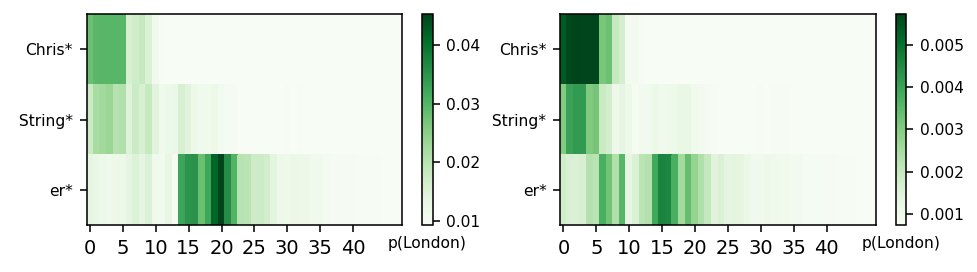

--------------------------------------------------------------------------
Example 2 (top any token) ✅
--------------------------------------------------------------------------


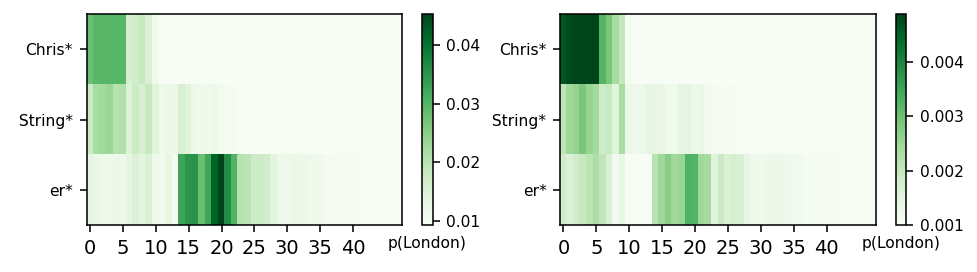

--------------------------------------------------------------------------
Example 1 (top candidate token) ❌
--------------------------------------------------------------------------


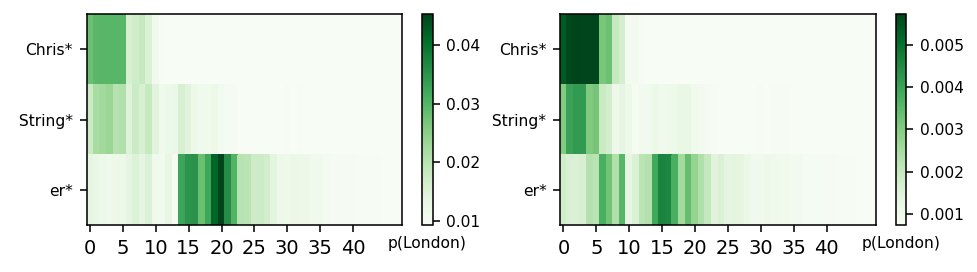

--------------------------------------------------------------------------
Example 2 (top candidate token) ✅
--------------------------------------------------------------------------


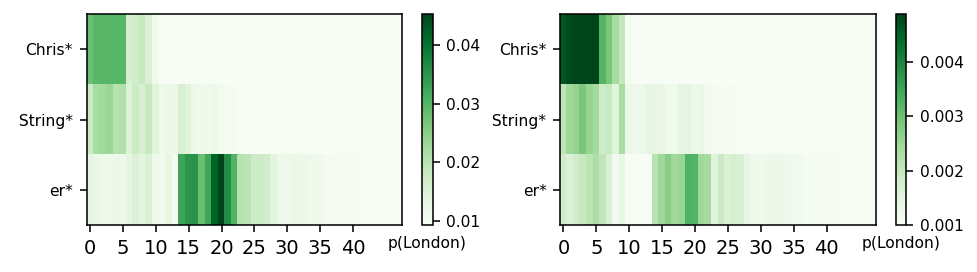

SAMPLE 1
--------------------------------------------------------------------------
Example 1 (top any token) ❌
--------------------------------------------------------------------------


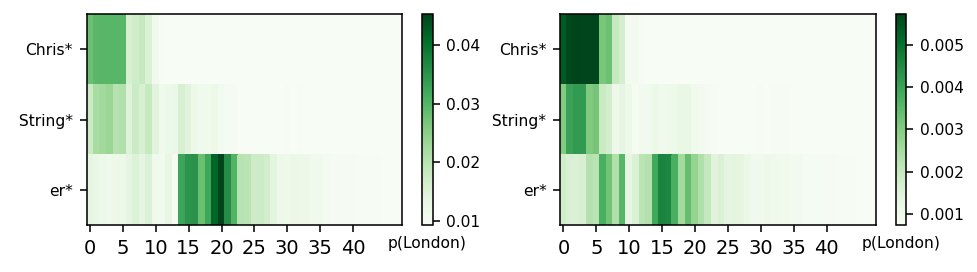

--------------------------------------------------------------------------
Example 2 (top any token) ✅
--------------------------------------------------------------------------


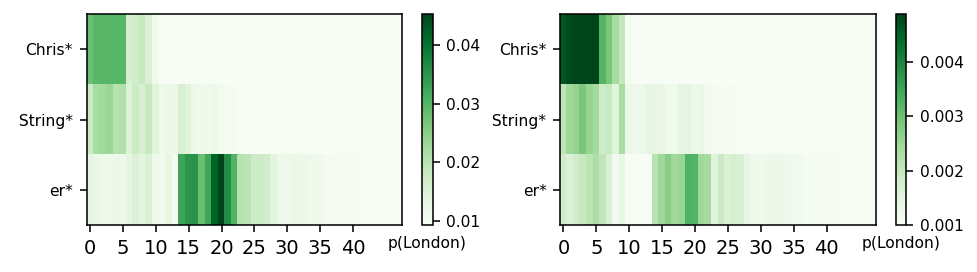

--------------------------------------------------------------------------
Example 1 (top candidate token) ❌
--------------------------------------------------------------------------


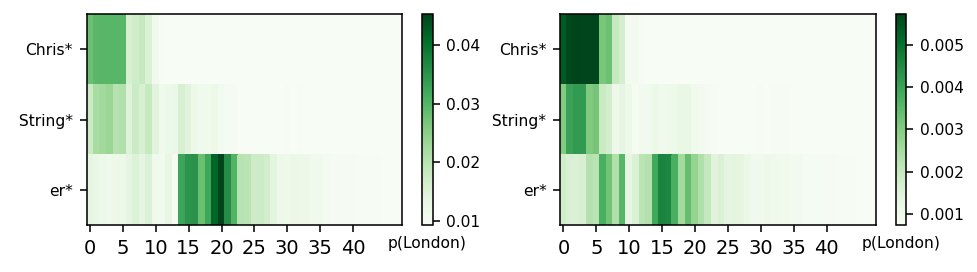

--------------------------------------------------------------------------
Example 2 (top candidate token) ✅
--------------------------------------------------------------------------


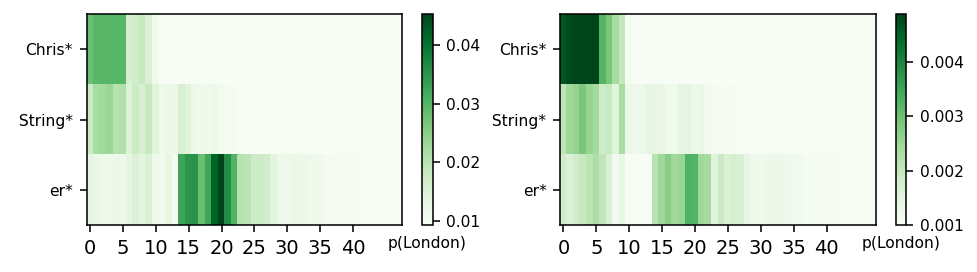

SAMPLE 2
--------------------------------------------------------------------------
Example 1 (top any token) ✅
--------------------------------------------------------------------------


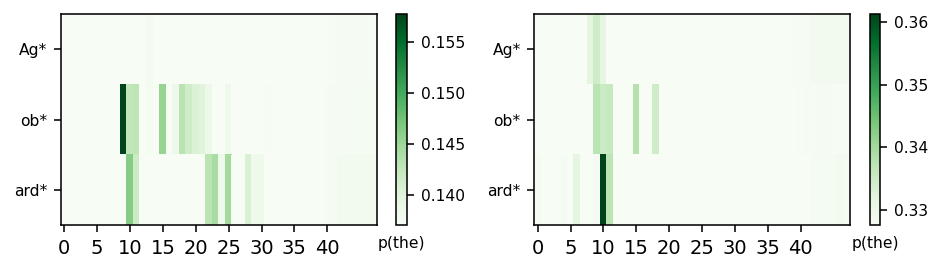

--------------------------------------------------------------------------
Example 2 (top any token) ❌
--------------------------------------------------------------------------


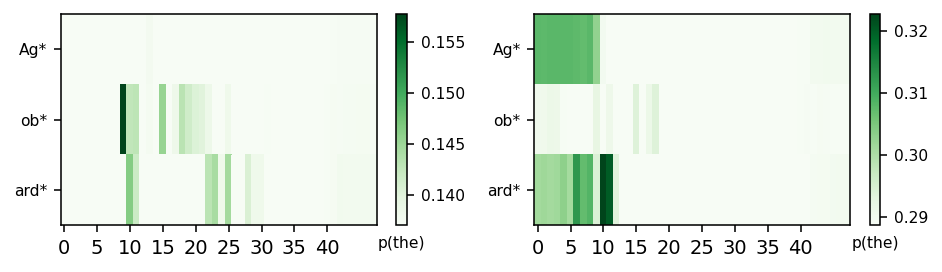

--------------------------------------------------------------------------
Example 1 (top candidate token) ✅
--------------------------------------------------------------------------


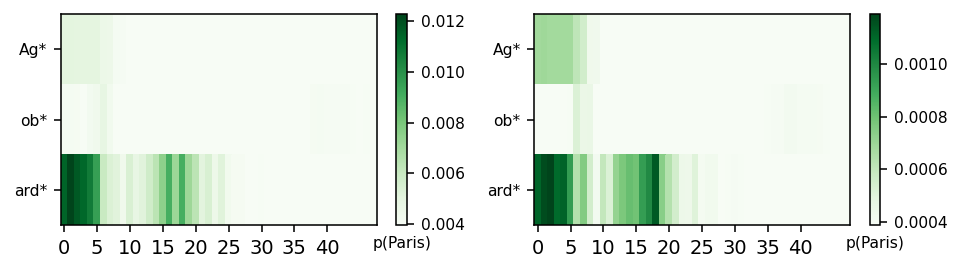

--------------------------------------------------------------------------
Example 2 (top candidate token) ❌
--------------------------------------------------------------------------


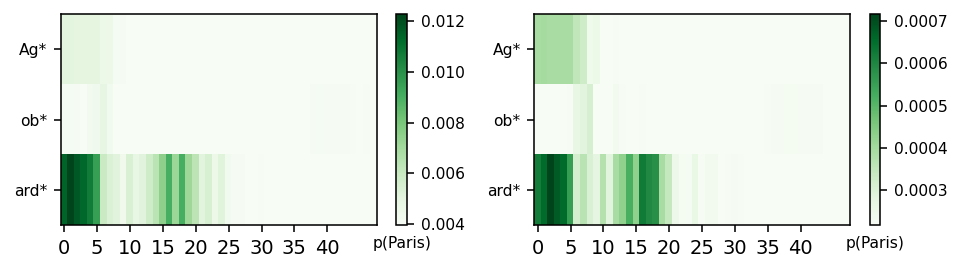

SAMPLE 3
--------------------------------------------------------------------------
Example 1 (top any token) ❌
--------------------------------------------------------------------------


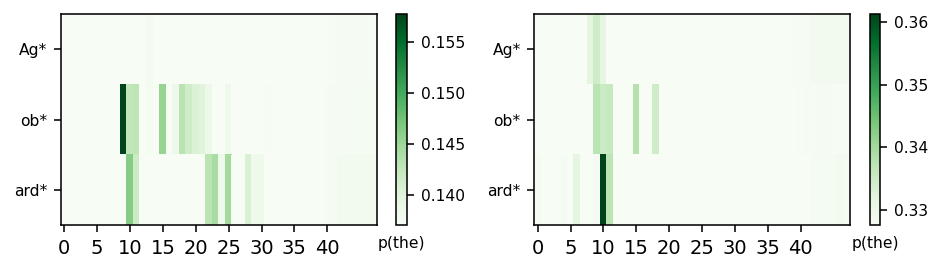

--------------------------------------------------------------------------
Example 2 (top any token) ✅
--------------------------------------------------------------------------


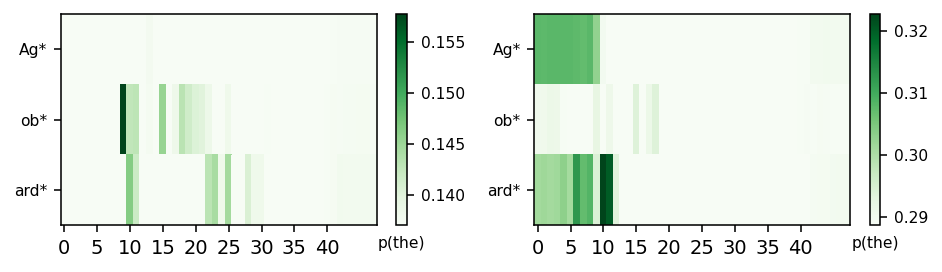

--------------------------------------------------------------------------
Example 1 (top candidate token) ❌
--------------------------------------------------------------------------


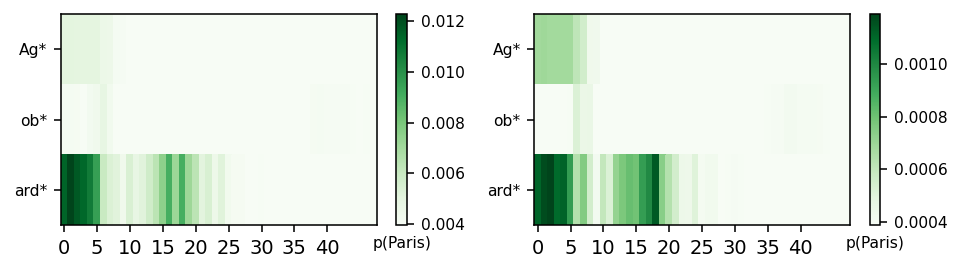

--------------------------------------------------------------------------
Example 2 (top candidate token) ✅
--------------------------------------------------------------------------


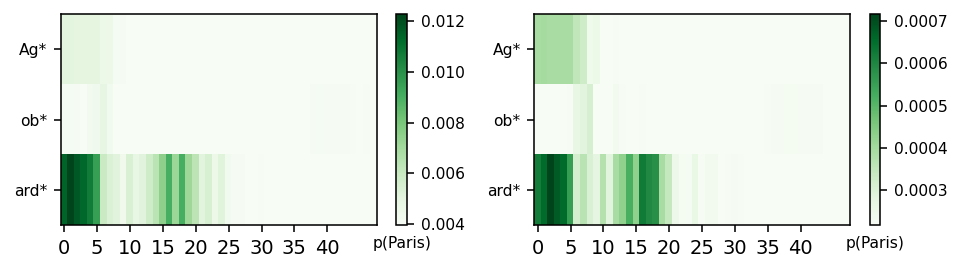

SAMPLE 4
--------------------------------------------------------------------------
Example 1 (top any token) ✅
--------------------------------------------------------------------------


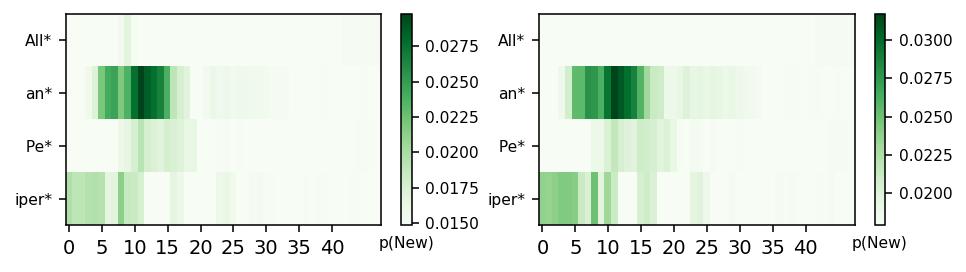

--------------------------------------------------------------------------
Example 2 (top any token) ❌
--------------------------------------------------------------------------


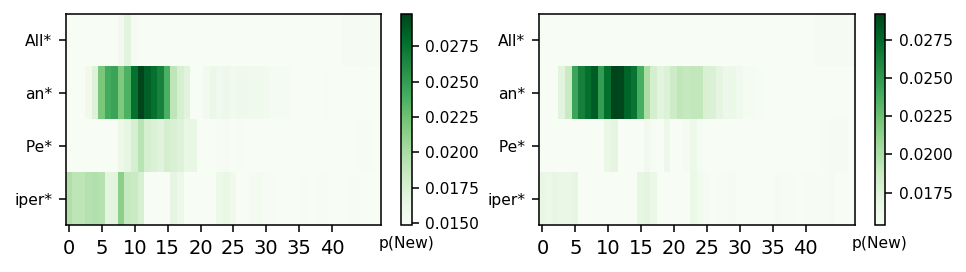

--------------------------------------------------------------------------
Example 1 (top candidate token) ✅
--------------------------------------------------------------------------


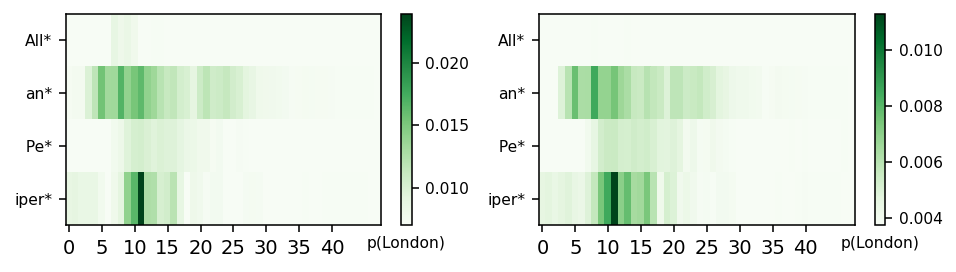

--------------------------------------------------------------------------
Example 2 (top candidate token) ❌
--------------------------------------------------------------------------


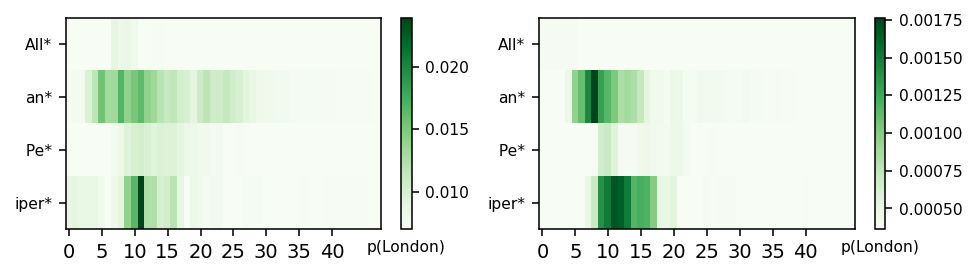

SAMPLE 5
--------------------------------------------------------------------------
Example 1 (top any token) ✅
--------------------------------------------------------------------------


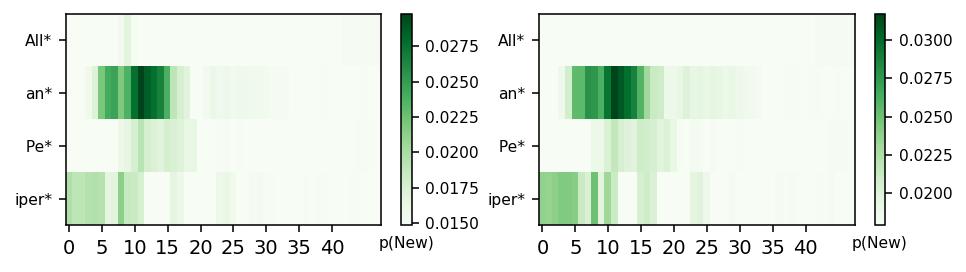

--------------------------------------------------------------------------
Example 2 (top any token) ❌
--------------------------------------------------------------------------


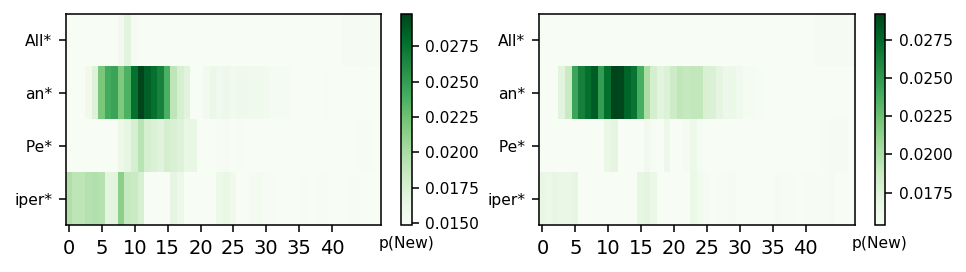

--------------------------------------------------------------------------
Example 1 (top candidate token) ✅
--------------------------------------------------------------------------


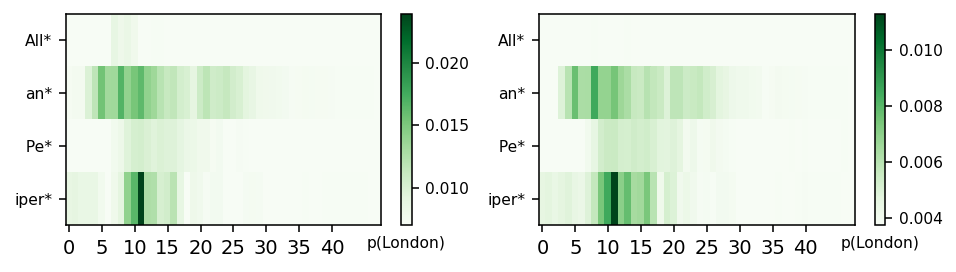

--------------------------------------------------------------------------
Example 2 (top candidate token) ❌
--------------------------------------------------------------------------


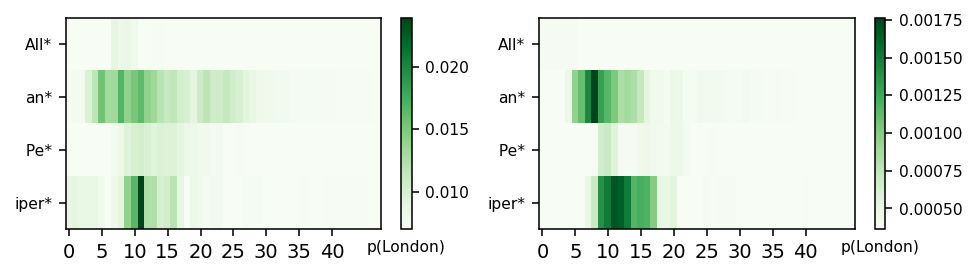

SAMPLE 6
--------------------------------------------------------------------------
Example 1 (top any token) ✅
--------------------------------------------------------------------------


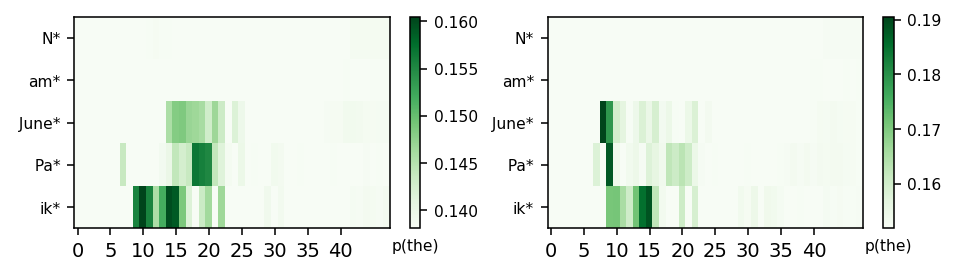

--------------------------------------------------------------------------
Example 2 (top any token) ❌
--------------------------------------------------------------------------


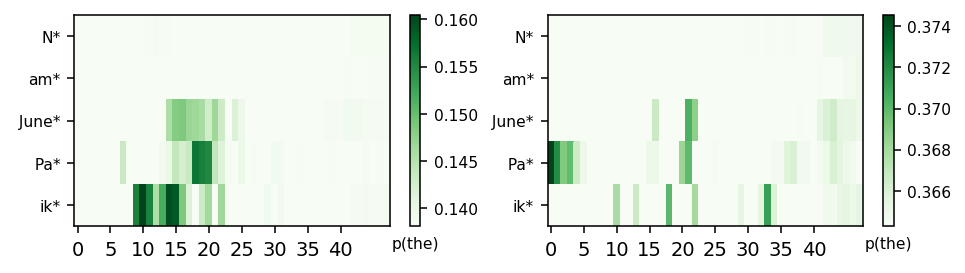

--------------------------------------------------------------------------
Example 1 (top candidate token) ✅
--------------------------------------------------------------------------


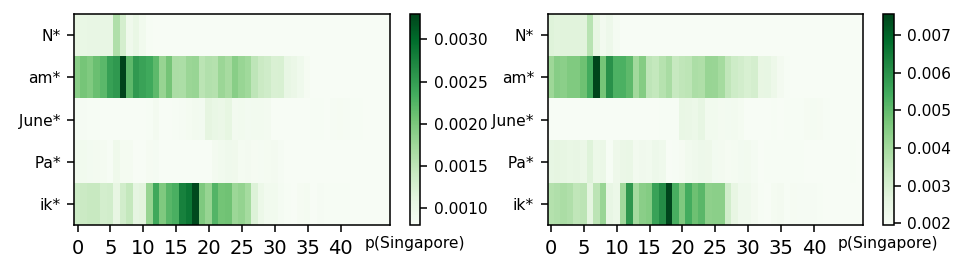

--------------------------------------------------------------------------
Example 2 (top candidate token) ❌
--------------------------------------------------------------------------


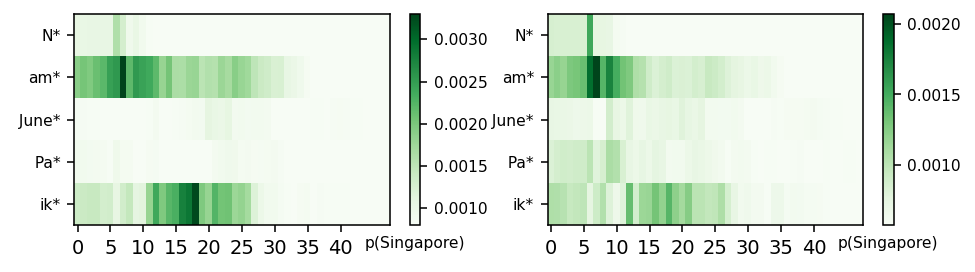

SAMPLE 7
--------------------------------------------------------------------------
Example 1 (top any token) ✅
--------------------------------------------------------------------------


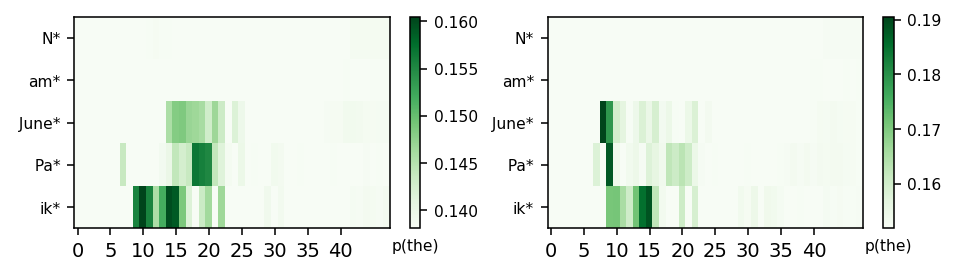

--------------------------------------------------------------------------
Example 2 (top any token) ❌
--------------------------------------------------------------------------


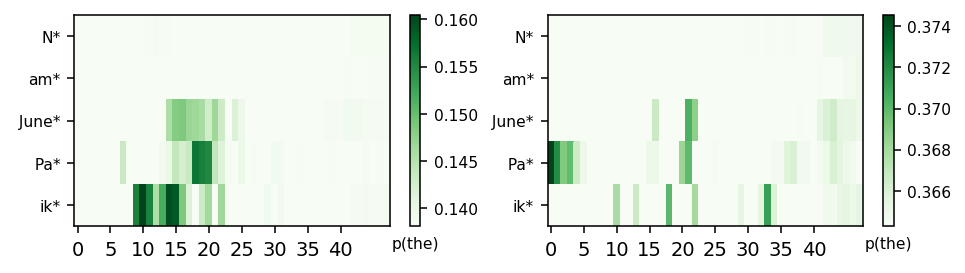

--------------------------------------------------------------------------
Example 1 (top candidate token) ✅
--------------------------------------------------------------------------


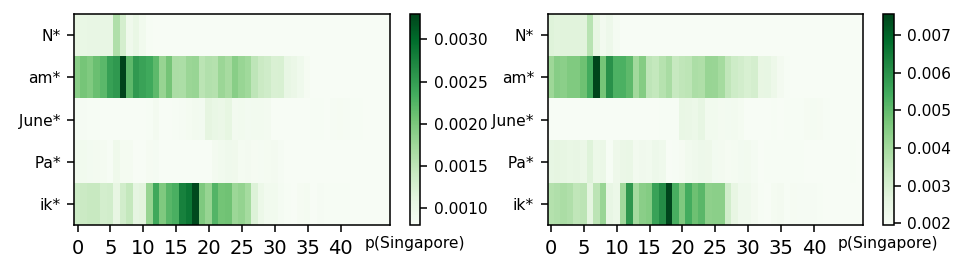

--------------------------------------------------------------------------
Example 2 (top candidate token) ❌
--------------------------------------------------------------------------


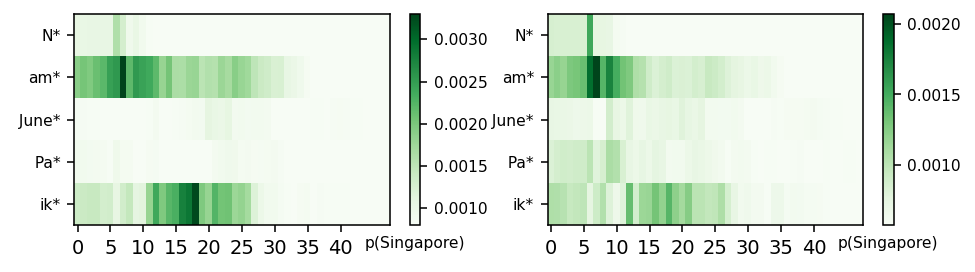

SAMPLE 8
--------------------------------------------------------------------------
Example 1 (top any token) ✅
--------------------------------------------------------------------------


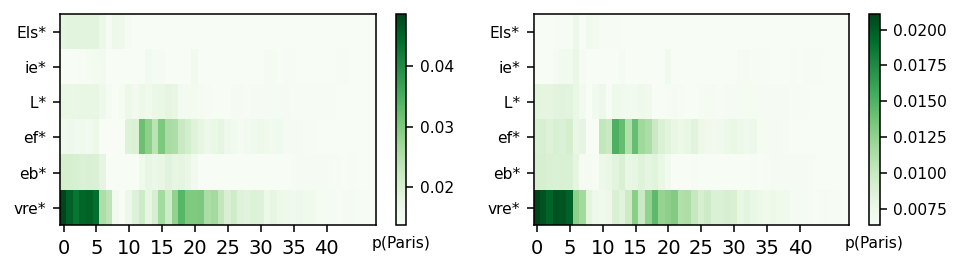

--------------------------------------------------------------------------
Example 2 (top any token) ❌
--------------------------------------------------------------------------


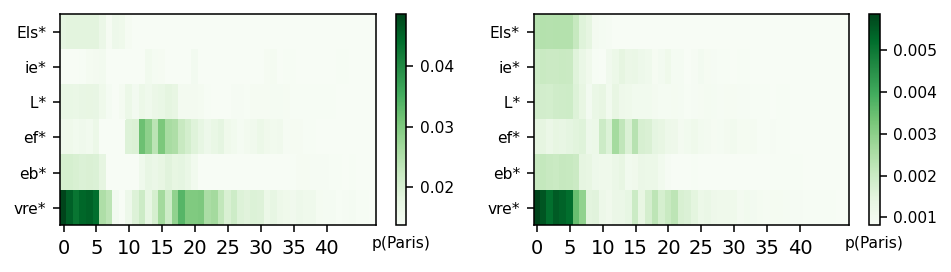

--------------------------------------------------------------------------
Example 1 (top candidate token) ✅
--------------------------------------------------------------------------


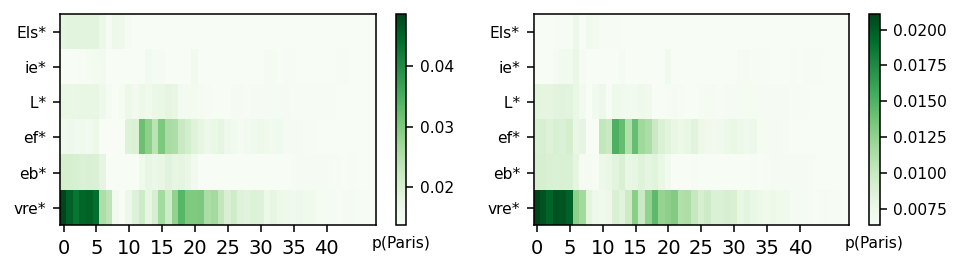

--------------------------------------------------------------------------
Example 2 (top candidate token) ❌
--------------------------------------------------------------------------


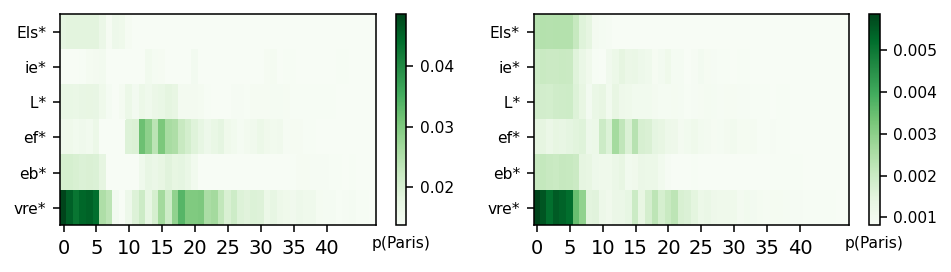

SAMPLE 9
--------------------------------------------------------------------------
Example 1 (top any token) ✅
--------------------------------------------------------------------------


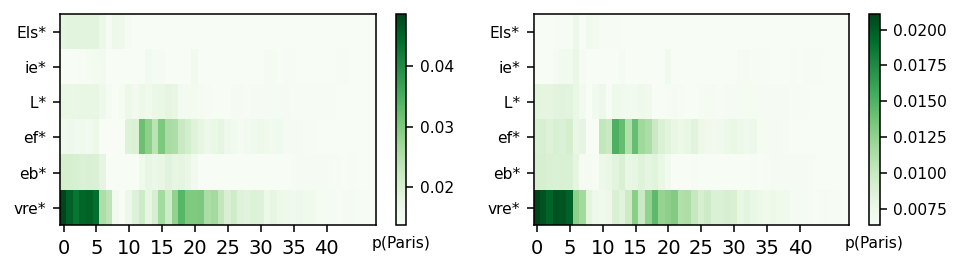

--------------------------------------------------------------------------
Example 2 (top any token) ❌
--------------------------------------------------------------------------


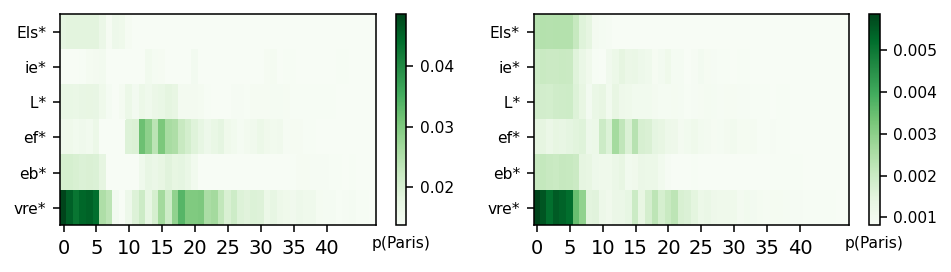

--------------------------------------------------------------------------
Example 1 (top candidate token) ✅
--------------------------------------------------------------------------


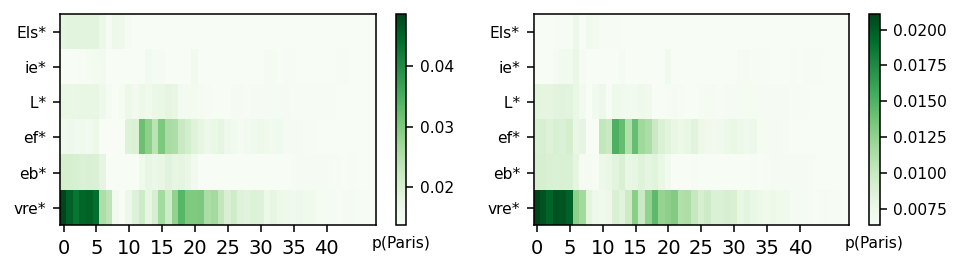

--------------------------------------------------------------------------
Example 2 (top candidate token) ❌
--------------------------------------------------------------------------


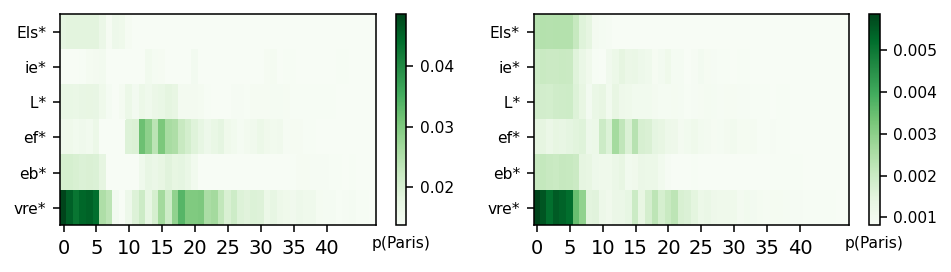

SAMPLE 10
--------------------------------------------------------------------------
Example 1 (top any token) ❌
--------------------------------------------------------------------------


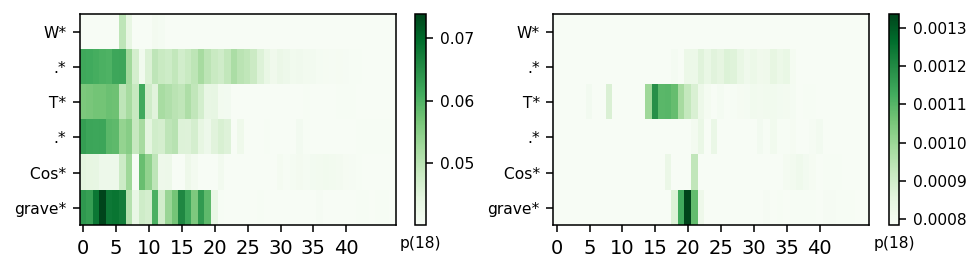

--------------------------------------------------------------------------
Example 2 (top any token) ✅
--------------------------------------------------------------------------


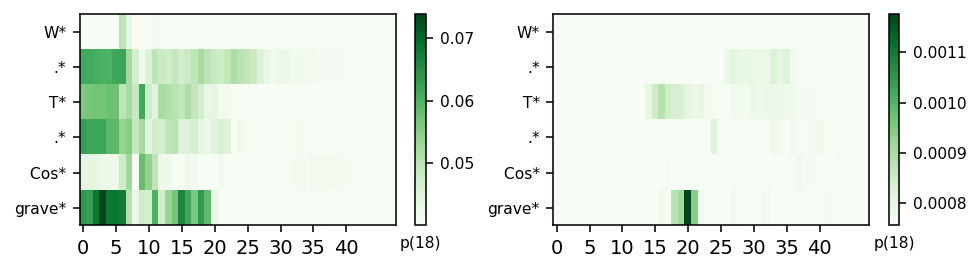

--------------------------------------------------------------------------
Example 1 (top candidate token) ❌
--------------------------------------------------------------------------


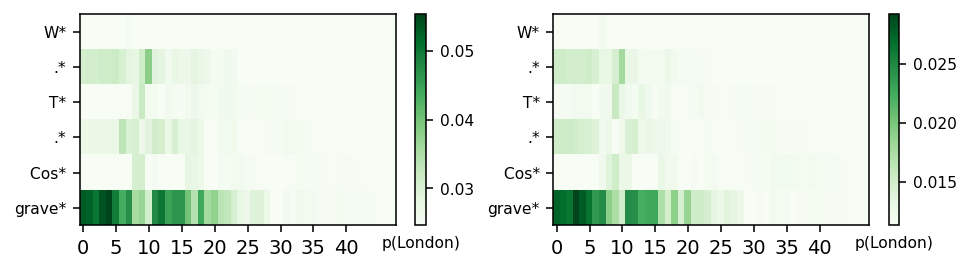

--------------------------------------------------------------------------
Example 2 (top candidate token) ✅
--------------------------------------------------------------------------


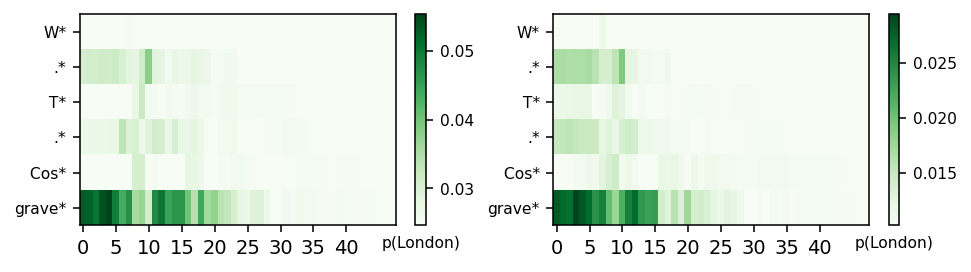

SAMPLE 11
--------------------------------------------------------------------------
Example 1 (top any token) ✅
--------------------------------------------------------------------------


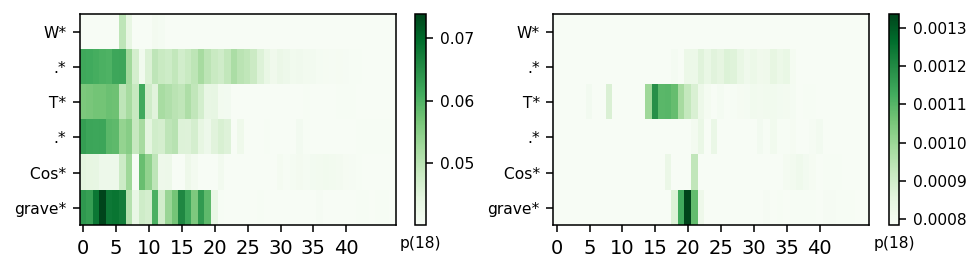

--------------------------------------------------------------------------
Example 2 (top any token) ❌
--------------------------------------------------------------------------


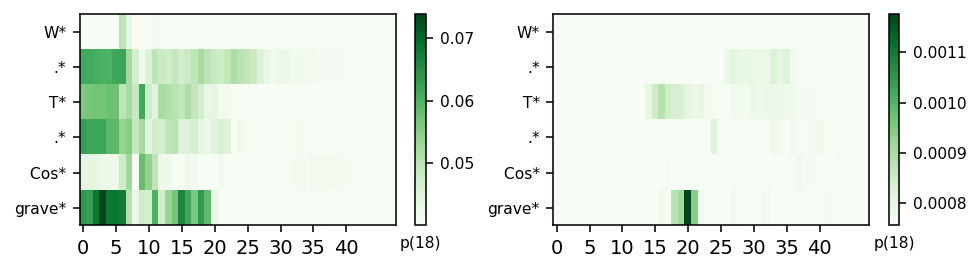

--------------------------------------------------------------------------
Example 1 (top candidate token) ✅
--------------------------------------------------------------------------


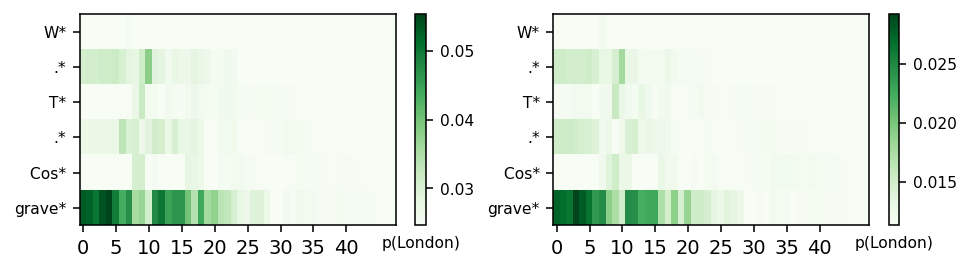

--------------------------------------------------------------------------
Example 2 (top candidate token) ❌
--------------------------------------------------------------------------


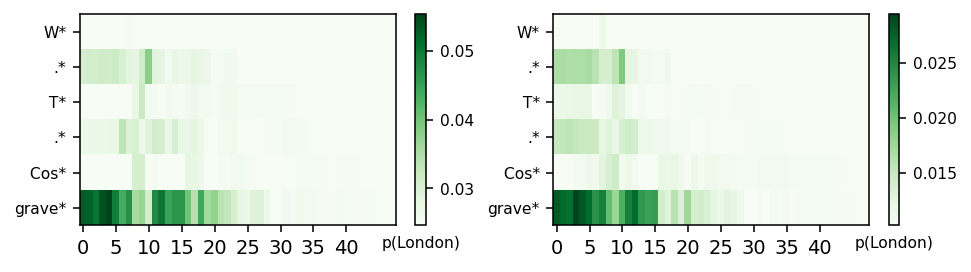

SAMPLE 12
--------------------------------------------------------------------------
Example 1 (top any token) ❌
--------------------------------------------------------------------------


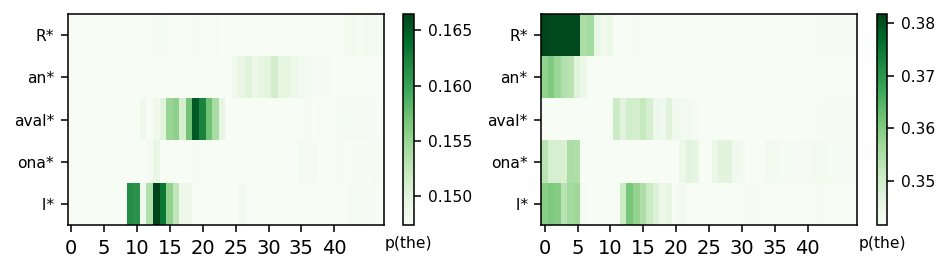

--------------------------------------------------------------------------
Example 2 (top any token) ✅
--------------------------------------------------------------------------


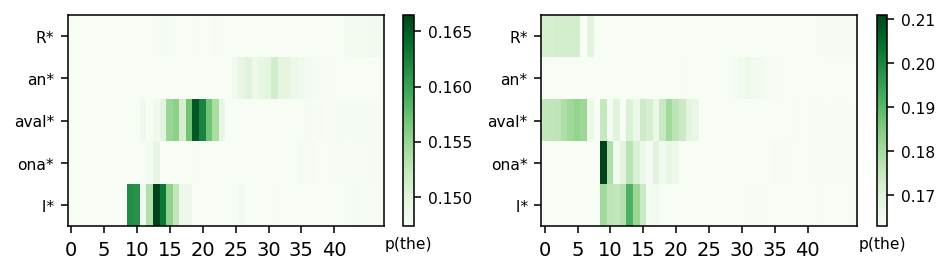

--------------------------------------------------------------------------
Example 1 (top candidate token) ❌
--------------------------------------------------------------------------


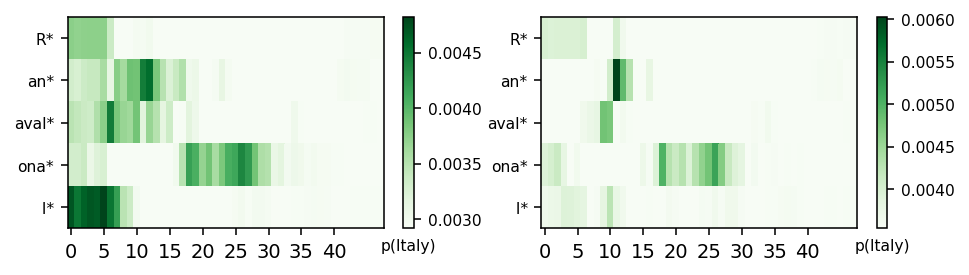

--------------------------------------------------------------------------
Example 2 (top candidate token) ✅
--------------------------------------------------------------------------


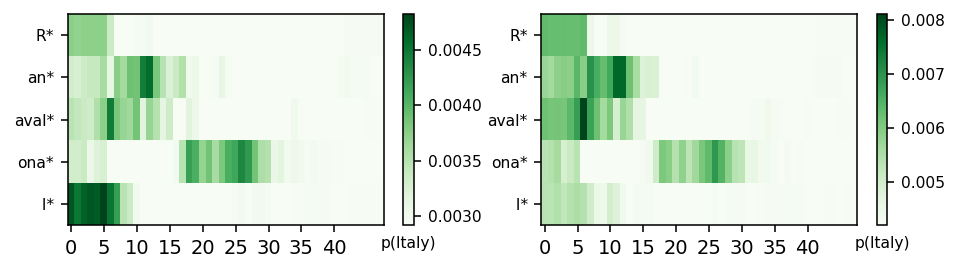

SAMPLE 13
--------------------------------------------------------------------------
Example 1 (top any token) ❌
--------------------------------------------------------------------------


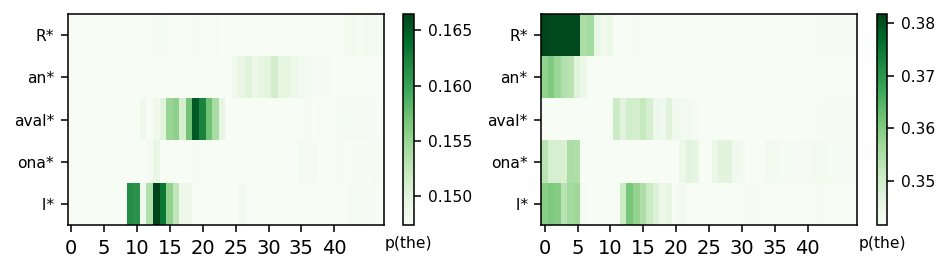

--------------------------------------------------------------------------
Example 2 (top any token) ✅
--------------------------------------------------------------------------


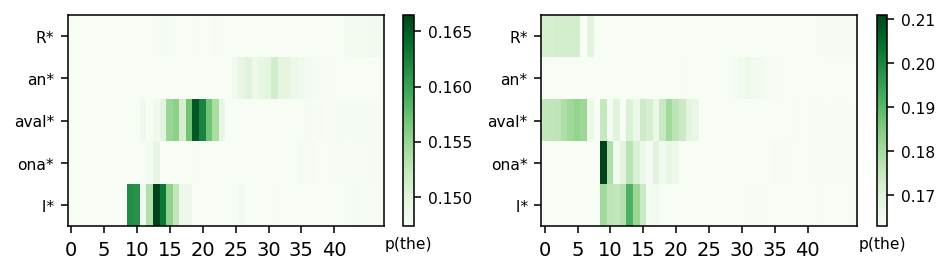

--------------------------------------------------------------------------
Example 1 (top candidate token) ❌
--------------------------------------------------------------------------


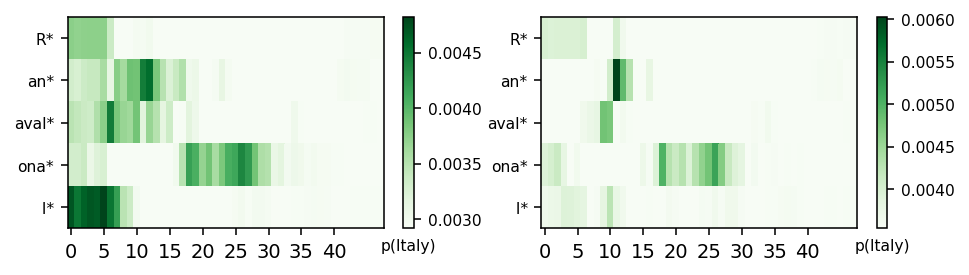

--------------------------------------------------------------------------
Example 2 (top candidate token) ✅
--------------------------------------------------------------------------


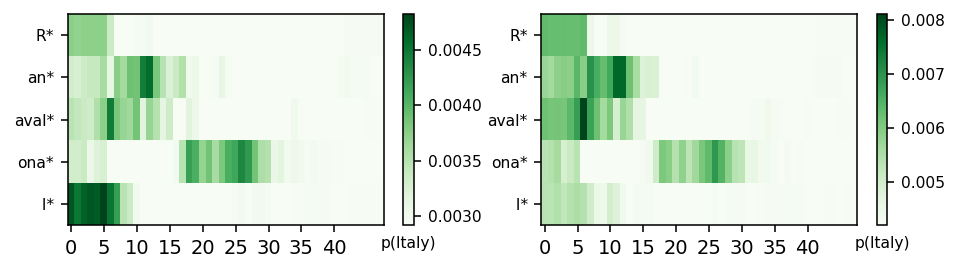

SAMPLE 14
--------------------------------------------------------------------------
Example 1 (top any token) ✅
--------------------------------------------------------------------------


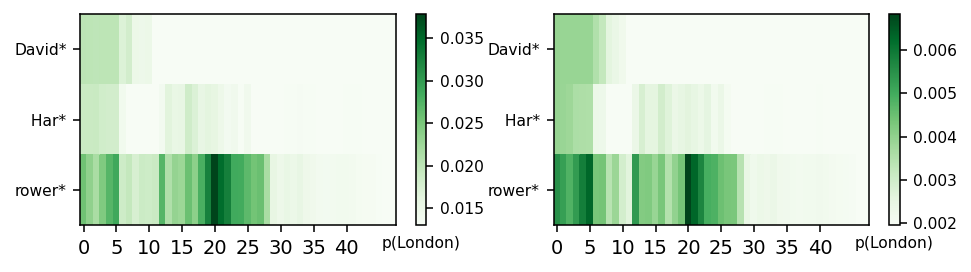

--------------------------------------------------------------------------
Example 2 (top any token) ❌
--------------------------------------------------------------------------


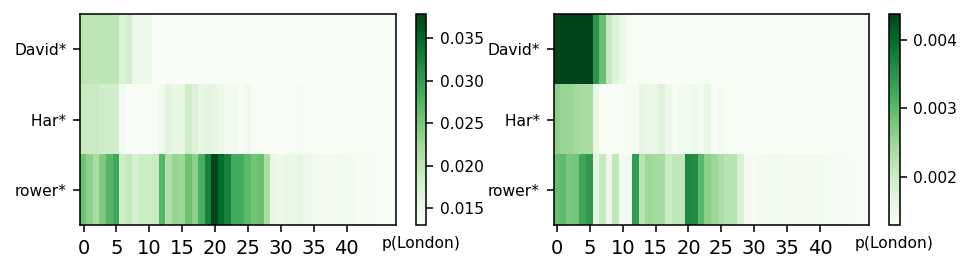

--------------------------------------------------------------------------
Example 1 (top candidate token) ✅
--------------------------------------------------------------------------


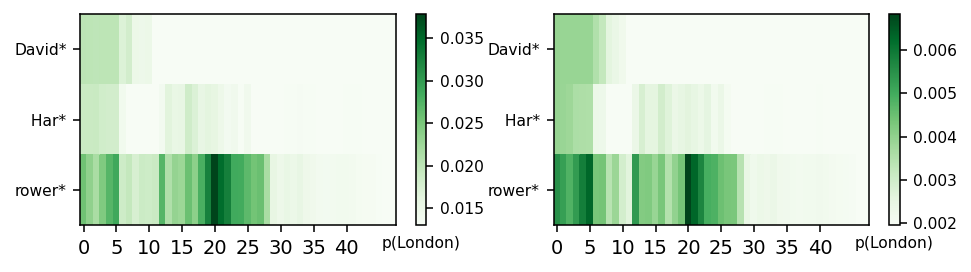

--------------------------------------------------------------------------
Example 2 (top candidate token) ❌
--------------------------------------------------------------------------


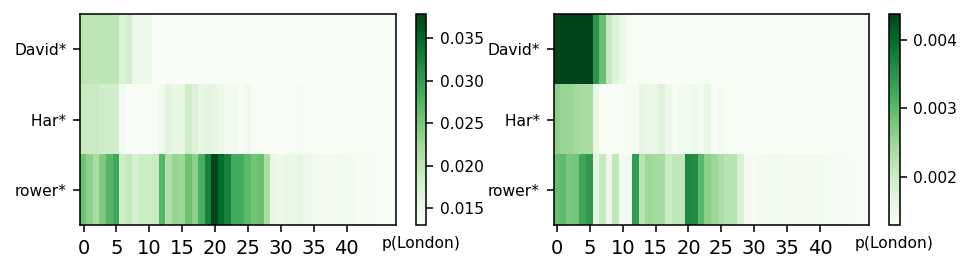

SAMPLE 15
--------------------------------------------------------------------------
Example 1 (top any token) ✅
--------------------------------------------------------------------------


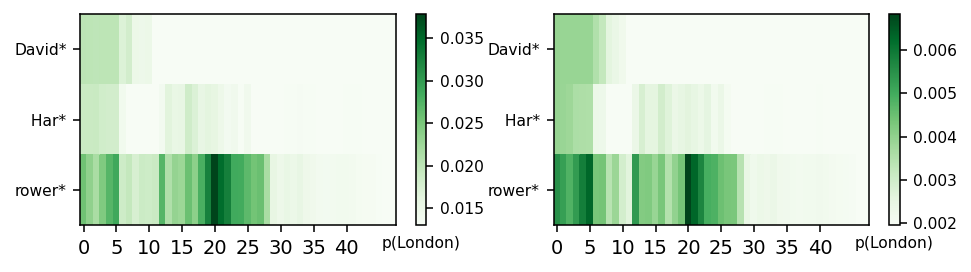

--------------------------------------------------------------------------
Example 2 (top any token) ❌
--------------------------------------------------------------------------


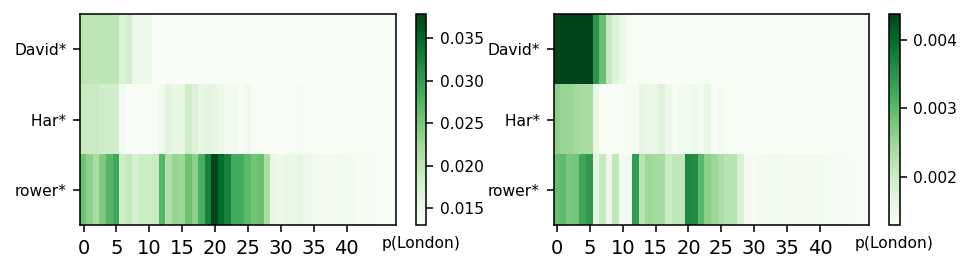

--------------------------------------------------------------------------
Example 1 (top candidate token) ✅
--------------------------------------------------------------------------


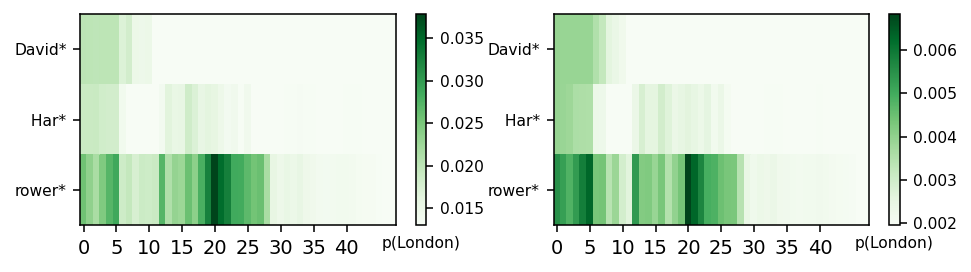

--------------------------------------------------------------------------
Example 2 (top candidate token) ❌
--------------------------------------------------------------------------


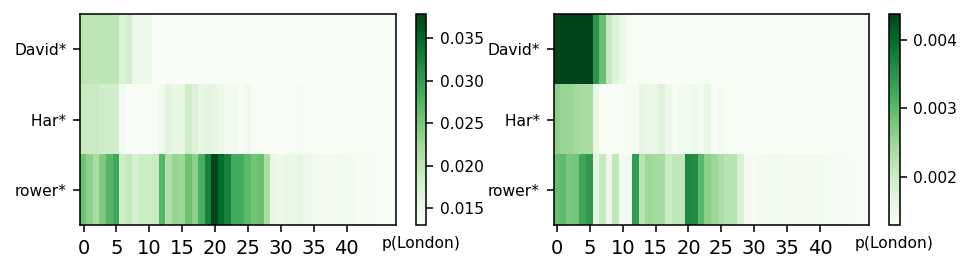

SAMPLE 16
--------------------------------------------------------------------------
Example 1 (top any token) ❌
--------------------------------------------------------------------------


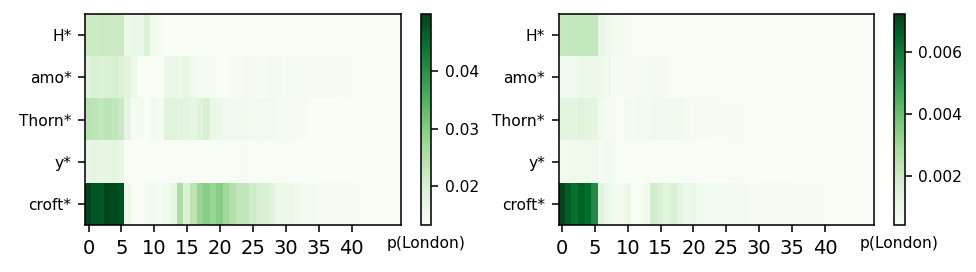

--------------------------------------------------------------------------
Example 2 (top any token) ✅
--------------------------------------------------------------------------


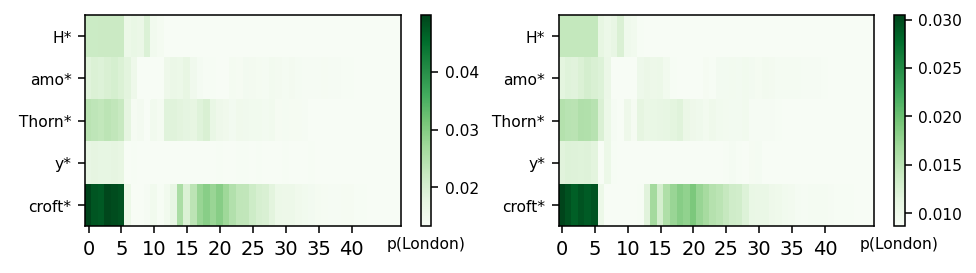

--------------------------------------------------------------------------
Example 1 (top candidate token) ❌
--------------------------------------------------------------------------


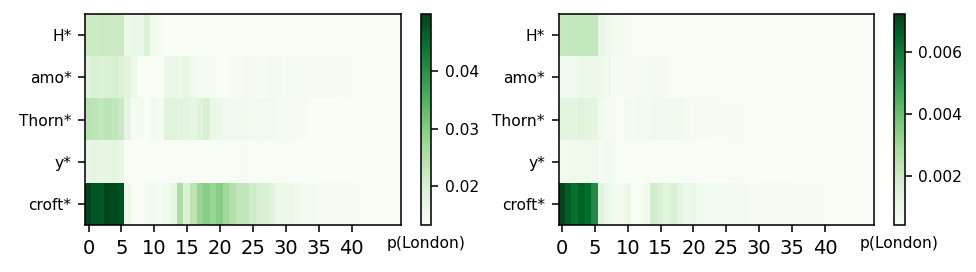

--------------------------------------------------------------------------
Example 2 (top candidate token) ✅
--------------------------------------------------------------------------


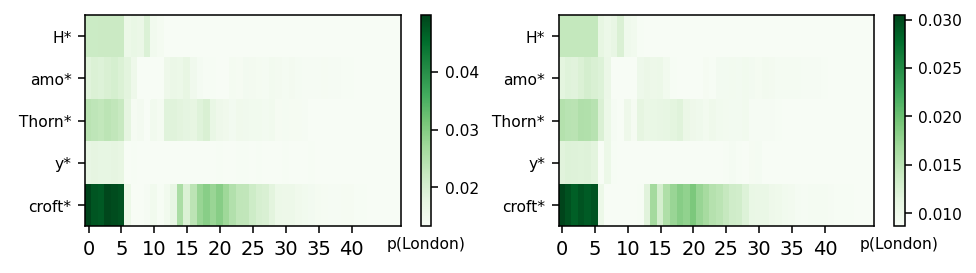

SAMPLE 17
--------------------------------------------------------------------------
Example 1 (top any token) ❌
--------------------------------------------------------------------------


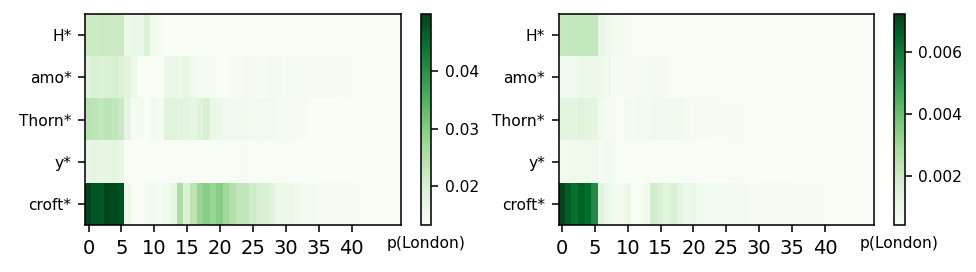

--------------------------------------------------------------------------
Example 2 (top any token) ✅
--------------------------------------------------------------------------


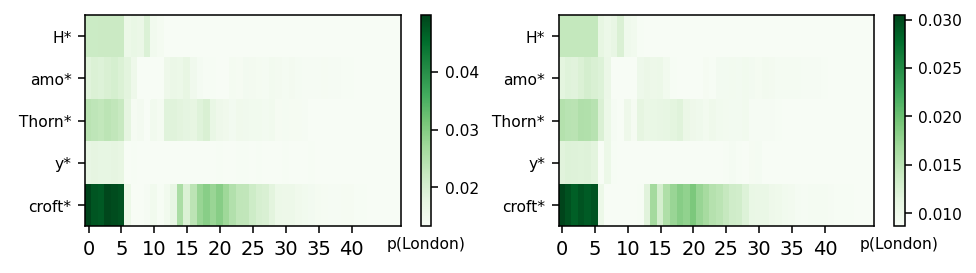

--------------------------------------------------------------------------
Example 1 (top candidate token) ❌
--------------------------------------------------------------------------


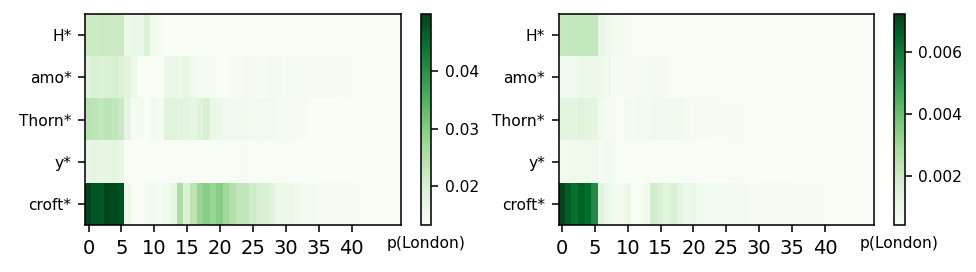

--------------------------------------------------------------------------
Example 2 (top candidate token) ✅
--------------------------------------------------------------------------


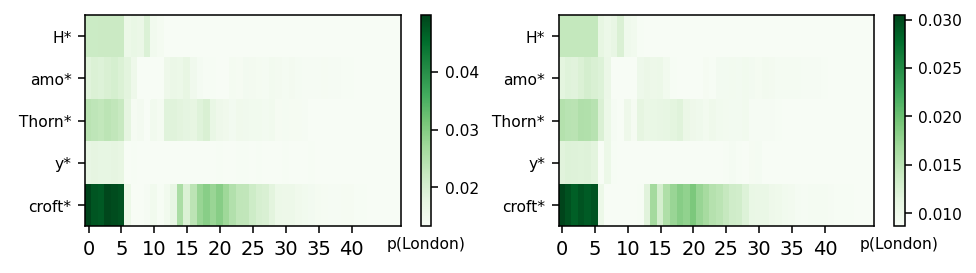

SAMPLE 18
--------------------------------------------------------------------------
Example 1 (top any token) ✅
--------------------------------------------------------------------------


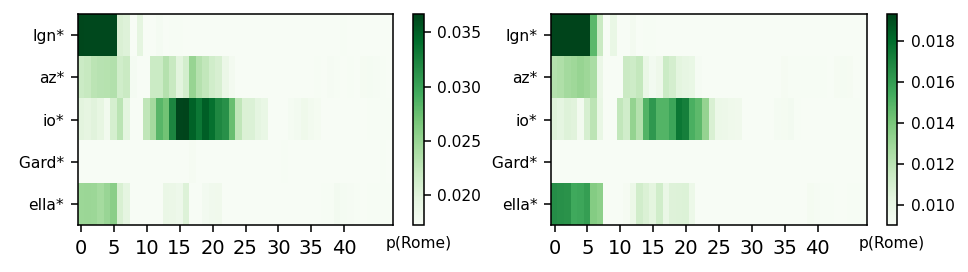

--------------------------------------------------------------------------
Example 2 (top any token) ❌
--------------------------------------------------------------------------


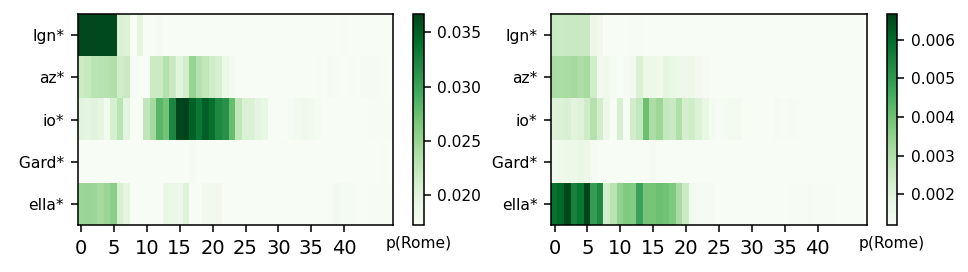

--------------------------------------------------------------------------
Example 1 (top candidate token) ✅
--------------------------------------------------------------------------


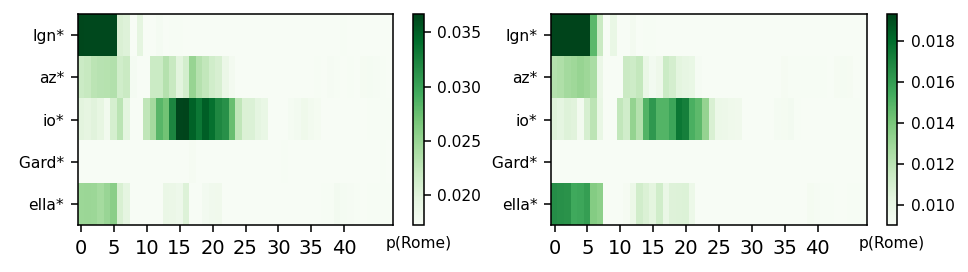

--------------------------------------------------------------------------
Example 2 (top candidate token) ❌
--------------------------------------------------------------------------


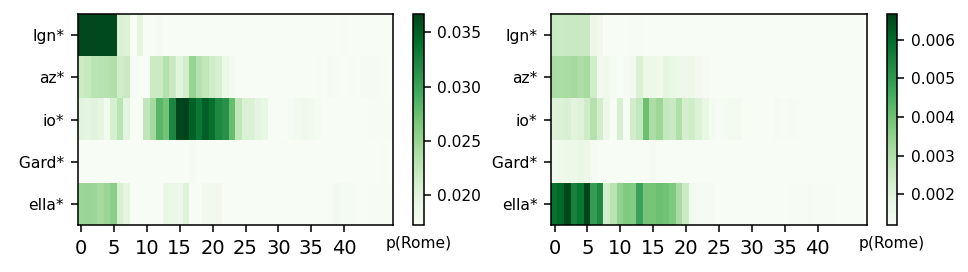

SAMPLE 19
--------------------------------------------------------------------------
Example 1 (top any token) ✅
--------------------------------------------------------------------------


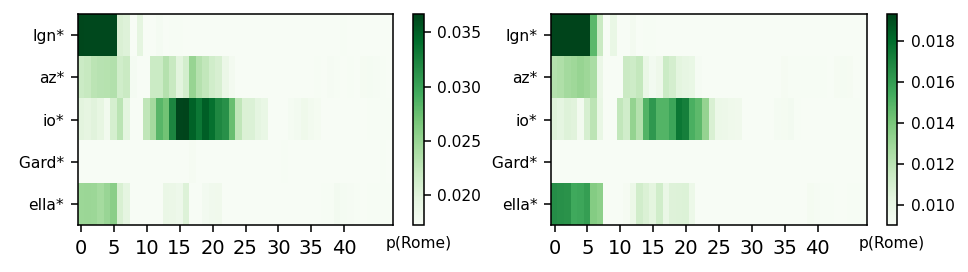

--------------------------------------------------------------------------
Example 2 (top any token) ❌
--------------------------------------------------------------------------


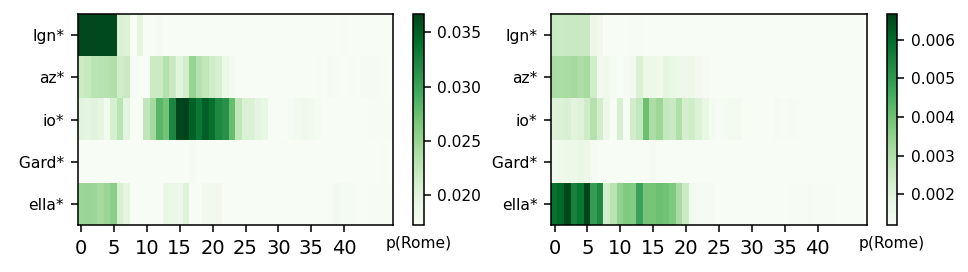

--------------------------------------------------------------------------
Example 1 (top candidate token) ✅
--------------------------------------------------------------------------


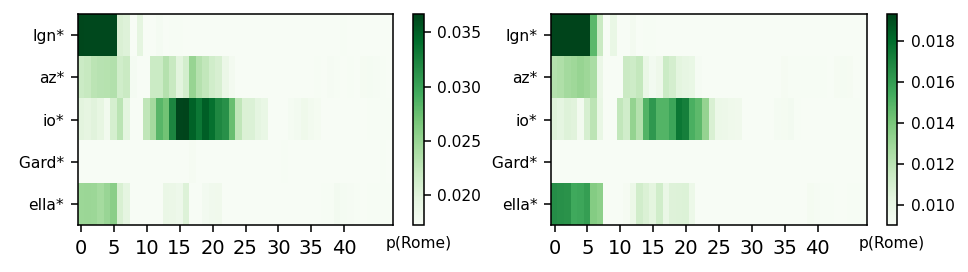

--------------------------------------------------------------------------
Example 2 (top candidate token) ❌
--------------------------------------------------------------------------


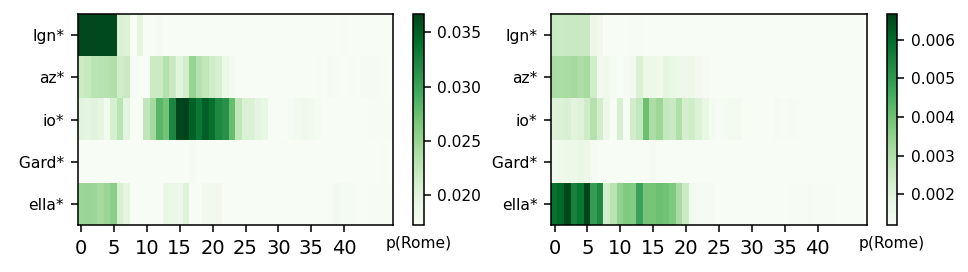

In [43]:
for ix, row in annotated_data.iterrows():
    print("=======================================================================================================")
    print(f"SAMPLE {ix}")
    token_ix = 0 #always measure for top predicted token (or candidate, TODO)
    answer = queries.loc[row.lama_ix]["top10_tokens"][token_ix]
    results_lama = np.load(os.path.join(results_folder, f"cases/{row.lama_ix}_any_mlp.npz"), allow_pickle=True)
    
    cand_answer = queries.loc[row.lama_ix]["candidate_prediction"]
    cand_token_ix = None
    try:
        cand_token_ix = queries.loc[row.lama_ix]["top10_tokens"].index(cand_answer)
    except: 
        print("Warning: Candidate prediciton not in top 10 tokens for the sample below.")
        print(queries.loc[row.lama_ix])
    
    token_vals = {"any": (token_ix, answer), "candidate": (cand_token_ix, cand_answer)}
    for token_key, token_val in token_vals.items():
        similarity_string = ["❌", "❌"]
        similarity_string[row.example_more_similar-1] = "✅"
        for ix, sample_ix in enumerate([row.sample_ix_1, row.sample_ix_2]):
            print("--------------------------------------------------------------------------")
            print(f"Example {ix+1} (top {token_key} token) {similarity_string[ix]}")
            print("--------------------------------------------------------------------------")
            results = np.load(os.path.join(results_folder, f"cases/{sample_ix}_any_mlp.npz"), allow_pickle=True)
            
            #plot_te_heatmap(results, token_val[0], token_val[1])
            fig, axs = plt.subplots(1, 2, figsize=(8, 2), dpi=140)
            plot_trace_heatmap_for_token_ix(results_lama, token_val[0], True, axs[0])
            plot_trace_heatmap_for_token_ix(results, token_val[0], True, axs[1])
            plt.show()

## Split the annotations into validation and test set

Concatenate annotations and check for duplicates

In [8]:
lh_annotations = pd.read_csv("/cephyr/users/lovhag/Alvis/projects/rome/data/similarity/P19_annotated_LH.csv")
ds_annotations = pd.read_csv("/cephyr/users/lovhag/Alvis/projects/rome/data/similarity/P19_annotated_DS.csv")

tot_annotations = pd.concat((lh_annotations, ds_annotations), ignore_index=True)
tot_annotations[tot_annotations.drop("example_more_similar", axis=1).duplicated(keep=False)]

,lama_ix,sample_ix_1,sample_ix_2,token_type,example_more_similar
188,385,387,391,any,2
189,385,387,391,candidate,1
384,385,387,391,any,2
385,385,387,391,candidate,1


In [19]:
tot_annotations = tot_annotations.drop_duplicates(ignore_index=True)
val_annotations = tot_annotations.sample(frac=0.5, replace=False, random_state=42, axis=0).sort_index()
val_annotations

,lama_ix,sample_ix_1,sample_ix_2,token_type,example_more_similar
0,294,295,297,any,1
3,4844,4845,4848,candidate,1
5,4529,4531,4534,candidate,1
6,2366,2370,2371,any,1
7,2366,2370,2371,candidate,1
...,...,...,...,...,...
389,651,652,653,candidate,3
392,1225,1231,1229,any,2
393,1225,1231,1229,candidate,2
394,266,267,272,any,2


In [21]:
test_annotations = tot_annotations[~tot_annotations.index.isin(val_annotations.index)]
test_annotations

,lama_ix,sample_ix_1,sample_ix_2,token_type,example_more_similar
1,294,295,297,candidate,1
2,4844,4845,4848,any,2
4,4529,4531,4534,any,1
8,5054,5058,5057,any,1
11,1862,1868,1865,candidate,0
...,...,...,...,...,...
388,651,652,653,any,0
390,133,136,134,any,2
391,133,136,134,candidate,2
395,266,267,272,candidate,1


In [22]:
val_annotations.to_csv("/cephyr/users/lovhag/Alvis/projects/rome/data/similarity/P19_annotated_val.csv", index=False)
test_annotations.to_csv("/cephyr/users/lovhag/Alvis/projects/rome/data/similarity/P19_annotated_test.csv", index=False)